# Detecting and Categorizing Brick Kilns from Satellite Imagery
> * 🔬 Data Science
* 🥠 Deep Learning and Object Detection

## Table of Contents
* [Introduction](#Introduction)
* [Export Training Data](#Export-Training-Data)
* [Train the Model](#Train-the-Model)
 * [Load an SingleShotDetector model](#Load-an-SingleShotDetector-model)
 * [Find an Optimal Learning Rate](#Find-an-Optimal-Learning-Rate)
 * [Fit the model](#Fit-the-model)
 * [Save the model](#Save-the-model)
 * [Visualize results in validation set](#Visualize-results-in-validation-set)
* [Deploy Model and Detect Brick Kilns](#Deploy-Model-and-Detect-Brick-Kilns)
* [Conclusion](#Conclusion)
* [References](#References)

## Introduction
With rapid urbanization, demand for bricks is increasing. Brick production is a very large, traditional industry in many parts of Asia. The brick sector in India, although unorganized, is huge in size. India is the second largest producer of bricks in the world — China dominates with 54% share[1].

Brick kilns are a major contributor in air pollution in North India. Production of bricks leads to emission of harmful gases and particulate matter, including toxic elements such as carbon monoxides and oxides of Sulphur (SOx). Exposure to these emissions is extremely hazardous to health and can impact physical and mental growth of children.

Most of the brick kilns in India are of the Fixed Chimney Bull’s Trench Kilns (FCBTK) type. However, there is a newer design of kilns, known as the Zigzag kiln, which is more energy efficient and causes much lesser air pollution. The older design kilns can be converted into the Zigzag design leading to increase in efficiency — however, there is an cost involved in retrofitting and this is leading to slower adoption of this technology.

Central Pollution Control Board (CPCB) issued a directive in June 2017 mandating brick kilns across India to convert to the less polluting zigzag setting design. This directive clearly stated that brick kilns operating without permission would be shut down [2]. Despite the directive, there are many brick kilns that are still operating without following the prescribed design norms.

In this sample, we will use Deep Learning on ArcGIS Platform to detect the location and design category of all brick kilns around Delhi NCR area in India to find the brick kilns which are not following the directions from CPCB. Deep Learning is a tried and tested method for object detection on satellite imagery and high level steps that we will follow are:

* Collect Data using ArcGIS Pro
* Train Deep Learning model using arcgis.learn
* Deploy the trained model using ArcGIS Pro


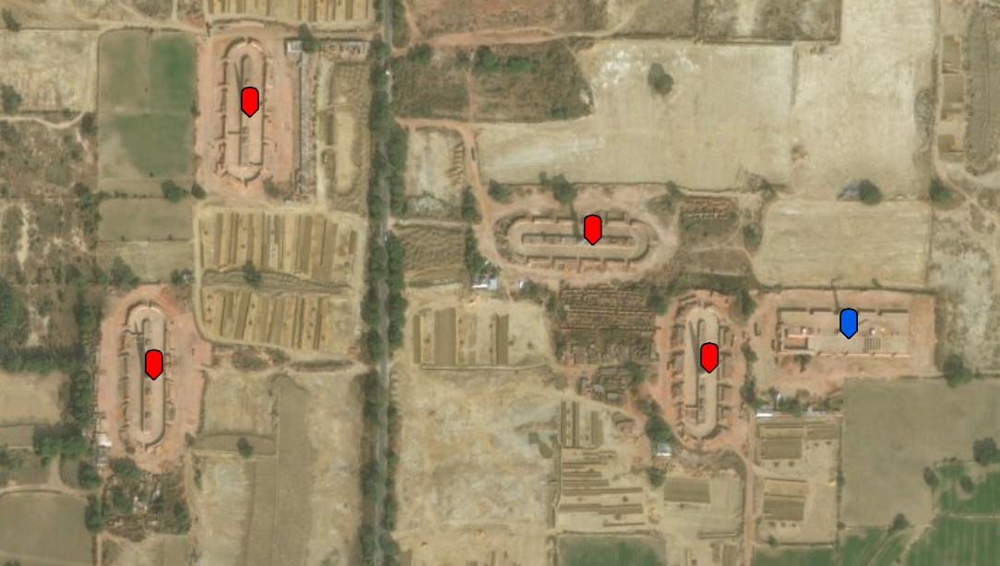

<center>A subset of training data.</center>

On the above image we can see **Zig-Zag shaped brick kilns** (Blue Marker) and **oval shaped brick kilns** (Red Marker).
  

<br>
  
<br>

## Collecting training data

We will be using ArcGIS Pro to mark locations of the two types of brick kilns on a high resolution satellite imagery. We will create a point feature class representing locations of brick kiln and set an attribute field indicating it’s type (0=FCBTK/Oval design. 1=Zigzag/Rectangular). To simplify our job we will only mark the center locations of the kilns — we’re only interested in their location and not the precise size.


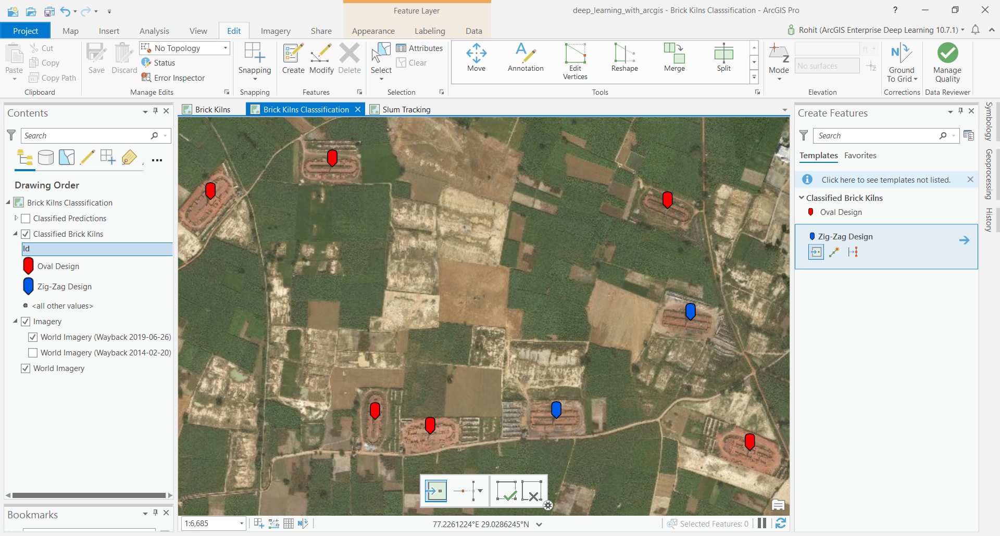

## Export Training Data

In [1]:
from arcgis.gis import GIS
gis = GIS('home')

The item below is a feature layer of Brick kilns for the year 2019.

<Item title:"classified_brick_kilns2019" type:Feature Layer Collection owner:api_data_owner>
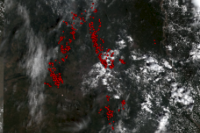

In [2]:
labelled_data = gis.content.get('67c22a5c89b946f781c519ba2399edeb')
labelled_data

Training data can be exported by using the 'Export Training Data For Deep Learning' tool available in [ArcGIS Pro](https://pro.arcgis.com/en/pro-app/tool-reference/image-analyst/export-training-data-for-deep-learning.htm) as well as [ArcGIS Enterprise](https://developers.arcgis.com/rest/services-reference/export-training-data-for-deep-learning.htm).

- **Input Raster**: Imagery 2019
- **Input Feature Class Or Classified Raster**: brick kilns layer
- **Class Value Field**: field containing 0 for oval shaped brick kiln and 1 for zig-zag shaped brick kiln
- **Buffer Radius**: 75 Meter
- **Tile Size X** & **Tile Size Y**: 448
- **Meta Data Format**: 'Pascal Visual Object Classes' as we are training an Object Detection Model which in this case is `SingleShotDetector`.
- In 'Environments' tab set an optimum 'Cell Size' which can accommodate two three brick kilns in a single tile. For this sample we will be setting tile size to **448 px** and export chips using different values of the Cell Size parameter. This trick helps us us to augment the training data by creating more training chips from the same amount of labelled data. Additionally, it will help our model to learn create better-fitting bounding boxes for the brick kilns. If we fed the model data with only one cell size, it would always predict the same size (roughly 150m) for each kiln as that’s all the data it would have seen.

Tool Reference for [ArcGIS Pro](https://pro.arcgis.com/en/pro-app/tool-reference/image-analyst/export-training-data-for-deep-learning.htm) and [ArcGIS Enterprise](https://developers.arcgis.com/rest/services-reference/export-training-data-for-deep-learning.htm)

<img width=700 height=500 src="data:image/PNG; base64, iVBORw0KGgoAAAANSUhEUgAAA+QAAALSCAYAAABUCRsVAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAAEnQAABJ0Ad5mH3gAAP+lSURBVHhe7P0HfBTbmt4Ln/vd+322x/a1PWPPeI499iR7PDOeYPvztcfjmTlz0k6wyRkECBQBAQpIAmUQQRJBZAUQAiRAEhJIIAECBSSCUM45q5W6pVZndSs8932ru6WWaOJhb9h7r9q//4+tqlVVq1ZVr+d91lq16kdPnz6FQCAQCAQCgUAgEAgEgm+XH+Edlv/LrwK/c6AKvxcuEAgEAoHgY/HvSIv/zf5K/H/3VuLrY8WormtEa1s7CsqbUFAhEAgEAoHgo1DeiPqmVnR2dFgc9JuXdzLkbMbbSPCvP25EarFAIBAIBIJvmxtFjXhY3gz9UBcWxtYhNrcWHS2NyKdA4Ee7K/Ajb4FAIBAIBB+FHWXIqR9Cb2e7xUG/eXknQ/57B6uQWtSAH20vw488ywUCgUAgEHzb7CjFV7EtgG4Yn5+twtn7NWhvbpBa5jkY+D98BQKBQCAQfAx+tKsMDxoV6Ov6pgx5OBny4kYpILCXAYFAIBAIBN8sP/Isw4KLrYBeLhnyMzlVaG2sE4ZcIBAIBIKPjDDkAoFAIBB8z5lvyE9nV6GloRb55WTIPcrwo90CgUAgEAg+Cu4vkNPwLRnyH3FQIBAIBAKB4NuFDPlXNob81N1KNJMhb2xpRWmXEuU9KoFAIBAIBB+D7jHIVVq0t7dZHPSbl3cy5D8Oq0B3VycGxnQYUukFAoFAIBB8BEY0BuhHB+f0kLe3tWHCaMDUhFEgEAgEAsFHQm/Qo400+W2XdzLkvx1aAVlPFwzjBowbxwUCgUAgEHwkdBZDfiq7Es31NZL46/R60uhxgUAgEAgEHwnW4m/ckOsNBrsnFwgEAoFA8O0gDLlAIBAIBHOZnJqyONdXL/b2+5AIQy4QCAQCwTfIuNFoUcVXL6aJCbv7fkishvzMvWq0NdULQy4QCASCHzQTpL2lZWW4c+cOsnNy7JJz794btZI1nBejyfTSNl7Hy+t0XhhygUAgEAi+IViI+wcGEBcXh4SEBLvExMSguqZGaqW3dwwrU9PTmJictLuN933T/mzIvzhfg4CEe3iQnSUM+Udk3MSNNBSkmexvFwgEAsE3Dy+nTp3Chg0bsGXLFrs4OTlBo9Xa3Z9hXW5tbcXVpCRJ7211mv9/YHAQV5OT0UJpXqXhn5QhH7eDvXSCt4N7ZSYnjDAa7W8XCAQCwTcLiy+LrIODgyTq9li/fj3u3b8v6aa9YzDjZOw5aLj/4IHdVvaU1FQkJiZKpn3+NitSD/m5akSlP0PFi2dvbcitWjJ/EpoJYSbfC+OECYP1fVgU24QjDXqh0QKBQPCR4OX8+fOSFm/bts0uO3bseK0h58bw2tpaKe1J0ulhuVzSaYb//9Tp09K26upqTL5Coz8JQ24yGWEaN0Ch1kNuA/+tMdjfR/B6eAKfF7lN+J2jjYjvEq3wAoFA8DFgQW7v6ICLi8scgbdl69atePjoEaZJN+0dg+Ge9hMnTmDX7t0zptw6NI7NOAcMly9ffqMh/+xsFc4/qEVna9MbDTnriIHMuKyuD5+frMPvHyKO1OEPjtTid0Pqsa1oBIppE8nLy/sKXo1x0oS+0g78OLACLmV6mIQhFwgEgo8C6256ejoOHTqEY8eOvcTRo0cltDqd3f1nIK18RDq+a9cuREdHY2R0FKNKJaJPnpTWPXz4cCbdS/sSH9WQ6ylT00YD+ke0uJfbij+LqsUfRNThPxD/MbIWv+5fB+9yJZSTRhjt7C94NRxIleU144+im5EgDLlAIBB8FNg49/T24siRI9Kw9fj4+JeIjIzEs+fPX2umGRZ4FvrdZMofkLjrSFvZjHt4eCDh0qU3BgxWQ37ufi06Whpfa8iNE6S7QyPYk1CHHx9uw7UuDVR6A5RaA7TjepSW9cAzQ4aKMRMmhb68O3Tv1DoqS9HpIBAIBO8NN0xbX9maD49Q4xFe9vazwsuZs2fx4MEDSQ9t4e2dXV3Yt28fVGr1S/vOgc7Des/H8fHxwQnSajbj/P/WRvTX5YXP93EMOZtxEvHB+l78LLoOfxDfizotFcyUESADDoyj+kU3DhWNoE8nhl2/D9I7alSWovVdIBAI3g8WezbK3IpuDxZ9e/tZMVFA0NTcjIMHD0KpVErpWZgZDhZYH/k98jt379LRXj+TK4u5XKHA6dOnERgUhKijR6VAgfd/3XA6K29ryPk844pRBMTX4A8SZWjUTr7UqMtpJkhj5rxaRlozPcWT11gg/Xnp1TPaD7ZppomJeWlYu2g9G/3JSZu0xIRtOuuxKN2ENR2dc852Pr51f/r/qVc0Hsw/j22eJC21HsdOfudsl/adzcM4/b/dbdZ9rPmxXgsde2KC/rXuQzGRvREIU3PKkO6F5Tyvuj6BQCD4PsIN3jW1tahvaHiJ2ro6DA0Pv9YI83L6zBnk5ua+tI31v6u7G3v37n2zISf4PKypOTk50qg1Jjs7W2osf10emI9myCdMBgy39ePLI9VYnTsCzdQE6ejcNCY25vMEnYVvappnsrMwOXcfCUozbd0uQSJOIqW3STPO4kvixQHFBJ17Ji2tmyN+fCxax40Hk1I6ChJsz8nCaXsuSmuv8YBHA0za5puYIuG15skkBQPWbeZAxDa/PMRtznabgGD+vjPv9VlEnQWaj8VlN03bZ6/FApXx/BEIL5UzKCiwlBnfJ9u8CQQCwfcRFmOejKWgsFAabpaXnz8HbvWuqKx8bc80G2+rIVeQmbYOM2dYoLVkpNlQ330LQ87w8To6O6Xjbdy4UXqvnAMO2+O+irc15JPjBjzLa8Q/DGnCqQ69fZ2dB18LSNefV8hw+KEMh4jEVs0c0y7p2LgWWWUDlKYPhx/JcKRwEPcG6RxkKq3pNAMjiC8dRvPoOBqbBnEo15z2xBMF+kivJFNO5zOpNcipGELBsAHtlI7TXKpXQU0aJ+m6VoXEJ/3SeibiyTDKlOaG/5l8U/4waUBD0xAiOE95lDa/Hze7tFJ+WCtNShVuPOnDIT5OwQDuDRikMmEdNJExnlAocaGIz9GHI/kDSGvTQMfGmvblUQbnCqk8LNvudGpImynvI2O4+mIQ+f0GuneUH5UGuRWDeNCvR0/HMI7nU16oDBNqlJCTltvGR9NUBrW1/YiUrovSPVWgd0CJy6VDeDJE5WwnBhEIBILvI8VPnsDb2xubN22SXv+ysnnzZhw8dEiaSI11096+DC8fypBzgzs3EPA76V5eXhLnzp1Dd0+PtM3ePlY+jiEnIZ3WqhGXXIN/Ft2FQhLd+S3O9mBDyMIYe7cdK5M6sP5aB47Ua0icZtNMcKvxyAj8MjqxLrkDG5LaseqWDNmDJKAkwiyw/L56R30/dj8aROuQFpfzurDiajvWJ3di971h9LGp5eOxKSUxDcvuwwMS/Pz8dixO7kYMCb6eBJF7AiZkw3C6TuehvKync63JGUKtmq9nVvClIERH1/uwC6uuUjrKl8PNHiR16sgsmxsPBpv7sTOlHWvpGJtu9eGuVfAN5msaapbBkc+TTNee2ot0ChZ4SOEU5aO7rg8OdMz1tG3VTcqrTEcPnxEj7YPYRXnPH6JzUDpVnwIH7vQge8iAJ0WdWEP7rEnqxKlaCmBI8K09Dyb6f6NSjYvZ7VjN5UzpnB/I6aGmMrvfjxKFUQxRFAgE33tYjHlCFh4OzgLv6Og4M+sqm2EOAjgYeNVrWcyHNORSejL/KSkp8Pf3h5+fHwICAqTPsrwu4LDyNoacX3fSa9Q4cKYKf3ZFhm7Srzm90vagfcaNKpy93o5fnG2C170+7Etvxp+faMb+ag1MbJ5Jg4YHRnH0ciP+d0I7dt7pxb6cHrheb8KfHWnDpWY11KTRRko78qIVP/KtwIKUPuy43YV9dyntvTb8sVc1FmUOoYfNOzc4DwzhyyM1+K8X2+Cb1YM9dMxTlWMgi4vudjlC4uvxV1e64COdqwvrLjXif57oRKZMCx3lh42rTqdByu02fBnThI23KF12L3xuNOCL7FFMTxvQ36/AznNNWHS1DX73euGZXI8/OduJ23160l96PnoUCIqvxf9zuRN7snuwI5XOd38AI6TrQ2Ssfc7X4H8mdcGPtrld70Rw4RBGuZG7uQf/0r8MDs/1Uu+8oU+O1UfK8VtRzXTNPdhL+fBO68D/PlSDHc+UGOIypLI2Tejx4EEn/tfBaixO70VATi88rrRg5bka/GhPBXZWjYtecoFA8IOBta+iogJBQUFwdXXF9u3b4e7uLg0ZZ3P8qlnNrfDyIQw5G+7BoSFpBJv1nXHpnfKdO6VJ3Xjb60z5RzHkRhKLkQE51h2qwmIyemPcq2yz3R4mMuxDQ8PYfLQRi1O7calGgWsFbfjziCYEV2sxTcI6SeJZU9GHNVG1WHBnAInlcqRUD2LvzWb855AWxLeroSXBn6L8lD9owD/wr8L/vNyNgIJB3KiU4/KLLvzl7mp8nTUkmXI2pmjrxZ8E1uBvE1rglzeMyxVyFJOY0+1FYX4Xvoisw9pHw7hG61Nr+rH1QiP+/xEduKvQSYZ+gky1rEcOz1O1+Ptr3ThVJsf18iGcuNeK3cUaKiU9Hhd3468PN8CvaBDXK4YQntaAPzvXjftsysmM1zzvws8o6NhA50+pkuMgBSdX60agnZ5A2eN2/E1ELbYWypFG28Iye3GzVSk1GPQ/acY/CKzFsTa6DroeeXU3/jygHL8ZRQHTw2Fcr1bgdFY7/sfhWuytUmGMBJ9718dGlAg4XYe/ONuKI6UKKpthHLnWiD85UIF/Gt6ESz0UTLxFA4pAIBB812GxZyFOTUuThp+x2Lu5uSEoOFjqHeftrxuK9iENOWN9Z/zq1avopkCBxZ/fKX/V7Ou2vK0hH1MOYUFANT7LHcUUmd+Z7ZRf1iQJ0m1pdJVkxsfx6EEj/l1gMy5wb7c0qsqA3DuN+K2ITryg/aaoDE9ercMfne7AnSEOgjgNYRhDZFwtfud0Fx6PjGN6wghleTv+TzLkvx/XhXzu0ZbSjqPxRTt+7FODVSVj5vMPyrH2ZDX+PxHNuNvP6cz5MilG4Xm2Gv8tsRcvVJRnaX9aPyrHtqPV+NOr/WjRGqW44Ul+C35vfwMimljXLXka16CWrkOvUuNAbA3+LLYH5QbLcXQqHDhfjf+aPESm24C7t5rwDw+04MGwJZ+kocMKLYzQ4dq1evxfh9vwYsy879S4AUMjGqi5kb61F78fWgmXUoshlyngFF2O/+NwC650kPZTbjCpR1pGHZn0dmQN0vEpXXd1J/40qAY7S1XSyELpnBo1Dl2swT/cWwnfGmHIBQLBDwfWUda+qupqhISEwGnrVkRERr6VGWd4YUOel5cnpbeFX1frk8neaMj5/DyazmrGH9GxTKT1rPc8mo7XsSnnNK/S6Y9iyCfIzHV19uEv9tVhZ7lKGqpmu12rN1iwDI0m0TRodDhxoQp/fK4HlXSBkvBOGnAvox4/Pt6NWhIlk0yO9VFV+HnmEDoMZmGWxEo9ioBzNfjDBBkaVVT4RgMqHzXhR97V+Cp7CINsvDntlAFVT9vw63vrsL2S8sX7tvfhT/ZX4Z9e6EW/ntOYpCHso819+F9hVdhYrMQI54cDFMrT5PAQVh2uwv9zWw7lOBlcEvRjl2rwn2K7UKQkUZbOQ4GBQYdhCgiGOwbwRWg1NhWPQs3n4+ugYGJ7dC0W3yfTTWsPRVfjn8f0Qcn55KDCMA6V1gDTpBJ7jlThtxMHYJCEmW6+zgAVwQGS7Hkrfm1/PU63m/dT1PXgL0LL8bsUjHRqeB3tox9DSGw1fp/KpkVNAYpBj/T0evz7Y624NWTJL2FUquB3shz/NwU+Sb20ThhygUDwA4FFld/Rzrh1S2qB9/X1xfOSEkmwX2fGGes75OHh4ZDL5VJ61kSrLmo0Gly8ePGN75DzfjdSUiQzzp83U9N+HCywyeeJ3ljw+dNpnCd7+zNva8iVykH8zL8GXxUoSa8s10fn1/b3Y8mxevynqHr88ZFa/I9rfXguZxM9CmfSwz9Kk5ONJHNJGqU3kQFt7Ma/DqyGf5MBw10D+AVpneNTJb8ANdMIPz01jpa6bvx5cB3CakkFSW+UZe34R8E1CKwlYzoTH5CpN5rjgN9L7Jd6oNmQrzxeif9yawSjZJj5mJPT42iq7MafBtfiUDOVkWVkHB+DGwmeFrbh3+5vQnKvjkIBFfyPVuJPkwagoDxNWtKZGx4oTiH9/8u9tdhZwfEA5YOui+dkqcxtxK8dacGdkXE8vt+Cf+XbiMRBOt4E5YHMMA/TJ+dOWtqIf+7fhIxRvbSevyjD26TXyV4y5HI4RFXg77IVGBo3YYLOM00xSU1VJ/5dUCOON2ulY14k4/3rJ7vQSseY4tiI8suv4OnJqP+r4CrsEYZcIBD8wGB95N7n4uJiaUb0Nw1Tt4UXHlbOGn3p0qWX4G2enp6vnaeFtbi8okL6agqbcc6PLWzKeVtpWZmU1t4xPpIhN6Czowd/6lePXRXqGcFnoetp7sFfh9fgdw/X4F8FVuA/XRtAh3ocY4oB/MS/Gr+8L8fwmBatwxq0ybWoLmjBPwqqxakeI5rLuvAfghvIgGpJ4OaK8PPH7fid0CZc7dORNzWgjAT1H5GgXu8jYbQMeedCM4ypsec0mfosOTQzhrwSDs91M+9mT0OP+3ea8S/DW5A7apCEk9ebz6VHxs1G/PrhdpSSMR7qG8SXoTXYWDQ3CBmn4ILF9VFeK/5FSBPimlToG6Hromvqlylx5GI1fjumF5VkvFOT6vDP9jUjRaGFXEPnp2tjUTdNaHAulsQ5rA1ZSh1GLZPicX5eZcj/LKQa3nVaKTjgAAdk+VMoaPjHkZ0oH6H7pB7FloNV+Nvbw7SFzL8lv/z+Ws0jCkIOC0MuEAh+eLA+qNVqqWeah7ZNkPhLmmEnrS0cFLS1t0uCzsb57NmzOHPmzAzcos4GP/fhQ2mSOHvHYLhRICwsTAoQeNi6taed/+VPq/An0bgF/nXHeHtDPoQvfKvwNxlDUJNyzYxgo7QDpDXDI2OITavDvzzWiVzu7R6W4a8DK/FrIbX4/cO1+N1DZn7vYA1+I6wGQQ16tDZ24Q8CGrC/XjNr8gl+FW24cxgLQ6qw+ekoxkh3xsiQ/5PQWkS1kkbZaA3rZtLlKvzO8S5USYZ8GMuO1mL90zFphJdVVwsKWvHr+1uR1kN6b/P6GL/+1Vndi/+yrwZhrRqMaWl/Mv5bX1CebF59YyaNZIYpH//auwK/cWDudf27sCr83qlWpA5MYlI2iK+ja/HrAZX48blulKv0UOrovtB1mTr68XdRpNGBVfiDC72o0xig0tO2VxjyDVGV+PKBAgNkyDkemmJDTkb73wc2IrKJDbkSnoer8eNrQ3NfG2Oj39CF36QyFIZcIBD8EGE9Zr/JjdVvo81WuBGbG9jTMzJwOzPTLllZWS9p5XxYl1mLOQ+257fmi7e9br6Zj2LIefh5b7cMf+VThXUFI2RhbQSf4AlOeBhbxCUSvwsytJIhl7d04Q/9KvFbRxrwX0404C+Om/nz4/X4X7FtSB004HF+K/7ZfjKnffo5Is4Tq3RW9uAv/GsR3kE2e8JsyP9xRAtSZCTqlrRcaLoxDYJOVOK/Xx1AFw8Zkwx5Hfa3Ui5JIM0mVoP4Kw34R9E9aFcZ5sxizucqz2vBj/0bkaYxByH/Y38TTrWb3wm3ppNa4A1qJGU24p/6VeMPjzbgLy3XxPznqDosyxxArZry19mPn56ux7/wLcefxnUjp1+DITLmbMp1zX34Hyfq8H/vKcf/vNKLB4NajFAwwGL9KkO+p15rHnVgx5BrlAP4e/8afF1o0zPC1zVOgUFekzDkAoHgBw0b4HcRe07LnyvjVvP8ggK78DfI+dMqb2rR53PbOz//bd1mu34+bzWpG2uDVodTsZX49+d7UWvTE8tIk6AZNUjNasCPT3TiIRtyeT/+Jqgai4rUs3pqgXVzatKAxoZu/MeAeoTWvWzIhzqG8GVwFbY8G4XKxpAfnW/ITQYkJlTh30Z3SaPirIZ8wzxD/riwFf8yjPTdjiHvqOrFX5AhD2/TQNnfh78MqIEjG/Kp2fMwbMirytrIfDchmvR/puGeoWuShupb0k5MGvHkYQv+MrIWv0HlsPAhxTWW4fw8+/nD7Gb8yZFa/PPgWjgUKTHOE6a+wpB/cd++IY+SDPkoPA6SIU8ZnqvBdE+mKdYQhlwgEPzQeRd9tsL7vAl7+83ndenedIyPYshZ0MdHVQg5xUPF+tFiNEnvcs2koUzzUOrDZMh/z2LIFV3d+M8BdfCoIYFlIbYMpbYOAeee6cLCNvymRYT5PTTr8SYpDfee/wntf7xTQ2bVbMj/aWQL0vttDfk4tCoVfI9W4n+lDGDAxpCHzTHkWly90Yh/crQTtWNzDfnkNAnz/Wb8VlATcsiQ11e24XeCm3C0mfJtE4RIx5nQICWrEb95vAuPR/m4NtfEsKBzWg6AKI/5ee34/EwDfi2wBnvLxszD44hpMsvZuW34eXQd/n/BdYiqU0sBQv97GfJ+/K1fDZYU8zt6NmVI52gqbBaGXCAQCN4RFmI226/jbQX/V+GtDDnB9X3zi078dkgNtpeopa9zzIwEY30eJ0N+pwH/hg259G7zGHYfqsJ/uDYkjQSb+VIJpyUtMpGZHe4ewoL9VVj7eBSkmjNp2Ag3VnXhj0LqcaSB9Jn0nIes/0Myr3tsh6zzscYUWHO4En+eMkTG3Z4hp7yTzrbX9OAvKe9B9WppyLq1wR/TehQ8asW/Dm/BTZkORv0oNoVU4i8yhqEhkzwzkzlr7vQ4erv68Vdk2N1Keci6acaAS50GdF38/1OkwRwDSF8hMepxKbEKv3myA49GKX98btomzfiu0+J4XAV+J6Ybz/kzcm3vY8jV2H+8Cr8R34cB0+xkexNURrJn7fiNIGHIBQKB4LvIRzHkDL/H/eJphyT4e6s0mCKxMxtegoWXDHlEYi1+nwx5CxlynYqEc38lfn5HTjJMAYz1WJRWGsJNwtdb14u/IsPpX6uGif42iycLqw6Zd5vwmxHtyB3Sk64aUE6G/EcHmhDdxoJvPha/3yVv7aXAoAYORWOUJxLRlww5m+5x1Ba14XeD63FxwEDe2bxez+eaUiM6oRa/ebYXnYZxDPYO4fOgSqzKH8E4mWyrgEozxGIcVSVd+A+B9YjrMht2q+DzLOn8rr3eYL4+biyY4gaCsTHsOVWOP04eQJPGLPjmbVOAfASOUeX47xly9OlNGHoPQ26gct68vwJ/lTGE0UkqaUt+Jid0SL1ag39yRBhygUAg+C7ytoacGwfGaX1GZjP+MrIO20rGoJ4gvWFNZB2a0uFGRh3+wdEOPODJR0mvSh414l/saUBYPVtlSsNpx8dwuWoMWtKaKTKkl0lr/jCiGRe7eOI3c5ppzQh2R9fgzxL7UEdaz18eUVZ0SDOG/1ZsF54pWb8o7aQGN1Pr8aOQBpyj/aXvndsx5Jz3SdUYwi/W4o9PdyBbzjrH+TZB0z+IpYeqpXlmZHp+J30ceXmN+Dd7auFVrgJZY3NaxQiutmlhVKkReaEGP6bYIZP0ceY4I6NIaeDRdnqUdKkgV1vOMTmOtOQa/IvoLpSoDSjtVEGt4210XKMOMQlV+O2YHlTo6e/3MeQUQzRVd+CPvKqwvkAJg5SfSWh6+boq8H/6VcKvlstw7v0UCAQCwafNRzPk3Etu0huQeacFf36kBmuLlNBKJpUhkdGNwS+2Cv8sToZmnoht3ID79xrwf5Pgh9apyMpSGhIn/cgwDjwZJcNI4qpX41xyPX7/cDMS+6ziSUa9hYx6UA02FIxAyWafjlWZ14wf7SZje4nEccx8zmmlHO5RVfidMySmdM5pbvG2Y8i5EcBExtX/dDX+Awn+Q8v+/K56xdMO/G5AHYJr1dI1TozrkHKnAb+9pw4BNWqzgE4b0d86gJMtFJQoFXCPrsK/jerEQw1dJ2+f0qO4aQhpjRpKq8a1slEpoJFEnQKBbZGV+GmWHAMTtO2Fksw7n38SkwNyrA6vxJJHI1DQusF3NORlCg6sxlH0tAX/fnctPClAoSuQ8lTxuBW/5V2KfxEpDLlAIBB8F3lbQ87w6CuTVo+iym6sPN+Ez861YmliGxYTyy40449Dq/F3twfRqyc1Jj0xacZwLqsFf7inBj+72kZpW7HkXAt2lyuhsxxPpVQj+WYz/tupRnyZYE7zy/hGfJU8gGdDOvBXSdhQj5a349dIsxfe6INLYjOW0TmXx9bhH0S04lz1GPQ8fJx1jz97RgZ7RdGsIee8c4+8fHAMZ67W409ON+PrS5RnOs7fxTRhXcYQGsb0pJt8LmJci7Q7nfjbiGr87QVKd7kNX5+ow5YK82g6/rqL28k6/OGhBiy4QnlOaMXii+0428mj9dQ4e7MVnx1vxlLab9GFVvzN2TYkk5k3QYWIq834/FSLtG1hXAv+PrYd6d0a6Qsp/Nmz39xXjo0lFkPeN4wVB8vxk2w5+m0MeVVlB35jTz0ONpAh586HSR1yC7rxt8FU/pSfZZdasSipC4dSm/DPg6rFLOsCgUDwHeSjGXKGDauRBL+xpx9bTzbgzyPrZ96h/q+Rtfi14HrsrVBCw+adxMmoVyHxbiv+o181/mO0Od1/OdaGeJlWCghY8DUqLe7dbcYfRtbhPx+jNMfq8EenmrH3iRKjlA+ezGyS/i17yO9DN8HnTh9Wn6nDn1DaPyVB/lcX+tAg5+94Ux5Z8MmQ/3FoLUJsDTlhpO0jw2pcTanHv46wvP99rBb/6Xw7BQxq6Og80ntm9K+eCjnnXjv++5Fq/CHn6Wg9/tuxJpzuIQM+YYB8VA43ut7fOViHPz/B+WjAl9f7UKJhw6yE78l6/HmEuWx+n7atuNWPZi2J7vQItkXQPlHm8/9uRCMccwbRQQGSic7b/7QV/yi0Dicthlxe243/HFQF73mG/MbNRvxahNmQT9F1mUw63HvUib8Ko/zy+/qU56/SZUhMrxc95AKBQPAd5V0MOcPmmBu1h/vHcK9Wgdt1CmQS/G9O0xg6+JUti/njYdwTZG7LGkaQRWnN6cYwIB3HkoY1Va9FaesIMvl4RFaTEm2sdZYh4JIhL2vHPw2rw7HmcbR1mtPdrhvBA56UldJJQ9BZX7U6VHcqUavQS6bfmm+Gh5BPqTUobKK8WM6V3arCgJ7OZaNfnO8powGNHSO4Q2k435kNSnSTxvL2yalxjI2okc/rLcd50KqGioejk2GXUdnc5/W8nfJYJNORNlPMQtt6epXIsdn2fJB79s0NB0aVBk/blGgYtZQPXUstXUvlkA4a2m7u7R/HqFKNJ21U1iqKXyy6PTVpQEu7uZxv18iRS+UyyTPah5C+VwtDLhAIBN81PqohZ1h8pyZJ8JRatA1rpNnTrXSM6KE2WMSK0rJw8jC6PvlsmjYyz1ob8ZGCAkrTY0nTMqRB+wgLHK23HIcNeWluI/5JZCvSekn8RymddDwt+jRsSmff5RvX6SEb1UkTpVnXWeFzcUDQYckLn6tTqTf3/lvOZU1nonP2K6zn4Wsziy6LKw9NV6t06LQ5Tt8YBUl0XePjBozQ+a1l00J5HKZAgSd0421ynpnduk1untDNOhu8jvLWS/uOkkHnMtTTtfTT3wqba+H1Y2pKR/nWUFlb1xkpvwM2+R1Uj6OpoAn/+HAzkmXCkAsEAsF3jXc15Fb4dS5+dYrNsC0z75VbMOv53DQzr5dZsZPG9jhWQ86TukXwpG5kbmfS2mizFR4dN2fGcRv4WHPyTWlttXkGWsfHmUlHzNdw2+PwHDUzvfHzttnGD/zq2Zxttvm05G3mvXVLHuZfi/UaZvJD/5poHc8TYz0uXRi6nrTiX4W2IEtD2232FwgEAsGnz0c35FYkE2gHq+jZ8sY087bPT2M15DzLeirPsj45N+2cYxHz95+DzX5WXpX2densXf+rtvHfr9xmWW9lzrpXpLGut/7NwQe/xzd7bBL8CT2SrtThP8X2oQOz78ILBAKB4LvB+xryb5M5hryFtcd+uh8qerUOrWMGaf4Ycu/SvwaNAtsO1+B3bwxBb6PlAoFAIPhu8MkY8m8TW0Nu+9kzAZlvKhsegvdEzu/gm4e687vx1VVd+DPfOmyt5M/avNxLIRAIBIJPm++MIX/Rhh/tq8aBJmHI50Blo27qxu+f65KGzqfXKHCnoR+OZ+vx36I6kafh79/a2U8gEAgEnzQ/WENellOPf7C/CVf7hCG3ZWpcj2fP2/GnJ9pxILcPgfd6EXy/DX+8vxFe94chm7a8vycQCASC7xTfFUOuah+E661u3O1/9XD0HyxGFS7c6JAmn1tO8KRua+6ZZ42HKCuBQCD4TvKDNOTGcQNkncM4W6pA49jL78H9kBknQVeOjeH6wz4EkSEPI0If9OF4owbT0zbflxUIBALBd4rvgiFnzJ8FNUmfFNXb2f7Dhoy35esns5hnZbefXiAQCASfOj9IQ85Igj9tNuNC8OfCPRSzw9UtTIph6gKBQPBd5rtiyAUCgUAg+CHxgzXkAoFAIBD8kBCGXCAQCASCTw9hyAUCgUAg+AEgDLlAIBAIBJ8ewpALBAKBQPADQBhygUAgEAg+PYQhFwgEAoHgB4Aw5AKBQCAQfHoIQy4QCAQCwQ8AYcgFAoFAIPj0EIZcIBAIBIIfAMKQCwQCgUDw6SEMuUAgEAgEPwCEIRcIBAKB4NNDGHKBQCAQCH4ACEMuEAgEAsGnx7dgyDuF4AsEAoFA8JHRjrxsyFVqtd20AoFAIBAIvh1Yi78xQ/7jsEqph1yt1WLcaLSbAYFAIBAIBN8s3DCuUfTji3PVM4a8q7sbY8KQCwQCgUDwUWEtZk1+2+WdDfmgrNdsyO2cXCAQCAQCwTePzmCAbnQIX8bUkiGvEYZcIBAIBIJPBGHIBQKBQCD4niMMuUAgEAgEnybCkAsEAoFA8D1HGHKBQCAQCD5NhCEXCAQCgeATh+dhsWJv+5sQhlwgEAgEgg+HrS7bw94+r+KTN+TWizKaTBhn3vECBQKBQCD4LsJ6NzE5KWmfjidlIy3V6nQz61kX7e1njw9pyPn8pokJ6fz8WVPOG/9rXS90WiAQCATfV1jjWP/UGg3kCgUqKytR+Pgx8vPzUVJSgt6+PmnWdE73tnr4yRpyI4n6FB2DL5gvalSpnLm4qenpdwpEBAKBQCD4LmEiw81iz59BKSwsxK1bt3AjJQXp6el49OgRGpuaMDo2Jhlze/vP50MZcjbcbL77KOAoKyvDvZwcKW937tyRApL2jg4oKV/CmAsEAoHg+wb7T6atvR0JCQkICQnB/v37cfz4cZw8eRKHDh1CUFAQoun/X5SWSg3pb6PTn6Qhn5iagnxkBM9LSpCaloZLly4h/sIF6cJTUlPx9NkzqUViktLZ218gEAgEgu8kZGJZ21iYk5KScPjwYUnkL1++jOvXr+MqrTt1+jQOHzmCCxcvoqGxUUr/pkbqD2HI+TxDQ0O4nZmJI5SviIgIxMTE4FJiIi5SXo4dO4bwgwdxgbSa82XtRbd3LIFAIBAIvkuwnnHncO7DhzhIWsca3dzSImkddxbzwv/2Dwzg3v37CA8Pl9L09/dLaewd08onZci5NZ0Fv6amBqcp4GBxT0pORnZODnJzc3Hv3j0k09/HT5zAyVOnUF5eLpl30QovEAgEgu8DrJWFRUU4QoabjW5Tc7PUI227cFDQ0dmJ1NRUHDx0CDmkkTxs3N7xrPyqhpzPWVlVhROkv2fOnEFFZaXUg2+7cMDBPeTck8+9BKzd3DsgNFogEAgE32VYA1nzWN9Yn3loOmue9FoZaRzrtFKplF4rsxr0zq4unD9/HtHR0eju6XltR/InZci1lC7j1i0cOHAAd+7elVoYeOg6tzlY4QIZGByUzPl+SpeWliYJvr3jCQQCgUDwXYGF/eGjRzgQHo4iMuWsnSzqVkM7LJdL+sc6yI3RvK68okLqLU+7efO1LfC/iiHnIOLFixdSvlibR0ZHpVfKOF/WgIR79vlvTsv/cr6ORETg+o0bM/kXCD4U45Pm3iiT0f52+xhh5AeXoknjO+0nEHwiGE2Y5Ed4auKdXwUWvD+sYUxBYaHUCN7Z2TmjdbyddZAbz3nU2LPnzyWN5m2sjdyjfjEhAfHx8dL/87b5x2c+GUPOF8Pmmi+mvrFRWmdtdbBeMGO9QP6XhwlERkVJwwFeF4gI7GEuV3vYT/9xkPJkZ/0M8/L+Mnb2+Ybh89pb/81g75oZe2nfDml/O+vfjfn5sWA37YfAzrkk7KX9mFjyZXfbpwPn0d56wTcHa1h7ezsCg4Kk3meroFu3c6s762NkZCTGVCrL8202xNwrHRgYKJlgyRzbHNfK+xpyzgc3jvPQu7z8fOmc1oCC/7+qulpaP0om3boPr+dghY/P+eKehFcFIQJ70H2l+8j30vqvxAQ9E3bTfxzGyRyYXpcnabtN/udhMr1fPWMc10NWEAPvsBN40juFyQn76ebARkavRO2tKOw5ehW1ctrPZCfdB4V+K/T7nLleCxO0zvi+1077vm+5zfJyvqR/ad03oplSPWU+x5xzcjnQNrv7fCTGTVS+XA52tn10TFOYUjTherQfDqdVQK6bEg1L3xKsadzDzR3G/No0N5TbbmN4JPeqVatwMz19Zj3/y897n0wm6XdeXt5Meuv+Vj4JQ84/TB4KFxAQIA3Dk4TbkmEeHsDD3hi1TeDA2/hHwzPZBQcH4xkVEF+07XEFr0avU0Mhl2NwcEAKtqwMyMegs5P+o2A0QKNSQqnSQW9vO4mKRjmMAWveB4ekHqShwcGZ61HQvi/v9wZMk4CyHamHHOF4JAMdY8DE2wj3xDQwUIZjXqvhmVAGhf5baIXn+6iYdx/7BzCo1JDgkui96/mNOoyNjECls7PtXaB8jYzwvbDNVz+GRtVkDD68AOs1Y3TvhzFoPZfEIIbVeqoXWPTt7/dtM27QQTk6glHN64cXfyw4wFYWRmPlRhekNUxj6m0CXcGvDOsZj/Tid8W5p5uHvs3fLiNB37lzJ3x9faX3uG0NLm/PLyiQTDPXgfbM7/sYcj4u/5tw6ZIE67H12BxIs+76+fvj2rVrUoOB7b4Ma/STp08ljeaefZ4tfn4awTyMkzDK8hDqvBkbNm7C5s2bzWzcgA2eMagYVFE5fmwTY8TktBbNj+NwMCQeVfLpl0yxiQLWvufXELx9NV0HX8MmOGxYjw0O5mvauGEtvOIKqI4mc/iO9bOJDHnXrSAs2uyFnHZgetJ+ujlQ3TalU6AkbgeW7oxCyQB3MtpJ96GYmMK0vBYJhzywYs36Ofdx1bZAXH3cQbHvu3w5iIfA9iP76B4cvV6DUT13TNlL9wYovpke68Kds3uwbNV6bLLkayPly9UnFLmdH7jep7houjsf+72dsGb9xtlycFiLFV7HkV8/+M01BLwTRkwY1Wi6fwJ79p5C6eDLz/RHh2PMoUqc9F4O17OPMaiFMOTfIomJidJrZOw1bX+31v/nkdvr169HRkbGzFdHrGkmqT4sLi5GVFSUFJ/a0+iPbsg5UzxBG09c88jScmBdryHx5+Fuu3fvRgEFG/YqLl5XRBfJL9dLF0k/7PlpBHMxktHtL4nBxi8WYt0Wd7i5ucLV1RUuLi7YFXEH/ST2H791cIKeoF6k73dBYMxzDOteNrfGyWnUpIZgh5sTXOkatm5ag6+/WojVDlulv13ctiM6t4fM9MvPzWsx0blV3cg57wf/2AfoUQGmtzLkU8BwDS4e2oWDN1kweTiLnXQfCqqcTRWXsHrpEqxxdIEb3UNXVze4uWzAEo+jyH9ehyHtFImMnX3tYoJOSYHg6g1IrJx8f1Gm4puuT8XWNcuwchPdGylfrnBy3IgDScXo17zrMMPXw89z351wfPbVUmx0puu3lIMLlcNq/0uob+nEiJ7K6mMLl4meD2UZjrqtRHBaO7T0jNtN9xFhQz5WcgkeewKR0/qWPU+CXxkefMszqR89ehTDw8MviTXrHM9qzlroTwbYniHnoXA8wRrPws7Hs92feR9Dzr0A3OvOLfs8RI8DZ17PAUlLa6tktDnPrL329JnhwIQnfOORbLa9CoJXwIa85y68Vq/A6WI19DqN1BAiodVRedL9Jq2Zmp6aq0vcA0zlOznB98EI0xTV/aR9RjJgvJ7LforW2QvgTaSl0nYJOu6ce0nHmOS6gHsOZ48FMuSVKYFw9TqNaiVHfJTvecfW63XQaDVSY5NyuAKRm5bB41QeFJRvLV2PRm8eSWGiZ3liynJui16br3E2X5OT83ot6Xrn9M4bJ8zHorzbXg+PKpjZh+BGoTk9zKT3k1Ocdy4zm/3sxA3cyG3dzmVpkvblc85NJyGZpzIc3+WMfckvSIvNr2UajErUP07Ezi9+DreoNDSP8OcLLeeiazKXg5XZY4/zOGVjM+J91sH/Sh209PfUlOXa7Oz3SqMmdTi0IjnEHdujc9CtId2ne2R+vrRUT8ymnX8PXi5Leh647Kgc+HKnpl9+BjgeQEcOdm90RnRhF1T0DKs1eqovBlF87RicPv8ZvBNKMKgjk2Ozn3Rs23Pbux+2z610D222Ud6lZ2Ze2by6c4WeRaMKdbf3w8n9EJ70v7rBZm7ezL8z2+187pl8EZPc8GKzfZx/R5Zy4zcvZvI+U562eZ7/fPHoBpP0vM45Hnc88H2w2e/lZ8BcL8zmi0dFmPf9+DH/pw3rK+tdo2WyUut61j2+X/zv/fv3Zww5b7Ou5w5m/n/++gh7Xf5Emq1+W/nohpyXu9nZ0iRufMGceSs8DM7b2xs3yJRLFZmd/TmdSqVCXFycVAi82EsnmIUNjOzpGbg6eiO3TyqymWWaKgMuU65c6Y85gs+VM600Cz5VHJxkgtKa+H8sy/TUy72RLIDSOy8zC5kjm+16ElKqQ6jyo8ppJgUtEx24HLAR/omV0Ejvfc2tsBmukK3LYGUKtq92xZUSmWUNHZOYpgqIKx5zSjZm5opMukabZUoKZCzHpjybeOX07PWM8w5c+VJlaHs9tsPe9NZrIKE055WDGd6Nh2iZP+VnXV4WBg6oLBtpkfJNgETOrrGn/LAhX79mNzL7bC9mFM+unMG2JT+F94UXGOSWdMs+HFjZppyWKnsDBXnmez7ZfQseazfiWqN5+yQLMAXURr5BNgtfj9E2L7awIW9IhdPabUhumTsZ1ZStMFmfs5mFxNJybxg9Cyltn6JyY/GTUnBZWPe3wM9zT2Y4VrlGolwnJbMsXbi1fx82rVqCYzndUNPza7vvnHPbCST4ubW9X3xPZ7aT8PG2SRJiDuJmlpfE0waLIT/mvhohNztea8hfmzcql7m/p3nPIAemXG78LFrLjX6X5oCd19OzbZNnfs7mHF/aRIJNwQiPTJn9fb78W3/pXljqBesyyQEsH2vS5rcleAn+nXMP9O3bt+e0rFu1kMXb1pCzaTf3Kpm3WwW/+MkTadI1nZ4D3rll/j6GnPOVTrp65fJlSYP5HAz3dvPEbmFhYWhsaJDuOWMN9Pj/eV9r/iqrq6VGcz7G/HwJ5iEZ8mz4rF2Fc88Ndg3EcFs5nlbUoVdJZlr67VJdaZCjobwUZW1yGLWjaK+rQ7vcAGV/HZ4VF0qfpHte1Qi53ra+YL2axmDzU9pehMePKV1RDfq0/Gog13f0XOnVkLXWo6F3GAOdDXheVIiicvq77CGuROzARudAJN17iieljRjikT926j++51plDY5tWYHdZx9DRbWCkeqj8dFeVFc1oI9iuLbSAuQVlaFFNkoaMoWx7ko8KX6Mx0WPKW9PUdcph570i+uq8XEDVP0tqKxrh1zHQS89l0oZauhYMjKYffWPUUDXW1hUguYBlWRYuK7iEUryrkZUN/VAabAEy4ouej5bpLx3VhWgoJDOWVyOzlGDZPjN18BaZcRobzNe8HGJJyW16FMOoonzr9S/pB9WQ35ityuCUiowapytZ9mjjjbfQcDaxfC7VgEViaaR6lmDZhStVYXIL6R7Qdf95HktBvTmhtExeS/qCq8hxGUlth28htzCZyip7YGGtEiv7EddWSFdM9/DIjwrb4aCAhi7jfFUR7Mhvxa6HTvP5KKfwvCXNYvMKeVRI6uVnp3HdL0FhSVo7FHCyPfOkk7d34qqhg4MygdQ8zQPec/q0D827zcuGfJ78NrsitNPZJKuW8/Bm/qen4Pb4lWIyO+Zic1YZ8ZHO1Hx3PzcFj0rQ8eIiaTQelyzBo52lqKI70dhIZ7VdtA9nbSYYwPknfWoaR6CSke/i9J86b4WPS1Bh9JcnjP5m8FiyDMPwGX7YTx9hSHnvBlGOlD+zJK35/ys2OSNdF75pmdX1oKqxi4MDstQ/YTLrR6DKh20Q22oqu+CQqVEU5k5z8VPq+n3aLkuKh+jdgTtDXVo6huBjsphfFyPkZ4m1LQOYHSkH9UltB/l6+mLegyNc0xlzTuXmQ69teUolsqsGBVNHZD1daC+sRtKHedt9joFs/DzzEacX7+yrmP9ZVgPrf8+fPhQMuTcKG5NY93Ojdi8cOM06zxrtPVYVj6qIeeL5MyyGbf2jlupJTEJCQ2VZqfjCWTsLSz4fBy+WP5B8nHEjK5vxmzIz8J1kyeyebiXbaXDlaVqGOX3EnEp+zkJPlWaJN5cphpZOa5fTUVB8yhMAzW4k5qLxjEDWgsScD4mBufOncfNwhqMUgVvDSJIYzCh6kNRxjmcOReLmNgYXEh8jD5ucec0bB5G2/EwMwvPugdReScR5+IvIenmXWQmHsHOjcvgsCscJ89fwOU7lRilSunlZ8kslt0vkrBttQsSijtBoaT0ntlwXT7SH5Sgqa0Gty9G49Tlh2gb5edRj9oHcThznvN0HjFxN1DSo5JMs2RctMOoyr+L7JJWKMfZEBkw0liItJwX6OrvwMPrp+l6YhCXcAu1VBmzMZOuZawbj7OzkN8wAC39bTKo0V2Wi8yiJvR0lCPj8mmcPR+DS8n30U7m0TYwmoYCpWlJiIs5j7NnL+B2cSmqXhQgO68GCg3/LmyvmSDBNxvynbjZTsHDzHaWTED2/DgcFzgg+ukQK7PUwq5ofITkhLM4x/frfDxS75djmA30tBoN+emIj/LG2sXL4HmItl9IweP6fipLYKA8HRfizlvucwLuPmuBik5i13zy8SRD7o7LtWN2f4/jFJxMjatRlROLs9JzcQ4x8ffRoiZRZGHje6Dux4vcO8gjsagroLzRua/m1EBJQZLtM2A15Cudj+A5VRW2ZYrpcZRe2401a/chq01LGzkvJJ5Tk2grvGS5nnO48oDKQTfb0s2NKCZlF/Jv8nMbg/Ox8bhTI8cUG1sKaPTDrci7lY3yfg16ylIRT8/QOaqrrmUXQ0b3dWomDza8lSGn54Dy2JR3kY5nzlvSI/pNGcyNY9wyz8HXk1vncNrye4pPuI16JT171t8T5bvgThaedJI451yle30RaYWtGNf14+m9O3jcNoKuF2mIjztHx49H+qNqKOh6JeHm33n7U9zIeIS2MTZfdDxFC+7duoMyutaW/AQ6Hl3ruUu4V9ohNZSZnwFumDBhTFaFDN4ucYP2aUdRWgaKWpQzZSuYC2vgqFIpfcO0tKxM0jVexwLO5tw6fJ17odmQ+/n5ScPX+Xdl3c4ayCa4tbVV6rFmUed1tud5V0POx+fXxGLpN8KBBhttXseBBJt0Dw8PaeZYHobHnyjl4etWeJh6XX29pMecDzbw3DPQYvk8jL3zCSy8wZBz3deScwLrly3GwfQWySBx83FP3gmsWbwVUY86MTlQjmNuG7E9nOrM5GgcORSOAyEB8Ni6BofSa6R3T9n8TGAEFVnp2L/bCQGHDuHwkYPwdtyG4LNJqBmhc5GRxVgnMg7uwDqvIJw4fRyH9ofjSGwqUs6HwdttHZav3gLfkHCEn76N5hHNK+p7O4ac9GuyMgGrFjvhYOJpRIbsR/CRWNyrkmFC140rxwJwICwMB+m5CfT0wLadgbjTMAwdPT8TpN8dqQH4etNBPB3hWJCq+rrrcFi2Gj4nExF36qA08ZK/uxM8Ak6gqIuecbqWad0wis/swkrveDSwHNBvzPDsDBYuWI/QmCuIOXEA4QcPURlsgGfEVVQPG6i8uW4zUt32BEe3u2PbDj+EHz6Eg0H+2LffB+tXeuBGtZor/bnX/RpDLmkQNHgS44MlGyNRo9BSXgxoL7uDQ/67cYDywNe9c90qhCQWoI9EdajlCS4f8YbjqsVY6+qHkANHcOrGC2gmVKh4cAUH9vkgnK45/MABbF+3FlG3Kf7Wz2vMZd5oyNmMa9FdWYxTvtvhFxYi5SXA0xeePuF40DoMLR2DG/J7b4VhwcqdOE73LyIkGKEnUlEzQJpv27nBrtuuIWe40XsEt4M2YYnHZcikeo/itq5KJO73h1+AHw4cOoggn63wiLqNNgXljQ0OlGgsuI8jns7YS2V1OMwX23Z54VRWHdR6iruMOjw97YIl6w/iyp2LOBkZRvf1CPY5LYb7sXQ0yO01nL/JkPNzoMdQZwUuhfpR3vypvMMRSHnbeSwL7SO0Pz+bGsuzu3/22XXfFYS7DXLLs6ujZzcYC9fsxomEUzjC5Radjka5GkP3wvHZIidEXEjEmWOc58PY7bAG/uezJT2WOoUGSxHpvgl7rpZixER5NIyhJtEHn6/ejeiLFxAtXesheKxdjQPXn5GZJ1Mo3VMdOsuTsWupI/aEHsDBsFDKfzC8XTdgnfcFNA5zrC802h5cfz1//lyaWd2qy6xvWXfuIDMrC1nEHfp/jtccHR2ldGy6eTtv4zRlpO2s6zdv3pQ+X2pvMvKPasg5c/y+Gw+H44vjC2Wx5nX8nVV3d3eptZ8/7ZKSkjIHvqDnJPw6nU4KYOobGqS0vb29QvDfwJsMObeIl6cdwlr64SY+7yNDxkIyiKyDTljhHo1nQyboKi7DaekW7IkIwdmkNKTfzkJq7BHsct2IqDvNUBrILNJx1aOViPXbh30HjuJ6ZiYybt1GBFUmvtHJqFNSpUjagO6H8N3sBLeA3Yg4n4I0Cv5zHj3B46xY+G9diS3+p5CUlom7jxsx9g6GnCu+dqr4PqcgJezMcVy4koGb3MgwpoWi7REOHjguzeqfkXUHZwNc4Op5GHldOqr02Dg14/LeLXA5cQ8yEqxJkwF9mcH4+89WwCfyDK6k3satzCwc27UW7sHxKJdTpcfX0v8EYU4OCEirprxS2eoVeBG3Cz8hwQ86dQHXb9L5MtIR7rIUXsdvoVnNwsCipMDT5INwWOqFWDIwt1PJSB3bh82Lv8TqoBvoGiUxmF9ZvtKQMywew7iycwk2Bt4GWXJA24GkuDNIuHQVGVRZXE+MxR7HNYi4WQH55AS6yvKQER+MDUtXIOBsOm7efoDyjhEyxvU4ffQ4rl1Pof2ycOXMEQrsnBBX0EHXSM+GbZ6YNxpyuoemVtw4EAYf/wNIyqSypArrpI87doedxLNBDgRJeORVOEvr1u/YjkPnruJG2m1kP2mGat4z8GpDzsZ6AioSsLB1yxF0pYxCIDKe0724f+Yodu/ch0u3M5GVcg4BXh4Iu1qCUS0HBOMYpX3O+fhTkHocN+j5yEgIxVa3QNwok4M7nbUt97HPYSM9swE4nXQdNzNuI+3KeexzX4WAK8/QT8HeS4L/RkNuhHGqC3eOH4GnZxAuZ1JlfuM0fHftwuHUSqgo0Jg0adD0PJ3qzNO4dZueJcr/0Z2rsS00AZUKyzMoe4wQZ2c4+e7CkXPXkXIzEw8rZICCgvSda7BwkweOJtxA+q1MXLt4Fl6O63E8i4J0Iz1PVCeP5h7GV8v3IHdgyjxioyMbO9cvw+od/jh95SYy6LlPjKagz8kNiU96oKbrMlEAphktQbSHG7Z7H0fK3Tu4dekY/P12YOXni3Egp+/lgFUgwXolI7PNn/OsrqmR9KynpwcXLlyQeqHPnj0rcerUKWzfvl0ywmzeWfyt27jVvYe0j4eVR588Kc32ynpqe553NeSsz/w62Vk6D/e8Ww05a7Wnp6f0Gsq2bdsknXZzc5vD1q1bpXywlnM+hoaHJX3mCeCsDemCV2BjyOOruOK2XdhgkSEh01KS5AuHzUdQIKMKd6AQYZtXw+9KJfSUyiCrwjnv5fjCYSfVWYOkL7xMoSn7MDZQvZxUOiyZ2N6SU3D+fAtOFnXRkc2LcfABgsn0uV14QeaJEqm7kX3CA3+9eDMuFLZJvZrmZRy1N4Phvuc86qm+4+Vlk2PmlYa8OgnrV6zFmn1H0SANe6dc0vNhUrYgr6zbXP/womnBRe9l2BiWivaxSapKDOjM2I9VrlEo4TqfsjndcBPO6xZguecJVA6bd5sefIJDjl9jR0wxFHpKRHr8LNYXG/closlqyEtisWTRl9h64CraLF/xG29Jh+eKr7EvvVnSWYOyDUlBjnDac4mu1VyaGK1G/K4V+OlmX9yqfVdDTr8v2jzw+BS2LNmKK40jVHYadLfVoKrDUpi0DD2OxNqF63CuZERqcMNUOxL8NiDgWjOMUgoqQ52c4t86tA+Y1/DSnL4Hy5fvQEqDzqZX2YLVkIdsh2fsY7K2tgvHZNMY63qIcId18DqfT5GJZTH1ICV0PVZ5XiBDO07HHUd/9iH89Mu18I2jGMPyAL1k6l5ryFmjgZZ0f6xa6oN7ZJQ5TrkR5o4tvpfRZBnxNjFYggi3jQhMrICaCmK89w58lmxCaEYNzGPwptD54BS2bg5EVqOcrmEcZXFuZG7XYX/SI6nTgRdD9334rf0S3pfqoZue27DP+vtaQ073b1LdjuRgqt/2JqGFf2i0mPqf4rDrJgRfrQQ9BZiwPrvmzfT7aUE8P7v709Cu4mdXj+7M/fgJldu+hGwoLI/TBPuhB4fxi68WwutMDgakIZrAWNl5OC5cjqOFQ5AGqQ6VI9rTFYE3yjEqGXIV6q/74W+/XI7w66VS+fDS+yAMq+k3m1il5oF7ULbfRfDqDdh75Sn9/szLSFU6fFb/EgsDr6JVLgz5q+D6ixuaeUJV1i8ezX2atHnlypVSj7jEunXS3Aisiax/1nX8L6cLDQ3FyMgIbpHn4DlXPjlDzoEIBx78krttAMGz0PH7zCzsLPb8//PZsmULEhISpIviAuL9+dvkbe3tLwUigrnMGHKeEKWL75R56IUE/yApwJ6a4slDdmGtZxyaRozoy43EhtUeSG00K5ay/DoF6V9h3f4raB211ABUHT1J2IPVjuEo6lFLAnPv2CY4OJ3CC7WldqFlrCcVO79ahcDbLeYVPYUI3bYGP9t+FPXD5nTSESc6cIWHrF969ZB1M6825F23QvC3Cx1w8OYLi4CZRVEz2oc27sq0LFN997F37WJ4JdWahdTagnzW3ILMhlx2dz9+vngtIm7VQm+5ZG3DVbgsXo5DuTJz8DDwHEd2uGD/7Toyq9NkyEdRfmk3frLCFYlFPTOVdP/jo1i3dAsulo1Jf/c+j4H7Imecf95pySeJR/MDhGxdgKX706WRCu9myKkSoXIpOe+MVU6RKCGl4MaBjl45dOMWBZgcQ3G8BxnZQyjuNp+Vh6zvWrMRydKQ9Wn6LU1gXDOIlu5RsxjwYuhCSpgD1u29jGYFGVg7Amwdsn61QSMFPdbni9974l7e0qSdWLssGPcHZoMP41g+wlYug8uFUuk9KCjqkBC0GX/tEICCVnPYMD39cmPb6ww5n2t8pBvJe1fD5VA6ujgWKYuB46LdSG6Sz9wPWcE5OK3fh6x2BZUzPcdxntjofg4V/KIeL1NqPD7phnU7r6KD/jS05iPcdQEWe59EaZ91WL4RDdlR2LhuN9Kqhingmjek+w2GnBshBp+chMMiH6R1KM2/AVq67h/DpvWhyJUpySTpMTIsQ+8wj1swL9q6RDgtXoGIh/3S0HLIniFi1zr8xOUwKvut4QotQ5U47bsKX+w4ipIeS54nFHh42g2rth/HC5lRGoY+mnccKxyCkDdIAQjv2JkLX6fFWBF4efa3rmvF5X3rsCE0FZ1jE5igoCD76CZscjmLcq0l+plSoTE5GF8sXY3IBzL6Wxhye/DvgnuQoy2GlY1vWXk5Njs6Sq3tVljzrOaX/3/+Nv4smWTIo6Ol97s/lCHnUWo8T4vVkLPG8sRynI9du3ZJ5px77m3hhgNuMOD9OR+DQ0OSIa+m6xP6/AbYkPfmwHvlEmxw84Hvnj3YQ3h77sKB5CcYUnNj6yR0A2WIdKag/to9ZJ/2IwOTgCaK0NlQsSE/s2spnE/ch8wyRJ17u/VDtTi9fTWZ4nzI6b9U73VY4ptKpsz6Og/3pJnQeCMEKzYcRaWO9FjdgzuRm7DAJw515LqkCdS4Edk4itJrAXD1OoVyMsCvet+WeZ0h37Dqa4Rky+kANvsYJ6RRTLOvWGnw/EogHHfHoG6Q6qkJe4Y8jQy5I07TCvPrZyxEfbh9wB1LvK6gb4w0zmDfkK9cvR3Xm2m7NDkc7TfVhPgdFEiH38f4lBG9FdfgvHgrLj7ppfyYG5QmqD6TlZ7HlvVeuPk+hpzyPPL8ApxWbkRsqVy6Zn5Hnd8hZq2VrttUgv2rViPsTg9pH63R1CHWZz38E6ts5qih+IeuY4L2szZg6Iey4b3CEeeLuVzn5Usy5G1IPeyKr1Ztwe49fvR8+cDL0w8Ho++jH3pUXA3BsrWhKOnn+Nq8P7+kpahMo7jPE0llPaR2dP13wvDFOjdcq6ayoxhsznmssBy8xpDzyL2e7HCsWrkDmaSlfaWX4b11H+5YHK90SdOUp3gfOPhdIf1Vo+jELjgFZcDS7mJOM1KGI24uOJjdADXVXaUxLli6NRT5ZKzN95XL3IBnp1yxwjkKZWO2w7mZ1xlyjjEN6Hp6CZ5bA5HTZtZP6bxTOpTGemPj3ivgN/QmTPzscuO4+dUdjoufXw6Ao2cs/X7Mz27XrUB8vt4DN+vp92UpN76XQ/cOY8mmfXjAr5JansVJYzmOrF0Bp5gX5vv7kiEfQ80Vf6zYeQJl9FuQ9qPfm37kIXwWr8beNI6zOabxwxKHI6hW6DHBvw9uCZmW49E5inX2XEKzMOSvxNoQHRQUJOkijxJraGjA3bt3pV5w7h3nz4Fy4zjrMRv3zMxMaZ20jeC5WLjD4/Lly9Lr1XyM+ef56IacZ15mQ97Y1CRVKryOzTW/J8fBB//LhTCfffv2SV3/VkPO4/u5B0GaeEYI/mthAzNQEidN6rbKgQI6y6yXmzZtRjiZZGlyE/rhq+puw9thM449yMJxxw3wv15Pok7GisRCSQK1Y806HCvoowrXbCy4xVddmwGv9etx/FEHlGNPsG/JSvher6OnYfb9XZNJi+KT2+DgmSSZG/Q+RrDrYuy8XAcN1c5SOj6JtgkJex3gG/8C8tfOWP5qQ96RHoCFm32kmVhtBX9canSYgE4zhlElz/xdixj3dfCIK4Ne6iF/2ZD3ZoVjhdNBPFFQPSZV1BT8mMpxeM1KOMeVmivflwz5CF7E+2Kd3wVpiBxX8Pzj1sgfwHvxOgTfaqOdFMg5sh2LtsehW0XGWqoU2QgO4b4kPCnoei9DbkB5/Has3GrOMw+nmiTHZhrXQqkcg0YnR82D43BxDMXDNh5nPQltSyo81jjgctXkrBhRoMC9FuN6Ne2nIkMvQ368P7Z6cYBGQm07PI2RDHkanNYtI1G3zqrqgLWr9uDS4zZo0YjoDcux6WQx3aXZRhbT9CSaru3Fyo3RqKZbAEU94veuwsaoe5DxRHDzhm5aeb0hJ1M82oUbQeux9cBN9EwPIc3PEa5RuRTYauh6lBjVGGBsyYaPw1Z6nrswKi9A8OpNOHq/E3qDJY1Ki4H7EVi6ei/yRsh6t+chbMsqBKRUSfeZn03WN33XUxx2WYN9SSVQ0A9izjP7WkNO9wZtSPRwwLZTRRjRzuZtvCED29c64cxzCpXoejiQ5XeyNWp+dlUYUxbhwOrVCM3sol8ZLWTID21fAvf4MigNlqBNCg7LcYKH+F2vgFLKMw921aDh/nGsouvKqacLozUvG/L78HF0wrHCPun3LwWs9Mw+jvPHYudo1A3oYBh7DH/6rfvfqJeOId1TDjDVBQhauQ4RwpC/EhZ4bnFnw8qfU7G2wLPgs8kuLS2Vhrvxe5w8y7qXl5c0hJzX8TaGR4jxMDrWUQ4GeEg7a6nted5nyDrra2xcHO4/eDBjyPk8/K10nt+FJ5HjT7XxcHr+rMsMfX3Se+4cdPD1yUjneQb4tra2l/IlmIe1h3zNChzOqENTYz3qKRisq6P/75FDo+c0JjJgejQ9jKX6+nN88UsPJFb0wjBprh8MsnKc3OGM/allGCVlkkYxUd3Bk5XePryd6r9sDIxU4IjjCrhfqJDqAuv52SgO5R/H+mXuSOkgh6Huwu0jO2ifTHSTRzK/2vJhDPlE9VVsXEOGrnHuO9hcZ3Ed0njrILY6OcHZZSvl5yusCUhEo8XU2Dfk23Clzjoqi9+ZVeMpGfDle+LRw+/SvcKQr17jg7u9VKZSHuhfyHE33AnL92fRscikZR3EaocA3GsiIbLUY6ZJMo/1SfBc54W09zXkz+LJkG9CXBkbcpNk4rSdz3AuzA0bN2+Fk5MDli9eiUM5va815LyfsvYOwvc4Y/MWJ2zZvJq0yhnxT0n47RryVlzfvw1O4VfxrL4VjQ38fDWguUMOo6EHtyPdsNo3Ea2KWZPG+dW3PUSw4zopvlFNTJIhJ911OmCOL16hz29lyO8eIEO+E9ndStTcPogVv1yEDVtc4OLsBCdnZzg7bcH6pUuxNegq2pXtuLhnMxYtXUfl40zbzWlctmzA4i9WIeJuA1R0/0vO74DDzkS0ULFZ5yziuQYGyfQu3xiM/KHpeXl+jSHn5900gvKbB7DcTt7WUd6cgy+jgR8PjvFon8aMcGyxfXYDL0vDwqcn9OhMD8VK1yPmZ9eSB76Xg/eOYIUjlSe/hiGt52eiB1e912LjaYqXOMi0a8j3Yb33edTS+c37UT2trcMJikW8rjXQSoqB9m/F2qBUm84dfm1iFEUX98F1TwKahCF/LfxaGX8JjD8xyprG8HrWONZEbgThec+4R5xHcLPv5e28jWFfyl8i4eHsL0izrfvb8lENuTUQ4W+Jc3DBQi1V3JRpFnwfHx+pa59npuP01guzhddzAMOtD8eOHbM7Q61gLtYecpdNu5FFtZXJoJUCLwm99XM7PIxah5JLAVj12d/hy2V0j+jesLBzxaysSML21T5IbRuiCtdS3lzx9hUh1M0Zh++3kZ+6DqflDjhZMDRHFNgolsa5SwbqGXcQ9xUg0NkFkbkd0FAQLz0rH8iQt98MxSr3YyhV2gqGCTrVENprnuHifhes3bQFW7duxIqFX8HjUqVZSO0a8oOU58M2ps9Iz2s3Er3XwCm25JWGvCTeDw57E9DIAQDtJwW6o1WIcl+PwIx2UotmXPBzwJbI+xjW0A9duk5+J3QYD096wfV9DTmdpzTWjYKWoyilcuaKe3CgF8+Tw0nINmPLFkepd2IZiU9Bu17qkXjZkNN904ygr6cDjyiQcXB0pLJyxNolX5LAcHD0KkOeKg1Zv1SpkH7P1udLR9dl4t6f1SsQkN5O55jdl3uIOzICsWKVF7J5Xr6RWsT6ucE38RlIK155/99syLtxLWAdXCPuUBBKQeG2tVi0bL3UqzjLZjhs2Ikrpf2Q11zF5i8XYsWGLXDaOpuGG67cdkdJ7ywa23MRsnkHzha1QmttVOBndqQOcf5u8LlUDNLeuXl+nSGnbdPDRdjvuAqLVmzA1nl52+jgiWtV5qBNrRxE89MsRPhSkLLJEVsc12Pp4uU4cLebfrO0yJ4gfJsLwu80UmBiyZsUHLIhp+Aw1Rocmn83XU8T4eLmh7u1PDjxVYbcFaeKey3BFPei6VFz8xDW7T6OWpkW2vqr2LpiE85zJDFlvaf0O9NRXoQhfyNcdyQnJ0t6xwLPv11bWNMUIyNSbzS/Q86f+7TqpW2aB2Sc+XUv/n9eZ3uO95nUjfPFLf0XExKkWZit52FNvnLlipSXJ0+eSOusDepWeB0fg//ld+N5UjfW7Pn5EszDasjXrkJMKVempGVUtlL5zmgA/waN6ChOxM5Ff4O/WxGM+608VNf8nqnZkJMOpZaDx9rMGvIeZEbshNuxHAzKy3CIDPnOxJo594T1fTDvGNYtc8X1Vqshp32OZoEH1nx4Q+6BG83ambrSSPFcf0EM3B3XwnFvEhoVSqjVPXgU5w9n7zjUv9aQuyOxRmm5HjbkWjy/4IeVfhfeYMi9kdVN9aGUBzbkI7gX4YyV4Xeo/lSh5tZ+OO+IwDMbk8aGvLfmMna+lyGnc9F9acoIxXrXwygd1sGo6kNWpCO+XLsHCbk1GFapIB/Ox4GVaxGebd+QGyn/Olk1Lgauw1cOYbhd3oYRlRI9benwXbkVsa8x5Bzf7Dr3SBpqztovPV/s+PRdyIhwxfp9SWgbobKwMeS61lwy5GsQdqsWKjqO7A7FRE4Ux80YSDu81pDTczw9heexLljteQm940pUpoZg5aYgZNcMQaVUSK+9MPKRUYxpxzGlrsV5z/XYePgOegYVkCvM24cVCihG6VnRUf1Jsd/z8x7YuOsyWqicbQ358IMIrNgYhseKdzTkxhGUXg/CSsdQ3K+1kzc1+Rzp2T0PN8d1cNyXjMYRy7Mb6wdnn3jUzxjyMKxyO4oXNnHprCHfjyK5dT3FgxN9uOa/DpvOPHmtIV/ndQ419Bia9yNDrmnEqR1r4H29kVZ2IjnEEZ6nCsCDEs3PIRvyETyO3wtnYcjfCGtXTGwsbqSkSL8VXsf1jBXWPP70KBtynojc2hht3c4N2uxTD5Mht+r3/HN8VEPO8HKZhP3a9eszgYgk+EqltJ6HxhUVFUnr7e1vXc8fYueggc35/DSCuVgNud13yK2QQZgy9ePuMU84bliGJU7H8GxQL/3YZwz5ml1IahiE3taQ9xYg2MkVR/M7MNKeBvdlG3G6mEVh9v7xs1BxcQdWO1OFxKOSZgx5+7dgyOnHYVLgEQnfwk2+iMtusAwR78bVHRuxK557yKnWe40hnxUf/qG9pSH3f5Uhb6Mb0I7EvZvgQ8fg99zMrd5cmAPIOfa+PeQkpLoBXPJdCrfoYum9woHiS9i1ZQ22hqShS8/HN6H9SQw8SGAe2TXkdE76r/XWYTKEm+F9IhekYbRoUZoUCjcvDo5eb8hfeoecgk3TUC78V61EUGYXPXs2zwXt15UVjJWr/PGAveGMIX8qvd/8qvv/OkPOQwBVXc8Q6rYOkXc6KZqsxglXKoNzJVSpkiBTfWHGPDs0zyo/2nAFW5c54gybS1rmpOHAhR/N1ocIIZN6Iq8Zalo3Y3oVtYjxccPepOeQ099z8vw6Q04/qqmxZzi0eSXcEqqpAOfnzTy7v46eSx5+v9DpIDLL++gpp6SowrE1a7H/zlsa8png8N0M+cmiXuheZcjbbsBj9VYk11GOLMMD+RnUK0UP+dvA97mislISa2mUl8XMWuHfEAecbMh9yQTz++JWwzuznQLDY8ePS43Z/Czb7s+8jyHnwIMnWI2IjJRGrlmDCF5vHd3Gn4JpbmmZ+zu3gRvi+D10/r66vXwJ5mFjyF81yzp/zUDfR3WJhwP2nk7E6SAXbAq+ji61dch6JU7vXI5dMQUYJIFjo8l1oX6oCtHbnRGSVE61uAzJO9fCPboIGpuvV/BYnXYyoCtXH0aJloesv9qQv0jaK332rIJHRr+3Id9hY8h5SHw7ru7ZDLcTBRgzcE8U13JKFF30w2aveDR8W4b8CBvyLBimDGh/Ho9t631xp5EcD22VYg7KQ+vdA1i53hvp72TIWVcpufw5orY7wOPcY4zRusHGJHis2oakKjoWv+5E8cOU5jECV62ZNeRsRr3WYd8VnuiTNGJai8a8E3DeHIyHFAPQTSCTPgVNTwZ2kSGPe4Mhf3lSN+6IGcOThABs9TiLWmmiMvP+bN+UdbfgtX4nEkq6KMaaQB/HRE62MZEdONSwa8i5nIHxjiz4rF+H4PQmul9U1k/isXHZDqRIEwFwPGQ1PPx5LopLMIg7B92weMdF9NPzwXGROQ2PAKTfDv9NsV/JeVesdDV3oFhjXNOUDk9Obcdaj8vooLPNnf/mNYac7zd0aH0cA4dlO5FeTQ/8S3mbome3zfLsFkLFzy4Hy9wLfcEXjjyR4BxDHvX2htzvPQ35djLk3ENOeXh40hNbfK+iS2UuMyke0Xcj4/BWrPJLFEPW3wDfZ56UlN8Fr6mtlTTbdjvrsa0h544o3oe3sV7y61s8Co6Hub+qYfqjG3LOKE9kE37wIDosQwGs61nwecZYnmqeh+LZuwBOzxfAgQwPAxCC/2bebMipUp4aR3vuaaxZvQ3Xi4pw0n0Rthy5i8FxFgE25NfgsXYpIvOt337nIH0CPQVx2Lx2L+628nDFOhxzWIqg5DqqvGGp/KjymhpEeoAjNgZngas12sm+Idc0IN53A/wvlpFR5eGStnm0xWws3sqQ0/H1w/fgs2Q1IguopmYJYHU0VCLKdTV2xJd/u4Y8nd/vUeL+UQ84+FxFr87SQ85KpWzARf9VWB16Ez3vYMj5M1V0l9BxJxyrV1OwIL33L0PW0W3YHJiKXsoHfxJrmsS8/m441m3dj3yrIW++gW2rHJBUy8OiSbgnGhHvuQGup59BR39KwdH0MB6d3411LDDvashZYKZ6cGnbMmw/UUSBmaX3hu+h9G7YDix1T4RUJZG5/ZUMOT9Dk6MoOLMDa7edQIk0S8oo7uzfgiXbLkJGImoVZPOnvehvCj7Uo+UIp2d7z8VSKXCaEW26dn6HnYfY6dryELZ1EfxvVIP0Tcobh3+K+kx4rt+B+KJ26RmcU++9zpBLwckw0vdtwLLdyZCTAZ85ryVvPEniYN0luCx3J+PLzUi0P517WpEL71WrPqohN6ifInTVahy8Lb0bIn0qz0DlpC47j/XL14h3yN8A/0YYfr8sNjYWGhsxt25nwy0Zcl9fdPf0zGglw/+fkpoqzaNi7cm2brPyPoac4WNxzz2/Sz6mUs2clxsNGhobcejwYSnffN75+7KOcwMBD1fngMRevgTzsDHk8ZX8g5678KcjJ00jKDy7G4s2hOBBtwljNZewfdEyhJGp4cZXg6wa57y+wNcukSjsJKMmLUZUpO/FqhV+uN1Igki/7ba8Q9j0+TZcqrFO/EZV5kghwtetg/vFYvq909pXGPLJCRWqeUj5DjI9lpd554/SssL3/a0MOV37tK4FCXvWY21IJkYsmdK25CJ081f4ai8Z6W/ZkPPM2GPt+QhzXIPt5/MwQvUaL1OyUhzd9hV+vtnv9ZO67XJD2K0GKQYyL9NQycoRH+aD7XtjUTWsod+JEQNll7BluaO5V1tKpkBZnD8+W7ICB3nIOhmAaUMHkgI2YhuZM60UcBjQmB2Jteu8kWmdAc3YiwdHXPHTVU648M6GnOoSKsuR5iwErCaTfP0F2XPLMiHDrUOuWMONIsMUL0yOm2OitzbkboiRXnK2Lib0NxfgmNc2eB5JR4+ezk3Bpba/AtGuK+B25Dbo0bYsVGbyDtS1mud96S8+BccvHXHicZulQ4UXNZpbOjCg0ND16FEa54zPlzrg7P3umbIf67yGHV+uwL6sNsrw/LrIasj3w9UjCuX0E5m/aPtKccxlBdyj7qCHr0tapqEcpry10w66Vlz0WYd1oVkYtT67TQ+kZ3cBP7sfxZDzK6MT6HxwEutXueJ0ofSiKC3T6H+ajO0r/w6LA5PEpG5vQKpTSEP5M938WhhPVGrrN7mxuoAMOU/gZu0h532sjdjXaR1P0spfDbPVbls+uiFnOHM85p6H2nFrurkyNV8gT07Ds7XyS/DWIeq28EVzAJOYmCj9bd1X8GrMhtzyHXIeGmy70A+ezZymrxiHHVbD+UQ2ePLO/tJobP5sPY7d66CfNlVs5Tewa8PPsNztNF5YVHNyjIKAnUux8UAGetQTVDEYUJkZhA2LvJFSJ1lvaenK2491X+7C1WZaxxWMPUPOpnJyAFkRbth8+A4UUkxheTf1Jd7FkNMPQf4MoeuWYPfFKksQQiJ9IRiLv/wl3N9iyPqHNeRNUg6GC89jwwoHBNJ+0nGm1KhMO4xln/9vrDx46w2Tuu1Glkzay7xM9iPv+nE4O3jiYn4zdGTupiflyI/xpvwfowDALGHa9gcIWfcFfrHtMAolQz4B3VAxQjauwsFcy/2a6kNK8Gas9ElGv7TbBAZekKgt/hkWBlym4OhdDTlf/xS6SqKx5TMnnHncab5eWkaqY+FCInv8eRcFSrT2HQ05C1yFeR4Y86JtwNVjgXB2CUN2/SDJPz1blDc5z1r65XqEZlRbZmilZaIHDworIJNr6bnR0POwA0tWBCCz2dxLzouJ7ln6w2bp+de1FeCg+y/x1fow5HZaAqFxGW6Gr8Uqj/OoHDaR8M4rlxlDvgoHssy927PLlDQ3w+DTaGz4fCMOz4zcoMXYiey8SiiUOgqUMuCxYh2OmmdjpEx1IvPANvzi66XY/7ZD1j+wIa8hQz5lGKQg0BG/dI5AQbelPIbLELVzBX62eBWiuKIRhvy1sA6yaWXzyqLP+mcVbv4N8TBx6R1yb29pEjjexuu5pZ5nQeeGaxZzawAwn/c15HwexcgIjkRESJ9v4b9t88XH4B4DW0PO6zlY4YlweL6XmpqaV+ZLMA825N2Z2L7wcziHnEdcbIz0rn4Mf0rw7FU86RglXQ2Dw4KliLrdDh39ZrlXszzGF79YtA036sZgGqjCWS8HbPLciyPHz+L8+ViciT4h/Y5jHlVjeNzy+8cgCi4dxXbHXTgWH4f4uBgcOBiGoyfS0KKleGuCaqmxDtwMc8amgxnothpyyuf45ATUPU9x1G8bvAIiEXstHx3K2fjNFl6npfrz0Jqv4Hoif9aQVyZgxaKtuEriaK7fjWQIx9FVmohda9xx4NRZxJ49j7MnjsCbTNpKm0nd2lMCsHBjuM1nz65hw5LNiKsateTBbMifnNuFBbvOoXuEDbkcxad3YoVX3Oxnz56exteLtiOj09aQK3AnbAMWBN2EhkSDTU9rQRwcnbchYH80lVMczh+PQvAhT2zc6IObNaqX6zeucwdLEbVjDZbvCMXp2HgpVo09exKR+4MQfPI2agfUZLJIlyi/ek0H0o97w9U5EKcvxCEu6jiOnAyAwxdfIzizhzScG7NN6CuKhZPTbhyNPo/k+7UYHq5GfKAHPDwP4NyFeMREHcOBSE+sWbgeZ9nZ2TPko8247L8FzsdzpK/IzG1I4fpdg+bH1+G7aRsOnDyN2LhYHKPrDQk7haKWIYopJmkf0t2MYCxYHwoeBGmOiezAgtl2B9vXLodj4DGcpzLgob+xp6IQHhaGQ/GP0KOhOEKKb+jcJjU6y1Pgs9EVfiFROE/PZczZMzh+Ig63qgeljoJJXQ/y0iKwafE2RPJvg495/BgOX8pB67CWjqHHi7jtWLrWA+GnT+BkdAziqGyCtmxB8IV0NI3N7x1n2JCPofZ2KFbwV3FOXJB+D/zbO0f37sYzMkqTGrSX3YCngyv8Q4+a80Ym69jxeGTWDGGKyrqr9JL07IZLz+45nI3mZ3c5Vs5M6qZH+429WLgpHM9sOhDYkA/cCcNXqwNQMGxdz4a8F5d3LcHK44/NhnzwhTTjvM/VF5bPnilRddELS9yjwYMrrLGpXlOPo1sWYftl/lQDxaJjXchNCsGSDd44dSZGytvp0xHY4+GAjXtFD/nbwLrHOsxfNeHebutk5KxtDI8U41Fj/BlQ/ps1UC6XIyk5WfqaGG+f37NuyydhyLky4os8cviwZLx5HYuFtI0KgFsieKIYW0PO+zAcIBw4cAAKCmSE4L8dbGD6n53Dus8WYtMOX+zx8ZYm6OHJgvyDzuFxWzeSAxdKE5g97iZxIsGYnFCg+Lg7fumwD/c7ScRquIfcHRGpMTi82xfee7zhTpW338ELqFBQYEaBO98fo2kQhUknsXvzJuz02QMfby84BZ1CcWkHVHRcqbLuyYP/ZkfpvXMNiYX1WeH3cdQtWfB1ccK27bsREpOP4Qk6rs21mLEY8udX4LzUEfGPO2YMeVtKIJY6RcxtiZzQouVZHHYscoCHrzc83QNx8noMAjYux7ZY65D1FlwNdIH7qfsznz3rvRWKxZttJ9zgZ7ALF3cux6Zzz8zGsv8pwl0dEZxeYzHkCjyP8cJqfn/I1pCPVOKw00r4p/JwomlMaRWozz+Ljau3mGct9gxAVMIlnAxygVNIKrpfZcjLL1JAsxgO272obOk+0r302uaB0LM3kFveBz0P4ZKueYIColKc9XSHi/N2eHr5IIDE8VSsPzZtDjFP6sbvH5IY1t0+iHUrHbHTPxIZpT0YlecjfKMj3Dx2wXOnLw5EncLRcDdslASGStqeIa+7jk0rnJBQMzbzW7bFNEUicu8y/DZtwA56LvZ4eWILne9uXh2UU/xcUIQlr6agciu8Euy8j20DP899WaH4+ZfL4bKbnzHL80zPTERSLkqb5VLvtfm5oWeF7knt80vYQQHLDh8fKjMv7Hbzx7HMFxjWW8pZ1YL08yFwWuaI3b576Hhe8N55BDcaB+hZY0P+CGFOzgi8cBZHAwLgQ78dDxcP7PI+ikLZCBlXS8OSLZIhpwDNdSWWrnMnY0Xn5rzu9sD2w5dQ1jVGkZECFY/jsG3BBnjs8YEP5c3TbR+i71VilMTZRNufp0fAdSn9nujZ9XIPxbnb57B76TIK2rrMz6CsCKHOjgjNrJ9nyEtxdMcW+F8rI0PODRwckBvRWXwRjlu9kVXDjTBkyB9GYtEafzy0GvKOHOza4IjjhWzIuY41G/KqlP1YsT0S1X0aKUgaH6jEpWM+WLfWFXv2UL59o3A5Jw7eK3jIuvjs2dvA4s6Tue0nTUu8fFnqFed1vI31L+fePWnGVv5/Xs8mOD09XRo2zkGANa093teQMxxEcG84vwfOveGsybyO6zLWXdvzWnWYJ7jh4X3ZOTkzBl7wNpCuUPD87OEDZN1Kl17HM3MTaWnZqOxVouV5JnIKn6NXYzbIevqdT4224lFuDp62a2DsL8fJ7WRWckpQW/4YmampSE27hUfPOsmiUjUzcy4eoK5BY2Embt6kc6SlIDW/huqaKTIOdM/4/uqU6Kh6iqLqTigp/Wy9xuZJC1lTCe7QfinZL9Cn0tE+1u1z0euGUf34EZ7W9UHHOs4xwnAzCvKeoHWEv/dtTcu1tRotxQ9x62YaUlMzUVjRit7eGjx51oBhNT1jdI7R9nI8Kq5GP39n2UQBsaINj/OL0TRMeZCOQ/EHGff+xhI8LGmEUkv7jVN+G0pQ8KIJChIqSZsGGvAo7zk6xkgnLftxjNBVVYSHFTyxp3kEFc+m3VNTjNtpaUijssp+2oKuynjs2OyHnDZyRvN7XOn6TOoh1JXm4/atDOl3yvcwNTUDuc+a6ApJJ232MZL+akbbUJiRjrR0uu60YnTpB1CTX4AK0gazaeZXBeSoefyA7lU67ha3QEv16mhvLXKprNLo+Om36T6My1D+6DHq+7Uvxw3SPR1BS/kTPKnrgWrOPbXCQ9cn0V9dgEw65s20VKTczUPdIPc1m3/rvM9YZyUePq6EjO/BK+47d66YlN14XpSL23Rt1nJISbmN4jqZ1PA8aZNHPZ2b1AkDdJ+yqaylMqNn98HjZqkhR8orPe8kpqh7mG05Xhod7z6quhQw8LB9iv2en9+JLb5JqFE04WEKPdeU5lZWOQanpi3x28vwforuGuSSr7hFebX+9tIybuNBtYzKclLKW3/9c9y1yVtuUQvljbWWtZGe3SLLs5tCz25l2+yzq+Fn1zDz7A7o5pabqrsKDwvL0aexrucYU4WWknwUcFnxc64eRM2zYpS2DkJLZct5Hm5+gbzn9RS/2ByP45wneXjWQvEPla+e4lFMDKMyPwfplPeUjPuoaGtGfrw3tlOM2c6fIX5FuQhmYS3jhnN+BYu9Jw9BZz3khSdu43nRWAN5yDqP2ubedB5d1trW9kYd/CQMOcMZ5c+p8NB1/lwKz8rKF8XrWewZqwnndVwAcfHx2L9//5x32wRvh04lR1d7G5qbG6UZ6q00NXdiSKVGf2cjOgdGpGG1fO+4ojGMDaC1oxukd1BV8qRue3CzWwZZRwvt20ABWxv6R3UwUoVovd88qZZxXIW+tkYKNOkcFGw2y8YwycODpTR0P0nwZT09GFBqqTK2zSebIy2Gejtpv0a0dA1RBWS73QZar1Up0NPVi+ExrSQ6PHmcZqQfnb2DUBn4b2t6fobUkLWa813f0IEhrQqK/l70DnNwSmkNGsilv5XQ8d+0n3Z0AJ09Axibcywd5H1d6B5WmZ9NvQr9vT1UDhq6Fk6nx9iwDF0yOdSW4/B+er0aA73dkI1Q8MTXRGZtekJD5d4mlVF9cxdGR9qQftgFu6MfoV9jr4eY7olajs7Odpv7SPehoRX9FFzwZCm212yaoh/8YC9aKB3fizYqT5V+BH3d/RilYMX8SgDlkcS6q6UJ9XQ/ZXKqXKbHoaB70CwduxldAwqMqYbQ2zcMtd4axNhCx9Ao0E33Qq55eVSLBAcrEzoMdjZbnot6NPYopElqzIEHl6UaQ1R/9Ml5Zvd5QcU8tMoBqj9a0dxkLQeiqRMjhikyi/PqBhKxiWktBii9tcz4GRhWUyBnCQz4++UGnQJddDw2ItJvo0UGNQWSHAvo2nIRvNkDMSXNkMk60UT3rKGhBT1DaozbvI85FyoXgxqDfd1oJTM0k0++3209GFHrpd/LxBQ9B238bFrz1gm5Vi/lbZzzpx9FT3MTnY9/c91krqmcqBLn3570DOrG5jyD1nPzsznQ10PPnHpmPd9zLdUFPb0y8/lpf71yEJ30TCj1dD7+HWlH0Uu/z8Exa6Br3k89MoCuPvpt6ege83m5jlYNoo3LjO5nQ8cwND2Z8Fq9ARfLja99x1QwC5c5vyPOvT7cW86TpvFQcd5mnSCRjTi/c86vdHFLPbe8zz/OfH4VQ85wvjq7uqRZ19mY84zwnA/WZtZk1mBOw6PaOM3hw4dR8uKF1HjA6+0dU/AKqI7itjB7C/dicWzNy5yeTe75pIVfNTZP6uaKA2kVZLdnl2m7dRMbYNuFe89tt7N20L42uj53myUzL+03H/N5+OsmM+skgzPb626bltvqrQvP3cHvxnP+recYl7oL6ZzWfazHmmcqeBg0OV9L3qmeovzOKQe+ONpzfi+xebU1r1z38jdBbJYpLYrP7IST/1W0kh9/+RoI0jkpm/MW6TrmpyX4HLPJOU/cYEKG1bbRm49pTkDHMedv9vNwvJj34+y/useTOzEopd17asVSBjbL/Mb3celbqG+678Qrnmd+Fuyf3/a5Mi8vP7vzn1vOn9nwzE7qdgX8EtXsMv8+v4xRuqaXFx6hYE7zpry9x7NrwVye82M9672ynN/yTPGrK9Y05md8/vEsvzdrOtqP55GYk3NFFU57uFA9UYZRuiZ7z6TgZVjrWNcqSYNPnjyJkJAQ6V9urObXu3hURRh504OHDuFBbq40Q/vrGsutfDKGnGFR5+59Hn7OLes8Yyz3jPOYeyv8N7e8sxG/cOGCZMyF2L8HkiEyD7OYD7caSy1xdD/m3DfLPlw5WGdZT2nl7y1Pzdl3znls9pvhJZEwn8/uvrxtZl97veOzcIv7S3mQ1tnbz/a4ttc8uy+bozl5tR5rXmUpHWcmneVa5hyH9ptflpb9zHklE6QehYIMka14axrvYu+mbTjHnwp7SYwszC9bC7bnt0XKizUd58neNdkc01qWUtlY19nuZ91nPrSfeX8722aYew/mT2RlLcuXnxc7vKocXnn+eeeW0s49j/V5msV8veZ3yHmW9e0487gVPEB7wnqMN+b15fPOHHsmr/PTzL8/tts5T+a/Z89Nf897Bm3Xzy/Pl54By3XPz8/8sjQ/S+Yy4Xer1MoRjBlsgpmpcVRd8cFqxzOooUBztldO8Cb4N8Zmt7CwUGqF5+HobL5PnzkjfWc8iP4OCg6Whraz2PP9snccW35VQ87webhxYCZfQUFSg8B5CkD4/biwsDBpiHoyBSXWRnWhz98u5lnWy3BimzPCUstmZ1kXvBfS99v7a5F65SyyKoeh06qkEZ29945ihYMLzhcMYGp6vnYJPiZsyJ+d3Y4NHpfRyibcTpofEmzYxypTcPTyHTT1KaVeXJ28C7lndmLxjigUd2gwZTPxsuDNsK6xTrP+8vxn/CnSW7dvSyM2ckiXa2trpRFunJbTzd/fHp+UIWf4Irnlgb+/ygEItzzwmHwWfevfPOMrt87rLNPK2zuO4JvDyIa8LBHOS3YiuWUQM589E7wX4+RhlKUJ2Bt1EY+elKO8sgo1T+4jJsQVWyLT0DJsZ1i44KPBk97oWu5h7zonnChohgavaCz5wWDEuE6JZ1f3Yl98PmqqK1BWWYPKm8ex1X0HTuR2i3fT3hOrvrHgPyPN48Zo7jFvbm5+Z/37EIacsRps7q3n74oXPn6Me/fu4VFentRjwAGKbTrBtwv3shkGapEQvA+nsmsx9lLPmeCd4N5dwxCe3oiE01oHbOZPYDo6wsV9P3J7eAiyeM4/NdiQV1wNgVdYOjq5w8hOmh8UPPJirBYXw7ywecNGOG5xxKYNjvA9koQ61dRLo0oEbw/rnK3WsX+1t/5t+OQMuRVuWed31GQymTQhDI/Fr6quRl9f38wQdnv7Cb55uAVe3V6I+OOX8UQ2Sj92IUi/Eiz4mlbcPh+FwL37EBgYAH+/YJxNLcbwJL9fZWcfwUeDA169rAo3zsYjp14G3eTrhv39MOD3+Ieb7uNYQAD2BQbSM7wP+wKO41Ent7y/ufdW8HpY2FkTrbxPQ/SHMuS2cL44L1beNQARfEPw8zLJgba4Hx8GHiU0icnpaSkuNTM7BFnw6cEjGyaFNttgrhP4VUbp+eV/Rfl8UnyyhtwKi7zVgDPvE4gIPjxc2fHo6gkRgH0Y2JTPebmHXwkSgv/JYjK/Ezcp6qMZzO+/zV3EyI5Ph2/CkAsEAoFAIPjV+eQNuUAgEAgEgl8NYcgFAoFAIPg0EYZcIBAIBILvOcKQCwQCgUDwaSIMuUAgEAgE33OEIRcIBAKB4NNEGHKBQCAQCL7nCEMuEAgEAsGniTDkAoFAIBB8zxGGXCAQCASCTxNhyAUCgUAg+J4jDLlAIBAIBJ8mwpALBAKBQPA9RxhygUAgEAg+TYQhFwgEAoHge44w5AKBQCAQfJoIQy4QCAQCwfccYcgFAoFAIPg0EYZcIBAIBILvOcKQCwQCgUDwaSIMuUAgEAgE33OEIRcIBAKB4NNEGHKBQCAQCL7nCEMuEAgEAsGniTDkAoFAIBB8zxGGXCAQCASCTxNhyAUCgUAg+J4jDLlAIBAIBJ8mwpALBAKBQPA9RxhygUAgEAg+TYQhFwgEAoHge44w5AKBQCAQfJoIQy4QCAQCwfccYcgFAoFAIPg0EYZcIBAIBILvOcKQCwQCgUDwaSIMuUAgEAgE33OEIRcIBAKB4MNjNI7DZDJigjAZje/leYUhFwgEAoHgE2bcIvZW+G976V6HMOTfL8ZNU+ZAa2pCxFcCgUDwEWADjkkTRjR6dCs06CQGx3TS+qkJo919XoUw5IK3xjgxhYl3fMAEAoFA8H6wbk6SsCvUOtT0jaG0W4lK+ndwTEuCb95ubz97fAhDPj5pEXebhQMPe2kFs1i9s+0yRUGcvbRvxkhabMBQZyFi9h1DyuMmjE1OihhLIBAIviW4UZwNd41sDDHPZdiX0wmfux3wo3/3ZHciqrAXea0jUlruPZ+/vz0+OUOu12mh0WigooxJaHUwGE3fCbEZp3waTZTX9+i9+JDoDXpotDZlSKipHPV20r41OhWyjjpjb0wxxjAJo7003yWkeyUCSYFA8OnBesci3j6sRnRRL9xvtWHrzTbsyuqEc3o7XNLbcCi/B7X9Kint22jOr2rIx00T6Hp4Grt2bsf27duxzd0FTt4nkd8ih3H6E+6lpbreNPG+5vdXZ5xigtLkfdjpsR07uNy2u8NlqzcuFrRizPg+RtpIBl+P7soLWPfHX8D3YhHkFG995zXZAj9nE3S/vgsxn0Ag+OHBo9T6lDokVQ7C604Hjhb343rNCPI61Sjq0iKzYQznng/Bm4z5uWcyNA1q3qrh+tMy5Do1Mg8sxoLFK7Fh8xZsdVyLpZvDca+6F5pPvGd2fFwPFQU7Pf1yqHSGjyYmxilAXhwL5w0rsW7jZjg6bobDuq0Ijb2HLj0w8b6NBd8zQ66me9UvH4P+IzeeCAQCgS1sxEe1elyvGsaenE5EPpYht02FRsU4elQTaBsx4XGnFqeeDsI3pwtXKwYxrNLD9Ia67EMY8sYbe7By90XU9PdjcKgLeYn74bjEC+ltQ9BPTpDxncVonNVsNqXcAMr/mrfxeu7ptUlvE7DwuaSh+fwvb+eGbt4mmeuX00vY2UZ+F733I+F+IAMDU5PSMa1pZ89tY/4oz+ZGdcuxLOmt+bZd97bwNTyMWIavV1I51Q2gv68H3d19GFJqoecyoO18TmYmP7blY712CWuZGaEnTZYPyTGqpuPwO4tSWc3mfbb855bz3ONZytpmv9nzz+5rzt/sMXj7zL3h7Tb3Wjqmzb148/Es+eGbNd6L7FM+WOF7Ce0K/cyQz5eOZzmPQCAQfJtw/d87qkVEQS8O5PWhoEODDqVJ0uZuomvMhE76mymV6XHyyQDpeBdedCvfOML4kzPk6YELsHZHNCo0fAQFHkTuxKKfbcdtmcZcKc8b+jVhEQIWB940OTmNqWnewi3PVPnT37YLD/+TzkXH4vRTlNic3rzw8WzPMUnCMZtHFhPbDEybgyAWkulRPLngiZ+s3Y9n3eR86fyv3eeVeeb1tulnr/FtYEM+/Pg0Nu8+izrVOCanpjAxSYEIiZhh3EDbp6Shcpxl8zIttUYbKFgzUSampyfmHm9yilJMSYLLu0xRUMNpDaZJWkvrLeU7PU3/b11vU57TU7PHM1I+puhv23syaTNszyidn8z+TN6m6OGnbVR+1j2mKf+2jQHjE7PHst3Gx3r5OqkcDVQmlNeay57YHH4fWtoyJZUNPQ82+eZ8Ws8hEAgE3wZsXJRkxmOe9yPgQQ/y2tXoJZFnsS8ncS/s1KCAqB400LpJPO7SIuRRLyILeyFX622Mz8t8CEPelLoXGwJuYpDq6QmuW7U1OLNzDQKTG6HSqNDd2oLmlmY0tXRDrtKRHrB2GTCmGMDAsBIjw11oaOzAgFJD68fQ09ZqSd+JgRFaJ9XFVAbDfehTqDE22IGmpma09AxBa5qGcawfra3NtE87+oZUM+lZY8eVMrS0tKCpuRU9g0oYqP5XDsnw9IIXVnqcwdO2dvN6yviEbgTdHa2UtgVtXQNQk26xxunVCvQNKKAdG6TztKK9axi6SSPG5H1obebzUvpeObQ25fImuNzyjq7C8g1ByB8mJWJdYlMs6boWw2TQZTI55PIec37a+zFGccP4uAYDXR3o7VdAI/1NGNQY6O1BZ58cajLkA729GBxRkyE3YHSwDz09wxijcmhspvIZ5vIhzZ3QYqC7Xco700nn0lGMYY5DdJDLetBHxxtR9Ernb22XQannfFN56NUYpHPI+gcpTRvdpzZ0dNJ2wwQ08i4pfUtbr/RKhflesyaTYVfL6fkyl1crXw/FW1L56sbQ392L4WE5ZH2d0r3qoDLWTtI+ej2U3U8Ru3cTfuZ4CPllDeiVa6Sy0quG6HjmZ6u5rQ8jOoo15pWzQCAQfJNwQzLr7PHHfThYIEOTYhwy9SQ6Rk24XDEMt1vt2JjaKo1iu1KpIFNu1u7rNQrsu9eFdrn2tQ26n6QhX7P9BEqVZIrIIOnKE7F59RcIuCXDlJEyW52P5OTruH4jFem389CiMklGa2yoFUV3H6Guvhp5j27j+t1yyPUkds1PcO0ap09BWvp91A3rpBZazVgPSu4/xNOnJcjPy0Byyk1k3S1Cl8aAvoq7uHrtBlJS89E0NCYJOxvrCTJpis5S3Lp2DdfoeDdvPUffOIm7XoP25zdwyHsTPlvhhqiYy7hf2QOtwUTmbwLy9hc2+5RAxvtwnofbZvKcT3m+dofyTMKlHaxBdsoNSk/5TslDIwvra26iLTOGfNdpVI1QuduY+XEKOgYbH+NZixxDtQ+kcrl2Kw8N/Spw00B3VS5ya3phmkk/jdGuMtx/9By9Y2q0lOeiuGlYMvnagUYUPq3FEG1PS01D5oMqadjctKoLT+7fRDKV3/XUdOQ2jNBaEls6t6KjDM8bSYybi2kfOvfNbLxolYPuoBS09NcX4GF1D/qrcpCUTOV1/zl61GTaZWW4nU7lcT0dD5+0Qc0NFxRcGun50Hc/R0baDTpfKu49qccoBYkTdKyBBrrOVgUGa+7TNr7OfDQO8J5aNBVm4pT/Jqx2P4CEjHsoaZZjelqBsodZuHGd0qbewqOKXgrEREu8QCD49tDpDUitGYbP3S5UDhgwoJ2UWtxTqhUk8m1wSGnFuhut2HG7E/dbVRjUTqF11IiA+z1IriTTarB/XOaDGfJ9aehnUym9UN6Na75OCE9pQldRPHa574aX9244r3VHWPIjDFKaSTKdT85vx4bdUYiPCYOry0HcrpFBUX8dvjs84enlCbdN2+AbnYo2LSkRmeu8E2ux0u80rp8OgscOF4oJQpCUWYj868ewx2c33Lc6wX1PLCrH+B37Kaj6G5B5yg/unp7Y5eYOr8DzKBoYRUX6SXhvXooFyx3g6hWIc1l1UKsHUHIjCt7eHti5axd2u/vh0vMhjNPVjJVehpubD87Hn4C35x4cOJGD9pEKXD3oCzfXnZRXurY9F9BG5fy22jBjyB1CUDxGJ7EsE9zYb2hDjNNCrFy/F8fjI+Cx3RHLPt+KyLuVUGg7cGXH11jkcgjFQ9yQPg1jRyZ2Lv8SG8MfkNHNgfcvF2BvwlOMkSreDd2Ir7/YgZNUxls8w3D5URsZ4GHSu/PY7uiOXbu9qGwc4bTdE5efyaDRc+zUjcTti7F05R5EJ0Ri544tWPGFI8JvPoec8qcefoGDK7/EepcAHDgegF1Oa/H5L9fgYMpDJJ/ci1273LB24XrsuZAn3esJ4wRM8nrcjguC85Zd9Cy4YtUXLjieUQb5tAkjXXkIWPQlXLzDcfB4KOVnAxZ94YXkhgF6NruRE+ODtcsW4Ysl6+DusRsn77dDr2hAarQ/HNa70PHoWVkbgqx+xVvHRAKBQPAh4Nd+7zcppJ7xMpke/ZpJdI9N4EqFHMuTmrHvQQ8ukxEPetCLlcnNyGocQx+lYeN+vLgfCaX9UGrJu7yi4fzTNuR0jPGqK3Bc+Tn23pbB0N+BO2dCcejiZVy+EgG3r1dgZ/hd9JClk1WlYscvfoLVzntxJC4W8Rkl6FcMo/B8CPZT+itXj2P36lVw8UlGI4npaE8+Ahb8LZaS0JxOSkLiwR345S8WY8ehU4g8cQpXLhzFztXrsPXEXfRrjZiiyn+0+ib2B3ojJPIqriZFwP3rzfA/noNOgwrNBZcQ5OGAz5Y5Yf+xs8h43klia8QI5SsswAehUVdxhfZxW7AZ+6LvgWwvZNVp8OA8O5nzfCGdDGhXMU4FesDJO4LSJ+K4z1FktPRAwy3I9spsHrM95DFoouDGukzS/tyZXHbRFevdSXxjE5B4+SxCfHZgW+g1tKkm0XPTBwu3X0Gf9D4g94jrUHx6G7buTUKzXInkkMXYnlgtHU/5IhFODhvgHXEWcRcuIeVOFfqUXciM9IP/wQicTUxEXCwFGD4HkV07LO3TknUQLq4uOHQ6HpcS4xB10BNbtp/Cs15y3bQ8O7cJX23ejbNxnLfTCAjwR1BgJGIvxuNCwkWci94Pty17kd4yKqUfqsvBybAARMZdQMK5kwj3C0NsAZU7bSuLd8Y6CrRO8nVeOYtg7+3YFpaCjrFRNObeQITXeqx0CsCpyxl42taJ2uxoBO47ToFYAs6cicXJC3cxDAqA7JSxQCAQfGj4HbM62RhCc3uQ26aWxF5GPCDjvYmM+G4y6dktY7jdqIRbRgf25HSjbohN+5Q0bC7wQTeedY6+8l21D2XIHYIyyQCaF3lZMnZQnZxROYCeskI0Gi0b+u5jj3cw7tQPkekzoOScMz5fuxc3m8x1PY+0GiwrQLX5T0BVi6MB3ojL7yBlBAqj12Kxgw9utfABp1B9Yz+W/dXP4Hu7SRotZZKX4/AuZ0TdbcP0lBy39rvCK/YpzIpnQknCYYScz8Yg/TWUE4b1e1OlBmNAj/LrEdgVGIdmS151VdfgszsK5Vr6/8rr2LlqBZwvlUgjwgANnl8Nhk9wqnQsXrqqKa6hsnwnQ35sNRYt24pDF67jWtJlXCJD2zigwrixExfdvsaX6/1wvZ6HBcpx+4grPl8QjKcKFWRPTmDx186IKeiTRqo1poZg1cINSOqg2KL1HvwWLEXQ5eeSIc8J34qvv1qKvVdqpDIEjGi+FYnVX6/GkdxOaQ0mlciL2YaFK/Ygs1ZBMUEfknYtxZerPJFQRUEXlLh/ygNffO6HR/QsqkcqELn2J1jsEYmnLOPaShzxWImf/Xwxgu/10wo9yq4HY8FiH2Q3DMM0JcP9g25YHZgAmWXEWcO1UCz7ewdcaVFR3PUYYct/jq+9z6N8mBJMNuC40zIscYpHGyee6kdWpBt+vi0GXSo+gB7NGQH4+6Ue9OyYRw7qm+vRrFJJw/TtlbdAIBB8aLi+H1BqcTi/Bym1I+hTk2dSTaBzzITNqW3YcKMFJX06jBimJV3efrsDYY/6JMPOaQs7tQghba/oHXulRn+ChvwrrN1xElXsqqb6kHHIDV+s9EdBnx5a5RhkXT1SSzYvz864Y/GX25EtN2Kw9jZ8Fv4EDqHX0TJmVgKDRou+tg6yleal7loQVv6cxKx1DKN9xSQMP8H6oEQ0sg4am3DGYxk+W7AFF2v45Aa8SA6i43siu10BnaYC0U4O2BabLxk+Xlquh2DJ56uRUM/KrsTTS774xcZDKOnhIevT0I6W4NhWB3jEF87kuSk5EIu+WEt5GCdDmYk9lOcNIdcseZ7G4L0D+NniLYgtkcbsw6QYwpBGDR0ZZLtlNg/JkBedg+OGDdjm5QPfPd7Y7XcE1wpbSZ6B6iu7sMLzCEq6zFcxVn0THm7+uFkxiCl1JSLIMJ8vlUtD+TFaiqiAMFx91guDQYPUg2vhnVwr7aesSIbHKkcceNhiCVwMqE4Ph4tLKPI7LQ0BU2qUXA6C+76r6KZ8dd+PwsYdPsisUkibx2XPcWjnNhy72yw1vpRecMWKLaHIk5kjpZ7CeGz++y8QcrfRXH7aHlwJcYbf5Sr6ow/JAR4ITioHPf+0mMhoxyD00AU0UeLaKzvpOiPxott8ncrKVOxwo8CxyhxW1SbtgdPhh9KQdUw04ryHG47mtEhlxI0vigEZNELwBQLBt4BVH+NK+nHiycDMO2lDuinEvhjCL+LrkVo7ikEtGVniGtWhG260Iq9DbelFn8DF8mGceNwnvZZjT29/dUM+ieY0fyzd4IEDUUdxNCIIXnsCEX2zAmq9WQV6Hl/EwSNROH7QFxsW7aY8dUE3qceT8zvhsj8bXPNLjZwGs2UcLb+GiIgoHDscAOcV2xCZVQUVrS886YBNR/OpPp6Aiep3eUkC3LcE4UH3KMb5dSRlFzJOBmN/Wj2m5Xnw3bgebvsOIyoyClHHohC0cx02+59FFZm+3qwQrPNNRg+/KqVqwtUwN6x19sOho8cQFRWJg2Fe2LLZCdfqJmCsTsI25wN42KfE+OQEJif0aMq9BF+3TfA/k4N2uie8vEtD7awh34Lw2CRcvZyAC9ceoJ4n5DN2IM5lKTbtSoLZMmvx7IIvVv3SCzlyNZSDpdi/6ivsPvWQAr1eJO11wJdbYtA9YcTwS4Z8C5YtDUSRZhImflfL2I6UUGd85ngWbUod+L36CYoxhmoy4b1wAcIyqqCcGsDVnSuw3vkiWqXz61CWHIK1P9+B9N5RqEbKcHjVAriHZ6CbDjlNcc49Os/yZUEoUvOrZONofngGW37qgNjSHqjlOfD4YiHW7grDyeORiIw6jsN+W/HlL/4aYfcUZMgLEbR4KfbFF0vPwuTUEG76r8WqdSdQyTqu78DNQy74udsZNA1qMT2lR0fBcSz/2WJsD4xEwr1yyjPvaH5VQSAQCL4N+HWwSjLT28hol/frIdOYh6P3qnlI+gjS60fRpTSb79YRozQB68H8Pkmb+yhN66hJMujJ5YOSFhvs9JJ/cob8dugCfPH1Cmx0coXr5lVY6HECRbUDMJAAsTCPdb7A2b3rsWmrGzatXYSvF29HZi8b8gzs/mIZwtMrSDLMgmmcmIZuuA1X95O4U3rHDcuw4MtNuFxHhrz3MYKXLILPmUdSy/fk9CDSSRhWrj+GSukdZzKYGYex4acuuNY8iJHWa3D85ZdY5rAV29yc4ezsBmeHlVhAwnbyCTlA0yAK4rzxiw37UdRKOZiewEjdFWz6xZdY7uA0s4+Twwos+HoRzpWSIa/PgCfn+SaJDJ2RP2Mz0pmOnV8swPJ1G7DjyBXUDFLgMvX24mPuIT+Dze4HkFVajbq6OlTXNaNraExqNa+8vBO7E57Rw0XH5NhiqBTHvfbhdH4zSfEEXsTuwNYjuVJQNPQkAQFRsageGMeEQYUUW0NedgXbdhxGoWyMAhc6qaYHdyP94XM2D9yQzsPejRPjGGy6joDNfng0RMHavcPwOZ2G/jGeoIXUXdWJjMP7sO/SE6nHpSzeFesicqT3Avk61PWZ8N0ZiFt1gxifnsKUdhjFieHwTSjHtOIJQlzXYdmGrXBxcYGzqwsc1y/FWq+jeN4P1CV5wPNSifT+mXSdgy9w1HMfzj5uka6z/BIFYeEcIJrfqS+/th8ujmsoaMxAL7+ewO/BzStbgUAg+CaQJnLT6KXPpdysG515b5zFvmF4HM97tWgjQee/ucU9rpTfV+tASa9O6knvo7Q5LSrsuN2OTrnG7ntqH6KHvDl1L1Zti0RmQT4e5eaiqKYTauM0JiabcT04ED5Bp3C78DGKMmOxc4OvZMj1bMhjd8P16EPSOZ7ng+p/dCP7eDg8vSORVlCIopwkBLt4SYacO80LT27E5nNPpPk9WAtUFcnY4RWJgs4Rs96oaP/YIzhws4GE5S52OHjjRGY28vLz8OhRHv1bgKe17RjRT6HzdvCsIVfUIm6vNzxPXMWDokLkUdpHefkoIq3sHpuCpvwqtnlGopCNP52br1mvGkZzdSGuHOUh2tsQcKNCeh/aXhnZQzLkR1dhBQ9ZZ2G1LOYh6+2SIXfwSESLtFaN4rg9WPmZN3KGNZjSDCEncj1W7r2ItuYShDg5IjCzkcpkEkN2DPnypYdQQs+Skeeh0TThSpAjfr7rInoUOumZ4NXyunvYt/YX2JtUBsXEIJJ2rcBap1jUk73mBoEXV4Ow5hc7cWvGkC/CTtJl7g+fnpYja78jGfIjeEExxDTFSY0PTmHzzzfjQjnFeh034USGe+uhJBQ9LqB78Qh5hUV48vQZWuV6jHTnkyFfAt/zBaCQAJOT/UjxJUO+4SSqXjLkGnqujNBoBtFSlEVxymr85BfL6P5cQOkoPbOiwVwgEHyL3K4bhv/9HkmDWZ+tcMM5w7rNepxcrcDq5BbcbRpDD2k2r2cDH/10EKeKZdI8MfaGrX96PeRBC7DaLQKFPSqMKoYhH9OSuExg0qhB66NorP3FBoQl5KGbKuNnce5YsdTNYsjTyZCvxKEMNuTmidMGyy5iy5dr4BN5C610jOqUIKxbtA6JtVZDvgR7zuXPCEOqHwnD+pOoJrHjoVJV6Yew/uduuNEyhNGGq1i/cA0CrpVDqx7F0PAwhuWjUKpICvXk+MYthtzhAIrbLIa8KgFrF65DcErlvH1U0E0YIZMaEVbg4E1znqVWdw5AlN0ouBKKtQsW4OuFPrhW00vp386Umw25eVK32plJ3SbMYkyCx4Z8T+IzaAwkZjyGfbgc0bv34UReI0nxNBQVV7Hb5SBeDMmQGRWJM7fKSewpb9qxlw357kg8psCFJ36DuhtZEfuwJ6ZQavmWDDmJ6WDzDTLke5A7aDbke8+moWeUJ7qjMlZ34tbhQPhfKAIPQpcM+bH79KwYMU6H1Dbcgb9PGG7XDkgByJRuGE+vHoHvpQpMywuxd4sf4l+0YnhEYS5bxQhGVRoY6NAViTuw53IJtNbrHCrFsZ37cLKgia5zAmUJnth6MIfyypP5kPk2aKBUjuB+9Fas2uyM0JQaMbGbQCD4VuAhbI2DKvhkd5H51kkt6laxZxPOQ9dZ1Nl4F3SqsTGlFUeLBqTAgLczFQN6eN3tQlWf/SFxH2zIeuAtqY7nhYees/kzVF3C+uXBuDcojTnCZOcD7Nu0G/FlNoY8KpfqeTLkJJfTbRlwXemLa03D0ugoDFciesd2HM6snjXkZ4sxaTHkY+VJ2LH7CPJtDPndmMM4kFpHpvUFwrdswLF8BSnV7DJFusfa1JERhLW+19DLJ9J3kuHbBp/TeRhmmbcsPCEo/zkm6VoECiyGXLp2Mp68q0k7gi7uqV+/F/e63zyrvRWrIV++IRD5FGzMTur2BkM+pMbUtBbNedFY7xCK+HMHsW1bCPJ76P7Sf/YN+UE8p3MaxyfommS4G+WBBasO4cWgGiaeVJX263p+GW6frcLx3Eaop/ulHvI3GXKPI9mQ0dZZQ34YJePzDHlZDzT6YgQsXAb3k49nRgXyMj09Tc+K8a0MedpBZ8mQNw9p6f5TLEAPDA/X5xiqv/gynFYswo4rlW89alAgEAg+BGk1wziQ3yvN3WJryCWd5n9Jj29Uj2DNtRbpnfG2EeNM4zrvc61qBMeLZNLEcN8NQx74lfkd8jESVKkypvVkvo0khnlH1+Bzp1AU9vHRTSg444Zli20NOZlbqYecDPm4AVUXXPDZ2h1Ib5ayg/LkAKxeQIZ8poecDPnZuYZ8JRnyKhIuW0N+nQy5WvUUYUuXYGvEHfSbR63RYsBg1xBUJH4YH0BezG78dHUYijulubuhJtMYvHgpnKOyMTCzj17aR0fixIbck/LMPeSjlGc25DrlAOQ84p2XgWKEOH2O1UfzMKJlAZ9XXnaYNeTn0GDzDvk0BU7cQVBBhtwn8amNIS/DCTLk0WTINZSHcdUQbkdvw8GYNESfPIacerLKbEztGvIIS0/CBKZMSpReD4GLRySecVM6L9M6VKcdxHbveLRQVjqzD8P/jI0hV5EhPxSAvReLpBECkiE/eo+ug7bTdWgasuDnHYpbZMjH2ZBryZBfOQzfi6WYmOrCJRJyz9PPMGIJrMZ1GijklB/6f7Mhf25jyF/g2K59OFVgHglQfdkbm0KzpfPCqMLQqEYKFOlJgKzgFJydIlBCG6d4lnc75SwQCAQfCjbQDQNq+OV0oqJfP/N+mi38SRWeyI0ndvO/142aQcNMOmtPeuD9bjzvUkpGZv45PoQhb7zhizV+KZZJ3SzbqOI0dGbDd8M6nC4YhnygAVlnffDVXzshoaJbMuTF53jk1X2zIScDPzVUjHCn1TiY1UHpO1B8fT8W//U6RN01G/L84+uw4VTRrCEnvXHbcRCPOqyGvIvOEY7QaxUw0jGrrvlh05pg3OuRYWi4C0UP7uPRk3qyl6S4Ly7AYf0hPBoYhFI7jp6Sq/Bc44SYxzXokw+guf4J0q7nS43CqtJEuOw4hPwu1jXSTF0/SgvSkf6oVWrwHXoci82b/JDZaXgnQ/4oYhkWrfLGrYYhDA3I0NfXh36FCjp9G2K2fI217gkwhylqFJ33xNKf7sLdIRVdO1ne/irE7FmOv/nfP8GmY3fRr+LJYk0YasmGz2dfY9+lZ5Ihvxu2EYu/3o9ndE5phCDtO1qeAl/Hr7ElOhfd/cOQNZUi1m85toZfR6NiiuKeHiRuW4KVm8+hjvSfDXnJ5X1Y8ZNtSO9hQ16K8GVfwv3gHXDYxYb8dogDFi8KJ+NvNuQN905gw99tQFxpJ/TT46i4uAufr9iM8NRyyOVyDA4X49zBVLSMacmQ52HfgoXwPmONu2S47r0Sy9YcNw9ZN3Qj89gO/HKxH7Kq2qBQKtD5KBbxRUNQjIyi69E5uG5YjPC7fdDT+e2Vt0AgEHwTpNUMIehhr119Zm7WK7EiqRn7H/WiUT4+p2G9XzuJ8yXDOFkskz5r+h0w5Cqk7PkpFm+NwHP2gTNmyIiJcR06HpzComXLsOfEdeTfT0OY82L84hdbSDiMGKhOgdvfLUBISqlkbvl72woS3rUrFsL54GUUPryNKM91+MXfrsSFGiVGevLh99ln2ElCxUPWp0gYkncvwcJlkaiY4vZwPcpvhGLZ/9qEK41kCCfG0Zh5CKvWrMbOyCRpuF52zlnsC0xHr54nfRtDdUYkVixYj+DzyShoHIRBr0P9rXCsWLMGnkeTaZ8HtM8Z7Au6hYFJMuTVqXD/u68QfN2S53E9Bu4dgteZHDx4+BAZMaHY5u6C8/l90JDpf5sy5OBlKP8E1jjsRkx6Fp0vG3eyMvHoRT0URqDyogs84opmDflQCSLcvBCVW0+GnAR6XIO2vHNYtcQREZfuQUYmVQo8tEokBy+ZndSt5CK2uB3AIwpcjBT88Strqr4aJAZ4IPDURaQ/eIA7mQkI2RuKK8+kFhS03AqD5/Fr6J4x5B1IC/WGZ0yBFAy9OLcJS0n4Zwx5XQZ2b9+LtOp+GKUh60MouhiKXeeKpXkB+l9cx14HJ0Sl38a9+5m4dCkR6bl1kiEvi3OCR/yTWUM++ByHXb1w7FEj7TsF+bNLcHHYg7i8ErTWPURcTBwSkzNxLzsLSYd84XPqDto15ufIXjkLBALBh4INeeuwBl53O1HYpZkj5Az/zT3nPHmM+60O6fum3Gtu3c6G/FmvFjvI4NbIVN9QD7lJ0uCA07kYYqNsu81oQtvdSLi5OmOLx36kZGQg7mgMMurIOE3oUXkzCgcSyTjyZy05PdXJ/Y9jqH53wdbt/jh/JROpseeRkN8IzfQ0ypIDEXyjgq6DzjM5DVXDXRyOSsALfrebtGNK3Y/HaRcRd7+RTOAkTJSm/Jo/trm5wtV5C3aEx+JZl17qjR43ypB1ZCe2unnjRFoFKTvQU5SAwN1b4eziArfde3H1hULqxVXV38GhqEso7R+TjPSUcRQ1Oeexa4sTXN3p2K5BuN1M295pyLoJL5L8sX27O+m5O9wJzqP/xQIMqnpxK9wLAUcy0cW9yNMaVKSfwB73YyhWqKU8TI8PoeTmcbhvCMXt+j7o+NOhpLmK7ieI9vDC2awaqGi/4vhQeHtdQDWdc+beUDlPtd1D0B4PuLi6wnmrO8LOZKKDCoE/ATtu6sedCB/4h91EG2vstA61d8/Czy0CeQNk85X1uOi7G0cSijAk9XKPoiA2BN7eF1EjfSrUgPan1xDsGoyMehl0dAyTbhRPrwZiq4ubdK1uLk4U45RBTenH+ktxdrcnTqSWQkHHm5gYxv1of/gGJKOJ7tUE3UdNyyOcCN4BJ2dXHM1qQFfuGWx1dpGO5eK0BdHZzVCNT71VB4VAIBB8CNh/PetSSpO11Q4ZILPRaNZfNuB+OT1YntSEey38BZS5+tyuNL9DHl/SD43eYLf++rQMuUGH6nsXkZTxGF3SxCSz21iY9CoFXmSexamTJ3DsYi6K8m7g6tUM1I6MQymrwe0LV6TPZmlIsCTBpOPV3ovFmVPROBqXhUcPM3D96nW8kGmhHmnD/cRLuPOkBUoWdJMSlXeTcCX5MXpIQCemDOitfoTk2Jsot367dFyNxryrdP6TiD4ZjegTp5Ba2kvXxqZvCsaRLhTevoDo48eRmNcCLZnoSYMK9Y+u4qS0DxF9CmllMphIUEcpz5mWPKtZZOk6Rxse4uzpaJyMjsaJEyeQUdIB6furbyk+45SPsfanSLl8no5xUjrviWNRSLhViB4NICu/hazSDgrOKM8ccIx1U55z8LhlQPrMF0/8ola04l5yEh5JPdOWT3/ptah8mISschmJMIlmdxnSM/PRouDvw5uDEzbREyONuJN0FseOn0D06fPIkWbMo2NQYDBYn4e7T6qg0HAgQGWslaPmUQ7ulrSBU3U9v4nkggY6Fm+fhK6/DnezHlCAyUGYCSa9Cu1lebjzvFPKK3do95elIObUCZw4fgxnrtxCdb9BCqy6X2TQdVI6vjfSdXah4FYOiloHad//l73/eo4jy/d70R160L+wpVCEIqQXvejtnhu6R+doa49mz0xP+2aTTQPCEo4OBA0sCcJ77whPACQsSQCE99577733KO/N966VVQUUQNB0D5sNdq9fxIdEVWautJVrfXKZJNeSZBNteXEIi32Opv5hdFTlIY5sc1RUNJKfV2GJWL2a1Y4zGIxPAL2/88UyeFQvIWdo/7CZm4FNkh8mdG3jh2eT3CtXaH814+m0KTvtr/agfAEbB5JT84t/VMgpctrMiuSXp+Xn9KGsIdRc82giXPoHAzRv0J7oAkTzBEPQpu9qct+mNeJ0Gu3rfGx+kh/QZsvKQxGm/aF1438Y5qHLHIWu25phXq7xEwmNfjwWmk8erZ1sr6FFweF6jpalDwSM47SHHe/j+Lbpg5ZT9NtG9vzwmNKa7ZPbr+S+O75u2pSbJms4BrRLGl3O+EEJB7dPR6HVPxTRTTccG9q3X/edYX+59SuUXFN+ei5026fr+nZsfv2xPNo2XV914zg8l4ZtNkpPdxkcpUe317A43TfumjMK43POYDAYnwIq0EvEdx7VLKN8ms/1FT/Mf4VqroVaUNMGvIl0t69Ijj0wpw/U6WvSPGtX0LZA34Ry+jrOlpATuMyBPmU9zIyMIJnxUZ5Ps01d0FpM7kky+VutMsrEyfyGjFg3v1Y3DzkYR5kZzQhlZH6SNp1ICgU0Y6Dvm+P6RpNQGQoBNL3jeQNJwChzINtwmHccZkBvX8Z4mw3Hh7Z+PxY0Q9JP+1BOFja4oH39yH4qSCHGuKAjJceBbrOaCPLh8uQ7brtOZHz0W1qgkZKCHa2loEfzqICkX9YoM6VBaygOp5FjTQsDR0+GiGSTmWlfP917xWmKR9vG1VDQb4wyelroo/Mb5qHLHIWGm5duH5fWu/ZT3y+QXhdqcp65UeUNQZY99fpjMBiMXwl6L80b2iaZ+jqm9hSHmTllnWT45dMCpPRuE/EWvFGDTkdwjWrbJNK+cUzajPkYQs5gMBgMxh8RMclDXwxvI6R5HWNEwGm+TPNf+gCd1oDTt57QV5YaN1dfJfPMk/w5uWcHEa1r2ODpBtg8Lf0zJ+QMBoPBYPzRoA8BF/fE8G9YQf7I3jHppn83LYrwcnQfDfPCY9No0zk6MrtX3TI3MNzbHiYyIWcwGAwG45dBW56tHogRQPLotL4dLu+leTGtIR+nY7jUrOB+2RKaSV5Na9CpqNPXktI8271qGcNr/LfKOIUJOYPBYDAYZwDaeqhp/gAOJQvoXBFzfc8oNFOPbtuCSd4Mwpo3DjN7KuS0P9uD8iXUzuy/s2sTE3IGg8FgMH45tAVa/yofrlVLiO/cxAjJf2l+TAdZtX41j8s5M6iZFWJbouZaumUP7eFe+SJeDW/rWnO/I49mQs5gMBgMxhni5fAO7pUtIntwj3vyTl+Z8rRvlxtQJrF7G1sSDZfZ54/s40HFIhI61olwn56WASbkvw20RoQW4hgfl9OONYPBYPyaUJelY22NbQoR2boG18olvJ7gYXBTxkk5ZXRbjsZ5IQIa1uDXsILWBR7XDfpdMk45U0Ku1dIO1IzTeN+JZDAYDMbvA5pfdizyEEgyc6+6VWQP76OeZPDdqxI0LorwYvQA/g3r8K1fQfP8gS6zN1r+NJiQf3povj23I8T4Bp/xMdkUcNf8acecwWAwfm3oWGNiqQyvR3dwt2wB1gWzuF+2yL2S1K5wDjeK5vGkcwObfAk374c48JkRctrULrV7DdGtK4hpYxhDjwlPLP2gE8pgMBiMzx868vcmT4LcoS141izhAcnsPWuXuZHUH1UtIb13E/O7IqjIfB+SNzAh//TQh+n/JaQb/3SrFv90p57xsbjXAKGEDsZ7+nFnMBiMTwEdjJXmrbR/eNPcPupn9tGzdIA9oZRryfNzvO3MCDktfPxH12b8k30N/ukGybwYR5BjsrYvguLEiOYMBoPB+P1CB2iDWgGeSMrVtE5uCTGzLSSZvQRakme+7fUpp8GE/NNDX+PmV78Iu4JJ2BVNMz4SN19Pc7VTpx1zBoPB+JRQv6Vdk9R6OBH/Ba2az1QNefX0DorHt1HCOEbx2Db3NPjnPGlhMBgMxu8D+jDWuP/sL3k4y4T800ObVYPrikdf2PpmVzTGL+e0481gMBifK2dGyCn0ndX0Hd2MN2EyzmAwGIxfikHIvyJCHlc5hNnJMSbkDAaDwWCcAc6UkDMYDAaDwfj4GIT8m5RxuCSVoLjwJRNyBoPBYDDOAEzIGQwGg8H4nWNcQx5bPojp8REm5AwGg8FgnAGYkDMYDAaD8TuHCTmDwWAwGGcTJuQMBoPBYPzOYULOYDAYDMbZhAk5g8FgMBi/c5iQMxgMBoNxNmFCzmAwGAzG7xwm5AwGg8FgnE2YkDMYDAaD8TvHWMhjygYwOTbMhJzBYDAYjDMAE3IGg8FgMH7nGIT865RxeD+vQ1NdNRNyBoPBYDDOAJ9UyOUKI+hnPadtGIPBYDAYjI+DQcjpe8jdUspRXlzIhJzBYDAYjDPAJxFyERFyiUwOnljKwScIJDIIKVIZxFI5xGQ6nceA9JSNZTAYDAaD8fN5Q8hLipiQMxgMBoNxBvgkQi6WiLEvlGJ8Q4ixdQGmN4WY3xFjeV+CdZ4E23wpdoUyHIhk4HOiTgSdSrpcoRdzBeQKxRsbz2AwGAwG4/0wIWcwGAwG42zyyYR8lwh5/7IAvUt8jKwKMLkpwtyuGEv7UiLlUmwLZNgjUs4TyyAgQi4iQi5hQs5gMBgMxgdD80qlSvVGnmks5K4pZSh7zZqsMxgMBoNxFvh0Qi6QYmBFgL5lPkbXBJgiQr5AhHzlQIpNIyHnEyEX6puwsxpyBoPBYDA+DJVajanpaSQkJGBufp77bJhmEHJulPXyQUyy154xGAwGg3Em+M2EfHpbxDVbn9kWY2BNiMppHl6P76N/VcDVmPMkZAOJhJ8m5HKFCiquBuBoRz41ciXZBo0G6kPUUCrZQwMGg8FgfHpoHknzot6+PgQFBmJoaAgKpfJwukHIvyRCnlAzioXZKSbkDAaDwWCcAT65kPcTIR8jQj64KiQCfgD32nXcKFuFXckKB/37buUqsoZ2sXIgIYUIuqFHQi5XKCHaW8Xk3BLX5/zXknIpWY9aq4HqFMmWk0KOYHsJk8O96OruRldXFzoHxsn2yqBR/UIpV6qh1arZqPMMBoPB+EUMEgmPiopCfHw8IiMjsb2zwzVfp9OMhfxJ9QjmZyaZkDMYDAaDcQb45EI+sMJHw8wBgls24VC+iptEwB0qVuHXtIGQ1k04Ehm/Rb6j+DdtopcsQzfUIORKku5KQzwsnP3RtySEWnVUA/DRIDKuEm5hZGAI0xs8IsvHJVtFtmG62BeXTS7D6aEXfHw84PDgNtxjq7EtVkH5cx8SkPUpdmbQ3DWJXYns9HkYDAaDwTgFmj8KRSJOwqmMU2JiYtDZ1cU1W6fTmZAzGAwGg3E2+aRCPkjkum2eh3Ai3tdLV3CLCDmF1ogPrwuxxZfgUd06991tAq0xD2zZwOKeBAojIV9tToadRwgGlqmQq6HWaqFRq6DRrRYaIulcTTNZRgUyTUPn0U8kcyn0O69QaqAl0wyfZfQzSUupJrPxBhHhG4zn3evcUsY113QbZkv8YOb3DFsiXcLC2Rp43biLtNY1sk4V5FwiR6FWGz04UB1uDLd+mh6mcmDimIZZGa0pV0FKCk80DcM+0VApda+DU6joduu2lYbSkC6DwWAw/pA0NzcjLi7uUMgNteStra1MyBkMBoPBOMN8UiEfXhXgWf8uVwtOhZtC5duxYhXtS3zM7Ii4JuwGITeQ3LtLBFW3wceEfEUEpXQZdVlPUNk1gGd+d3HfKQBF/WsQE2mV8rfRXJyCmq4RlKd44f4DZzyKrsCaVA6VVoKlwVq8ymnEipRIuFIJ8Wo7MuOqMbm7gOIIO1y6dBXXbjrCPbOFG/3dIOU6IfeHmXcqlveknMCrtieQFPYQCXULRKK1kO90I9H7EdxcXeD0OBqlfatQgNZUaCCbLMXjR25wdnqEJ6+6MNJbiVi3q/j2vAVuu3shvmaGO37y1R5kRHrAydkVHj5J6NunEi7DYncJiutL8epJHLzdMjAklrKm7gwGg/EHhfYVj42NPSbjFCroT5484WrJJVIpE3IGg8FgMM4gn0zI94RS9C7z4dO4gZsnhJs2XY9o38KT7m3cq1w7No3KuVP1OjaI0FPpfEPIJROIsfgCFs7xqBtdQH3KQ1jfj0T/toQI+SYyH/wJP9zyx8uGIUxNtSPRyRa3UtuIGoswWp0EX7dMTEoBtUoF0VQ+HK/EoE8hxW7fK3i6eiDyRR2Gl7f1fdl1GAv5yoEcWrUYUyQtN49k9O/paq9Xq5KRXN2H8Ylh1OVH4caDQDTNi4DddkTcfIC4umGMt9SgsrIe3at7WKqKxNWbISjrHcLMlhiKjUEkB3kjrqABwxPj6M70hZ17AZahwmR5FFysrBGc14reoSXsylgzdwaDwfgjQvuIv379mhNyKuAnod+XlZVxY58wIWcwGAwG4+zxyYR8nwh548wBnKvXuP7hxsJ9t2INk1sirhb6Ud3GGzXkFDoS+2lCrhBP4MkdU4RWrYBrwM3rQJCdH17P7kDC38BTLxN4vByDhkykTdul80W4d9UNNZtCTNWnIcgzC1NEyFUqJUTTBXCyiMcgTWdvELFBEcjpWSXyrnmzyXp5CKwuf4MrpuYwMbPE/bBSrEoNfd0JUjHZbyEOBEJIFtoQ7u2PtJYVqHZr4XrZD3W7Am6UdqVcCjFt3T6RD2uXDExLaOpCDJbEw+dxOgY2RRAKeNhZakXYbWsULGoxXx0Fp0cx6F9XkH1mA8ExGAzGHxkenw++QPBOPmmTdZIP0rzwkNPmObMooFCqoDR0ffs1OHl8fsM3xjAYDAbjt+eTCfmBSIqS8X3cqzoh5OTvu5VrWNwVc325PepPF/LqGR6Xab0h5KJxpDpbI2eM9sfWAPxehN+4i6S2dQgP1pETbIPkjgMykfbhVkKhHkCMqTNK108IuZII+UwhnC31Qr7Vh+iAMDzvXIJcq3pTyLka8hRuJPiDlQoE2d1H/oic6DHJxJUibC/PoTruASxsbHH9mim+N3FGVscyFNhFRYgD7OxsEF++gM09AWQkPc1IDq45PcW4SE58fBWV0XfwxQ9XYWNvB1tbW9jYWOOm02PUrWowUxGBoJgXIIeE61dufEIZDAaD8cfiuNydzi9psk6XM351mjH0ezr95PdSmRRCIR8HvAPs7+9jb/8AfLEMil9TcD8aKqi0k0i7ZQ0zizgMkW3+2GO0SKUSCAXk+BwckGNDj88+9nkCiI1a4Z0OORcq1Ud+vaqCa2HBXtnKYDAYvy2fVMgrJvfx4C1CvkCEnGbWbxPyxnk+yfxPE/IJpDoRIR/V6oScR4Xc8VDInwdaI65ljyylhFSugUbQDM/LD1G9L8RkXSpCvHIxQxxYpdRAPpWP24YacirkgeHI7iIS/VYhT8XyPtFppQBD+WG47ZmJWToEu7IfYVetcTe+AcSZAf4YUkIDkdo0B7IqEloI5irhYWWLe/7ZmFKQr8aIkLukY1JI5hCvoCzUAw9TWyDg5qdLGP6RYayUCnk+E3IGg8FgHEr3u/i5Qk6XoSO3b25t6QYZJZ8N34slEmxsbnL/G76nKEgWvDfVDP9rf8JX501hZW0Dq2smMLubgbFtPqRnXvyInGpmkOV8B9dvpmL0Iwu5kuThm30FcDX9E769aI5r9PhYXsNd2t2Np31Hfk7OoUyIrbVlLGzsc4O7nj7fz4GcC8kBVpeWsLIjIOfxtHkYDAaD8Sn4ZEJO+5DTEdZda9e4V50ZRPtDhNyxYg1TO7rpP0fIRfwtpLt9g+uRJdihC0KC0WRXmDx4gVVIMdv0FE6O4ejaodN4aAu7h/OmMRiiH7d6EOHmi7QOXVP4twr5nhQqjRqi5XZEuzggumYFmt1GuF3xQr2AmrYaa52ZsDW9g8zOFSi2RzCwodPyvZFS+Dq7oWqBfBh7DjPbeAzL6LjqRLrL43H/hjfqFsTcvBqVEJN9ExBCgXEm5AwGg8HQs29U23oaBzweJ9UfKuQGga+srITH48fo6OzkalK5WnFCQ0MDHj16hKampmOyrhPyRnia/AVuz7q5B9Ja1RhirnyHyzefYFRG8jLaf4yEyvDqE62h25WS5JbH4438TaHWPZfWh0Zj9LD8xJtNNEZvNpErab56FIevSz1tGZnycB0qGVlWpVtWrd9uXRy9rYVL3+jNKTQMn07WPOuE/CXuXfg7/MumSYmEzEvfEkPf9kKOq25rSNp6OTZsNve9ZBhR18/jLw9LoCDpaFWGtE8eN6M3yeiXPzzWJLSG400X2q7Cre+/g2UKVw3ByhMMBoPxG/HJhHyXCPngqgDBLVvHhJv+fadiFfN6IX94YpR1KuyuNRs4EJNMj0ynMkzfQ27u7Ie+ZSrko0hwMEHmMMloaIbJ60Kg1XXENq1CyNtCnt8F3HwcijAffwQE3MMVe1/Uje9xg7iJeaPICHWB4w0X+AfEIjn2EawuRqKfvk5MsYGKmMe4cfM2PPM6uSZ3hoyfew950WNccE/AEhFy2t8MagF6cnxwxcoHDdPzqI15ADtnT/gGhCI+Igi3bj9ESusKlAv5cH7gA19fbzzy8kRyYTd2aSGFN4BwOyvc8A7E0+ZlaKQ7qIp1w517DnjsHwBvH3f4p3cTVVdi9HUQvMOyMXXAMlAGg8H4I0NleGlpCfPz86cyNzeHlZUVrlb15wg57Zeenp4OS0tLOLu4oKu7G0q1Go1Ewh3v3IG1tTXy8vK4WvTThNwlvR1bCpI1ErmcyruLv1+9jcJJKQ7mulD2qgnzc93Izc1FYeMkBDTv1gox2VaBrIxMZD7LRG5RJWb5JLNVK3Q1wlR6pUtoLMjDMzI9PeMVmgaXISR5OSfEojlU5jwnyz4jlKJ3cY+IK5FTYrVK3hQqc7PI9xlkuWJ0z21BQoRUS5apyc/h1peeUYT2iQ1IVGJMk+0oKe3FBpHeg7Ux1BbWYGysF6Wl+cjIzEVpzSgOiHZT8ZWTfZZvDKOiMJtMe4acV4WobW5GcWUb5rdFx6TcWMh9X4+BRw4YV64gZQjp3jI6qvKRVT+CfSHJ6ckx3RitQvbrKnT0D6OrOAo3Lv+AL6954GlWPlqmD8j5IAlq+BhtKsXzjAxkkm0rqR3nHoSoVVKsjbeh9FULOdYdyOaOTSGa+5chIdsuWuzD66feMPnuO1y8G4Rcsp6RNQkpUxx/iMBgMBiMX59PJ+T61569Ht0ngq0bSZ2KN33lWUL3DleDriIZd97wPpzowG/66bSJe8UUj2RaukyCPp0X7i5jbGYB+yIZZDI+lqfHsMpTcO8qV0j3sTAxieU9CcT7q8gNs0N87Szm+lvR2tqOrtltfQapgFKjAH9rAf1tLWTaGDb5m5gZW8I+TYdkxILtRQx1taJtbAVi6dFBk5PMk785h5HZFQglOlGXk/lFZH2jA6NY2ZdCuj+P3q42tLT3Ymp+DatrS1jeFUIu3cVEXyfaWltJJjuGdaEKairVKhl25obQ0dGJQVKQUGm1kAvWMdbXhta2NrR3dGNqSwKlSg4e2ea5pXXwpZ9DnzwGg8Fg/FpQGabCvbi4eCoLCwtYXV39WUJOoTW22zs7SEhMxLVr1+Di6ors7GzcvXsXdnZ2eEpkndbM05rzw2VOE3KS307nOuLvJrfxek6K8ZfeOP8vX8DWJQBRWTkobpmHkOR1rXlesLnzCFEJz5GTlYmg2+dgE/oS/atSaNQk4Z1hPI90xHfXvJGdm4OU0CfIKGzECi1sbPQiJfg27vllIS8vDf73b8DKLBSNKweQ8UbxzM8RVx2CkZuXi0TvGOS2E6EWzeBl6H1cuhGA3PxcJPnH4XlNL3axjwKnH/HVN4EYgAorHZmw+9O/4KJzMFJz8pAZcR8/fHkTCc0zkJLtkq0P4ZnPVXx/0w8ZWdlITw7ErR//gv9x0Q2VY7tEmI9q6g+F/PyXCKyYA21DZwglfxEFwZb41y9sUDi8Q87rLBKtvsGXN2PQMjyK7pJonZBbeyAj5wVaZoUAKU90FwTA0T0Eiem5yEzzgtmf7RBXNgJS2kBPujt++F9/h31oInJyMhDpZotzV7xRPrEF0eogStL1Qn4vGHnF1RhZZ0LOYDAYvwWfVMgHVwToW+Yjo28Ht8tWuabr94lwvxrbQw+Z1r0sQO0sDw/r1rlp9iUrSCPz8kQko9c/gadQIVar6Tu96Wcq1hooD/s/KbnRy1W0BnxvFVmB15DYwfXkhoY2DVMfFR4oCpWaG31doyVp0HQ1R6OWyw3TTizDTVOSaeR7YyHmtoumQ7aFTufWRz6ryHy0ZkH3IECpXx+BbvdhDTfZD5K50+/V+qZouvT08xJUh9+ruTSZjDMYDMYfGyrkq0TIl4h8n8YiEfK1XyDkFPr+8t29Pe5d5rY2NtwAo1TG054+5WrQ6XTj+U82WT+g+e5mMzxMfoCFZz42FGoMvwqC6d++hEvWAERczqzEUmcGrL+4BP/iYW6QUxq74y9x+9vv8TCtl8x3gPYYJ3xzwR1F0/vcdK1cCt7+PiRYR23ALXxzNwkrUm4SZLNVcD73F9x73o/dnnT88M05eFVt6yaKBdgTSSAdfY6L334Lp6JV3fcyMfZ5PEi02yjyMMWFixEYIkK+2p2N2198iwfP2nRjwogHEXD5G1i5FWILYvSle+Dcdw7IHyXyTUO+hoowO/zJxBO1E3unCHkBXEz+hB8tbuDu/ftwvOeC4OedoI0BZGstCLE+j5+CqjBe4Y8r5+7gxZhA1wReOoI4hyv4yquMa7JOu7YttqbhmsltZPVw/e5I8FDmcRHf2/ijh6fFcJ4XrvzVHBHti9zU/alC3PjrOXhm6boTYLsWd3+6ANunXEc91uKOwWAwfiM+qZAPEOnuJ0I+tCrAs4Fdrvb7ZtkK915yQ4045UbpCvduclpzvsaTcjJuaBJH/6cjjb4PKrcywRaKE12R00+HRtOcOh+DwWAwGO+DvqrqZAZ6FqB54tTiKkZmlzB6CiMzi5heWuPm/blCTqE14LQmnL7P3N7eHimpqdxr1Ixrxg3ohLwZftf+FV/9eBWW1jawNLsM05AKbO9LSC4sxeBLf5j8mz3yZ3chI0KvUe6jN/8x/nbeDRVjRGDpIKpKFdnWZSTf+AusvF5ihTeNpDtX8HfnF+DJ6OjuZH1cWYBk7bxuBNtcwpc/mMDOxhrWZJ02lmY499Wf4Jjaje29bvhc+AE//HQZ11yCUT0lIusAlOIuBJmcxw8XLsPqnhdejxAlpg/QNVsnhDwLN/96BTF1kxCSBWXiKcRbfg9rtwJsYAWvfKzx1+vJWNiXcscEdH9yHuFvlz1Qc6qQv8T9n/4G16d15NzMY3p6Bgtr+5CQ/VFp1Vitj4P55R9x/twPcM0d444R1wee14eoW5fxlUcR+FIVtMpddGR74ts/f4urltaw1e+76fm/46frHmjeAkbyPXH5L44oXTuAkuzLzmw1XL8+B49nHaBD3apWynHnwnnYJHdDa9TnnsFgMBiflk8u5LSGfHRNgOktEZrneYhs34J34wbc6tbhUrMOr4YNhLRucq85E9Bm4vpacFrooAjIBi/T2gCy0e9nBatr61hdOW0ag8FgMBjvhzb5piOKn5aJ/tbQJsb+bdu4V7uJB3Vvcpd8H9KxA5Xil7+HnDZfp68wK6+o4PJgwwPyN+YzqiF/kNyAxQMJ+Hw+BBIio9ygZQYhv0GEfBtSg5DneeBvF9xReUzIV5By6y+w9HqB5YMpJDkSIXd5Cb6MlgXI+miZgPYdP+giQn4R3xFR3Sfrog8P9g/IOkUiiKUySElaSvEBpuqfwPqH7/H1l3aIqhjiaohVEj6W2lNh/+MP+Parawh60QOeZh/Fbwj5ZURWj4PWVctEE4i1IELuXohNLCH3sRUue7zCCl/BtbKDYg/dWW74t3cIOe1D7lcyAaGabAOReEM3OtpVbbP5CSwufosvv/4Gj15NQ0lbwxkL+ePXpGxEhXwHHc/c8NefyHEbXodErNt3Hl8IkURG1iVGLxH2y39xQNHyHifk2zOVcPn6Rzx+3nlcyFN6aN+Cw+1kMBgMxqflNxPyqU0RlnYlWOdJMbMtRheZ1r4owOyOGEIi4jTDl5AMSvd6D52M0+ZxMzMzKCkpQXd3Nzo7OxkMBoPB+NWgeU1hIZGvrS1OTE/LSH9LqJAHtW/Dici3S/2bUCkP79yB8h8QcgPv2/+Tfci3FbQZNMm/uemKU4VcRb5bIFJs+cVVhFWM618NStKZfo3735+Dx9M+IsL7qAm8ia9+eozqRdq4m3iuXAY+jw8ZVlH06Bq+MgtC66burSTELnGwtY2dfRGkvHVs6NrGA5J5ZLj9gK9cszC7soUdMTFkGop1FPj+hL/dScT43g7KvMw/QMhpDfkmysNu4G/f3kWl/o0oEEwj7+EV/F+mnqh7h5AHlM8cNs+nQQ4dFFudCLczweXgctQ/uYYfL9zH6xmxrsn6QQ/C7C/iS9dCTuRBjttMYyLM/26BsMqJw+OmVPCxtrQHUoJ6v5Avl+DGD+dgk9DNLcuarDMYDMZvw28q5HRkdToA2iaR8j0R2RixnBskjT5NFxEpPynktDnY1PQ0hoZ0/Z1YsGDBggWLXztaWlq4927/0YX8fVAh352og+sP/xN3kluwSSzxaHwXnZD35zzGuf/bElnTW0TI6WvU1JDvL6Mu6S4u3XyEhKwilL4uRMwDc9yJzgWtNKevShNM1yLe/Sr+bBeM4tIS5KRk4VV1J7bI+RGMlcL7xnf4261wlJWWEZ7Czz8ZDcO7kHfFwDHiJVmmHAVPI/DgpjmCSydx0JEKp8g8FBaXofBZPNxvmcA3rxe7igMUuNBB3YL0g7qlw+r/+Q7B5aN6IR9D+MW/wsQxC7RnNm+yDqE3adP6NBSWlOBFFlnH5R/xJ0uvU/uQb3Tn4ta3/5PMn4QXxaV4XVSE4upmDM1MoSjYHF9/54a6ZQHk2x3wNv0G3zrEo3tNBEgWUBhghy9+uIOk1+XoXZJAtb+Asmg7/J8rt/Hk2SuUlRUiMzMc4Qk9RPbl6M5wxXf/0xYvl3Y5Id+aKsWd//N3uDxtA+3xrtrpR/TNC/ja3BM59a2Y3pToa+uPzimDwWAwfn1+cyFfJkK+QYR8WyDDnlAGnpgJOQsWLFiwODvBhPzDoE3NhVtzqHuRgaq+RfDlxwcfVahkWB1pxIv0EgztCCA1yB/tCy7dQlt5NuLi4/HkSQLSc+uwTIReq5Jz5QD6ejFsDyInM4VMj0NMci4aRzcgVym5BwGCyVpkpiXjSUIC4mNjkVHRjQ2hGsqVHvJ9IpdmXHwcXjSOYE9JPHmjH9npZP4nTxBPvs+t7sGWlHyv5mG09iVy89qwplJgf3kQJRn5aJvehJj2m5dsoqMgG4XVw9ghn2ll9d5kPXLT40n6ich9WYzSHF98cfEhqsaPj7IuJ/PzVkZR/SoVKclJSCDb+oTsb+LzV2joHkRtXhyymsZxIFJyTfzX+wqR8Owlmid3oCIrkix14VV2KhKSn6KGvr6V7LdqjxzvwqeIJ/v35Ek8EtJz0bEkhpoc6+XBOuRnlGF0X8i9CYa/PYWq57moHVjSvS5OqcH+eBXSUxOR9LwQ/Sviw8FjGQwGg/HpYELOggULFixYvCM+XMh1fYHf5LR5Pw5nScgpVMq5Jtaa4zJugMozDfo6NOPvpQr9ckZBX4VqPA/3LnKj0Bj1ezakexRaKOjyJ5YhS3HfS2m/7GOh5WrzpeR80ecD3PIkXblKN9/RupRc83KajlwmI9PV+s+GEKA96Sa+vR2FnjUFOQzH95POf1poNGr9/uu2j85La9S5b/TvYuf6zOtDa3g/u/LN9Og66TTDLqpI+Ylbt35erdG5MT5u9BWsujIXg8FgMD4lTMhZsGDBggWLd8SHCbkCYvEudtcqsDX/FFsLGdhZLoBEvHfKvB+PsybkfyQUWi0Wm16jomcMBwoqzlKsdaTB6gcz+Ob1QKDWSf1pyzIYDAaDYYAJOQsWLFiwYPGOeLeQK7G3Uc/J9+p4ABb7b2BtMhzr01FYHLiF5RE3Mq2Qm36SvbVKiATLkCneV/P+dpiQ/3YoybWxUPcEd61/hIm5JSzNTfGTpT38Xg5DRs4LNxr8KcsxGAwGg2EME3IWLFiwYMHiHfEuIZcr1JjruoLFwTvYWngOiWiDez82cWyIhWvYXsrGyqgH4fExlkcekuVMsLdezfXlPZnuh8KE/LdHKpVCcohM90o2JuMMBoPB+EB+F0KukfEx0FqOniXDu01YsGDBggWLjxPvE/L5XisI9sdJHkVEXK7k+udyECunYk6/p913aXdkA0qVkoi5J/Y2GkCS+MW15EzIGQwGg8H4vPldCDl99Ue022UEV6/pv2HBggULFiw+TnyIkPN3+4mEUxmn+RX53wiFUgOpeB8H2+3gbXdwHGy1YHHgNjZnk7nvRYIVIuWqN9J/H0zIGQwGg8H4vPl9CPnBEhK9riGqfkP/DQsWLFiwYPFx4sOEfABymQRi/iKEvCnCtJ5Z8Hd6uSbqs12XuWbqBmbav8dMx3nMdZtif7MJxOffSP99MCFnMBgMBuPz5ncp5HMlfvDLLkGWhz3MTC7jtm8SRlaWURDmAsurprCyicew4VUfykUURT+EpYkZzC0tcTOgFDv6STRmK8LhaHsFppb2cA14hvTMCDzr3NZP1WK+NBDXrCzIeizxMKoICwr6vQD1UXdJoacCwWZ34PzABw/iwtA8I+aWgkaB3ixPPHraA7nuGxYsWLBg8YlDLBbD3d0d/+k//Sf88z//M/7jf/yP+A//4T/g+++/R39/v36uD2yyvjdIGCZ/22C24yfMdl46ouMCplu/xFTr348x3fYVplr+ivk+GwgOJn5RX3Im5AwGg8FgfN78LoV86qULfrp4C2VLSmj4i3jlfwl/+tENJSM70BDdLnhkCbvkPm5e2UwvmnqHsUNfPKpZR87Da7iXNcZNW2tIxO07AWhfFdKO6lgo9cefL9kjrW2Lm75aFoabfgXYoK8GVW6gIsoXftndkECKCi8zOLg8QTO1e+EEnoaGIK1pkVtOI5lAyj17vJrnPrJgwYIFi98oNjY2YGpqin/37/4d/umf/gn/43/8D9TU1Oin6uL9Qn4NvJ0ebMylEMH+Cyffx2ijfH0qVMjpoG/c69FYk3UGg8FgMP5w/C6FfDrfCVbRVZBRyYYC4+XR8PXOwpyMmwxhezwsvcvA030EpBuYGOxCR3sbKhI9YB/WBDX4qI0MRlLREPT12tDszyI54BYSWvbJp2nE37iFwKxadHR2obuvE4XxLnAPzsKCXIlqPwt4lqzoFiTb0J8difCUWuxoAMlwBhzu5IA1sGfBggWL3z7W19dx/vx5/Lf/9t/Q3t6u//YoPkTI99frsDjoqK/5Pl2+3+QrDvrecpoOzetOpv8+mJAzGIyPCS1v03sdg8H4eJz2WzPm91lDToTc7XkX5FyzdBlGy5IREVaKdW4qEfKWWFj6VICOyc5fHkFhVDC8/H0QFEL+v3cdN6JaAe08Mh8GILVxDpzX0xCsIO+JN+JbD4CNKty2sIWDjz9CQkMQEhKC4KBgZNWMQAAJKn0t8KT9aNR3xegLeIQkY3BLgv6Um3AuMsg6CxYsWLD4rWNubg6zs7PQaAz9mY7iQ4R8YzYR0+3fnhDu99D6JWa7LmF/o+EX9R+nMCFnMBgfC1rW5vH5WF1bYzAYH4GV1VVsbm0RF5ac+psz8LsVcpfMDsjV9BMV8iSEh5ZgjTYtJ8EJuW8VyO6j8YkPHB/lYllCC2EabJT7wS6ihRPyDHc3RFWOkxR0oT0g34U64gkVcmELHlo8QummQD/VOHgo87FAXKvRa9i000h6HIL8pjKE2bmhilaVs2DBggWLMx/vFfIeSywN3SeS/fam6acx1foFkXlrCA6muHROpv0hMCFnMBgfC7VGg77+flRUVHCthRgMxj9GW2srOjo6sL6x8c6a8j+ukPtVQ4EdVIR5Iyy3k6stx34bHptdwo2IZqigRG+mJ645xGNsX0kmarDeEI2vTeyQ1k47hmvQFH0Tdo6ZmOPcWov1yQmMjC2Tv0QoPynkJMay/ODrZosLD8sh1G8LCxYsWLA42/E+IZ/rNcd0+/enSve7oEK+NOwMqZRK8fubtJ0GE3IGg/GxoELe29uLlRXWipMFi48VBzweV1P+hxHy6EMhd4ZrZueRkJe/KeRWvrom66LRMvg6muOqpTVuPExF+XM/3Aivh4TOqN5CeYQTbCzMYHXdAR7xuUgK90BC0yadCo10H+WB5jC1sYbtNTKPSxjqp6VkipAIueUbQo69Rvhb30Rc167+CxYsWLBgcdbjvULeY4bpli+IZOv6hH8wrX/H+mQo5Kpf1lydwoScwWB8LAxCvrCwoL/7sWDB4h+N3b29P4aQQ6uFUimHUq0zbo2KzK86ahKuUSvJdBUMldJa8pkWonShhkImhkgkJOtUkqRURtNIaNWkICOHQqUGf3kISYEPUDjJvdtMFyoZxCIRREIRxGSb9ZsANVnGsD2HMVuIW67JGOaxl52xYMGCxecS7xZyFdamY7Ey5knw+hmQ+cd9sb/RRNL4+a87M8CEnMFgfCyYkLNg8fHjjyPkv1Io+JuYnRjC8OgYJob7UR3nj4dJzUejs39gqKUCrC9241mIC/yyOiA+HCWOBQsWLFic9XiXkHMoyPe/FJK/nZrmB8KEnMFgfCyYkLNg8fGDCfk/GLyJGiQGueKhhyc8HnkjMrEZB/ppPydkG2PIj7gHl5R6rAvZYG4sWLBg8TnFe4X8N4QJOYPB+FgwIWfB4uMHE3IWLFiwYMHiHwwm5D8DhRJGnb4Og3b9OnV+BoNxZjgp5JLNKfR0tnH3QEpzUxP6l/jctA8O6TbG+trQ3DyOPc2JrpwfGGqZACsLU9gW/7LlWbD4LYMJOQsWLFiwYPEPBhPyD0Spgoy3gf6GV8jMzEQGJSMT2S9qMM1TQvEWKZcSiedePKr+R48vKSfQ8rqWbMep0xkMxrs4KeTTOXfwlZULIiIiOMJDH8LRKQiZOd3Y5+Z4T2j4GM4Pwz2XhwgML8a80fhOPycky72I8b2Dwgn61iMSu+OobpuGWPeJBYszHUzIWbBgwYIFi38wmJB/GHK1FtLFDgS528E5JBUv8nORnZ2N/MJ6zPLfIuQKFdT8FTRXVaJpYpOkoYT85DwfAikjqKQ8TLVXoKB1DhK16pelw2D8gXlDyF+6wy5znPtbF1osd76G+0UL+DV+SLP2ZTxz88Xzvl/S4fMopKsDSAxxQemUXsjHnuKne3kf9lCABYvfOM6MkIvEYgiIYK/sUwEXY/VAjE0+lXApkXApDkQy8ImEG0ScjlYukcmJjOuEnMo43Vgq5PQmUVBQgIqKCgaDwWAwfnVonrOzs8OE/D0YhDw4PARlYwJ9SYCGlqxfAaVaA5XKcAx1n7mXkRyMISkwAIlNC9zbUBT66QoyXaPVEshyZD+Nl1OSdFQa3TQlnaYgBXXZHlrT/eCU1gtabFexZvIMxs/iNCG3Se3n/jaOvapAXLBLx5L+s3a9BynBznC4cxfOD+PQT9/6y19EacI9/PT9JVjY3YBTZhf5fauwPVQAT4c7uHfvDhx9sjHF0725iL/ejvy4IszrnRvCQWQEv8Skmvy01wY5Ia+Y12KvKxO+Dhfx9TlT2Lt6I611Tb8ACxZnM86MkAuJkH/MJ9VSmYzBYDAYjE/CafnQWeEsCnlIWBCKBndJKUDDFUCoQMt2ppDt646IogEcEOtWypeR73cPbimVKAi4hO+//xE/XboCi9ASbAvkUAq3UZd4D1fNLWBuch3xVePgKbUQ748hL/wRMktrEHrrCq5cvoXUlgUIyXmqj7HCpQs/4ocfL+CKRwrX11Vz+ACAwWC8jw8Vciy/hqPJIzTS7uRbA0gM8EVazQCWV1YwUxgKW5c8LKrkOFhvRfQ9Lzwp7cDCDrF0iQDDJWkoGV3BysocSiPu41pIMUQqDfbmihBwPRKDhjcD79XB7XIIOlWAXC/kZdMqqEQ7WKuNhIljInqW17AjNHoVMQsWnzgyMjLw3//7f8d/+S//Bf/1v/5X7v9/+Zd/wevXr/Vz/I6FnMFgMBgMxlkU8k6EBnsho24cWxvrXAF9dYsPuVaGmbpEuLhHoWdTgcXXPrB8lIs5KRH29V48CQwk2zUKHk1HykdLogucE5uxR4V+qQFeN72QO7EJAX8E4aZ/h/XjTIwJJJguCYDV9RD07Iqg5C2jLtUfrskt2OUeppy+nQwG43Q+VMg1im6EmT4kQq7AZHk8vB9nYHBzB7u7u9hcakXEbSu8mKdzzuH5ozDk9K5yrV90oYFcfICdnV1sdafj2oMUTErl2JsvQYhDLIYNQr7fgMfmEeg2EvLDJusjGTB3e4Et3ScWLH6zkEql8PDwwL//9/8e//RP/4R//ud/RkxMDPe9IZiQMxgMBoPxO+bMCflKH2LdruInc3vcvn0bN27ehntsHbbp6MqKVRSHRiDuxRN43fZD1awQCtpmfXcEKaEhSG6chYIU28UblXC/6IC0hkEM9PVhYLgDaa5X4P1yCnu7w4i7Z43Ubn2TeF4Hgqx9UbSwD410By2ZQXBP74aE1s6fso0MBuPtfHgNeRFuWvpjYGsHjbGO+PInS9xycOB+87dv3sSDx4Fooi3JtTPIfBiK7O4lEK+GRi3AUncjEr1vwvr6LTjYXsV3domYlivfFPKDRni+TciH0mHumod13ScWLH7ToI7r7u6O//yf/zNiY2Oh1R49fqLBhJzBYDAYjN8xn0cfcjUpA8iIbJMydn8m7L75/+DvgfVkGQXkdNRlIyGnZXFBQwS+PmcNZz8veHl6wtPTC97ePnjRs4WDnUEkuVzHqylS1ifyoN3vQKDNHaT27EAjORJyMRNyBuNn82FCrsDccw/ciO+HUruDmojH8MzoO/V1h1AdCTmdLloqgMPXDkjv0Kv0ymvcdE3BhFSO3blihDo8wTg1dxq7NXAyC0fX24Tc/QU2dJ9YsPjNg8fjobu7m/Pdk8GEnMFgMBiM3zFnsw95IAr7twGN8evHlESg+ejPS0OwnwPsXZMxsE0HbtPXkIeFIqVpjgi5FvyeJFwzi8KYvixxFGoIdvuR5HwdLyeNhdwRab16IX8WjIcZPayGnMH4BZwm5MdHWT9AR2EYzK080cPZsBzzdalwsvdE/ZqMmwOQYbp3QvdKMiMhpy882+9OhePNp9ANw8ZHW5IzzlnHYEqmgmC5Co9tXFHOTVRiNMMT57/1QxdZ8A0h70/GZft0rOo+sWBxpuPzEXI6irqCbKR+NHUGg8FgMBjv52zWkAejdNS4hpyOs67GzkgBPJ2D0TC5ipZ4J9yOa9K9togIebKHJyJrZ7haNPn+DBJvXcTDpC7w6HRSwB9t6cLczgEEewPvFvIET9yNawEd5FnNRllnMH4Wbwh5riO+vHqL6yPr4fEQrvd9EJtdgPoJOmijLjTSXbSmesHxjj1cHnrg4SNnBGYNca1doJpCmpM/MjsWuSbryt1xPPOwgY2TK5z9YpAT9xgXbyVgTKSCRr6Dhlw/3DS7DSeXSGQ+DYTNjwHoJDcF+Wo/Yv0cUWR4DzlvEKFWV2HrHYKsTlZPzuJsx2cj5FKJAFL+NqSifchk0lPnYTAYDAaDcZyz14e8FzGuV/DjVRvcuHED9nZ2cHDxRFH7GBIe2iDoZQ/4GlIw59Xi4SUrxDRvEXMWoCc/HDdMzsMyshw7QhV2p9oQ6XAOpnY3cd3WHPZBrzC/J4Vovx+JD+zw4lDI2+F/zQGpPdtQaeRY7MqD0+Vvcck7HYPLAjbKOoPxMzgp5HLeGmanJjA2NkYYxcjIAg70TnwsFHyszI5idJTMNz6JdaG+AbtWjv2NbRxI6OgQupDuLWJ8dAQjkysQCg+wtrUPKW0pQ0Kj4GFpjEwj6+FJBdha3YWETNIqpdjdWgdfZkhFC+H6LFnXFJb3DTXzLFiczTj7Qq5QQiLYBr//GQ6Kr4PXGADRxvgH15RzTd0OQwu1+gxmvGRfjm0mCbXq/fsnV6qg0ahJIer06TKlmhRG1JCzGgAGg8H4w3KWhJxDKgF/fwcbGxtY17OxRQrkAjH293bBF8tIvqUgeZwUvN0d7Amk3GepWMAVuNd2eJDISP5OCi7Cgy2sr5M01texdSCEVE7yThlJ/2AfAlLAp+UKuUyMg/19Ll2u7EA/72xgbXsPQglZ18ntYzAYb+WkkLNgweIfj7Mv5EQ6hUs94Df6Q9waAEGjD/gDOZC+t5ZcwfVF4c22ovT1K7wqeIUXr2swsMAn32s+KANWqOnTddVHyazlXFp00JoT07gHDnsYbStBUVEhXhUSCgrQOScg098u5VTGhdsLGBgawBpPBsUJ6abTxZuTaB2cxr6QFm6OT2cwGAzGH4MzJ+QEKti04KETb/3/JJ8y/G883+Fn7m8lye+O8kbuM9k/QxrHltP//ebnN9NhMBgfBhNyFiw+fpxtIScZplSwC+FYMWRDmdDOlUA5ngfRwHOINybIdOPBYIxRQA0hpptL4OPggIC4OCSnpiIyJAAuTgGondqGlMzxLtFWyMRYH25EUcsMRP+glMvlUmyPNuJV4xSEalJoMJqmUGnAXxlC9P3vcNsnAWlpKUhMSkTNOI9Mf3thQakFtvoK4OXnhcY5GbTq4/MqyPSD9kSYe6didksMJSmwGE9nMBgMxh+DsyjkDAbj84QJOQsWHz/OuJCrIFoZgLgzBqON2YgP90dlfhLEQ8/B68mAXKk+Pr8eWrN9MFOKh/b2CHvRDwGtKqehFKA93Qe3AhIxuiOFRqWCWqsxavKthIrcaJTkYGhUMswUBMA2ookbdEKtJGKt1nBN3o+awWuhOux7pnxLWgpumeWSIFgG1YG+Al5tJMf0dS78ZToy5P2jgShIaAxN1hU0Hf2XNPQj0irJd9uDxQgKDUTrggwavZDT7w0h7EmHfdAzzG3rhVyhOJaWYTtoTQHdVrVaTfaI7JPR9jEYDAbj84YJOYPB+FgwIWfB4uPH2RVyIo9S4T54fZlQdEei/tUTmJiaISrIE9KhZ1xfctokmxt53Xg5IsIaUPF+iAc++ZgXgUizXjzp+BGCETxxe4C4sgnwZWPIdI9GyyYRUhWRUdEEcoJTUTW9hc7nD2Blch7fn78Ms4cxaJ4TY6EyDBGv+zD4yg82NtdgcdMbeW2LkBGJlctHSFqRaFwjUkz7boun8TI8DeVjG+jJc4PN1fP47sdLMHWNQNXoDhFr3XYfCnnQXbwYIhurVR02u5OTbZLvzKAg6i4srtnC3tYa1580QCRVcDXkxkKupTXvEiFq46/D2toaVvcikJsSiOuROZinQq7WQLG/iJK4eyQtG9hcc0JO3zpkRML3lzuRnxKMp88y4HzFA0UT65B8pKb6DAaDwfhtYULOYDA+FkzIWbD4+HGGa8gVkGyMglfpBM1oBhqLkmFhYYnYUG/IJwshrHsEwUDWm9JIq4gPxpDi5o6QkmGi5lqj94zSFypsoSLEAY8TOrAh6EWoiTPKV1VEyMlywgHE3PJH3tAKRIJ1dGX54XpwKRYFAkiUwHDWXZw/fx4+r4axx9vCYEUC7O/4oH6SB426F2FXHqB4UaFLSzSCxHv+eN41D4FoG4N5/rDxL8I8n08+H/Xp1gn5EBIDbiOzfR0C3i62dw4gkhPB5q/itb8jnCJLMcU/wO7uNHI8bWEX1wxal24s5NAqUB9tAzvvfMwc8MCfaUOMiwn+dP8pN7qkSkT2O9Ydnumt2JBIIBzMh4NNEOr2RNhbbECw2Tl4pNZjaIUHoUQKmVEfPgaDwWB8vjAhZzAYHwuDkC8tLXHleBYsWPzjsX9wcDaFnPYd5xPhFta6AZM5aCBCbmpmjugQLyimiyFu8QW/ORjizYljGyujMrw3jETnhwipGIHw2ABuKqLn26gMu43HT9qJkPchwswdFWsGIR9EnGMQ8odXoFBLMFEYgtvRTZzU08r1ISLkZqHFupFbqfgrFvDCzw1BWb3YVQwh2swVJUt6IRePItkpCFndC5ARWV4oDYN9aB3okHJHDwh0Qi5YG8eT+3/nXgFjZ2cN62sRaNvnY30sH143o9En0jVhp030pUulcDOLQC/ZoL1DISd6ruxBuKk7Sld0hS/66GGpKgyW3slY3JNgb64AD83c8KJvFlOTk5ic6Uby3QsIrd/F7kI9gu7fxcsRCVdDf3gsGQwGg/HZw4ScwWB8LKiQDw0Po7CwEJWVlQwG4x+kvLwcjY2N2NzaOmNCLpNCsjYCfu0jSDvDoCVC3lH2FHdu30BabCAn5LLuKAjrH0M48goyCS0s6Ps9U1HmjSHNzQ0hRUNEgE/WkG+gNOAOPJM7sSk8IeSiITxxDNYJuUqMiYIQ3Ipu5CSadhsfen4Xrs86IZTSg0Xlfgf1cYGIyezGzhtCPoYUp2Bkd89DqpFjviSUCHkteKcIOddkPfg+CscV3DGh/bg1cjGmc31h7vwCS+SzkptfCamsG5GmLqjYAPaH9EK+RPaLCPftq1HoUci59BVkE/g9Gbge/ByLOyJslPrhy3NWuPvQFa4uLnBxcYXbQw8UjAixO1+LmEfuqFmiPn60bQwGg8H4/GFCzmAwPiZSmQwiUm5nMBgfB7FEcupvzZhPLOQKSHhbEAzmQtTgAVlvNFTjWVjrL0bj6zSMNuZDMUOEvDcWklZ/CFojIF4fJxIv022wgg7Ixkd7ui/uRrzEioQOvKaTdTryuGqzFYGuznjWtASxrAthVx+hdktD5iEbw+9FmIMfsodXdUJOa8hjmrhadk7Is+7iemKzro83NV71El76eSH85QD21QNElN1QSeReqSIzC4YQe98PGbSGnBPyMFwPP72G/LAP+aDwsG+5UiHGXEkwbBwzMEs2TS2n+6eGktcMn8veaBIBe4dCrgYms2B1yQctQjVUZF6q9rutCbANSOOEfL0mAja30/BGjx+tEjtzNYhmQs5gMBi/S5iQMxgMBoPxefPphJwO5CaTQLQ2DF6tB6TdkZD1REMzkYORhhxEBj5GSXa8XshjOCkX1HtAMFYMqZi+Jky3wbQiXHbQhUjXW3BNaYOUyjYJFW8RuY+v4258EZalRFxlI4i0skBQ4zadivnKWJj91QFZExtEqsUYz/GFjW8leLrFMZR9H+ct7FE+S2QcWmx3PcN9O2+8HtuHUjuFOGtz+Nask2lqLDckweqvN/B0cBlyIuRzr/xh6VGCPTL1cAR1bltPF3L6XtX92Rb4XTNHVNksN9I72Sv0pTvjTmAtl87OYZN1MlWygvQHV+GeNaybV7qKF8E2+OuDFK4PuXC5G8E2pggrmuZGeicLYKixG2sSCRHyWibkDAaD8TuFCTmDwWAwGJ83n1DIlaQwsA7+YB5EjV5EuOM4IcdULhoKk2Fqao7oYF0fck7I++IhaQ0Avz2GSPzIsY1WaonQrvQi3v02HG7dxB0HB9g4uiDoaTXWD8SQ0VHJFSLM9KTB4bw5bt72QGxiFJytfZA/skqkVoWt0RK4X/kBJt6JaF+UYTLfCbeDwhHheg+Od+xxxf4e4orJepVqKJViLAxmwpFL6yGi4qPgZu+NrJ4F7p3ne9OV8DA5BxPPONSN7x4fZX1pAE/8byPPSMhpSwH6gGKlqwihzja45uAIRwdbOIbmY3xTDI0W2Boogn+QH5rnZdBqtdiZrYCP1RXYO9zGTc9IpEU+gplvJuZ3JFCp1VhsL4D39fO4ducuHG/b4E5EJbalCiLk1Yh0dUbVIhFy9dExZDAYDMbnDxNyBoPBYDA+bz6dkBOxFa+P6mrHO8I4GZd1R0IxkgHBZAVW+oqxM1IO5VQh14ecTpcT+DWuEI6XHjVb51BAqVFBtLeOhYV5zM/PY255DXtiJTRExg3zKIhIby0vYnZuGVv7B9jb2wdPJOFeuyaTi7G7RqYtr4Ov0I2y7vysHZurS1x686tb4NNXkCn1aakk2Nantbl3gH2S1oHwKK299UXMLa1hVyglsm3YTjmkEhH2drdxICKCbjy6uULJpb2/tYI5ur75BawdELmmNewkTYmIj53dXQgkZDkyv0JF5t3QbdvsyhYOeAfY3udBLKWjuiuhIGnvbS5y6VBW93R97yUSAXZ3tsGng9UZ1s1gMBiM3wVMyBkMBoPB+Lz5tEK+MQZetTuEdQ8hqH+so8EbouYAiFsCOYRNvofThA2e4JU5niLkOuRKIqJGHBNeDirlhmnkbyKuxlJqWJ62eh/IuIW7qa0QyVVvSe+UtIymG9J6cxvotLfJMK0p1y3HYbwsXceJ5Y72V7ccTfdw/mPTj6f19vUzGAwG43OGCTmDwWAwGJ83n07IiWBKxXxIdhcgfYP5ExxNk+zMQSrYOdxgmg5tov0xob3G5+vikVg9zr1a7bR5GAwGg/HHheY9xpnnWYEJOYPBYDAYnzefTsi5FdLm2MqfD12OLE8LRPTl6hOTk5iYmPiIjGNqdgFzs9OnTGMwGAzGH5nJqSkIRaIzKeVMyBkMBoPB+Lz5xEL+j0FrKWZmZlBQUICOjg50dnYyGAwGg/Gr0dbWhhcvXmBza4vrDnRa3vRbwoScwWAwGIzPm89KyJVEyKeJkLe2tkKhUECj0UBNvmMwGAwG42ND8xiJRIKamhom5AwGg8FgMH4VPkshb29v5wpLLFiwYMGCxa8ZNO+qra39mUJOm7Z/mubtTMgZDAaDwfi8+SyFnDYhVKno2OgsWLBgwYLFrxc073p/DblewLkxT2SQSkUcMhl9NabqaPqpnJbeh8OEnMFgMBiMzxsm5CxYsGDBgsVb4kOEXCqTEmQQ8ZewtZiN9elobMzEYXMuhXy3yE3TzfMmVOBPS/NDOXtCrjj+Ck49p70S9EyhMLza9OO+JlQqlUIsIef6lGkfBLl2JGR5ySmvfmUwGAzG7wMm5CxYsGDBgsVb4r1CrlBiZ/klNmYTsTz6GMvDrtiaT8fWQiZWRtyxNHSfTEs4hSdkniwIeDP6mvUT6X4gv6aQ01HllSSvPTm6/Nu+pzIulQixu72O1dUVLn3KysYWDiRKbluPz/9zIMvTcWNUv/xYvRWFHBIRH9uba1jbOoDoo8gv2V7soSrYHpd/CkKXTA7FqfO9DQVZXozZzmSY/18XEVw8CB60PzMNBoPBYHwOfLZCLn+vkGuxNdaAmrFd/ecPD5VwA835magdXINC/92bcYDhykZMbMv0n49CvtqPshfPkJqahrS0NKQkJSG7uh+bUv0Mv+sQYrKxBSNLfLy1l79WjNGqV6joXnn7PB8avGHkZD5FKjnOacnJSClqxsKBkpu02l+K8sEN7m8aipUelOQkITklFSnpz1E5QQqJC4Poap+BSD+PIVTCTXSVZ3DnLzU1FenPyzEnp2+s//lBr6cmej0Nvet6+kdCCylvCh0Vfdj5gE0Uz7ejtHeJ+1t5sIKerlYs8bTc57MW4pVBtPSOgvfmz+w9sYeBskZM7b95xHfHa9EwugHNB+4yb7oR+RklmBLrrqvTQi3fxmBjNWZ4+i/eGTLMtJSif+3Ne9hGbyGynjeCXrWqg2Xu3CyfmXOjxXTdM+QVDxAxeHfwZ1vwIuM1JoS/zhV/Mg4mm8hvfVP/6ePG+4RcrlBjrusyVse8sbdWSYR0n8gqud+Qy0Uq3sXeehU2ZuIJT46xPh2LuR5zbrpcqXkj3Q/l1xJyKts8Ph+LS0uQSKWH+05rv+kr4BYXF7n/jY+Jgtx/9iYb4W3+/+LLn6xw4/Yd3L51A1cufIeHOX3YFyug+EU15QrIJbuYmxjF6NLuKdP/ERRQayUYr4qD+Z//v/h/vvdA/eIBKWP8o+KvE/KKAGuc/8Efnb9AyJUaCZZHisjxfIjM5ikINBom5AwGg/E75LMU8o72NmzIVJC/q5yqVaM34w5sng7rv/jwUEtIYb62HD0zOyRDfVvIUetvB++S6Tek8qApAhcdvJBfUIzSkjJUVOYgKsAdzo5pGNw+qX6fWch30E2OTe3otv6Lk6FBR9wDPM7qgOgttq3ld8D16jlYO6Ri/he7hhaLjbmIuPMQoQVFKCHHubLiOXz9Y1DSusLN0RxxAZdjO7m/eXPtiAzwQfKzXJSXleHVq9fIKGrATE8+/HyjMHjAzXYY4vk2BDtdhV/ya1RVVuCphx1uBeZhSqKf4WeEmhTK3389vTu0S01IetkDvv7zyRCv9yDqwR0UL+q/eEdslHnifEgN97dwugEhfq6omTubgyRuNMbCJTwVcyfOz/tDigpPK/hXvXlzG82wx52nXVB+4LUnXO5HbVkLlsk9520h5/Uj3vEaCub0X7wz9lDgcgFRLW8+odubaCLXGxEX8rdoqg7B/u6om/9lD4JOjYMx5L+qw/TBz37CQUKL5Z4K1LZMQaj/5m0hWhlEXVkzFiVvf4jxMWMq7z5M4rr0n94R/CkUFtZibOfDf8gfIuTzvVYQ7I/rRJyIGF2Gg1g5FXP6PUVFTqUBJRG+lVFP7G3UQ0GmUYE7mfaH8GsIOZVxEcm3i16/hourKxqbmrh9p7XitGl3RUUFnJ2dUU2OC5V1Q005J+RTjfA0+Qvcs/og4I6gFr1PbfHlN2aIrl6CSkvSUJ68po1qfsnxPBZkfjn9StCGR5e+xrfBzdzXGpVC1wycHLzjP2WdtNJpht+4ypAkXbdhPQaUamhFKyiJdIDJuQv49tuL8KmcI8sfzWvYJPWxzTaS41P357iQd5H0dGEs1YZtV5O/FeTYcB8OQ0Ek/ihpDeS05p5sr3FoNeT4HKbHYDAYjM+Rz1LIuzvb0Tq9jz2xIYM7JYiQD2a7wOH5mP6Ljx/KuTy4+bzGtvp4LspriYFFZCVEiqPvFYJFvPC4iWsRpeB/mkqjXyck88iJCkRk5az+i1NirQzefrmYE5xeGJ98eR8PYouR+MgWsW0/vwUDDfVSHbycHiGjdgJHaqGFaJ8HPl8nOu3x5riW3E/+EqAtzQv3g4uwrD/2Wg0p3AhFZH+mkJOQgNKeLd0EfVAhj43wQb1ecLW8XoTZXUV0+9uU+NcNTX8SfnqQj7c9BoH6AJ2FMYh/Oan/4u2xXRUAs+gG7m/RbAuiQ73QsHCyQHk2YqslGZ6xz7DwQTXPx0M29RyuvmWc3BrHRM5duDzvfaPw+4+EnD+EFNdbKFnQf/HOOECJpzmedLy7yYxopglRod5oWvyI52a9BnddYtGy9pk/GDwRcwUPYZ3cp//0jthqgpt7FGrmPvyC+lAh5+/2k3mpjNM+yCcg84iFG9hbq8D+WiXH3moZFvuvY2MqCrvkeyFvjpvvZPrv49cScgH5Pjs7G1ZWVrh3/z6ampu52vGKykrcvnULtra2KCgogFgiOVXIXdLbsUXut2qyffvtsfjiCxP45A9DQRV0exg5aQmIjIpGVFQC8qt6sUUfXFD7lC6g8lkyoqOjEBmRhKLmOexuDqMg6SGufv8tvrV2QUzKMzTN8LkHG1BuoDH/KaKjIkl6SXhZNcY9uFSrRZhufY3nT6sxOVGNiOhkFDTPQKw+LrAKjRI7U5Vw+8kC4bnPEHzfAhfs0jFNHzSQc6dUy7A21oTclGKMjDQgJSWerCcFBdW69SjIOdNsDSIr9QnZF93+vKjtxzYpnmj1Qn7hnD+a92ZR9TQRBfXD2JGruVe3ypTLqE9/htyaccghxkxbMRIioxAVHY0nKXVYUilwsDaM16nPUTeyAhHdX+EkilITEB0ThYiIp6joWYCQlI2YlDMYDMbny+cp5D1d6G4YReu28FiN495IOQIdL+KqmQWs3Z6hMM0Jd7J0Qr7TlYXIzHQ8C3SHvcVVWDu4ombmAN15QbC5cgVXLvuhTl97LVsfwbMn/vqaKTEaou8hsaYXma6WuHzJEo+TKrHGPaTexotHNkgbOC6enJCHlRwTci5mC3HDjKxnV1c7o9klMhhoj8umlrCyMINFRNWxZaRTNQh0soIJ2Z9rNvZ4OaPEas9LJIS/xjLdNBLq1Wr4330GWjEnnqxF0tNopEUE4Z61KSys7fFihI+p6jhcN7mCSz+5o3Bi87BGX3Mwixeh13HF1BzmJreR0b0FLr9fbcOz6CBk5b+Ap91lXLniiPxJMVSSPRQHXMb33/+I8xfIcQ4qwo5QAV7rE5iaW8D0shX8MpqJAClQHXgDcS17uhUdi1kk2zmhcJaHydJYeAWWGwnTNspDbiOhogxe568j/EUf6JHaa07ELXsLmJlexXXXIHTzVOhJccGjmAbsvOPhRhsV8iRaSJdj4KUfHvnkYvaNijE1RorCEPaUFLiN0qJCHhP6mFwD+qOl2UCW01WENe9ib/AV0jJi8CQwEDeuhqBLQuaRbKIi5jYum5FzaX4VJv6vsCHQXZ2y9WFkPglA/bzhalVjssALFpZkn65YwSupCoetlzVkW5+74qqFJTknP+FRejPaXyfByeo7fPXNeVy67oSEFqLl/EHE+zhw587a+jHqyaHeGSlERGAsBk+4hmxrEukeF2Fiagqzu4l4neYG87gmbtoHCfl8Jdzv2uLqVXPccopGL/2ZqBZQEOkOSxMzmFta4XZQOQyPVrbaniLs2TM893eGrbkJbO96oGFuD21Z/rAm16HJlQA07etOhHSlDxlJESgvK0KwizX3273u+xqGxsdvCLl4E1VxZL/NzGF22R4JdXPgtJYUvieLAnHpqhlML9kitmqSXDu7yHWzwbPR479DTsjTW9CX8xjm5qa4ZOWGZy0L+t/FFkrpNVheCs8fbyC2bApT7U8QnN0AnpybAZq9GeQF6X63FqaXEVW/BQlvFKluBiGXojfHn/zWA9Au0C90LAxCTh8labHelw/XK3eQM7SN4dceCCye4uY6EnK6/XxUhzkiqbYXaU5m5LdMfmvPmvVdFDTgtyXAzIJcT+Q36J1ai41TTqeQpBfp+B2+JNfRZXKc7z4fhGi1HVlxXkhITsKd8w9RvnQA2Wo5XImEWVqS9Vx7hNyOJe6+QB9ytqQ4IL5F94udrohDYl4xXkR6wo4cR/u7YejSn6f1xngEPa/GPtl9BW8EuWEeyHxdgaAbl3Hp4k2k92we3ruFC52Idf6J3OfIPdDpKcqzfXE/e0g/9fQQzLUh2km3jKVzOoqfOsEmVS/kyhWUxntw16aFpSV3Pe2Qr6WLXYh/8D35Hf3IXSc3Unvot5iqjYfdFVOyv6YwcXiCwb3jD0o+XMgHIJOJITgYJ3/3cYKuYxAHG/VYHLiJ6fbvMdNx7pDptm8w0/4tZjt/wv5mExFeWlN+PP338Ws1Waf7enBwgPT0dNjY2OD+gwdITk6Gg4MDrl+/jpzcXE7auVpzwzLkQjEIudvzXl2LHu02it0u4G+mj1CxoDu280XpePIqD6XV5chN84DJn60RXzMDiWoRxZEP8OONYJRWVKIwIxe5L+swK1hBb3ks7C98jx/uRqKirgmjG+SGLZhDUfw93PZ5iqKySrx87geLP9sjvmKM5Nwk7w63x5f/+xtcfxyN55V16BpbI+vQtWDgtlmhhEZxgMEX7vjiggsq5njoz3DC+b/+gNRhEZFmJbkvyDBcFILL//KvuOL1BMXlZJuj7uP7bx2R0bHA1cLPF6QivuAFymrKkZ38ECb/ZovEOrI/EKCS1pCfC0QXEfIXLj/iLzdC0bmmhFZDJHoqGyZffYvA17OYbU2BjbUjwlJeoaa6ktw/k9FB8oP1wXzY/8s38Ho5CIF0Ctl+t/HTnShU1VThVeIz5Fe2YU3L+pYzGAzG58xnKeSd3T3Y6KtHVN0GhHoXFi20I+DODaS3LnMFPcVgNq5cugDH7HFu+nZHGuwvXkRi+xopaMjQ8/Q6/vKNNWLKZkiRWIaOuLu45FvC1bZSSYgPdkHZFC2GClHhY4GfTD3QTKRHMt8Mvzs3kdG2yqW7XOqJa1Ed3N+GeKuQy/oRbnsPz0eE0Eo2UODlAI/UNp2QaungL9dhFd7IzapcakHwdUckNumEQ7pci9Y5BRZaMxDimQODP6mWXsPJ/Alovah4ohKuV79BwOsx7kn6bKErvvr6MjwzB8gxUWM0xxtX3DOwLibbJd1EcZgrQkjhn0tqtQoPrvminq+EeK2FyMiXeJBQx9XIzrx0gdmdNHC9joUzyI0ORnTlFOih166UwMn0MRppyWt3DkOjY1ghZsNrDIZ5UDVOHgKMZsDaPRsr5Hv+bA2iffzQdNj1cxN5d8/jrm82evWWftCZitvmPqjeEECj5GN9rhOTwxNIcnmEuOY5XaFeq4Fkfx1LS8tYWd0mhRbdRcHVkCfRQjfxtfV+JLpfgolnFgZn1sE36u+gni6Gs38iBlePCuKckId7o15f46niD+CJgzVekd/Kdu9zeJhaILZuAXy6ASoBGsLu4G5wpV4kRWhLeICr3q915+7wetIpyEKBP24GlYF7XCFbwstAb4QVD3HX3tRzJ1jeeoYZOk0wif7hKayRY6vuS4KZWz7W6MlSr6Ek5DGCc3q4JqHyoVo0UBveG0VChD9ySeHbEGoisJluZvDOGdS1JFhqgJvdOfwQUs9Nf6+Qy0nh3dEFKeR3o1HJsNvfgC4i5KrZbjT2jWKX7hLZniz3a3iQo/utbTYnwPqnK0jt2SISIEJHsi3+/I0dEqvnyW9Nipao27gcWMGdO+lqP4Jt/xcue+dhbo9cOOpV5Dy0xB1OlsixbtULOb2+NCI0xrnA4/kAd+1hpxXeN7xQtHiA/cFnuH89CoM00ZUBtE+tgEeSmy18CPv4Xjr3YUzmPcCFiz8hrIr+htVY7XiGW3e8UDdFG2JvIefOj7jnn4d+fTP5xVJfuCRV4IA+sJGso8DzOtwSWnW/2+0WNAwLIdofQar7bVSskJ9SfTzu3PNDy5Kuwe6boRPypF45hLPNCLx/AykN89yU4XR7uOSOcn8fF/IDFLpewsVrAegiyYomyvHw1l28HCJX0W41XK4+Qh3d3r0FjI4MY+Go2cjxWK6C88M4NC3T4aHIJbbciGCzC/DP68O6/tnBWl0u6jd1v4/N9gxcvx+EziX6AEWLmoirCKzRPXqZLA2H5TcmSO5cJyIqQnGAGe7HtnLnZrUyCK4Jxdgl26HkDyH0ype4EVzI/e5XKvxheSMKk3Ta7hTi7lshsmxaN77CdAnsTb+H6ZNu+unUkG+NIfoeuXdXzujuQZNFsDU9Byvu4Rv5Sc0NoLl7AJvcRbKFFx7X4JCp77q01oDHRM6qZna5BzAawS6G60tB3IuEAr0pTrjiVwz6jM0QHyzke4Pg7/QQub6E6davONk+Dv3uJF9jquWvWOi/wQ3uJidGezL99/FrCTmFyjZPIODG0rCzs+NqxamMZ2Vnc03ajWWcohNykkda/Su+vmAOW/sbBBvYhhRiaXULAoVuILiDTXKf1rcjl+2OIPTqn2EfXoWtxUbcu/oVzBP7uOsTaiVE/AMI6ay8dvhYnMfFiBY6hYQAQ68CccGMXPsz+sbxkmVkP/gO5+/FY0ykInmAI87//RKimzd055ukZ7y9cqUK0v0VPHvwJa56ZGKC3LDVw89hcelLmMZ3k2NLc04ZRksjYP4XE4Q1znD3LfF6I9y+/Q73ouu5hz0Csj+0lpqGdGsAQVf+jJvhFVjXSlAdRJusB6BPLcZcUwwufnEd6W1LXDqDaddx3iQQQ4Jt1EVY4V9tQ9Gn/+0pyH4LNAqsDRfA8YufEFgyDvFiESzOfQ2HHC6HgFZB7iFCPilr/COD5TEYDAbjt+azFPK2ji5OPu6FFmJ2jxbjFJhpTEeo70voNJmEVo2mOFIQ09eQb7ck4XZAAmZ2dZnm3lwR/Oy90Gaonp3Og5XLM9DWoTIiCQkhriifppJChNzXCo9f6wbBotJYHhGKmFcDEJNP6o1WBN4KRK8uWS7eKuSYxdMbTsge2sf2aD48HRI4kTaEZq8Oj80iMUykZehlIB765WOJ5tqHocRcSyZCvXKxoF+faqkYLpYJoHVq4tFSuPv4omVBV7KWC5pJYfsOyte4j7SUDEf3JCIaEvBmXsDpqguymwfQ09mJrr56xNz8HhEtYgiXGxDqQgTS0B92rwGPTIPQSgv5kkW8iA1FbI1+4k4DPEzc8GJsEnyjYwAisOHXvdAsMT4GGiKq9xFQpivUQLKEwpQAJBw2fydC7mqKkAZDdegq8j3vIKRglKspPwz+MGLveSC+ZV6XjlqGkcIgODra4/I39oitmuAK9x1GQs6FZgnFiUG4Z/4DzELKyLWgNxDtOl54+SNnYFEneiQki52I9rqJJ4Vt6O/rxVMvIkp+RdxgW+vt6XjsE4sBvfdK18rgYRmMPsPCNKSd8DcLRAvZcDrIH3c9cWWoYURY3UDYyyZ0kuPe3d+JFxEOeBhdho2DYQSZ2SJn+thJ50LTnwoz95dEL2jsoDomGL7R2ZgQyXUFVy6E6MiIQ3xe0+GgW8K1cgTYRWHY6NzM5t+DaWQd9/d7hVwzh3Tnx4h6VYVl2YnrWbqB8YEubkyHsgQP3IhoAD2iWw0xuBmYhkWeLs3tiRfwu0lE0rBRE9mwcMnmfqsycpyDfJxQNEp/TboQzL6ECxHPXnI8D9qOhFy9XQ7Xi3fwtL6Pu2a7+5uRdJ/IZOkK9sZfw83KG5VLq5AabaZ0qQGBjmEwrm+lNeRWsfVGfTM38DroEULzBiGiteoupghr4ur2uFgs84NbciX4ZHv2x7PgYuuDzhOurSDX5FO3G4hKfQVPd2/Uzh4t/2YcoNTLAkHPmxHtfB3xtUft3IczbsA173QhL/Iwg1+VvmuFdhkvfIOQVDMDmbAD3lddkTc8zj2EeGes1cH10RO0rutaA/EXahHs4oZy3fMAfWgh2xxFe2cPBmuew9k5BK/HdBd7XaQZgmt1Qj5eGAi3yAKscKdOjbW2dLg7687rRlUw3BN1Qq446Efsg5vIGdNvnKiTCJs/6vbF2Bp7icD7qboHUPoYfGoPq8S3CbmaqzEMck4nd9Oj6E+1hXWy0YMX2RYmh+i12Y7q5MewDarRDdy41QJPz1jUGveBIKK0OduH1o4e9BWE4uq9DMwb9Qn+MCG/Bt52NzdYGxVsKtofCp1/ZcwbEskBV2N7Mv338WsKOYXuM60Jp7XjN2/exLPnz7lm6qcdC0MNudfVf8O9J9WY2dlHdYQJzpt5omlDRYSYiiN9hZccHSmOsLA0hbnZVXz/t69wJ6wUa6oV5Lhex6UfzuFHk2uIql7imnbLVRry+2+Cp/l5/BRK+9yTFclWUBZzD1/99TtcNbeApaUFLCwscOX817jmkYAR8oNtf3IH5790Qz1feupgcgpyTNY7k3DxbxfwMLUJGwIB+AddCDO9gG8vOKF6lV6zVMjDYfZvtsgaWyefNOBttMP3x+9xP6qO5Fq6vt1tSQ5kf8xgYWaC78j+3I0qx9qhkPuji1xT8o1BxN6+DMfEJuyq55Bo/RNMwppJCkKM1jyB/dff4dy572AfU4P1fRnJ35RHQl40QqR/EknXLXDh3DlcsLyNp60bUJLzf+ZfKcdgMBiMd/J51pB3dmFjZQIOl20R3EjrJIXozQyDR2TD0aBXRMiHcx8e9iHfbE6EV3w2lrgZtNidK0HonXiMcNUyJCZyOSFfImXf04Q8rlWfsnYTFZEP4ZPaSorIJDRyDGbeQVDlUV/otwo5rwWuNz1RPruPpZf+MHcp1AuWLrRqklmbPyQF8E1Uh3jAPb2Hq2E9ilOEfLkEbnohFw4XIyQyAn36gcVl/GaEkYJvh2EEpuVyIuTJGNgjBeFSP3x18TZ8o8IQGhKCkJBQRETFknWrIFiqR5ynJ1oMG7dTB/er9/CajpUmPSHkpJjblx8BH/fb8IyqwfDcnq7GncR8niMeF6wcCeM2kXdSWHEMfYq8F69Q+CIDQY4WsPXOxTxXo7eJF25mSDfY0w6R2hueyBhYP0yTC8k4kp3dyDZM6WrVDmMDpdFRSCod4cTwDSE3xHYnwj1vwsav9PB6EbVG4nFyPTa57aDPCroR+eACbj8MRnhoECKedx0OUrfcmobwiKfgKlRJCGvDcdEuA8fHU5tGitUDFBLXOhRyKj0LhbhmYoP7AYHkmNPjTggORm7rAqT9OTA1iUQ/1zHyeBwXclrobcXzQHs4eibiRcno4X6opkoQE5+K7nVdGnstSbjlkHP0oIrETm0wzKN1LTHe32Rdi+WOIjzxssZdv1xUN8+RY6vBwdIwCqKC4OXvg+CQIHjeu45bkU3c+disj8bjhJfQdVPWYHO8EKH3kzBueGAx+pwTcvqcSLLQgfgw2jXgaP3i3SZEWgeghyS2rxfyRSLAiuYIfH3+BrwiQw+v2bCISFSOi6CS76A5zRPu7i4ISWrB3I5OOKEUouvpXURy1ce6GM++C/ecfqM+5AI0xwbjSe4A+bXvkmvQHJkj+kkkDEIukKmx+or8bp2P/25pKETjSLH/O776uwXcn7ZyD+veHkTIPYmIXPgJ56+nHzs37xLy14/NkUQPCg3NMl76uSAob4D8ApUYehUFP/dbeBxZjcGZHa428NQ4IeS8+RrEeXmh7XBwAh5Gq0sQ5+MGz9BwRPk6wdTOD2WTuu4nxkI+VhCA0Kc1XD9hTpRbE3HXIRbjZHM3q42EfL8Pye6OqNSNtUgOdwcRckfkjx1goTQW9z1KuFpGQywVe53+u+VChpmiaDzwKiNn6ijmizxhnUJryLXgrY6hKCaEXJveCCLXic99e9iF1J4q5ErpKpqfpyHIh9zTw8IR4XET5x3SsWg04t+HCvneWhUW+q9juvXLU8X7dGgt+TfYXngOOVnnybQ/hF9byClcn3Iiq/UNDcf6jJ/EuMm6S0YHdshvXiHpQfAP3+LynVSMyMgM+z2IcLiMcxdCSd4kh2hzGnHX/w32wa/BPUvWqCBeqISnrSUuf38Zt4OKsEDz0h29kIc1QEnvkfJVVETdxr+Zh2FoXQgVHeSNiDGt9VaRsoKa3BUbY6mQu6OeR8ogp0irXC5AS5QVvvj6Iiz1LQBsbcn/FpfxzXfn4cM9iJfrhdwGz0bWdEK+3gYfKuRxLdiX9CPi1kX8eCkcXWIFhOvjiLb9N9wMPy7knXRQN+U2GpMfkGORhP6adFwzvYLELgHXNJ4eO4inkB/+EDaXf8R357zRIBBjc8Qg5PS1ZyTIfu6NF8DNygznv74K1+Q6bBDZVzIpZzAYjM+Wz1TIO7G8uoHcMAeYBdZBqRGgN8MH94JKuCbWXBAh70y2O6whp0LuGfcci3pz2Z0j8koKj8P6StL3CXlMs7GQP4Lv0zadkJPMeXs4C05303VNukmcLuQqzOX6435ELTegy3pNBK7ffQrjMaA0ohb4XA3GgGQPzXGeeJhQr1+HIRSYbc5AuHceDKdMNZ0DO8snOiEfKUFwRDh613Xr1Qm5H9oMtXmckCdhgNZMNcTghuPTw202Dv5iHWKJkDcbmpLv1MLd9AFKqEFRIY8LQ3ytcZWaFhLeMNI9neAU8Awz+ups6XIR7tnGYlJf4btcEY7bzl5IzcxBbk42svNeICchADecA1E7RRVmmxPyp4O6+SEeRoyjK5LaFw5rrnWhRN8zXzhGv8a6cdW5dg0lRCKSykbfLeQkxHtVeHzV8aj1gKIPvtd9Ub2oExXdoG6+qD/lAC23pSEs/Ckm9UIu6k2CtVUUdBqlD3U/gq96oZ5cNodCTp9h7FbjvgkRUIHe/I1jqRA3LnuiiRu553hwQv6o4Ji4UEnrq30OVxM7pA4bmnosItMvAOl1s5yU7ZNr0dr+CaZ1E7lYLnSGadQH1pAbQruOupxo3Ld2Q83GGlqe+OCuZz5WpHQ5NdZKfXE9vPFQyD2e5GONOz5abE4UIOReIsb0Lmks5LSGPMTfDcUThh8i+f2MPccdG3LdkL/39E3W6e9WMZAKG6sY7lo/PVTYXWlHtMMNPEqrxZ6u+QSWuzLg6qpbHw1aQ26X2GZUQ76EbG8vxJSNk8L2DvKJkGcYvZzhUMjlGmzWRsL+ThqOVSiTUAhGkOpkjeC4dDx2ckf+0FEf6TfjACVe5vBJKEC4802EFA5wXQ9ovFPIPcxJ4d1YyF0RnE+FXBdSwSgyfVzwwDcNE297IkCF/HEC2g1CvlBDfuteaDU8YRC34NEPDkhs01/4Ox0I9w1B4eibNeRUyEPSiJBzp04n5PfuxGGCfDop5ElEyMsNNy1OyO/hxQQV8jDcdH1+eD+jMfH81jtqyKmQB+Gm2/GHTGPPbhIhHyB/8dGS4o87JM0Fse6xxE6VP2yCjITcKx71+oxgayATty6R3/mK/iiOPcU15wzMc3akiw8TcitsTMeekO0PoPXv3CvTDrbogGlk706k/SF8CiE3cLKJ+kmOCXl6O7bJ5aoi650q9cI33/wEn8IpyGfK4Hjl33D9ma59mHixBR4X/4IbJM9c2t3C6r6Mu3fR+3x/ig3+ZP4QtXT8jf0GuF/5ARf8a/W/LTFGX4fi8tfWiG6Y0S8DSASbWJjZJvci4XuEnAj8ZhvcL/8Ae//Kw7yW/tq05D5996vvYOaWiWWSj0+UnS7kDxLasT77Gg6X/4Jb+mbkwnmynRf+gtsRJ4RcRl+vpsJ6dzYcre/A8dZPMHmYTe6h5LiJedjZWsOu4R45ko7z330Br8oN7IwX6oT89TD4ojUs7RvuLHxUh17Bv10PR8+qQt/64OQ+MhgMBuNz4LMUcvoecq52iwjMbfMbKFkkBcvRcng43EPhkC5b1c6W4Jrp+cM+5L+ekJMCB28OhZE+eDGlKxJwQk4y4yMh56O/NBSXrj1G46ROnKQbAwi3vYrQV3R0VRpydCfcxf3YLk4+N7vz4WJ5By8Hd7gCguqgDwMrWmz15+L+bR/ULdF1beK1sw3OX43jhOtDhbz/gBQAdkYRZW+C4LwxUsCgIUVfFSlAkRlQhIMAAP/0SURBVGP8PiHPD/BCUOGoTpJnK1E1r9Pljc4cBPhGYUBfdaWV76A60g2pQ7QAsYXCAGf45w9DZDgsNORzyPG9Aa/nveRIH+CVu5GQkxjK9cZ12zD08ug6ZNjfGMIE95LmATxxvYW7PsXYOazN2kBJWDgSioePhJwbeZmHvp42dE8ZDgQ5FLSQbhVh1JRbg4lMT/hV6B6RvDGom1GcFHK1YBHJty/CI7lbL0cajGV7wDGoiqvRkK0Yriealgw1wdawd3kBXYWhBkvDoxifXSfnWYxiz6u47V2uq4FVrmJqfhnbVK76k3DZOoUbvA/8eQyPDmKeW5kExe4XEdaoFwoSG1UJCMpq4ga8U+9NItbRAhHl+vr73R743j6Pcx/ah3yrD63jS6CvdtdIlpHufA35gxuoifBG+ItuXU3wHpE400u4FXVUQ/6hQk4fVgTa/h/cT23CPneoF5B92wrOz6jWAduGQd3oz0+8jBQHcpyTusm1QkOO4fourPJFEE9WoEFvaFOvAskyxYcPa5TbY8iLCkKx/h17XB/yq1Z4PUP3WYP15jTcvR5EjgH9JdBuE6cLOY9sv3xrCBF25Hf7kso7CfEIemYkENM+5A8dQN+ytlYTjdvXA1G/rL9A3gjah9wCyX1SiCcq4H/7DhGkebIlpBz+c4X85QhERACq53V3ke3eVwjyDkXP24bjX6+FE9m2Cl1ToTeFfLMCTlceo5VrmiPGYFEAzp13QfmU7r718YT8LvKnxeDPlcPF1B5P2/Q3m7VG3L/2A8wT3lZDToWnDQEOtB+ufqNX6+Fo9QOsUuiNYxfV0T4Iftaqe8jB64S3xSXYhdQdCrnHLT8UTtF90JLVJeDB/TTdg1HtEnK8bfGdXTIWjYbg/yAh77HE4oADkeyfUzv+NaZav8B8ny2EvFkunZNpfwifUsjfBxXy3YlauPzwP3EnqQWb5NpQ0UHUhPPIvf89/nTOFaXtfcgMssKfLjsgMS0TKbFBMP/r/4J1cCnWR17DKygascnPkJ4Ug0e3LuNxZgtWhWqoRXPII7+bv/14G9G5BehelpL72wyKI2xJWrcQk/gUzzKTEBoeiKT8CZI/iVEXbosv//c9VB+8KeS0Jn0yww7/84tzCKnfIb8pg9CS/xXknm7xr/h/v7qMxN49zJQH4fz/7yrShlY5IT9Ya8bDL+hDhDrwJIt47mmCfzVxRPLTTCRHB8D0L/8LtsHFWCVCXu5tgi//+hht9D3k9ABJ5pDrb4c//99/hXvhJCQ0/zqYRV26D+6HZOL58+eIdjWFzeN4dK4TgR/Kg93/+hpeJM8VTWTinl88ktOfIS0uBM63zBH0qp/kEWpWQ85gMBifMZ+vkHMvBF3Hs3uXcCOTFgHlGC2LhaPZJVhaW+N62CsUx92H47Ea8qzjQk4Kj8ZCfs3VWMjdjoTc76SQe8DPSMhJ0Rmjr+MQENPEiYKwLQGWZldgdc0GtrbWsDR1QHBqOcb5Ut1rWvQhnG7Bk0dWMLlmC1trMzjGVWOTDrjGhRbT5fG4Z/sTLKxtYW/rgjLuPO2iKSsA9udJ+taBeFWRQAqwicdqyPuMhfyakZAvleMuEfK+PZ2C743VI/j297hqY0/Wb4o7CS1cX23B0ptC/tDUCSV0RCaoMF2dgjuXv8OVMCKOoy/wwMoeNtcsYO3ki9JBXdNWXaiw2pwMr4B6zC9Wwv3GPRTpa9qOQoWRFz4wdU7G/MEaCj0sjgk51FK0Jd6FlY05rCyv4e6jOPTpT4WMt4+qqJu4ZmPFNTO0triMO35PMaiXkfZ4sk3cQE8S9JdE48Y5E1jb2XEjBttYhqBpz7h6ncR6CVztkjihkHJC7on6U4X8KcIi0g+FnIZ0dQhZvja4TM/lNVPcDH2FOX1NhpQKeSgRcv2gbmrRFgq9r5DjTq4PMq/Vwzh0LurOifJgGTkPL8DExhbXrlpyI2lv002QzyD5xkX8dPsRntd1oTndC+ZXrpF9sYBrGpEPg+zSEHUh/F4U6lZ1J35zpBCPLS7A4poVrHwzUZboBgtyrdLQCbk3Gg19IE6GeAjJXvfJ9XwN1vZ2CCka52qi6LXm42gOU0tr3HyUhrJnfrgZaaghjyFC/uKdQm6pr7GWLnYjIcwB/oGhcLtOts/6KswCy2B4Yx4dZd2LCrm+y69wsQ9xd38gx4dcs9eu4kZEBXakGgiHnsLuCjmv18xg6xmPrkXjc8tDT24MQlM6uC4gUzn3cS8mFQnO18l1b47zdi541mS4Ca4jz83ihJD7w50I+YH+XrE7UoOgW/R3Q6450+tI69njaqdT3W5zDwfpPg/m+MDu2iUkdx89KDmKfZR4WehHWSfHq6cI7lZfwLtoEs0pd/EoX3fP0gm5z7Em68ZC/srPDSEvSSF9tQLO18i20N/gfS8U9Z38jRkHD9URTrAwN8P9nCEI6MM3L+8jIdfKMJjhhCvmVrC87oakxAQ89o1C8WEfcnOEGIS8kAp57TEhv+8YrxfyEDxMLDES8rsoN7Q2oUJ+7R5yJ+k5UmK6KRMuZuQ+R65P6+A8VCTcf0eTdRq06046nOgy1uQ3EJyP8icPYJtCX3FIjttEFQLvmeOqBckH3FNQmeV/1GSdaHpj/ENcMzPBrfQ+qHkLeOlvjYtmZH/vRqA8JwyWbs+x8DP7kM/1mp0q3O+DCvnyiCtJR0L4ZTWcZ0nIqeSKdpfRWVOMtvE1COS6QdyUZP92ZjuQn1uKzuld7JA8trYkHzl5r1DaMIT+thI09i9AsL+CpspC5OTkIic3B6/rOrAmJpe7kqRPxFW03Iuy4pfIKyxD35JQ9z733Rk0VxUgNzcPuTk5eFFWj8kdclxUEiwPtaCitANLYumb20u2a6G3HOXVdZjd05zoY67E8mA5Cspq0T2/jf2lQdS8bsD4Nh8yFVF9/iq6K8rROrjEDTjHm+9CDdmf7PwClDUOoY/sT1P/PHhKGRb66lFR0YM1kq6ce+/4LhrjXPH9X++gdG6fpKeCUsrHwkA92e8c5OblIe9lIQY21NBqFOBtkf0rqULv3A6k+7OoLnnJjXBP5y1rGcIO+Y2p6fE53HYGg8FgfG58vkJOMjEaapqJkkKA7gPJ/CUiiMhOieQ0M1PqBn8hoVWTv8l8Wr3vajUkE6SvPNF9JDk+fTcpzSxJaDXcQCkGeabrUB6+a1zLvVdVoSLp67+hsTtejHDvQJByEQkl5DIxRCKyLQShiPa5O014aL8vCdle3XxSY1unQbeJ7g9NRyyDYRO0pEAgFQshFJLvNCQNst10SfoaFVpg1BxuqppMUxw25QOdTvf5cLoGKjnZzhPr19LlSGHlaJfJcuT4H1Ya6bdLKFVAQ1/dIibLkzTEUqN59CFab0PcQ2eU0yootVGaRqEl540WRjXk5KjIsdYPvnsUajkkdB1kGyV0nfqvuVCRQiY9PnqkZP8Mq6CFFLk+MQ3tX6hPQ5eO3viOxQ5XQx/XRQ1Ddw1wz31OBN1epYIc82P7Qq8Lqe5YEqTKo+tDtNiFmAA3VM4d7ZhWJYWYbgs9blxTRv0EElqaDpkmFInJtX2UjlpBvie/JRnZJw05TmIRuc7pPCcPOmRojroJ/6JZ7pU83PUspeeZXDMyst3kd2E4LvSaUdJrhlwlUv4Bdnd2sburZ2cHB0IiClKZfl3kOj48HuSaMFzj5FhqteSaINtK44N+a+T40aB9yOPCHqNmSgINvRa5/eEmcWFI6+hYk+Ns+M0YH2eSpoweM/KdhBSmT562zf48hPhHo58+L9KS3y854CqZ/vgfu27116BRAnRkZoXReeB+N3Tf6TaIpFDSjaPHmCx3eL2QYyyVkOO5ZXQ89ceULyGCQn5fh9c5/X1Jyb6Q3zGVq8N7lv7c6NI8+dsgnw3zknUb/wbplspFfOyRdRmvd58v0l0P5LdAf09ier87+VunodH93uh9ix57eq9V608A/U3RY0dDQ+5DSqPjQu+3cv151p03/TTu2Bj/lvT3k6MbEbl10/d1k/ss2aeGqGvwrSSZklqKA+N9oOztQ0KvD3ovM7rXG1/TuvTJNUKvWcO1aXT/1RruBWT/uXVzvzfy2xDT86e7Ng1bRuODhLzHgmt+fpp0v5uvsD4d+Yubq1POkpBTqJRz1wA9loff09+c7nhyv6dj9yyNbn7uHnL82NMwrvmVG12o9Jrhvldq3lhGpRdU3XMVLckHj9IwxvDcxTD/sWn6ROl1TgeVo0GPNTed3v/JZ8M+Hs/ejfbnMB39a8noB944kt2uwDKwEqsilf5BALkn6LfFEDTPouui91WaBDdC/BvlCLJvRseHwWAwGJ8nn72Qn5ngzeNVbioqx4xG72UBSHdQ9+oJsrve1ob2bMVKQzx8C3XNpf/R0Ao3MDHag/I0X3jRV+CcKHD9miEcyIHn89Zjcvvu2EZNtC/u2F3HzVu3cItw3fYafNJrsH58ZMGPGrRrQESACypnThY0P3LsTSI7OwON029rRv5rxBxyXe9zI1PT42k4plHl0xD/qtcCH53PInHfxg43DOu1s8ajmDxMH/XaOBOhVcmwOTeEoZFRjI5PYuJ1PG47Z2CKSPXeTAUCrG1xXb8Pt8hxdLjvgjLj4dU/QbxPyOnI6FsLz7AxHU2I+RmQ+WficbDTzUn9G+l+IGdNyBlvR6ESY7ouEbZXHZA/sAE5KdOcNh+DwWAw/lgwIWfB4lcKNREKr8ePEPQkE2NnTITOSsh3ZlBdmo+RrU/4tILFmQm1cAs1KW5wf+QJT89H8HicjQmhoR/R2Yj3CjlBrtQQtL8MxbsHSnsfTMg/A5QqyPmbqH1yC9+buSGrZRZSfQ36qfMzGAwG4w8FE3IWLFiwYMHiLfEhQv5bwoT880H3SjYVuY5+2XgBDAaDwfh9woScBQsWLFiweEswIWcwGAwGg/FrwoScBQsWLFiweEswIWcwGAwGg/Fr8tkJ+czsLGpra7G+vo4tUkDa3NxkMBgMBuOjQ/OYlZUVlJWVMSFnMBgMBoPxq/B5CblKhWWysSUlJaioqGAwGAwG41entLQUu3t7TMgZDAaDwWB8dD4rIafIFQpOzBkMBoPB+FTQvOe0POm3hgk5g8FgMBifN5+dkDMYDAaDwdDBhJzBYDAYjM8bJuQMBoPBYHymMCFnMBgMBuPzhgk5g8FgMBifKUzIGQwGg8H4vGFCzmAwGAzGZwoTcgaDwWAwPm+YkDMYDAaD8ZnChJzBYDAYjM8bJuQMBoPBYHymnEkhVyihIOsTi0QQkPQFQhFEEhn5/pR5jZDKpJBIyXzcZ7K9UgkksjfnkykUkJO0JGKatg4hTZ9OI2mIyHq59Z1cjsFgMBiMM8hnKeRylRpaaEiGf/r0T4FCTbfBKLQaUjA6fd6ziFKj3259qPXv11WSvdKqf/137Sr169WFlitUnjbfu5CrNMfOgVajgVwmg5z8r9WqPuo1p9SS40JQ6D/LlWpyBepCSQqHKvI/t36jZT4IUnClV5JS9eb+y1Wqw3UYQqM9e+9BZjAYvx1nTcjl9F4uE2OuKgl3b5jB1MICZiZWePA4BxMKcq8/ZRkKzRNmSvzhnlyGTaEakp0FPA+9hYxuHrnxGd33SL5P17HUW45Axwu4am4FSwtzWIRVQKTUgr88gLj71xFTOgIeyZcN92wGg8FgMM4qn52QK4iE7c124lVVI1b2JFD8ApH7EKQKFdTE9k4TRQWZsDXRiLy0GERHEyIjkPjsFUa2qVgen/eDIYas/SSFByWROg02el8gJioaMTGRCI/IRefCNqRExCebc1Ezvgflr3Rc6frpfs7WJyOGHLuYqAhEJBdjdEMCtUZ1yvynQwtv8pUOZKXEIioqCpERicivHIWAfL81UoOyjlEciBUf5bqTK1WYaUhHcmoNFslxIZcG5NsTKM2JR0RkEUYPDtBd8ATPivqwo1V/8Dmk6cp2F9DQWI/hZT5URlJOHzbwVsdQmRNLzlEsuc6iERWXgsLBbWL+SkiN0vlQpAo1OffkGj2j71NmMBg/nzMl5DTfVPLQnhcIO5NHKJsneQm5J2tlB1jqK0fDgoZM193fjh6masm26e7p06994JJQohfyeWQG2eNp13EhV6pk2BguxH27u8gZ3OeWV2s0GGtuwqpUyj0spaGh91Nyzzv24JwLsj59/kbzckNoyb37Yz7EZTAYDAbjQ/nshJxm2iv18TB38kPfkhBq1a9QY0gydO3BDEpeFqFhcgvyEzXGtDZ0qtAT9i4+yHtdifLyMlQ3dWLxQM0VLIzn/SDI+lSLzYjNqMWSiBQoTpvno0BkUstDR0YQHti6IbG6CpVVNahMjSR/D2NDrEZV8Hl4vF6CVv1rSJuSHLtVVEYF4baDJ3KrKlFVU4dn0d54cDcMrZt8yN57PmlttAJL3YXwt74N/6wXKK2uRuWrHGSlP0MbKbvNFz6EY0wh1vlkfz9CKwq5Qom10UbU1A9hkxb2FNtoTvGHm18s8sv6sSwUYLqrCo3dszhQf3jNvJwUBqULrfD198KLni1SIjx6IKEk5cTNnnzcsjdHWHoRamqqUPAyBDdtfVE3I9IVNo3Sei/0gc/2ELKyS9G3eqCrxTptPgaD8VlxloRcQe5hu6Ov4XPfE0XjfKrK+vshfZCpgYpsg1xDbqFbY6gqeYX8/JcorevHNsnYaWug9ws5uf8rxZhpiMH9WzEYk5KF1HLuAaVSrYZCqYRofw3DA11Y2FdAuTuJytJCvHj5Ei8LClFcXIyC2g7MbZGyA1lUtNCOglcvkZdfiIb+OQjIPVmp3xcGg8FgMD4Vn6WQrzYnw84jBAPLOiGnwiTn+pRRdH8b5qefFYfTDOjT0382zEszeyoqchWxoa1ehHsHIr1jiRQyjj85557kF/vCNbkc+zJuV7laX52MG9ZxHOP1HYd8TwxfO/wcVx2TMSaQ6mpYDdMO10s+020z/H24z0bTj6X7pnDJSQlkuyMJtreCUD+xCf2mk9IRD1t7AogkclRHmsK3bPlQyE+maVjfG98b1nHKdwZoM/mZSj+YW/kQqdznHmzQ0MgFaIy/B5voIuyJDGmc3D8dcrKQbLUL4R6uiHnVg31DDYdGATFvG/tyso5iUqhLLMGGQciNt+lEmse+f8d3Sg1tsq4h35GDKJ1Fjpc/nlSMc8eQ1jjTS0arMci40fJGcOs0+qwgx0O+1IGQsEAU9m/TKh3dPHR93CX4Anc8vNG2INHto2wDBX7X8SC1BxJSfDVO+4hT9oFCD/ZSLVxcw1E2RQrnhw+ZTsxHMGzD284Bg8E4O5wZISf3C41iB60ZPnDyf4Ulci9WvXH/JvetrRFkRfnBPyYeqUkJCHdzQ+jrSYjJLWrmA2rIFSTPP1hqRuRNE7hktGKLy8h0eTSt8d6bakKIz128HicbsDuM/KynSE55irSESDiafovzDzMxsU0kfqEJUd6eCE1JQ1pMCDxdg5HbtwbpR+7uxGAwGAzG+/i8hXxFBIV4Gtk+t5FQWIXQm5dw4ZwVIspGcKDQQnqwjlex95D4sgZPfe1w2eQKLt9+gv4dMbQk+59seo6owBeYkdKm6UqIZkvg5ZCJvq0pZD48h6+//RE/XbwM84gKHIhkh2JyKORJpdgWa6DRqPV9gGktgAorjcm4Y2+GqyZmuH4vHC0bKqg0Gqi3OxHlfBNmV01xxcwGbvF1OCBprbVlwt3mG/z9m/O4ZHkd/mX9mKrNQExkCRZJYYMWuHjjhfC88wwzpOAxU52EuKexiHR/BDvzSPRIlZBujCM70A6XSNqml+yR0DAPgcK4YEH7I8/j+T1L+BcuQKY26u9seGghlx0JOe0zzR9HVpATzK5chamZOW74FmKF7KNSpYZqtha+TvSYmsLazhs1G8Qgt0fwPMQRF8j85iaOyBk94AT0aP2LyHpgCd+XM5CQNAzrpw8KNDuN8LK6S5bhYW+pFU9DnRGVkIDbPzjj5dgaJJzskgIfBOgvCISbRwYm+NRhDelTcaT9sYEpWqijQi4g61TwMV4ZA5tLZJvMTXDRPhytS3vcGABq3jJqk91w/jLZv4v2SGxZhEQmIoXCIFwk+3X1J0sEZLdhi8hsb/pt+JbMQXmwhOJIe3z79Q+48NNFmIVXYHdvF6WxN5HYusNJNS0wLtbE4aat7hq45RyDjm1yzLiHRzK0P70HKwsTXLVyhG9ANDwjQ/H6LULu+MgLLbMislfkOhBuoTjWCZ4FU9znk9eTO7medtUqKJUqSIeIzF+3gskVMzg8TEL9QDfi73+HL7/5EZfIvtkntnKFY9FyP9K8bbjrxuzyTaR26AqkmxNVSIn04LoD3PzxEUrntyF9b+sFBoPxqTk7Qq6CVriKylAP3E9oxB65Rx2vbab3ZwF6M8PgG1cDcsfjgj/6Cl4uAaBdxRdK3y/kNB2FVIqNkdcIengHdnb3EF02CgltaaYB9mdaER3shrIJ/YNMffDHSuHnGoLaJfr9Fiq8XBBUPHPYpH34ZRi8Y15hntxuf1FLNwaDwWAwfiGfvZArJVOItfoaVg/TMSkHNlqekAzaBy1rAkgFW3jm9Gd85xCK5jmaCfPQEO0AE+8C8FQijNelIfBxFqaIkNOadtH0KzywiMMg3fjNXkT5h+F55yJkhzWfR9tAB5+5H5yMtv5xjI2NY3p+i3vCv92aCWePRPTt0Mf2cswUReKOZzZRYeCguxLVRC5pKzv53gAi7l9HSPks+UTWP5KDa05PMcaXctI5UPwEwYEFmNcL+cFILh5YJ2OKFGmmq+LgbG6PpNYV8BVqyPhLKAx2RlDRpK7Wea0OLtce4/UKj6vh5LabTpgrgYOZF/l+/9Qmy8ZCTuNgtB31vWPYpcsql/Hc/RruZY2RjZ1F5kNXRJSMQ0TElj9Qj/aNbbSl+eEREdQ1UsJRjTagZoEPKRHlw/UvlOOeuSdeLeyeaJquonuFFHsThNfuYm+5CcEW5+H9vANLYkPLAwJtLi6Yxyu/h3j0rIN7mHGyvzb3sEQv5JtCIrikADpYW4wBIu9kbgxmuOHS4zzsiwWYKo/Cfed0TNG2kjMdaJjZwiY5D47m/minJ3NtDN0jk1gl56AzwQpu+RNQ0hKfdBZ5PiFIqhgGbZQpE+ziVbA5ohqIkJPYaEjBvcdpGOHRrZFgJC8M9/xfYZV8Gs1yh7VzMib4MmglO+h46oz/beaGipHdN4W87xXuOd1Fdk0/pqemMNiYBf/H5No60HJ9wXe6jK6nXXo93UBIJTl30n6E2jvhad82VFIB1vqa0Em7Wq7U45FHNCqmtiHXqCHdnUa2vxuiq+a4BxlYLIejpTdqD6TYmiyHn9klBL4cwLrU6BwwGIwzxZkSctEaqiMe4358Pejd8JiQ05vawSiSPazx/U/msLt+Hfb29rhmcQnXHB6jeYvcgso+RMgJ9OEr+Y6/s46ZyiewtjKHbUILaAOmY0JO5qEPaiW8MaS62yGibIHLI7BcTfL6S7hkacttgz3ZFotL3+BWSD5mSMbyOQ3QymAwGIzPn99BDfkEEu9ZIrFLSKaQDF/Qh4gb3sgbJ4LMW0e6nyXCatbINBU3qJVqrxGeV+6jZF2Iqfo0BHnqhJzWXoqmC+BkGa8T8q0+RAdQIV+C/EQTNk7Iy4NhZ2MOxwcueHDfHaFJTdjDGgoDnOHim4bS2gbU1teiKCsMrnddUL1IEyUuuzOBpoZa1FcWIZ6I5eNnPZzIa0d1Qj4ukOmFPAEhx4Q8D042KTohL4+Ee+BTTOyooVXLsTWahbuX7iKlvBn1tbWobSpF2PXv4F9JxMsg5NS4ZqmQ++D16t57hVxDjgd1T/AX0NVSi+qqSuRGuOFmRCNkWEehvw98YzMxuKugu0V2bB9dubFwcw1H0+oBJ5SkBHiUPl3/fDnuWnijYHHnVCFPu26CsOod7C7UI8TpPgon5KRAZZQGFXL+HF76EiF/3kmE/GjUcwPGQk6brCtpW3IluciHm1BR3YDG7ECYOKZgUiTAfFMmXOy9UT67BgndPrWK+H453EyckdM/ij26a0SSVWoN2hKuwf2FQcjnkOdLhLxyhJwpvZCHWCC6iT4iWED24/twC85EGbkG6si5fpUeABdnX3RuryPPxQvP2pchUam4JuuCmWZ4e7uhaEBXu364H1TIB17D1fY7XLvlBFcXW1y+FgF6SLSkYC2VKbhBB7nriVxnhuvJM2sQKu0Mkh3JNZlbjGk+mYkO5EZnXq6HBxHyyukdMo8cy91pcLzqjKeV+uum4TWCbL5FRKsI2+PF8Hd9hKo5ckSNzwGDwThTnB0hp03Wd9H5PAAPvHMxR/IujVEeQFtCYbcPkSQ/DCnrwzpvD1tbW9ja3sE+XwAZuUV9yKBuXFq0VRdJmw7gRh+mC+aL8eDqPRQvqMGfNRZyFZQyEbrSnWEfSNLVaECzEcwW4eZVD+RPLmN7ZxubZDu2d3ZxIBSf/po1BoPBYDB+RT5/IReNI83ZGrnjJO8lmS14vQi/cQcJLWsQHqwjN8QGKZ2GDF0JuWYI8WYuKF07IeRck/UiuHygkNMm626pVUd9yOk/m72IfHADli7eCI+OREREBMLDI5D2qhbzIikWemqR5O0Br9BQRIcFwMnBEd7ZfR8m5GMv4KIX8snSCATHvsQMt1tSrBT54utLdxAQR0cbjyDrjUR0fAJqp4THa8hXa+Bq4Y6XM3tEbk/UOBCOhHyFzCzB6kQ7MgN84R0UiPCIMHg/uInbkQ0Qki1cG64jhaUbcHCPR1ZBP3bIdu2vDKIw+h7uuQYgLq0VS/QVZIaaVbr+9Vq4W7gid4II+bH1kxKScgQx16wQ27pHhLwOMY/cUUOuS63KMA+BDm8uXkJJ6CM8Tml+swaGYCzkm0IlxMJZVCY/gb/3YwRGxSDW2wEXbiUTIZdBuD+H6uRHcCHiGRxXh6kDIaTKXXTkkn11d8Sj4BL0zG9x/cTbP0TIW/jAdicC71yHzUNfRBxeA+F4WtKGzcVuBF33x4updW5EezpWgXypE2HhwXh7H3IftNF+C9hAhed1uKaOgU+Ov0rLx0zXyevpLnyy+8n2qjDXWoAEHzuyfDpe14yDVpAbC7laJcF07mN8bXIXgfFH101MQjJalmTYHHuNSG9/tK7TzTp+jBkMxtnhzAg57c6kUWBztBgud+4htWISUnK75PJGkodKBXvgCZZRFOyCx/E1WKd5Agk1ycP2d/YhJ39/iJDTfErA28Emjy6hS18jaYPfT1eROqyCwFjIyb1wqyoCptdD0EWflxpCOISoGzcQUTZDcjpdyMRCHBzwIT3sZsVgMBgMxqfhdyDkE0h1skbOqJZ7D7ROyB2R1LYO0cEGMvytEE4KJETdSEarhWa1FHcueaNZIsREXSpCPHMxQ/J1FREt+XAmrA1N1qmQB4Yjq2v5rULumlB8NJI3HbGMP4IkJzfE1k9xhYtjoZpE2j0neKQ0Yp+WIBS7aEp9jIeZRjXkLumY4IScj/7XTxAW9BqLCirkagh7UmFDhHxaL+RBMfk6IVfJsFoXDfubSZjhVnQUJ2VWo1xEtos1bj3tIUJnVLtM0qctBBQGIS8nFoY1lIY9xn3fl1iUkX0jBZuZV164Hl4Hslpo6D6ottFZng5ns+tIG+aUj4QQUz2v4W1xDUG102S9+sINbWKoPEBF8C04PO3g+nAbto0ez72uJ7C5G47BTYlOyB+6ca0Kju0D7YOoEWKwIBT2TjEY2iEibyiokfUouPfTH/Uh3xbJsdGfgVvkfFcuc23WgZF0WD9Ixihfqn8XOzl+k3UIsbfF47wOHNCNoY9ENvqQ/PAuHoTnYY6coO6kDxDyZnJkRIOIvuOKpA5900jj2G2Fn60T0nrXIdPXkIvmyHe+D1F4Wg057UP+8DEap0i6Wg2Es2Vwsr6PkmWy39qpN66nxpTHeGS4nuh38hVUZ0Xhnp0LipbI1qw14NHjWFTNECFXSzBTEoZbTpnQN94wCiXWR18jwssPzWt0s4zPAYPBOEucHSGnKEgOJcZsy3PcMbmNiGevUFVXh5qyIhTkPEMTyYr5UxXwu3YN/lkvUV1XjZcvnyPzRRd335p69RCO0YXYoEK+PYtUHwsktROTPhRyBVQKksd0ZuChRxrqG2pJGvXID3KDo3cupkjGdDDVhFDfeyiZUEFE8nvX7/8Kc+8s1NfVoKqqEuUt/Vjlq7DUlIS7JtcRV1mNurpSPH36HBXtM5Cy158xGAwG4xPz+xZy/jYynP8NVx+lYIJaJNZR9tgOtmGNRHkVWOp8Dsebj1E9S3vhLiHvrhXOXyWiR2fd7kOUsyfim+eIXGvfL+S0IEIKDcOFQbhu6YnadVqPrMH+5gxa6ocgl43hiaMrkluXuH7e+8O5sP3RFD65/TqBGsmGhUUYOkS0nbQcM/XJuHUnAK1LtHZ0Dpn2ZrhonfyGkHPN9dZHEH3jErwyerl+1bSvfFtJAxb4IiKqR9stVyqxv1KBR2a28Eho4pp809Z7WOtAZc8MNgRK1EYRIa8gQk7k/WWAB0Lyeoh0ko8rNXC6fBG3Y1ogPhhDa88QFmgvAWwix9kET2rmMdvfAPr2Liq5tQEW8C6ch5RItGH9MnLgxLs18LQi688b5kYtp964O1KKx+bWiGyZgpwUhnbna98i5HQfVJCLJ5EdeB+2DkkY2ZPo9kG8hameGnSS9XMDA1EhFxLZbk7E3dsJmOAEdQ7ZXjb49lo8pg72sNpXhnru2tegJ/kuPJ62Y72vBMVTXIpYqImFV3AaxslB7U7+ACFv3CVLqdCf5w27a/5o2pFwR3h7dRKtjYPkPKvQmeoEm4eZmKNVR0o+erPc8SdzF5Sf1ofcSMjpCO5K2Q7a4h1hE0D2TTCFxLsuh9fTHr2ezpnB58UoFFudqOpbxD453kr+KBIfWOP5GJlpowEPb/ggb2KLbJUWvMVuhNheQeCLYe4ck6sSzUUNWCMF9w0m5AzGZ8HZEnIKHXxTg/WBCqRGhSIsPAKhEXHIrp3mBoyk96vdsQqkxZFpYWGITMxEy7wYarUam8NVKG4dwYFECSnJv7tqX6BzQQSV0WseFUo5DjYH8CIynKRLW/aEISKqBNP0gS1JQ7A1i0Yi2OPbamz0FuFpShziY6O5FkARYSEITHuNkRU6+gfJ9dvSER0RjvDQEMTmlGNym+TjP/eVkgwGg8Fg/IN8nkLekoobnuEY5IR8Ek9d7ZA7ptU1Wef3IfL2faS0r0N4sIn8MAu4hyfB97oZzM0v45xbBuZ3xNxI1Er1BhqeB8Du3EWYWfjjRUUSHtgkYkhN0tEK0J0XiutXzsE0ouqNUdZnSgLgnlR69Gotun0KFflbhs50d9hYXYG5hTnMb9xHWvMGWUKL1YZkONiZ4aqFDZx905CdFAjvrF6uyZxavoxc92u4ZGUHn8JJ8s06KpO9YXP+EiysAvGyPAFON9I4IaeDkYXE6Zqs08Fn6Ptdt8abEObwPS5bXIOV+RXcjmvArpj2tTs6dromhXLsrXQj6sZlmFpZwcrSDCY2nijoW4GEyH1ttCUCKujwY1rsDhTB844ZrphZwN49FWXPAuAQ3UKkeA4vwl1gdtmcbJsFPLL7IZXsois/AOY/mcHC3AR3YsqxcnBy/fS1NHLsr/Ui9o4pLC3J+i1MccExEKUdRN5pLb1aSYS8HnGPH6Fm6U0h16VBpFy6iuIwJ1ibmZB0LGFqcQO+abqRfedK/OGeXMYN6ibfW0BhsA0u0FHTbwWjJDsSNu6ZmBbwMF8fA6uLZB/I8bIPeI6xDen/n73/io4qXbDEz2r70qtX1+us7l691vTTPMzLrH7r1TNT0/+uulX3Vl2XeTMTEi88yHshhJBBQhbvhfdGEsJLIAsSQt5770147/Z834kQSEIpyLxAKoi9b/0KxfERoIyz45iAvu0adq3egA3iOWyMOIhnLbNK4X91agti77S/LeS3ktNx5kmzp5DP4F66H46UTIkNlnevN6L8dCg2blyN9evFv7tdkbj8clzZAbSY+nAjbhvWr12DNTvCkHo8B6kZacivX+KU9Zo7CImNR0mnKOTidZF38p9qf4jwtZtx/Hkvhl/lIGDxv6drjXAa63A0yh9rfxTPbcs2ZBS0w2h1wuWawfPjMdj44/fYduqleB1dGKl7jOSdnn8361cj6PRL6MXfw1jLfWTvT0YZCznRirbyCrmb+wyk+Xl35FmeHTQ/8tsy5HeJy5uyif/YuaeTZ1XNGzd/2Zb3F658/aR7nPxGD8974/uTKZGvmfLd5fI/yvMi51m8LiIios/N6wq5wmSCwWiCSbn5itjJMBrn3YjF89hig2FmGFdFGTtZMSMKrx5a8WR1xnnXNcs/zUbodFoxziDeiM1iuUb3G/LcOL0OWr3Rs+x3TCYjDGI7Fg9XvrtZWaaYT9LrYVC2zf21Ynq5PLkdBjGvWTwPk9k9r1ifyWTwbKPJvY0/sW0mMVyue/6Og5zeaPCsU9CL5zk3biGrcjMco9H9eij0cvnu8SajwbNN7u01GDzT6edtr1yXmO7tuszuDyXk9s89b53p/TI+f/2meduqEa+vSd6kZ256uR7l73D+fAsp18bPf511eujFtsl1Lvy7EevyvK4a+Toqz8H92snX8e32Kv8u5A6dKOVzyzSIv3cxTP7bNYnteft3Nfdv7O1j9+tmNLsfy38DC7ZN/BuY+/cpb6Y3tz1z22wS27PkjYQ8r4P73/kc+Xci/o7k9v7Uvyex4/32702swyBfc/naSuK1UbZLTi//jsUww/x/N3PPaW7db9dLRCvRSi3kRERE9HG8s5B/BFmKDDNDuJiwBkfLZgHXvFOniYiIvgIrrZAbTe4P84iIiFYqk+cg2krhdYXcapM39nJ+mMsFm0mD6qeXUNYrrxF3LT0dERHRB7z9xooVZqUUcvnePDk1hbt37+LRo0dEREQrUkFBAZ4/fw77vBtM/9q8qpDPveFXvX79caqrUdfQhLqaalQuNZ6IiOgDqt+8gUarXZGlfCUV8rGxMZSVlXn2ABiGYRhm5UVeKvrs2TMW8l9KvnAdnZ0oLi7GyMgIBsWGExERfS6jo6PKJ+pj4+NK6VzqvenXxELOMAzDMB8feS8mFvK/gs1TyBsalC8mYxiGYZjPHlkyWciXx0LOMAzDeEN+XiG3Kd/sMUd+o9bS0/11WMgZhmEYZpn8vEJuFW/YYjpJvJEvPc2nw0LOMAzDMB+fDxfyufdxh5h2GqqJcsyOvxBKoNcOimLuEtN43ucXk/MuuczlsZAzDMMwzDL5YCH3vBFbrHaYTDoYDZPCFIwmtXjjFm/489+sF/uFb95zWMgZhmEY5uOzfCG3wWhUQTPbCtVkJQYaw9FfF4DBphgM1AeLn3djZuQJtKoOMU3Le3TafuVrlX/uezsLOcMwDMMskw8VcpNJrxRxzWwzRjsPY7g1GSNtqRjpSINmpv7t+CWZTUsu82OxkDMMwzDMx2e5Qi76uFLEO8t/i76a7ZjsuwyjflK8X2vEnxOYGryNvrqd6H79I3per32neh26K7/FUMt+GMR0P/fUdhZyhmEYhlkmyxZy8aY71n1KeRMeaIrCSPtBzAwXYGbkgfJzf32gMu598RjpzFZKvDyy/t5yP5JXFXKrFrMzalidnscMwzAM84XzoUI+O/YCg40RMBnVyvuzxWJdREwnWMU4q9WhsNnlfM8x3JqkFHe5nMXLXg4LOcMwDMMsk+UKuUW8EfdU/YCxruPQTFXDbNYrb8xW+WZs0kIz/QbTw3lC/gJTQ3fRV7MZM6NPxBu3873lfizvKOQujLeW4mpGKKIPXkG33jOYYRiGYb5wPq6QR74r5OINfTGrzaVcmmbQDinkUfSpwbsYao6FZqYJet2IWJ75veX/lK+6kDtNKjy/moL7rSbPkL8+ptE6nIqJwOVX/bDKAS4Huh+kYOvmMBy/14ze9nwcCD6AF2M/f49jsvwsEu42eR69H7tmBI+uZKKwS1nzB+OyGVF4OBjJp0ox4xn2fpzoLjyHK4/qoRE7kR+KqrcENy5cQ7vWM8ATm6of1/aH4MSDFpjF475H6Tj+rEfshjEMw3h3PlTIe99shHa2WSnhVvlmLYcr49xv2rKgLyanG2reKwp5ISzi8S+9lnzlF3In1PUPEbV9LXYErkVg0m30Gz2jGIZhGOYL5+MLuUa8l5tgMsx6zLiJoq6ZrsFQawIGG0KFMOWIel/NFnRX/aCcGTcsxrmvJV+4/J/yVRdyh24C1w9swKnKT/dxvMtugXZmGlqTTSmb9qFHiN4YhbxOtfgLFttoM0A1NQuj/eefkzeYtwc/Hi73PHo/1uke5CRvx9V6WXk/Ii4XTOopzKqNcHgGvR8H6q/GIjmnGNMf0fMnG+8gPT4V1Ysavstpg352Chq9RXncmLMVoVcaWMgZhvH6fEwh10zXivc5WcYXn9omiPKtU3djsv86pgZuKCb7r4r5/DDcdkD8fA1aVZuyrMXL/5CVX8hd0PfWorS2G3WFmdi3VzxvFnKGYRjmM6SxsRGBgYHYsGEDNm7cqNi8eTOuX78Ok8l9gPajCnlTJMwmDaaHC8TPe4Ro5cZukjwKLq8Z7yj7B+Hv3/1Z/o/oLP8n8fP/US5NM4syv3j5P+XrKeQuWQhHMdA/IJ7QEFQmFxz6SdxK24Kzrw2eiayYHR/B4ICYZmgUM1rxqs/FacT46BAGBgYxOqGCVWmSFsxMiWWK6YdGpmASHdtlM0On08AifnYaVeh/eRb+a9JQPClLuhNOi06UUlGA55qoyw6jem67xqCz2j0jRByi3E8OKssfnDCg//4+bDj+0jPy/dhmenAxPRC36jQwzQ6jX2zryJTxbem1m3TQGuQpkpMYHpiEQbxeJt0M9O4n445VjbFh9zpHxmdEHXeh6UY8Dl4sxbTycjihmxjB+JQe87b0bSab7yErKQM1nkJuUU1gZGQWJocNBq0KJs9MTRd3IfJ6o7JtDosBOr1OjBfrHuzH0OgMzG83yS52RCfcr8HQOHS2edvKMAzzGeN0OpUS2d3djd7eXkVPT4/y3yOj8V1r/LhCXq+coq6efCXezIuUa8ncijE9eFd585Zv1J0Vv1tIDOt69WfMTpT+7GvOJO+5htyOpnvJiI27xkLOMAzDfJZMT08jKioKf/M3f/PW3/3d3+HVq1ew290l5WMK+VBzjHIn9f66XWgv/f8pJXsBWb4Xv597dJT/RhT5++8tezlfSSF3YbbxCdIjt2BLcBhCtq9C6uMpWEQZXVDIhwpxMDoMgYFB2LlzJwKTbqJPOdhsweiz49geEISAXf6Iij2Kar0YWn8PeyMCsd0/GKE7YvBwCjB1imWk7EPpsBjfdAuxwevxp3/+Hpv2HEReiwmzJdmIPHwdIzpljdD2lONE/G7sCA5F8KatiL/8GtPKvwcn+l/dRkLgj9gVHILgyCwcS92JdcdfKfMtFdtsHy4l++HAyas4eiACgUE78KNfMoqG3c+vv/QcDiZGICn+ICL8T6NWNY17qWtwqEyjjIdVhcqcfdgWHICggB0I2bMfxRNAxx13IZ8R26XrykX0qg1IvfQKavdcC/K2kKvEA10NjgZsREjcXbSNN+NUcgDutrg/5HAXcvfp9xMNd5ASEYKsIyexX7yeG/6yFkdfihWLWLtLcHhfEPzEaxyyKQiX27mnxjDMl4nZbEZ8fDz+w3/4DwvevH//+9+jqend5UMfVchn6qGeKEfXyz+KN2P5SflvFuis+O17b9rKG3fZP6C/3h86Te9XeoR8LmY05rKQMwzDMJ83VqsVSUlJ+Nf/+l/jf/7P/6l82D4/H1fI45Sj491V3y/9YfpP+i26K7+BTtXm+WrThcv/KV9FIbfNNOLU7s3IyO0XNVfE2oPWISts2qkFhVzfUYtWjdp9+rZmCJf3B+HAgyHA8QaJ66Nxf1i2TBu0430Y1/bj2p5YnCxsUa4Vd4y3QnZFQ+dzZKYnomzAfUq6dbQA0ZvOoUd5BIwWHcKe47cwKldp7MfN2EicKZt1j3S2ITMgDNc6tTBN1SNr11acf+U51KxuQJL/N1h1uML9eInY1YM4FfIP2JByF/1K4Xei+XI01kZexbR4NFJ5EdF+/rjeOOk+um3WIC99I45VuD8d6LuXiB27TqNZI18BKzSqXgyLUS0345F+vQJ9rRVID98ldta63x51X5zJpns4dPAQqnuGcCslEHFnX0BeEGAZa8bpg6HIa3u/kE+35iPsu1U4/KxDeS3HnsZj487LmIIKJccTkXTmBZRL0qfa0TTrOcTOMAzzBSKPhKempuJv//ZvlTK+bt06dHV1eca68+FCvgnqySqMdmSJgv33S7xB/zQ5vbwrq8mk/Vlv3nNYyBmGYRhmYWTvvHDhAjo6OjxD3uWDhXy8GAMNYeK9OVG8T8sP05f+QH0p8si5/L5yo2HG1wq5A6NlR7F791G0e4bM5f1T1kV6nuDEoUxkpyUjLCAYyXdaxcBJXI8MRnhyGirG56791qDk5AEEB0XifpfaXfRFdIsLee89RGw69Xbdc4V8TKzS2HIeG36/DnsyjiI7IwOZR9IR+uM/IOnJJCaabmF/0AX0eeaT6b8TivXHfrqQ22Z6cfbALuS8ebc34zCVI2FVJIpEox2rOIuE1LNo8Rzads4V8lfymolOnAoNwdEXXe6b0b2NE023k7F/XyqitoXi8IvOnyzjMlOtBcgK90dE0H7sP/8EM56FmceafrKQTzTcRmpCBqqmlIdwjD5C+JoDeGOzo+PBaYRs3oUrtQMw8Wx1hmF+hcjryvbt24c1a9Yop6svzscUcvlJuvzz536S3vXy98o15Rab671lfwwWcoZhGIb5+Hy4kJeK9/MN6Kvd5jnDban376XJD9lHOw+J/Qr53vrxN2v9Cgq5Df23krA+MlfU6oV5V8hlIdXhzY1jCNudiGvPS1BV/AAnEmORdKtJKaC6oXZU3k3G9k3RyDxTDnms3DIzguanRxG+Kwwx8XkYFsPeO0K+TCHXPjuIP61PRm71K1SInZSysnK8rKrGwKwJQwUZ2BZxF+Oe+WRGHu4XhXy5a8h7cSnNHzeb3lVqp60Wh9fGokQn1l1+BhnZF9HluYfd20JeZQE0r5G4Iw4X6kfffrjgjhPN9w4icu2/4O9+E4Kns+6bsv1UpjseI23DP+D/+j+bcbS8W7z67nyokGcfyEa954MCx2AeQtZEoWgacBln0F12AQnhIQgKuYxWM4+QMwzz5aPVaqHXL30D0A8X8o0Y7cgUb8Yf/ym6JD9J73m9GqqJl8pOwOJlfwwWcoZhGIb5+HyokKsmKsR79D8pp553lv/M93VRyN9dP+5ThdyBsbITCNh9FM0LD/2+K+Rv5Ih2nPSPw5nSHvfp3MYx3M+OwP6bTfMKqhWDjQ+QuGs3brTOFVMHZsdqcWTHWmS90sPS8+KjC7mh4SICNqehbtF2yWWOi232331kwTbXnt2GdUeXOWV9tg8n4v1wrMR9/bWMvT4HG9YfVtY/XHYG6ZkX0em5fn3BEXJXF85GhOHQky4srNxONN7cj5TTj/HiYiL8diajzHMke6lMNeciOzEN93NvImK7Py7Vu0/Ht3ygkGclZ6NOfsoh4i7kMSh6ux4XDJouXApdj9jchaeKMgzD/Nr5YCGv3oD+2u3izfjnHB2Xhfw3yifwOm2/WI79vWV/DO8p5CbU3YpDWMQFdM87aY1hGIZhvmQ+WMgnK9BW8r+U92j5wfnH6hTTd4n3dnlPGYvV+d6yl/MVFHJRSrXDuBC6GhHZD9BjMkHTUYAHNTpYtFO4kbIBp17LCtqDC5HhyH7QiEnVLLqLT+DHf1mHpDxRACeLcPVpPXrGNBjvK8bxfXEoq29HyYtneNWlg07ThksxW3FdtF5zVyHSUvehZK6Q99xFyLrjaFMeASOFmYg6cgMj8kCLVY07sT8iMOEWOox6sZwe5F98gH6DDQ6xzedjN2Df+XJMmIzQ1t/D7nV/wDdZP/21Z3bVIE77/0+sjjmNN/1m6HVVyN68Eftz+5Xx/SWnkJqWg455hfxu6hocLnff1G3oxTHs+j4IdzqHoJoaQHvNU9SJbt96MxYHzpcop583X46Bn/9JNIjX0bHwULoS+bVnGfsPokYLaF6exLY1cXg6roJqsAknDwTiXqv7E4aG81sRetX99zRefwPpCRmo9VxK7xjIReCqaJT2j6Kp+A4eNulhMg0gN3E7TpYtdSs5hmGYXy8fKuQ91WvFG7G84+rctWYfp6P8H5Q7uZotZuFr/R7yuTihHetCe8cIjD/9PZwMwzAM81mzbCG3uqCeFp2weh363mwS/D6a/HB+oCESeu0gzGLfYPGyl/NVFHIZy0QbriT7YfO2Hdi+LRZ5opXaRSEtvJSk3P1cxtSaj4TIXdiyIxBJxx+i7OlVnC2UZbYP11P3YOfWbdgZEoWrdfJ8ummUXk6H/+at2LFzJzIL5QnrgHHgDa5ePoc6z7XmtpFiHE64C3clBqaqr+PE7UJMeU7Js6uHcS99CzZv34Wd27Zg341aGD1nZWsHKnE8bDO2bt2CbYefovXJCSTcaXSPXCJ29Qge30zH+eu3kRmyGdu2b0dATiXmvvJ8vC4Pl68+wIBn3S6rHsWX9+NWw7vDEQPPshAesBXbtu5ETOoNyPsO9heexsWCOqjldtkMKDqyGWGi2Ld6iv38qHqKce3cFbR5btzekRuPkIho5Fb1oeBKNkr63E+u+8FBHHnarfw821mEqznX0aHcuU3slo2XIjtOlH61CR3PTiHYb6v4O9uC/XeaYOaOGsMwKywfPEIu3rS7Kv5ZuR784/2LYrTr6C8+XV3ynkLOMAzDML9+livk8sNxk0kPvW4YBsXIR1Pm0U/AbP747x+f89UU8q8nLpjUvai4X4AHjx7h0Zwnz9DuuSH7l4h+QmxDwf132/DwIZ4UlaDXU8QZhmF8JcsVcnkXVXlDt8n+q8K1n0FMP3ADmtlmsYxfdrq6xELOMAzDMB+f5Qu5ZHW/L/8iS+wnfAQW8hUXF/ST9bh39BhOnDqFU4qTOH02B1Ujnkk+exyY6X2FG0febcPJkydw9uJ1NCxzfTnDMMzXmGULuSDvkC6Pcv8iP/O0tsVYyBmGYRjm4/PhQv7lsZAzDMMwzDL5UCH/NbGQMwzDMMzHh4X8r8RCzjAMw3zpsJB/2Fwhr6j46W8KYRiGYZhfO1arlYX8r8FCzjAMw3zpsJB/mHxtxicmcO/ePVRWVhIREa1IpaWlePLkCQv5LyVfuI6ODuXFlKcbaDQaIiKiz0a+1xQWFrKQfwSD0YjhkREMDg0RERGtWJNTU7BYf9nXjX4OXlXI5c7QyOgoCouK8PzFCyIioi9iVqVaUW/ec1ZSIZesdrvyXk1ERLQied6nlnoP+7V4VSGX5AvocDqJiIi+mJVYxqWVVsiJiIjo5/G6Qk5ERERuv6SQn3/RismBLhZyIiKiFYCFnIiIyEv93EL+TU4r/m9Rj/H/SrjPQk5ERLQCsJATERF5qZ9byH93uhn7chvwoqaFhZyIiGgFYCEnIiLyUr/klPWc4g5MDPWxkBMREa0ALORERERe6pcU8jMv2jEy0MtCTkREtAKwkBMREXkpFnIiIiLv5tWF3OJwedbkjtPhgMVshtXphMtpX3Kev5bFZoNYOmz2RV+B4xluXzx8HmW7XPZP+lrYXAtfA4jnbbWI10AMl2OsS8wzn8VuF9vtFDtrPzVePivxuv7EeCIi+vWwkBMREXk3ry3kNrF8TeMdJMdFIyoqEmGhicgpaIBGDO8vycH5wmboTZ/2e2Otopyq+2tx8XIOqno1cDrcXypvsTmgH+vAjasn8bx1Gi7P8AXzOoGhyuu4+Pg1ZvXWT1Jw5XpbHx1C/N5oREdHIyIsGBlXn2PIAHQ+zkJCwnW0Waw/WcqtDhdmOstxKzcXHZPuHbv54+UHHprWxzh6txSTGhNLORHRCsNCTkRE5N28sJBb4YARDbmH4P9dEM5WvEZDcwtaSh/gXm4+3qiB1iu7EXi6GBrju2JsscoSvFQRnhs+v4wuNUweLXbBOV6LQ6EhSHvQDAOc4nlZYXeZ0ff6PCK2x6KwXzRv57v559ZnF69H+50YBB3Nx7jWBqsY/t7yFz3+qe2YIz8gKDu8CjsPP0RTUyPq6+rQ1jcKjdkB1UgHmlv6MSOmm3vt55Y1tzybCxiruoZ9B1JROWCBc+7ovmca+aHHbNlRrE28jMEZo9jmpbeDiIh+HSzkRERE3s3rCrk80qxtyUVUyH7cqxmCyeWE3eGEw26B0aiHyQE0XQtBWE4pNCabKJZiuF6D6alJTE5NYUqt9xRSq1KKDVqVGC7HqaA1mt3jDBpl2MTUDNR6I0xv12+DCyqUnduD6NRc9OkgdoZscBinUX5qL/xTHmJCTGFQz3qWOQOVzgSr2GGS5bYjdx8iTj7AhFYUXrMBWo0OBrNn2eKxRu15LLbBKnaetOoZTEyK5UyroJfl/O12uMlCXn58I/bc7YZLeR0cyvbI6eRroRfLUuax2mC1mKCZnRbLmxLLU8MghtlFIR+vvoXE9Ay8HnQXcovVDoNmGpNivVMaCybKTmLzwesYmmUhJyJaaVjIiYiIvJuXFXK7qLsTeHo0AnsPPcWIEYuufZZHq4HGq+5CrjU7RFkeR/mVRGz6cRO2bFmP7/xS8LxvGja7HZahGlxIDsB36/ywedUOnKmZhFk9hOJTUfhWDNv0wyYczK/HlMWllHe5DnlUearqCnZFJqGsRw2HKMKGqW6cjNuAzOdTgOoNju0NxKYNm7Bx00Zs23sVXXqzcj33XCGfMlgx0Z2HA9tFEdYADvmBwkQR9q5NQ7HaALvdhonGx0iL9MNav83YvHobDhf1Q7vo+vS3hTy3V3m95TrkvDYH8PrsVkRcqxdl3A6bzYKhqtvYF7IJ68Xytqz1x5lXEzCL6d8VcrNyDf7sUCNOR/0F6/z8sHFXIo4ejMDagzcxwkJORLTisJATERF5N+8q5KKAYqYRJ8NjcPBRM3TKKeMLp5GFeX4hN0wOo7G6Av3yELVI64VI/CU+H0brDF5dSEF0ar6o+CIDdagaVmGw7BT8tx1Duxw22YX6nmFMGd1HnZV1yBVoapHtvweny3thFNsw2/0M6SFxKJkF9G2vUNkzBIOc3zyGG/HbEX6lQT56v5DvyFxYyNeloVRngm6oGif2xuFa9bQyH8YLEbYhGo8nzAs+gJCFvOL4BuxIuYLCwmd49KgEdd3jMIlZqpVC3gCrS2xfWyHSYlPxqE2rLM7Wm4/ATfGoMALTb+YdIXfO4GbEKkScr1OWAX0Pzu9bh78Pv4gxtYmFnIhohWEhJyIi8m5eXMibPljI5TXkVofYEOMoqh9fwcmzF3AxIxTfB1/GkEOHlodnEbolFDfq+2EQi5bXfk+15iNq9U6cLK7GpFUOm1fGFTaImo/yE3uRerUCapMN7Q/SEJj0FCq4oNz0fOwN7l47j5yzp3BwTzBCT5QpBb3rg4U8HeVaFTqfZcHve39knr+KCzk5OHfxGMJ//C2yy81w2N5ti7uQr8e6wH3IykrHwQMncf9VN/RiXW+UQt4Ip12F1zcT4bcuHIcvXMX58zk4ey4LIWv/jJwmYLbOU8iHxPPSvEDC6mSU65ywyzu1i+WMv8jGxuSLGJplISciWmlYyImIiLybdxVyeS62rhOX46KQcqsGs6JEL76D+LtCXgadKJAzI5U4s2cfEjKP40puLu4cjsT3IVcwYLNBNzOAqntZiI2IQPTe22jSGmAyz6Dp6XlkxIcgICQHpT2TMC76qjKLWK/hzTnsTriIlokB5Cb7IaNEHn3WorX4NpJD9iLr4hXcvnUVh+NCEXqyHEYxtvOnCrko1o6JF4hbn46KmUnUn4/Bn7cl4sL9e2IZt3BTuFfwGM1jooQvOkIuT1mPzR9QXm8Zp93+7pT166Jx68dQmB2GH4IO4nL+PdySy7t5C3mPi9ClBibnjpAPO+BouoRNa46g1uG+M7u8Xl/96oz7GnLe1I2IaMVhISciIvJu3lXILfK7vnWovpKAjVGn0Dm96M7g8gZrYr1zhdxo0aP9yXEE7jyJeoO8z7no82WZWBN2CX0WK2zygnNYMTlYjRMBm7DnVi0MstGLtehn23EjIQhhh3MxqLUtOFXcLA+72xpxxH8frj65jtjNqaiU53jbenBt714knC/FjFyZQ49XOVEIOr5UIc8VhTwL1aLHO+RGd9/Djh9TUKaZQcu9dATFXEG/XMa8yBvXvXst5o6Qb0TM7XbYxE7Z2+GiSLsLeSNclmmUn0tEZHoBxj3Lccf9PeVjc9eQD9vh6L6FHatiUThlh108X3mW/8DjVKxPuIBhHiEnIlpxWMiJiIi8m5cVckHepMzehRuJgVi79SjqJlTQGU0wjTajouQZaqaBtmvBCDknCrlZj7YHhxEWcRaNesA+WYWsXavxh12XMKwdRWvZHTxqt4liOoOnaduQeq8Do5VXcK3WJCs5aq7HI/HkEwxpXQsLuSDnqs0Jwnff/DPWZVXAIuutsRtX90Uh7VY1Jk0WTDVew5Y/fI+wUxXKNdmdd+MQdqIAkwY7NMNl2L99Gw4XyqPbg8hL3IU//P0elBjEX8rAG6RtWYWEq5UYt1th0Pfh/sWHGJq7a7qHcoT86HpE3VqikJ/egrCr9bA5XZhseYa49euQ9agJ0zYzNKou5F9+gkmx5onXN5GQlo6qQfEMrFrkJa/BjrQnGLOLgj5cjUNh3+PvQnkNORHRSsRCTkRE5N28r5ALFqu8k/gUnh2KwOb1a7Fhwzqs3hSMo/cbleLbnrsfiTcrobM4YZ7uwb3Mnfhh9Y9YE3QcFY/PICj1PsYsarQ8PoKtP6zFurWrEXyyCJM6C6ZFiQ5csx7r1qzCtuSLaBwxwbHo7uYKuyjpLXewe5sfzlUbxU6RKMIOQN10H/tDNuLHtRsQkHAdL/KOI/7ia+UIee/jTCRdKRTrscHhMqK35joiv/tebFscbj+/hZSwM3ilMUD0bEy1vkB6yF/w47qNyvPbe6sFpkWF2Gp34PWlEKQ+7F5YyMV21F2PRHJei3LmgE0sb/TNPez3/w5r5PI2+SH1Qa9yNsFEQwEOnTqFuhF5l3U79LNiZy1kLdau/RGroo/j4Y0TiDl9H6MqFnIiopWGhZyIiMi7eWUhnyMLqfLd2x5zpdRic38ft3s6eWq6Aw5lGjusNrv4032jNovys2d+u2d6+f3c84Ytu91yWqdT+VqxBcPm5hfrsdrFOuYKvVif7e12yQ8WxDinnE5ul5zv3bXq7g8dPN8tLs0r3PNZxHObX8bfDldeg3fDFy/v7TxyuPwKuLdnAFhFoZ+bzvN6feh1ICKiXwULORERkXfz6kJORETky1jIiYiIvJvXFXJ5JNnhdBIREX21lnr/WwoLORERkXfzqkIuy/jo2BieP3+OF8XFREREX5XnL17gVWUlLB95zw4WciIiIu/mVYVcXtfc0dGBV69eQSc2XKVSERERfTVmZ2dx//59FnIiIiIf4VWF3CYLeWcnGhoaPGtgGIZhmK8nLpcLDx8+ZCEnIiLyESzkDMMwDLNCwkJORETkW1jIGYZhGGaFhIWciIjIt7CQMwzDMMwKyecu5P94shnXyjuhGx9gISciIloBWMgZhmEYZoXkcxfyP51rxf9jfxF+k/WEhZyIiGgFYCFnGIZhmBWSz13I/+VMC3Zcfo2LhdUs5ERERCvAV1HIHZphXMoMxpmKSc+QhXGNVOPwyVMo69Z7hjAMwzDMysuXuIb8dGEzhns7WMiJiIhWgK+ikNtVAzgetwFZRaOeIQvjGixHUloanrVrPUMYhmEYZuXlSxTy40+b0NvVzkJORES0Anw1hfzkvk3Ifj7mGQJYxprw+lUFXr5pQefrp0g9nIXCdp1nLMMwDMN82Wg0GlRUVODZs2d4/vw5ioqKlJ/le5rZbFamYSEnIiLyLV9lIdcPVeP4nh3Yk3IAB1MzkbkvAmtjM1DSxULOMAzD/DoZGRnB2rVr8W//7b/F3/zN3yj+9m//FsnJyUpZl2EhJyIi8i1fWSGfEI+seH4gANFnKmF2ybE2tD/Nxjc79qCk2yAHMAzDMMyvkpmZGQQEBOBf/+t/jf/4H/8jzp8/D6PR6BnLQk5ERORrvq5C/mJaPGrDsR0H8KBvFkofF3H2lyApNQWFHTxCzjAMw/y6UalUCAoKwunTp+EQ72vzw0JORETkW76uQl4yK/Z0ShC5cT/uD6k9Y8UOzlAFDmRk8hpyhmEYZkXEZDLB6XR6Hr0LCzkREZFv+boKefG02Jtpx5HdAThaMoy54w4zDbkIjNqD5508ZZ1hGIZZuWEhJyIi8i1fRyGf7ceRmB+R9mxEeTz8PANbt8fjcV0TOhqqcDdzN/6/G/ehmDd1YxiGYVZwWMiJiIh8y1dRyJ2GaRTeOYlHLXOnqdvQePsw9sfGICrlOHJfVKGo6AmaRk2e8QzDMAyz8sJCTkRE5Fu+ikLOMAzDMF9DWMiJiIh8Cws5wzAMw6yQsJATERH5FhZyhmEYhlkhYSEnIiLyLSzkDMMwDLNCwkJORETkW1jIGYZhGGaFhIWciIjIt3hVIbd7CnlJSQnGx8cxPDxMRET01RgaGkJefj4LORERkY/wqkJutdkwOTmJyspKIiKir1J9QwMLORERkY/wqkIuyVLucDqJiIi+Wku9/y2FhZyIiMi7eV0hJyIiIjcWciIiIu/GQk5EHyRPnyWiL2ep38OlsJATERF5NxZyIvogjVYLlVoNlUpFRJ+T+D2Tv29L/R4uhYWciIjIu7GQE9GybHY7Hj9+jPz8fDx69IiIPqOCggLk5eV99FHyX1LIzz1vwXh/Jws5ERHRCsBCTkTLkoX8yZMn6Ovrg9FoJKLPxGQyYWRkBA8ePPhshfz3Z1vw5xMViL9dxkJORES0ArCQE9Gy5gr52NiY5zebYZjPldnZ2c9ayP90rhX/z4Qi/HP2ExZyIiKiFYCFnIiW9baQj456frMZhvlcmZmZ+ayF/Henm7Hndi2evWpgISciIloBWMiJaFks5Azz5fK5C/k/n25B6PUa5JbWsZATERGtACzkRLQsFnKG+XJhISciIvIt3lnIrXY4XID4Pw+X2ClZYrqfYLHLOQCn0w6L2QyzzQGnsjwnrEtM/9Fsi7dLrMNhW3raD7Ha4HA6YPM8L6vYQKfLwQ826ItjIWeYj4zTBs3EADo6OtHV1eXW04vB4WFoLGK8w4yZsUHPuE50dvdiRGV2z+sJCzkREZFv8b5CLsq4STWCpuoSPH32DE+ePsWzklfonrHCaV9i+sVsTuiG61H4pAgVNT1Qi9ZsUw/iTUURnjyrw4jJ/Iu21SLKuG5mGE1VRXj2rBBPxXY9KSpBzaBW2UkzLTHPTxJl3KwZR2t7G4ZnDKKUWzHUWIzi8jZM2Wws5fRFsZAzzEfGOoPqe4cQGBKOqKgoIQYRW7/H79ZFoWxWjJ+tQkLUTvjtCkVMVCRC9yTibOmwe15PWMiJiIh8i9cVcqsT0DXeQcAuP0TEH8ShrHSxg7MV4dkPMawX5dq69HwKUXQt6i7ciNuGHXsO4XJuLVTQ4c3lAwgKj0FKVgE6jL+skNtEsZ94cwv+G/+AwNiDOJydhQMHgrEl7BSax01wiJ2mpeZbisUBmLqfIzYxAXn1U4DLgeZHJ3AypxhDDvtfdxSf6GdiIWeYXxoXeq5GI+Z6r/thfyH2HL2GhlF5uHzpsJATERH5Fu8s5A23EZx2Fs1j7p0aw0Ap4vw34tTLWaW82p0uOOxzOzNW2BwuOEWpsIqii/FHCP3hAKrl+eQytk6cC9+Pi6/7YBcP7XIeUdztc+NFnJ5lWax2OF1iWU6xESJyR2huu+YKeWDsflT0mZTxTmMvLob7IfpKI8xweOZXRilxOheegm6bN9I+WI7EgwfxsHFaOcIu1+gS67aaZUFyuk+398xnEY9dLqcYZ4bJczr/XH7OqfxES2EhZ5hfmOFnCA0+gDq9+6G1LQ+h6edEIbe6BywRFnIiIiLf4qWF/A6CU06gdkCrlGPDdD/Op2zGKeWcwDE8OXISBfXjMNoccFinUZN/E9cetmKk4wGSw9bjj7/9Dhsj43HyXjEenwjCt7//Dmv9tiIopxwG0dpt6mE8Ph2FbTt2YdfOvbjbNAmLw4HZoWrkXjqMq9evInZjIgo6xToc7mLsLuS3ERizFy861HCJwmw1qFF0NgwRlxvc15RrWnDpwB7479yFnQGRyL5dD4Oo2sr84nm15iUhJGAHdoQk4MSJc0g4nIlHspC7HHhzKwFny+T3QGvQ8Og6rt95jQmLvHbejKnmRzie/RgD8kWfasC59BhsF9seHJGF8jHr8mcNEH0ACznD/LL03PCH/7l65b//MrbOR4jauQrrt+5GYHAYDhR0e8a8Cws5ERGRb/HOQt4oCvmBY6jqnobFqEb7nQzs3HMV3cqB6x5cDAjD6ZJBGETLdVnH8fxEOpJPlmDCYcBIzRUErkrEg/5BjM9ooRsuRVZgHI4WvET3rB4W3SSenoxF7Omn6Jmexnj5RezamoEStQHTfUVIWfsHxJx6gqqOCaj0Rpg9ZfdtIY/eg2fNk7CajZiov4WY3ckoGpXH3oHpV/dwveg1OgdH0Fn/AHt27sbJ0iFlXJso45sDDqK0qx8jXQ3IzdiB//emeBS1uY/6F2b+gJh7/WJKFcrOH0TqoScYtgAOUchHX+YgZOclUcjH8Cg9DvvPPEXLwDA6H15F/oDYYWMhp78CCznD/ILoqpGyRfz3f9roGSBiN0M7M4FR8bs02HsfEd9txoGHPZ6R7rCQExER+RbvLOQt9xG14zv8ZfV6bNywDn7bd+N8+RR0Jll8e3ElJArnRNGdK+TFp7Nx8EwJpsRYx/AjRK7NRrXVJoqGaNGmNuREpuJyZS/McGKqJw9xG/Ygr2UUI8PDGB5tQk7I98h4MYPp3iIcCA7EzUZ5/uGi081lIa/PR9Smf8A3qzeI7VqN1YFn0KkX67HIHSsrrDYxj2EGw2K5oz0NuHNoH/ZcqhNLGsJVsc1nSwdgtDvFY1HeG+4jLCYaj5rdhfz5obXYly+PgatQcSkTGUefYWSukFdeRGTgVbGUYdzdn4TM6y8wahOTivnM5oWvH9HPxULOMD8/s8WZ8Mt4CJ1l7vj44tgxmJsKv/BbmP+bxUJORETkW7yzkMtT1lNPoWHEfeTBOF2P7LCtSLrZDJcst6HzC/kESs5kI+1MqVLI7YMPELkmC1WiqFrleeKGFpwThfzSq26YXDYM5yfgH/+wFjtDAhEYEICAAPFnUAiu12tFWX+GQ3tiUCheL9eiO7q/vYZ8zz6UdhvEmjpwcfdGpBaMi6Jvh9VuwORgNwpP7cfuwN0I3L0da9duQ8LNJjgNr3Fg6wHk9kzAbLcpN3Uz95YiKT3NfQ35Bwr5WNUlRPlfRi+c6C+7joQd3yA46z5e1Q1D4/i4nTqin8JCzjA/Nxo8Tg3F8aJ+yM9Gl44DY6/OISToKua/BbOQExER+RbvLeSea8gdoiy4HDq05B9BVOxNDGAE14OjcenlKIzyCLhlAsUn05AgCrmotssWcqPYdRp6lA4///OQJ4cviCjrk91PlUL+TPTipQv5u2vI4XJCXX8V2zeJgi4eylPpr0QEYsf+OxiWe2j2WVRcSEDMlUa4ZksQvT4K19qnYRGFXD5HY3cJ9icn4GHTzKJCPovyC5nIPvFcOQou794+VXEG/v4X0SlXIw/GWPqQdzIRW/4ShFs9Ktg/cseOaCks5AzzMzNViv07U/GkT+UZIOPA7Pgk1LPyA1sR2wByE3dhV1Y5PPd8U8JCTkRE5Fu8tJAvvMu6U9+Ni/EhSLhUD6eo3bkxOxF8oVq5a7pxpBgJ32xA9MWXENX2A4VclOieMiRtWo8jj/rgXroZrS/rMGYyYqrbfYT8Ywq5vKmbxTCCRynbEHjiFYzGdhzbvQeXaoeUzqzveYywtRsQf70eNmjw8MAuBGY/xYzYJLiMaLiTiN9ujkZh6+JT1g2ouXkQ/rE56NTK7evHzcBN+DH4GvqNQ2jv7Ma4cpN3DW6H/glJT6ff3iWe6JdgIWeYn5fpkqPYFXcMLTPu+4e4Y0fjgxwkRUUh48hRZO3fjrCMfDRNyouU3oWFnIiIyLd4ZyFvuoeQHT9i8+5QREWGIyAkEMFZ9zAwa4LTYcNk333EbNiGkOBIJCVn4UB0DJJOu68htw/cR8h3B/HqbSFvxqngRJyv6IJeFHKrzYbOF1ewZ9sP2BkZjcjwXQjKfIgJkwVTXY+RERGGJ/2yIy/cLqWQv76OneFRKGpTKYXcLorweM01bPt+M86W96ClIAu7d+9GUHg0ElKPIiM+AtHnX0OeeK8ff4lM/03YHRKCsL1JyMxMwa6YJPcp63CgMON7xNzrhUuUc4OqFifjQuC/NQBR0Vk4dSwOu3ZdwZC1C3cP78WOneGIiAhAzNFc9IodQgtv6kZ/BRZyhvl5MU31oGNwDOaFXRvGyV7UlD3H8+fPUVz6EkMm+fHswrCQExER+RavK+RmsZNi0s1iqK8DzS0taG5uRlNbJ4ZUZlHGxTizVZRjEyZ7u9DU1Iqu3jFMq6YxNqGGUZRti0HOOw61sjwrLGYdJobGMKnRwySKq8Vqg9Vqwnh/C5qapWZ0j2uUaY36WYwND2PWIJazuOSK7TJqpzEwMgKV3uQeL7fVpMVIbw+GpvWwGKfR19UqltmKzoFJqFUTGJrUiPVaYXXaoB7pQatYX2N7N4YmZjA5OY4ZrVyWFarxPgzPiGXI71V3WqGZGEJ7cxOaWwfF9sxgeHAaBpsR0yN9yjKaWlrRN2MWO2uLtpPoZ2IhZ5gvFxZyIiIi3+J9hVwSOyo2uwN2xzu2BTsvouB6xtvkNdmiiFvFTot7XhtsDlGoF0wrS/jc47lh85Y9b16rKCc/+Vzksm2Ljkgrd3N3b58s+7a5ZXq26+2yF6zTLobLce+Kv8U2bzuUx3bPtGIaOa3ntHSL2L73tpvor8BCzjBfLizkREREvsU7CzkRfTEs5Azz5cJCTkRE5FtYyIloWSzkDPPlwkJORETkW1jIiWhZbwv52JjnN5thmM+V2dlZFnIiIiIfwkJORMuaK+R9fX0wGo1E9JmYTCaMjIywkBMREfkQFnIiWpYs5I8fP0Z+fj4ePXpERJ9RQUEB8vLyWMiJiIh8BAs5EX2QRquFSq2GSqUios9J/J7J37elfg+XwkJORETk3VjIieiD5NE6Ivpylvo9XAoLORERkXdjISciIvJSLORERETejYWciIjIS/3cQv67082IvV2LwlcNLOREREQrAAs5ERGRl/q5hfzP51rxf9/7FP+flIcs5ERERCsACzkREZGX+rmF/F/OtGBDTiWOPqpkISciIloBWMiJiIi81M8t5P90qhlni1ow2tfJQk5ERLQCeGcht9pht9thsS4x7kuxiW1wOmFdchussDkccNg//k65C1htync/W5caN4/FJtYhtmGO3WH7qNfZYnfAJnbilhpHRETe45cU8uNPm9Db1c5CTkREtAJ4XSG3iLKqnx1FV98Q1HrzZyvlJrEeh0uU3CWKq9wG7dQQOto6MaY1vTfe6jBgtLMd7YMz7437IPF8DNopDPUPYNogCvZPPD+5DerxPrQ21aGmtgZvaurQPjAFo8O1fJG3WjEz3Im+SR3PWiAi8nIs5ERERN7N6wq5TSx36MUxrA9PQs2ADg67bcnp/iqi7Nr1k2hpbEbXuAbmRaXcLrah834ivv/7/wtJRcOwiunfzeuCeaYYqRu+xR8OFML6M49EWx02jLXk4WBkNIrE34vLvvR08nWov+iPHzZuRXRsHKKDAxEQtA+5TaKU2+w/+Xpb7Q4UZ/2A8JsdsP/SI/hERLQisJATERF5N68s5MOlp7E19iDqBmUhd8DhcsHpsMPpXi2coqQr67NaRXkW45xyGs9IMdXcEWSrzQmXGPf2iLJ8LJZlc4jJ1PXITEjF5dejylzzt19uQ9fDNPiv/j/4c9AdDFgtnvFWMc6Jtmt74L9lA77LLlMKuckiCr7z7QaIvNsGk9U+b9tEAXfZMN5WgKy9+1A8LJ+LeA5im2RsnnmUbRCDGq4EIeLKG+VnOFQoOR2GnXFn0TzjEM96/vpcsDvkdrgLedmx9dhzt1MMk6+ZGDevmFvFi+hyOWAxm2Gxv3tN5TbbxSKdTpuyHDmtxSHnnosLjrfj3NvsEsuXL6Uydv7rLBfkiTL8M53lQET0tWMhJyIi8m7eXciH9LCZhvDi+ik8rW7A1eRQhEcdRH79CAx2J0yaKZQX5KCouhmPcxIQHhmNuKNPMGoShdFpxEBjEXJvlGLYJEq4zQbDSCWunChEx3QfCrJ3YNX3a+G3OxixV8qhMYiCOm8bOu8nY096CmI2bMf1TrFTJEulKPSYqUXG/hRkJ+7CmiOlopA74LRO4c2Dc4iPiELMnlgknS3DrCiryvS6ATy6nImIyCjE7juGV+MmTLQ9cBfyIfkqGtFw7yiSE26gVax7rtTOFfKw8+XQmWyi+NrRX5GDiKgUvBoRc7XcxYF9e7AnOgoRqadQ1KEWy7Ir153LQh6b1wvjeAduXj2Dkk6VKM/yQwwr+kov4ciNKmjF1NqecpxLi0BU9B7sP/EMr0su42JZv3tasen6jkfISopFTHQ0IhOzca9uSszlhNWhQc3dEyho6Majw7Hiue3DmbwqTFghXmdR7HufISk+FlGRe3HkynMMGcXrz1JORPSzsZATERF5N68v5FZjGw6v/w02RBzHs/ouPD0VBb/QbNROGUUhH8OF0L/Dn3Yl4WZRDVpay3A0dAv8z70SBVaP5qcnkRB1Ae0mwGG3i4J5EwGrD+ON1YiJ1zcRGx6DjBvPUNs3AaN54TZ05icg6mwBSk4FY1tqEaadNuVU9rGSo4jIvomSq3HYcLQYNqcLhr56FNy+jIJXzWhsLEKavx+i77SIlc6g8nI6YlMu4FltK2qvn8HtXgMm2mUhj0fZJDBRcQw7tkbj7ssOzFit7z4UeFvIK6A3yyPRNnQXn0Jy+gVUlhZg75YInCmvQn1TLZ7cPgL/iFSUdslS7nIfIc/tA2ZacTZlDzIfdoi5nWLZI7gd8yMOFqqgGapGVtRuZF57hJrmJry+kYZvfvgeQVcaxTIAXccTJGwPxeEnpahtqkfxo3MIDt6L/IYZMVaF+/vW4vt1Ubhe3oSXBRcRtmsXrryegENbi2OBoch6+AYNpYV4lP8A1bPipbC9e32JiOjjsJATERF5N+8v5IY2HPcXJfLxoPv0afVLpGxNRF7PFIyikOfsW4U9N5uU08LleGPPXQT9GIXCcR06np9DStwVdIhCbrfboO+8i7D1x1AvlzPTgCMpGbj2ZkRUVVlWF26DLOSRJwswOFKCAxtiUSjKM8zduBqfgrPFneh4nIj1h1/AarPBbDLBaNRDa9BDp9ei//4B/BhXAK1zDI+zUpFyrhjy2DLsYodJlO7xtgc4nHAAN+7eQWRwNPKbRmEVlXvBNiiFPBghp4swodJjrOs1MravQ/q9fFxM3o+juc3QOOXxarldvbiZfABH7tUpR77LlVPWu8VPalTdOoKD2Q8wJI9eDxQgYkOmeP5GtD0+jaS4S8prI185u24cF/atRuj1NvF4Gk8yE5BxvgITdvfrCtsYnp04iJTT5WKpOjxO2oTAk+XQyk8pbEPIS0tG1s066DSl2LNqP55MapS71NssJuhN754XERF9PBZyIiIi7+b9hVzfirPhfrjWIq9HFvVT8waZO4JwqmIUOtUorqVuxulXKjFS3njNBqujDofXhKNgdFEhF8VZ33UP4Rs8hXyiBoeS03G5cgAW18KbpL0t5CfyMaYy4NmRLUh5OAZTz1PsTzuM8j4TRh7GY+0hUcjtVhiMGnQ/v4644I1Yu8kPG9d8j7V780WttaO/8hb2rv8dAg89QF2nCiax9ImuZ8jw+yf89rf+yC5sF/UY766/ntsG0YIbr4Xhx1XfYeOmTVi7ORjZea1wTZYixm8vrraNwixPixfP2YVZlJ9PR8bxIoyJglxx3H0NuSzr03X3kHQwAy+HbejPjYHfiUpRoCdReiYDScfdHxTIa9etJh3KL4Qj5EaH6PE1SPOPwbHybrFt8oMC+XGBFg0FJ5GadBcDTgOeJG9CxrNx92n5lhE8OrQXcceKMO7QojAzCJv91uPIw35MTGth5s3liIh+ERZyIiIi7/YVFPI2nA0ThbzZ5S7k6jfI2BH4tpBfTvETxVGeRi1vOOaEU1eGfT9E4+mMDu1F53Aw7jq6LLKQO2HpuAX/uSPkspAfyMCVqsFlC/mEzoqJ+jtICErBxTuXcfpKESbEZgzc34e1h0tEGdaiPj8TG76Pw5MelVwy9KVZWLc3F+Py+8Pl4WVrP3KPxWH9HwJxq38GU11Pkbl7HXbvDkdkxjU0zdqUDwwWvA7KEfIghF+qgsUB5WZ0yr3Sxoqxd3MULjVPiOGykMtD1DMoOS0K+ZliTIhpKt7e1E080DThZFI6rpSW4kLkLpyr1QLGUTzNjkX40edvC7nFYkLJGX93IdfVIyswEkdKZCGXZw/I0q9F3b0TSEnJwzA8hfzpGExvC3msKOTPMCJfPBFD31PEbdqMgLgLaDHa4bCylBMR/Vws5ERERN7tqy7kes0Ezkf9M3YcKsC07KUwofVsNFaF3MCg+Lm75BzCgzLxelqOU+NVZgi+WXMEDfLhRDUyoxOR82pIOSX7J4+Q60TpVXchf993+N2WJFx6KU9xB/ry3YVcHm0uPpWChGNFYg1yQf24vGcj1uzNx5RpCkMD3RhVTgu34FHsXxCT24/J9gfITkhBefsQ7iVtg/+BfPRbxPOb9xVoC2/q5imzVjtc1gnkJfsjKCkXA1a5XNH3x17j2J59uFTaL9Yyd8q6KOSi5DtEpa66mIb0/YFYteM8WrWiYjt1aMjLxK6dB/Fy1N2gHYPlCNv2LcJvyFPWNSg6Fo3AaDG9zn0fdYe6HVcS9+BIXodYhwaPEpco5CeeY2y0A83jyhOGpus5UkKCkNcu1uFkISci+rlYyImIiLybVxZy+T3k68ITUTMoC3kzTvivxsVGecq6aKnqKhzYuB1HSsR61RO4nvgNdojynpGUitTUUKzaGo+nzdPKTdwMs03ISQ1H0O5opKQexansaGz4Lgu18mvGLKN4kB2LHbsDsf/2a2jn3WVddvuOu7EIPHQHIxrxyKlHc0E2dgWeRItRfpWaCz13o/BtehEcDguGXt1CfMguhO9PQUrGSZxJ3I2/ROVCZerHs/NJCAw/gNSUWOxJOY26MQvGW3ORGhGF52NiRdpOnA3fBP/EZDzrEs/fczdy+TrUnd8B/9Ml0M4VckEeLVcPvMHVfYEITEhAyoFExO7bi0M3yzGut4vtcaI463uE3WxXvu5MTm/of4K07esQfK0eerMNVnk9/Ww7rqVGICgoDImp4rU7chopMTsRetVzU7exVtxLCUPgvn1ITknGvvg9SD3/BIMaWdCnkbd3FVIejnoK+RDup4Uj8vBzTHTlIzYqEYlJSdiXsBdHb5Rh3IC3z4uIiD4eCzkREZF387pCbrHZoZsaQFNHD2Z0ZpjNavS3NWFILYqk1QqrcQbdza3onzaIwj2C6+lbcexZBzqri1FcXIqXHRPKV5wp3xnutEE93oPqkhd4UdyEMc0o2pv6MSuXI0qpZqIHdRXFKGkYgGHejcfkNqhHu9DWNwqdGG6xmaGZGcdgzyQMTjssYn7taCfqeydhFtPaTGr0tVSJ9b9ASXU31NP9aOgcg9FmxERfC14Wi3WUlKJuQCsKsxV69Rh6OjoxobOJbRSdfKQJlRXl6JwU6/IUV7kNs0OtaB2YgmneHeAl+V3ilpkuVJaXokQsu/xNM8Z0DuU7zeXznuxrRPuIxr0s+enCRDniItLwsGMKFvG85TJsTgf00wOoe1mC4tJSVLSO4PkxPyQ+EP9YxOsm12FT9+PNqzJlHWWVdRhQ293fAW8zYLSrEd0TemV9VoseY70daO+fhF78/bRVv3TPU1WPQWWehdtPREQfh4WciIjIu3ldIZdkGXU4HJ5yKou1c94RVpty9267PAI+M4QrBzbh5CuNsj1OlwtO5brqd8uy2h1wyOEusQy5XFFE57bVMjdu0Txvx8nyOfdYzGtXvst73njxWJneKou1XIcgli+/m9w9ThZ/UZSV9buU5Snziunt4vlZPc/Jancq422LvhrMIobPzbOY/L7xueXKdc4/Am11yNdHlHNR5K0OHRpuJyMo5Rq6Z0QRFzt3ynRmsyj6ZrEcse1iG7WVOdi8PRvVJrFtnmXJdbhfO0m+fovWMbcs+TzF85F3spevhf3ta7FwHiIi+nlYyImIiLyb9x0hl0evRUn8EFkizepx5B0Px5UaWchlEV56Wl8kujz0o604v+cb/DH0GKp6xWvkcr9G8uZwmr4qHIv6AWvWb8KmTRuxectRvNaLnT+H/b1lERF97ZZ6P1oJWMiJiIi8m1cVcuVUcLHBwyMjGBoe/igjo2MYGVl6HI1gZGwMY2OjGF48TrzGctzoW6MYWTwNEZEPGBkdhcFoXPJ96dfGQk5EROTdvKqQy9O4u7q6kJ+fj6qqKrx69YqIiOizke81d+/exfjExIo8Us5CTkRE5N28qpDbRCHv6OxEQ4PyxWQMwzAM89lTVlaGsfFxFnIiIiL65FjIGYZhGGaZsJATERHR58JCzjAMwzDL5OcVcvfXSy601HSfBgs5ERGRd2MhZxiGYZhl8nGF3AqjcRYzo08x0XsBE32XMDWUK4aplpj202EhJyIi8m4s5AzDMAyzTJYv5DbMjL0Q5TsPw20H0F+7HSPtaRjtyER/3U4MNkeLcfnK+MVkedfrhpRlvL/cj8NCTkRE5N1YyBmGYRhmmSxXyC1WB3qqVovyvRsTvRdh1I/BaoeY1gWDbhiT/Zcx2BQtxCww0BiJbjGfLOUWm/O95X4sFnIiIiLvxkLOMAzDMMvkQ4W8981GaGdbYZNF3GJT3u8UVpuYB8pwmwOwO9+x2W0Yao5Tjq6LRcAsJly87I/BQk5EROTdWMgZhmEYZpl8TCHXTNeK9zlZxq1KEZ9PHi03GVVQT1VCM1WlUE9WoL/OH+M9Z8TwKui1Q6KU299b/oewkBMREXk3FnKGYRiGWSYfV8jrYDGbYNAOQq/uEro9eqEVZX2oORbdr1eh5/WPHqvR9fIP6H71LXqq12J2vBSiz7+3/A9hISciIvJuLOQMwzCMT8Yg3ptiYmLw3/7bf8N/+S//Bf/1v/5X/Of//J/xpz/9CTU1NZ6pPvKU9ZkGoVn8vBXdld+hu+qHd8TjzvJ/Qkf5Py7QWfFbdJT9PXpr/KBVtf6ia8lZyImIiLwbCznDMAzjsxkdHcUPP/yAf/Wv/hX+5m/+Bv/jf/wPPH782DPWnQ8X8k1QT1VjvOesKNj/Rynf7xHlu7Pid++RhVwePTcapnnKOhERkQ9iIWcYhmF8OiMjI/jjH/+I//7f/7tSvhfnYwr57Nhz9NcHeo58v1+8lyZL+m8x0XtOWY78LvPFy/8QFnIiIiLvxkLOMAzD+Hy6u7vR0dEBp9PpGfIuH1PIx7pPofPlvywq3B9Q/k/orvpOlPkXv+j6cYmFnIiIyLuxkDMMwzDMMvlgIa/egIGGUFGy5anpSxTvn9BR/hulzGtV7Z4j5AuX/TFYyImIiLwbCznDMAzDLJMPFfKeN+vQ+fIPS5bu5chCPtAYDpNJluL3l/0xWMiJiIi8Gws5wzAMwyyTDxby6rXoLPsHUbLd14R/tPJ/xEh7Giz2X3a6usRCTkRE5N1YyBmGYRhmmSxfyO0Y6Tys3Cl9qHnvzyCmb4nH7FixWMbP/7qzOSzkRERE3o2FnGEYhmGWyXKF3E3eHV2O+yV+/p3V52MhJyIi8m4s5AzDMAyzTD5cyH89LORERETejYWcYRiGYZYJCzkRERF9LizkDMMwDLNMWMiJiIjoc2EhZxiGYZhlwkJOREREn4t3FXK7HX19fbh79y4ePXpERET02cn3nKmpKRZyIiIi+uS8qpDPMZpMREREX4TJbF7yvWglYCEnIiLybl5ZyImIiIiFnIiIyNuxkBMREXkpFnIiIiLvxkJORETkpVjIiYiIvBsLORERkZdiISciIvJuLOREREReioWciIjIu7GQExEReSkWciIiIu/mlYXcYnPA5XLCal16/K/NanfC5XkNZFbythIRkfdiISciIvJuXlfIZRnXjHbgZV0TJjWmFVd05fZN99Wh+Nl95N0X8nLxuPQ1hjQOsUO09DyfndUGuxNw2G1LjyciIq/EQk5EROTdvK6Q28Ryh54fxdqwRLwZ0K24kim3r+lqMNbuDEPWkRM4euQwzt1+jM4Zl9hxWnqez0qUcYduDNVlpajsmoTZwVJORPS1YCEnIiLybl5ZyIdLT2Nr7EHUDboLud3pgtPpgNO9WjhF6bRY7W9PG3c67O/WP284xE+ORQXVNrcQOU4s1+Wcd7q51TpvPOCwvV9u5fY13whHxMWXMNnd04mFKEfHTWK8xS6W6RmsrMNuVYabLWLZLrk97ucht9lqs4s/nXCI4e7JXbCJnS+bY24JouSLbXKvWwyXh8Hfxul+zmJ90Hbg3MFkHH/Rr4yxKtMTEZG3YyEnIiLybt5dyIf0sJt1KLkah2O3H+JEuB82bdqEzIIOqAfLkRKwA5s3BSP9QjkmRXm1ijJuGS9Heog/tm/bgk279uJCUSfMnvJqEaW5/EwAtm3dAr+gg7h6+RwOXr2P7gmxHlGUrdoxFJ2JwKbNW7DFLwyXKwehtzoWPDd3IY9A2NliqI2iVIvCLJcrx1lFX56qPI+wgO3YLtaxMSQRN16PiTnEsh3TeHFSbE/xc2RuDEDqpddobcrH2Ts3cTM7HoHbNyMgKgllfRrU3svC7o2bsGVrNsomNKJ0i+JunUVdwXEEbNqMbdu3Yse+m+g12mCYGcSdlDX485//gu9/XIethx5gQjnVf67IExGRt2IhJyIi8m5eX8gdZi1uRf8Gq4KPonJEj8HiM/Df8Cf8JfAs6kdG0FF5CyHbA3FJKb7ASOFFXK/uw+TsFNpKLyPQPwb3m6bFGCdent4Nv+gLaJmcgqqrEqdiVuN/7jyKjnGDWI8axadiEHWiEIPiRdPU30HotgN4MDQLs9ghmr99spCHnniEkSkVZmZVUGkNMLuAmdeXELQ+BrdaezA+NYaWsisICohGXr1c/xTuRn2P3eGHkNc4DrXegYGy09j23TfIeNiI4eFBPMnagH/4Zicyb1ZhXDeAvMTtWJ16H1qLA8bRbpQW3EJprxoqdQ9ux2/FpsPPYbLaYOovx5HEBGTlvsaIRgeT+f3XlYiIvA8LORERkXfz/kJu0uBm8mpE3Wp3rxT9uBqyCQfu9sLgEA91/cg9loKUu00weU5Dt6hH0Nndg4H6QmTGJ+BEUS/saMbh9ZG422OAzW6DnHX4xTH4xR1C65gButGH2PtjGK7X9KGnuxs9/fW4EPEDkgoGYbS8O3Vdbl/L7RisXf0XbNjkh/VrdyLhRAlmMYJbsbE48agdOofLfXq5fRRPjmQg61IlRG1H3t61iLndIcbZlfUPFZ/A9rhMNI4YxSM7xjpvIHZjNAqHxUMRZ9NlbAg9j3adCVabEw6bARND3Wjr6kX7/XSsDruKAXnK+mwbzmek4eSLHrF9nlPZiYjI67GQExEReTevL+R2kxq5aeuQ9WJSNFSnqJu9uBISjZyyIRhlGdX0I++4KOT3mmGBEYONb3ArPRy7QkMREbQNP6wPE9MOwjH6CCE/ZqDCYFSusZanl+vrbyAg9RxaRvVQFR7EP/1xHfwjwxAm5g0NFX+GR+BK1TRMiwq5vIY8/HwZDOKBvGJclmvRrrF3SyzONwzB5JTXtMtqrEbV9WykZz3GiEON/Lh1OFKqVk4nl8sZeH4csYcvoGPSCqfLgpH2eziw6xDeaKF8sOBovIKNYefRYTBBrxtFde5lJEXvxu4QsW071uLbEE8hn2lBTvpBnHzeJV6DhafYExGR92IhJyIi8m5fRSG/Jwp55vOJeYU8CudKh2CYX8hz20QVbULG2m2IOl8BvdxAXQcuZybi2PN+OPrvYdsPcSiaFWVYrMcqRquqL2JX0nG0ikI+W3YUG7ecQKecb37sC6/FdhdyeQ35C6gMVvfzltsx9QoHtkfgTPUwzE6HmFbe8W0W5TnZSDvxHJOinMtCfrhkUSE/JAr3gkKejeoFhfwCus1adBWfwJbv4/CoRyW3Cq6a41gbcRX98ki8KOTnMtJw6kU3CzkR0VeEhZyIiMi7+U4hz2uHU1uGvWv24OGEPAXcgaGKc1j/3Q6cLe2H3dGJY1tXI/x8LUxy462TeHB4F/4+4DA6xPSmiXpkbF2FAzdbYZDjYUZrRQ0G1Vrl7uvzt++9Qm61wenQovh4GHYEnUKTci49YBquwKHoWFwuH4Ud08jd+wsKefgF9BhUaLyTgch9tzEqF2ztw+XYjfgm8JLnCHkzzsTFIetJp3K0fqV9dzsREf0yLORERETezSsLuby2emPkAdQOugv5nQOrcLDQXchd6MHFgDCcLhn0FPI+3D2ciMQ7TbCKKl2dE4MN23fDPyQGGenZ2BuzD8cLOyF2azDW/gSJfj+K0hyIgL3pOJ29H5sTzylHyB1OBwZf5yNxx7fYHByGkMCt2J2WLwq5CZZFhVx+D3nQqSJRyG1vn7fF7oRhdgDPj0VjS5A/goRdoZE4UdAAjdkpCvc4bkf/gMwXqreFvL/wMCIzzqJ9rpC33UbC1nS81shCLjRcxI9BZ9FhFH+R3RU4ErkR63cGInDPYdw+vgd/Cb6MfqtdTKhG5dU07Fi7CtuPP8Uk77JORPRVYCEnIiLybl5XyOXRaINmBiPjU9AZzWK5ZqgmR5SSKYuxxWrEzNg4prVGMb14bDZCNT2JCZUeZpsDZt0k+nu70dndh5GJWcyqZjClNijLtTttUI8PoKenB73jarQ9OoI9Ry6ja0rs9NhtsIodn5mxHnR1ifm7ujAwqYFJrGPx9ulmxzE2I8fNGy7IUm7VT6FPrl/M3z0wApXRruxQmS0mzE6I56E1v12OQTON8akZ6E3ur2QzGFTi9ZyC1iyfp6CfxfD4DHTyeYrXYXZiQGxbJzr7xqHTiXETKhjkesXyDdoZDPd2oXNoCgaxvPnbRURE3omFnIiIyLt5XyGXrLIczzv6bLMrhdU9XpTTeePc48X0c+PFvPIu5pIs2Bbx2D2vFZqZUQyNjGB4bAIz7aU4HLUfJ8s6oHPNXXdtFfO451XmF6V4bh3zyWX+5BHoeeu3vbedcpkLp12wHPGz3Ob5423zHsvnObfcxeOUeZVxP7FdRETkdVjIiYiIvJvXFXJ5ZNjucHxy8trqprvxCA70R2DgbuzYFodLLzogrzZ3LjE9ERHR57LU+99SWMiJiIi8m1cVclnGVWo12js60Nbe/sl1dvejf2DAbbAfPd2daG9beloiIqLPobevb8n3wKWwkBMREXk3ryrk8qhBZ2cnHj9+jNbWVjQ1NREREX01GhsbkZubq3wAvdT74GIs5ERERN7Nqwq5TRTyDlHIGxoaPGtgGIZhmK8nLpcLDx8+ZCEnIiLyESzkDMMwDLNCwkJORETkW1jIGYZhGGaFhIWciIjIt7CQMwzDMMwKCQs5ERGRb2EhZxiGYZgVEhZyIiIi38JCzjAMwzArJCzkREREvsX7C7nThto7B5CQmIQDqWnIzMxAakoyEpOSceRZL1zaETzJu4KXvXpl8uFXV3E4PRlJyclIiI/DsZtFGLUC07V3cDwzCUlivsT9+3D48gP0uWdZGMMIym5nIHbPWbwc1sDlGcwwDMMwf21YyImIiHyL9xdylxOTXdV4U9eIF1dSsWbrblwsqEBdbQ0ahw2wjjYgKWIjzlRMKZPXn92ELSnX8br6DV5XVaKhcwgmMbztyi5sTTqPV1Xu4fXtfdCIor4wZnQ+OomYmAzkVXRj0mD59Qr55GscO5OPVrXFM4BhGIbx9rCQExER+RbvL+Tzoqm7iaC4ZFQNviup1rEmpO3dgQuV08rjxgs7EHWrXfl5ftquBSPyah1sTs+ApeKYQcWFTCQeLsKsZ5CMy2mHVWyffI5Wu2NeSXfB6XQITtgsVtidLjGtAw6xw+Wwuae3i+ckp3OInSqLmMa2YAPEcLtNmU6OszvcS1b+f28+doUeRtmwCjaxPIZhGGZlR74XWEXRnk953xB/yiIuw0JORETkW76qQq6qvYmA2ERUDchj3u58skLuMKPuagT+8uc/489//DN+2H8FPdM2wKZC8VF//LBhE/w2/Ig/B6bheZt7XTZdKy7FbUH6hYsI/mMwrtVNoP5uOCJO3MDZyC1Y+8O32Lb3KCpbGnF+fzA2rPkRa9ZloNrq2Qh9Cy4mhWD9mvVYt2EDtu67jVE5uL0Q6QG/xz/9y7dYtX4TQq/wmnqGYZiVno6ODvzjP/4j/s2/+Tf4d//u3yl//qf/9J8QHByMyclJZRoWciIiIt/ig4V8J3Zn3MLr6mpUVdahc2hWOeLccT0Euw9ewqsqObwW7X3TeO+MdWjx5sZxpB0rFT/J2FB/IhQ79uQqRVlmqOgYNgYeQeu0FU5TG45v+TP2nivFsKdjt1wJwDc/RuKlSjwwDuBu0vf433/Zj9J+gxigxv39m7HjdI0yramzBq+7etzrss7gbvxWhF5tUcZh5ClC9pxGzZTR/ZhhGIZZ8WlsbMT//t//G3/zN3+Df//v/z0CAgIwMjLiGctCTkRE5Gt8rpA3XdyJdTtCkZSchPi4LNwsaoc8wb3zRhg27ghEQlIS9u/LwOUHTXj/nm6ikF89itTjJaI6y4cliF29F8Vaedr5XHpwLigRN5snYTa04kTYNlxqfndKefPl3dhy6iXcZ5+bUX8rHSkZ+Rixy8cuTJUcweYDT6GTD2XU7XjxKBd3b9/C2eRwBBwpU655x9AThESfxOtJFnKGYRhviizl/+t//S9s2LABarXybvI2LORERES+xQePkO9A9N0e5ef5kaesR11vWv4a8sWFvPECVq/KQI19/kzjyI2KwbmSURh1rTgXtRP3+z2jRJov7RbraYR7DgNqbh7FoWNFcN9yThTyomxsTikSVd2FsfoiHNuzDwdPnsKliznIig1C0LEKMU6EhZxhGMZr093dDY1G43n0LizkREREvsUnC3nkjWbl5/lpux6MiEuvf14hHylAwKoYFM7OP0LeidMBSbjTOgWzoQVnI3cir9czSkQeIY+8Wj+vkB9B1tFCeK4edBfy1BdwYBoPUvch9ugzzMqJXRZ03NyL3UfK3xXymFN4zVPWGYZhvpqwkBMREfmWr6qQq2Uh35MgCrlSWZVYxxqRFrsd5+cK+fntiLjeLKrvwrRdC0L4xQ8Vco0o5EeQcqzYXchhRWHqemwJvYY+5bETXQ8yEJZ0Hf1awK5vxpmIHchzj1TSfGkXIq7MK+Q3DiNTlO63hbwwC36ikDsxjrwDsUi/XSumEssaeICAb79D0HHPEfIRUcj9EvFg5P0jLAzDMIx3hoWciIjIt3xVhVzTmIeo5AzUDM0r5OOtOHIgDNffuL+orOV6GOLvtSk/z0/n3T3Yd7P2A4Vch7o7Z3HoXIWo5p5YdXidE4pV69Zj/ZofsCXxApombJ5RrbgcH45HA8pDJW03IxF/p9lTyI1oyD2NE2dL4P64wIXpkhMIPFSsXCdubn+MxJD1WLVmHXbEXUFJ3iFEna5UrnkH9Cg9HoUNa9cg6HK9MoRhGIbx7rCQExER+ZavqpAzDMMwjDeHhZyIiMi3sJAzDMMwzAoJCzkREZFvYSFnGIZhmBUSFnIiIiLfwkLOMAzDMCskLORERES+hYWcYRiGYVZIWMiJiIh8i/cV8o4O1NbWKsu32+1ERERfDZvNhgcPHrCQExER+QjvKuRiZ0VubH5+Ph49ekRERPRVkUfHCwsLWciJiIh8hFcVcknupFhtNiIioq/WUu9/S2EhJyIi8m5eV8iJiIjIjYWciIjIu7GQExEReSkWciIiIu/GQk5EHyRPoZX3cCCiL2Op38OlsJATERF5NxZyIlqWLAelpaXKnZ+XugkVEX06Dx8+RFFREW/qRkRE5CNYyIloWbKQP378GC0tLRgfHyeiz2RiYgKdnZ24f/8+CzkREZGPYCEnomXJQv7kyROMjY56frMZhvlcmZmZ4feQExER+RAWciJaFgs5w3y5sJATERH5FhZyIloWCznDfLmwkBMREfkWFnIiWhYLOcN8ubCQExER+RYvLeRWZWflPW/HLZr27c8/z/vLfjd8/nSfxaJ1Ev1aWMgZ5suFhZyIiMi3eF0hN5kMUKtnMDM7i1m1WvysUn6eVqmhNZphMuowO6uGzmQW05uh12uhNy69rJ9isdpgtZigVYvlimXL5at0JvEcrO71q1TQGEwwLSj+P5/FbIJOK56D3iQez9/5MkIjnpvWKNe5cB6iL42FnGGWSdtt7NwSg4fDDs+Ad3HWXcLmrfF4MeUZINL/9AiCtnyP1Ws3wj/lASY9w+fCQk5ERORbvKqQW8X+zmz3KxyJ/hFrN23B2u/+gH/+ZhX8Nm3AjwF7ce3NDKarLyFqezyeDKthUI/iWupmnKqYFXtGtiWX+R55ZFrsuHSU3kS8//dYL9azyc8Pm7OewuQEVL2vkB0cgNMvOqCF85c/L5sd0A3jfsYWrIm7hA4VYLdbYXea0Vd1Cht/iMDt+gnAZV96fqIvhIWcYX4qE8hL34HvfrsVuYOLCrlrCNf2bcD3fwzCE/Gfchljax72bInC7bYp5b/1j7L9EH6pyT3SExZyIiIi3+J1R8jNVpvYkXEpy2+8tBurM56Ix6Jvu5yw2WRpd+8U2UXhNcwM46oo5CfnFXKrwz2vjEvOs+j0dpvDjMGqK/DfHon8doMyndPlQvvLcozK+W02yCU4xJ9mm0P5eWGcYhr3jpRVbNdcXE4HrG/X4ybHa/qKEL9rO048a4fJIQr+VAcu7A1Cyv0uWP+awk/0ibCQM8zS6c47gfDz6UhaFY77A3bPUBknWq5lIOhCFlJXR+OpUsidaL6bjLSc+xizuR9P1NzAnsAr6JcPPWEhJyIi8i3eV8g9bKIJ157fiVVpD2A0ewqwaObT3VUoqW2DymiDcXZ+IbcqBdg08BI3r15EzvnLyHtej2mxD2V7u1wr7HYdWh5nIDT4ONot4knYPesTRd8mSr52ohdVVS/RN2uDY6wet65fwYWLF3Hx8hVcv34Nlx6Uo29SL3a1AFXbU1y8eAE5OdfwrKYXOgcWlXIrHDChNz8dm3eeQN2MGR33o+EXfgXDVrHqv/KUeKJPgYWcYd6PpfsxMmNP4uVALU5uiUZ+/7tCbmi+jeSYC6gdq8bhDTF4Mu4ernp9EfFxZ/BmVDZyO1puxSAwuRDuj37dYSEnIiLyLV9VIZe7Q135CQjKuooBlR1m1bxCLmLoK8PhxP3IvngZNy6eRlp0HI487YJe1OK57bM6bJjtfYH0nasRllOBcaOc0+EeJ1r2VONDJCVE42mXaMxTjbh3+zquXL+J6zmH4b/mT1ifcg/9Wgc0LfeRFLsfx2/cxK3TWdgbmY7bDeMwuewLXwu5UEsPzob7Y/+R4wjbGorLnWJ7HR+3M0b0ubGQM8zCuNQduJARjrNP2+BEN05tjECep5A7J2txNDkC1yv6xTtHMw6vi35byAETqq8dRkT8XiSkHkRUVg4ap8R7ybywkBMREfmWr6qQy2MOPQ/FTs6xWxhUzy/kajFmFkXpe3Hgag0M8vC12FXqKTmH+ITjaBSjHTbPsuUN3cwmTLY9wMFof/ht2om0/Bblmm+bmG+6+SnSDsbjebcJLpfLc8q6HcOvrmPfnqOonJALH8LtsGBkF40oYwEjXl5MQOKZxxgWBX/hafIWWJxOaNtuI+z7P2DbkWoxtfsDAKKVgIWcYebFqcOb3BOIyynCpPIG0CkKeSQKRsUDxwxeXDmM5JuvIN91gCYcWReDZ9PKA4zV3Edq+mEUFJbhdWUFbhxLwZHzL8W707uwkBMREfkW3yjklXrRxyuRtPtH/PGHdfDz81Nu1Lb2hz9ia9wJ1E2KfSzPqekKUcodDhs0s1MYenEaGzeswZYT5co6FxRyhxUWuw3asSocDtuJUyVjyqnqru5cbP/hW3y/fpMo9JuwabMffvz2twg69hSDWlHI58q/QqwLOrzKiUHgpnX4Yes5tMjyz9PVaYVgIWeYdzFPvkGW3z/j9z9swNatW8T7yVp8+89/wF+2BWLviRxk+P0ef1q9EVu2bhbj1uCb3/0L/rw9BhcflyE3eS/ib9dAvCMp0fU/w37/QNxpf3eUnIWciIjIt/hGIa8yAJMliN0cjXM1fVDrdVDJr0zT6qA3mWEyL1y2xWYTpVmUbeVPG/T99xG2OgQFw4CqdX4hd8BmmMbTo0EIOFwMlajjVrso5G034PfDPjwcm4VWo1bWpdHp3euatx7lJnLieUy9OoudwZko62vBhch18D9bCZu8wduCaYl+HSzkDPMuLpf47778wNRsgslkhdVWj6PrQ3G7Q6/cZ8Quiq97nAUmYxUy10Tg/pAT0Hfi0p4oJNxrgHIllIh+pBhJu3fiepO8YYk7LORERES+xTcK+SstYO/H5T0B2JfzElOeb6exGLSYmpiGUezQzC3XYjFidnoMIzPvdpBsqmfY8+cNuNoJqOcKeZdJjLGg71Yi1gSdQPPcHpaIS12PjG1bkPWox7Pj5YJeNYPpWTVM83ay5B3fHTN1OBS2CYlX66ARq1S33kbQ2g24XC+PmIjn4JmW6NfCQs4wy6UFR1YF4W7fu5u6vY2rBhl/CcFD5RpyC7oKj2OT3z7kPqtEU/0bXIv3w+7UO+iTb16esJATERH5Fq8u5NWnN+EPiXlL39RNFvLZIVzcvxqHS2eU7ZloyEPcho2i/N5Abt4tnDl7DreeNMOEuZu6WeGwadBUehbREceQX5CHe3n5OLc3DBFZBRgQy5j23NStsNsBdfdV7PrN/8a6+AsoyMvF3Tu3cfNZFYY1dgyUnkbI2q3IzM1Dft41HD56ES/qBmFxum/qZrHZYdINIT89AJv2nkO7ygynQ4wzqfHs5E5sDD6NOnm3dvvH7ZQRfS4s5AyzXEbx/MxN1E4v+h5yGdcAnp66hSaN57F4t2l9cBVpcXHYF78f6cfuondeGZdhISciIvItXlvILXYHhuse4k5Fx9vTwOXXnk11lKOwqhmzBhvMehUayu+jul8vdlrcR9Anmwpw8exJnDhxAmdvPEDTmFmU8HlHre1mzI7WI//USRw/fRqnTp/E6ZznGLQ6YBfr1I51oaK8GL2zDozU3MfVqxdxIeesmE5Me/I4jtwsQs+EXrnZ28Crqzhz6pRY13FcKKjAoMqqbIey/aKQ6yZ78ezGVZS1T7z9UMBqt0A71Yx7V3JR2TOrXMs+t21EvwYWcob5cmEhJyIi8i1eW8glq9MFl2vhad0Wh0O5xs+i3BTNCofLBYfd+q60i3nexSVK9rtxb5dhE8vwTOGO6+13lcvryp0up3INodWh3K59UZywegq+PIr/NnKeBTdz8yxLjHLabQteH7n+n9o2oi+NhZxhvlxYyImIiHyLVxdyIvr8WMgZ5suFhZyIiMi3sJAT0bJYyBnmy4WFnIiIyLewkBPRst4W8rExz282wzCfK7OzsyzkREREPoSFnIiWNVfIR0ZG4HQ64XA4iOgzkL9fU1NTLOREREQ+hIWciJZlF0VBFoSioiJUVlYS0WdUXFyMe/fusZATERH5CBZyIlqWLAZ9/f1oa2sjos+svb0dPT09S/4uLoWFnIiIyLuxkBPRB8nT1uWRciL6Mpb6PVwKCzkREZF3YyEnIiLyUizkRERE3o2FnIg+yGqzwWq3E9EXstTv4VJYyImIiLwbCzkRLUteQz4xMYGh4WEMDg0R0Wckf8/GxseX/F1cCgs5ERGRd2MhJ6Jl2RwOPHz4UPHixQsi+ozkVwzm5ubyLutEREQ+goWciJY19z3kQ0NDsMlT10VRIKJPT/5+ybNR+D3kREREvoOFnIiWNVfIx8bGPL/ZDMN8rszOzrKQExER+RAWciJa1ttCPjrq+c1mGOZzZWZmhoWciIjIh7CQE9GyWMgZ5suFhZyIiMi3sJAT0bJYyBnmy4WFnIiIyLd4XSG32Gxwepa/MC7Y7VZY7A7xE2BXdmascLhccIjhpiWWtRyLzb5gPS6X+3th59bvsNvem+fnci/Lvd3vhlthF0/A6bTzQwxaEVjIGWaZmEZR86YRo0b5zrMohiFUVzdjwux5LGKf7kBVyRM8eVqIV83TnqHvwkJORETkW7yqkMuyrR3twOPrR3Hs5CmcvXAZly/m4NSpEzh64RbKe7RQd5fi2rk7qJ/WwWRQo6H8Pqr79YtK7/KsonFbprvw7OYxsZ7TOHnqFC6X9YhlOKEd78DDSxdQ1DwC/V9RmmXh10304FnhQzSP6uFUts8Ki8mA7urHeFjZAwNLOa0ALOQM89MZz0vEP//jBtzqc3iGvMvA1Uj85nc78HDufojGEdxJCkFIQgKyjx5BROQ+3O/VeUa6w0JORETkW7yrkMsSO9WPl09v4k5eAQ6HfYN/3JaAO3fv4mZBIeqGdNAM1uJxXhHaVUYYZodwcf9qHC6dAVwfd0TbKoqxZrwR59L24eDxs8jPz8NdsfysU3cxaXdAP92P8ocFqOqegMFh+ysKuVOU/mac2ueP1Ks10Ih9OZvYsdLPVOPQtg3ILJyATWwzCzn92ljIGeYnMvoC+w8EYNfv/XF/cGEhd/Q/RETcbgR9G4anE+5hwy+OIXbvaTROKudxoSNvP4ITnmB+JWchJyIi8i1eVcgl5TRvz5mBzZd3Y3XmU89jl7JjYnV4TlkX5d0wM4yrqZtxsmIWcLoLuZxfFgyF+HnhdlnFfHq0PTqM3QFZeKOWy3VHOzUOzdz6xWP3KevWd8uSxLrtYvjcMuUHCD+9LgscLif6n+fAf28aXg8a4HJY0Zy7F1ujrmLQJgr6oumJfg3y3y8LOcMszijyDmTgRNltHNoUjfv9ds9wEUc/ru1JxenX95C9fg+ejsuBTrTkpiDtbAHGrO7HE2+uIiboKgbkQ09YyImIiHyL1xXyOTbRumvP78SqtAcwmt07LnJYX9FRJJ2/jxGNHSbV/EJuh0UUi74n2djmtw5rVq9DcHwO6tWyyM8tVxRypxE9r04jemcSSkX/cIn5rGLHyCqLvEPsLLUX4/ixDJQPiAedeQja4Yd16zdg48YNWLvqW3wTcRw1A1q47CbUX4/F2vViXT9sQNzJx+g3yqPg856H3GB9M85EJ+FCaRcM9kFcjlgvduJMcDrmTUf0K2IhZ5jFcaDr6SEcPJKPYVMPzvhFIu9tIbeh+W4yUk8XY9LYgqPro/FEKeQiEy+RHpKEq/VD4n1Li/ysrYi92e4Z6Q4LORERkW/5qgq53B3qfpiCiKO3MKi2wzy/kIuMFB6D/94LaNVa5UXiqDibjPBDjyBrxtzRaIto3ebpXtxNWY9vg9Lw6HU3JjUm5ci3vLZ8qvkJUlP3oajLJEq3GXrx3OT6tb0vkREVimPPumGBEx034rHjQAHG5eF6bReu7I/DwfxaqFwuWD3rkh8AOGBC040EBBy8h7ZHWdickI/RJY6mE/1aWMgZZmFm24oQn5yEFz0W8agbpzZGomDEXcjHa+4hOiULNSM28agZR9bF4NncvdvsVvQWnUX4ro1Yt3EzAo4/w4zaopzVNRcWciIiIt/ydR0hF+vseXgQUccWFfKXWjGmC+cjAhF37C5elL9ERWU58nISEBmThqpxeQB93vLloXD7JMpvHkHY2j/hu5hzqOieVXaappqfIu1gPJ53i0LuEOu12mC3TKL4zB5Epz2Esg9mfI3U9dtw8OZzlJeXo+J1Ga6k7kRkVh76NEscJZ94heS4dMSGb8a1ZoPYcZo3nuhXxkLOMPOi78WNhF3YlnIDlfW1eP36JuJWbUf2wzfoaH6Fs3t2I+TwPVTV1aDy5RXEfLcDR542YGhmCnXXDmDzvvPo0SgXPqHjTjy2B51A87yz3VnIiYiIfItvFPIqAzBagj3bt2BzdBwOpKbgwIEDSE5Kxul7JRjQuBaWZMFkEUVbPonZZlxKD8S3QecwYBQ7Sy0LC7nV4cTI6/MIDU5C2ahyYSBcTdex/gc/BCclKes5kCwl4/LzFkwbnbAuKNxWsd02NF+OwLehlzFsNPPoOK0oLOQM8y5mTQ8enk5HRkYGDqamIS09Bpv/9AN2JR7GufuFeHwmA+kZ6Th4ME2IwqY/iHGp5/C8tAQXY/bi0KNO5T4kMpapZhwJ3oycavEe5QkLORERkW/xjUJeqQc0lTiwLQqXmkff7gwpcToWHZF2l2yH0waT2QyzWKjL9gYHvl+PCy2AunVeIXc6Yesrxj7/XThUMiYKvFin2DBn/30ErIrFM408nXFexDLfna7+jkWeCl+chXUZ96HWs5DTysJCzjDLpQdnNkbj0cS8w9xzcbXi2Lo9eC5P0sI4HqZHYHNSLoaVtwYXhp9nYfvWGBTO+9ViISciIvItvlHIX6rEGAteno3Alu3ZqNHLHScnJgbaUPWqGVpRyt3bZ4XNrEFnw3M8qHR/caw8TX3mzQls/jYSRWpANXeEvEvuUQ3iboQfdh1/CeX4hkuUcZco81Y1CpI2YGvkTfTK4bCiu64GDW39MDje/25xeW36eFEG1qXlQcVCTisMCznDLJcWHF0djHt9SxXyGmR8H4ZHnpu6WVQ1OB4RjIBtAQgLC8WuTf44/3pUvEO8Cws5ERGRb/HyQr4Lq5co5NHHbmPIU8iviUJ+SrmpmxNmgwpPs7Zjnd96bNq0HusD9+L260lRoue+o1zeZd2AnjcX4f/7H7Bxyxb4bfHDuu9icKd9FEaxlOnmp0g/uB8lA3Jd+7D6d3+PP/3oh21bNsNv4zqsjj2N2kE9rJph3Nj7PVb5yeE/YmPMEVR0a+FwvP996O5Cnon1LOS0ArGQM8xyEW+k49PQ2+XHt4tjhlqMM8z7inLT7CQGenvQ09OLwZGZBWVchoWciIjIt3htIZeMBi00esPCYUY9tHojTMpjM/R6LfRG9zj5veBmoxaq2VnMSGoN9KLML942k9kAjcozjaTSw+S587nJZIROr1c+BDDoNVBp1FDPm3ZarYXBJEq1WJfJoMasMnwGs1qdMs9PvQ4msd2LnwvRSsBCzjBfLizkREREvsWrC7k8ov3+chcPW+Kx2NF5a8G4eeZPs+iu5xaxDPfP86fxmDfdgvELhi/lY6Yh+vJYyBnmy4WFnIiIyLd4eSEnos+NhZxhvlxYyImIiHwLCzkRLYuFnGG+XFjIiYiIfAsLOREt620hH3N/8wDDMJ8v8r4jLORERES+g4WciJY1V8i7urqgVquJ6DPRaDTo7+9HAQs5ERGRz2AhJ6JlyUJeWFiIvLw8FBQUENFnlJ+fjwcPH7KQExER+QgWciL6KCazmYi+gKV+/34KCzkREZF3YyEnIiLyUizkRERE3o2FnIiIyEuxkBMREXk3FnIi+iB5Hbnd4SCiL2Sp38OlsJATERF5NxZyIlqW1WbD69evUfT8OZ4T0Wclf88qKip4UzciIiIfwUJORMuSR8cfPnqE2tpa5SuZiOjzaWpqUr7RgIWciIjIN7CQE9Gy5r6HfGx01PObzTDM58rMzAwePOD3kBMREfkKFnIiWhYLOcN8ubCQExER+RYWciJaFgs5w3y5sJATERH5FhZyIloWCznDfLmwkBMREfkWFnIiWhYLOcN8ubCQExER+RavLeRyZ2Ux9zj58/vTL7T8NAuX97GWmkcMEztL/DCCvBkLOcN8uoy/vIC9gRvht2Unoo+XQucZPhcWciIiIt/ifYVcFGmrKAjN9zMRuPl7rF27Fqs27UJybgvgcsBiNkCt1cFgNi85v9zJKT+5C/6R19ApprfNH2+1waIZx4OceKQ/7hXPwL5g3iWJeRwmFWqvxGBd5CG8mQCcDrEemw2a8SeI+nEXsgrFslwfsSyiFYiFnGE+TSydj7A3IhH5DYNQzTbhSMAG7L3b4RnrDgs5ERGRb/GyQm6D06VDzY0D2Bh5DM1jetjtNqimpvCmvBzTcqVDzxAacwKvJgzigSjBojDbnU44HA64xP9sYifH6nCK+d7t7FjsDjjlvDLGCeQdi0BCfrd44C7RFptTzCk6teB0itL/dnvcrHYntMM1yAjdiNTbddA5XXBY1HhxJAi7DpVA5bTzKDl5LRZyhvkU0aHibCziDz3DhF0+dmKq5hyCt6WhRq9MoISFnIiIyLd4VyG3OgDbIO6lhCHhbAXUoiHblFPPrbA5XNBNDaE+Nw0bt0bj+J0HKG0bg141gq7OJrS3NqPkYQW6ZnUY6apG87AGVnm0XTRx42QHKouf4PGzIpS+rEfe2Wgk3ncXcosYbxlvRnHRUzx+UoiX9T3Q2kWxX7BtVjhgQn/JKQRsTUFhvxXaxhPw25SCmlmHZxuJvBMLOcN8gtgGcDstA2efdsLmGaQdeYzUHWEonPerxUJORETkW7zsCLlVHrNGR0EmgndH4cKrcYhuDDhtsIgfZvtrcS97N/6yehsik9JwprgLE20FSN21GjEHT+NgwhW8HlPhScZfEHW3Fy4xr2GyC9cywhETvw/pWdnISkjAzvAApD6QhRwwjdXjUnoc9qWnIyslEXvDE3GpckzU70VHvWWztwzhVnI09h87j5RgfyQ974Rz3pF4Im/EQs4wnyDaNpzLSEfOyyHPAPlh8GsciQzEvXlnrbOQExER+RYvK+SCzQGLegRvCtKwdWsQYhMzkNekAVw2mGU5Hy1EWOxpvJ4wigcuTHQ8wv4tm3GmbBhWOcRuw/NDa7Evf0A8MqPhXjai9p5BizzcLmLofAb/bWuQ+rBfPNKh4vA+xF+ohskhx1rR+uwk9iafR5secNgWbpvF6YSu5zFSNv8R34bnYlRekz5vPJE3YiFnmE8QXTtyMjMWFfIqHBWFPK/LM0CEhZyIiMi3eF8hl2xO0Yb16G+uQ/HJEPxmfThOF8uCLdL7ECFRx1A6pIJd/G+8tQDpsfvwQj5HebM1sZNTJAv5fbFT5BrBw+x0HLlRDZUYbZUFWjeJ3CPBSHwoZtBWI3nnWny/YQcCAgMRGBSIbRu+wbbYY6idBJz2+dslj97b0Fd8Fnv9vsUf159Avd4s1jd/GiLvw0LOMJ8gug7k7I1D1vxT1ocf4sC2UBSOeAaIsJATERH5Fq8s5HJHxaLcrM0Fl3kGtfcz4R94DA3yoHj/wkI+1nofWXH7USJ2eGSBflvIHwyLHaROXN4bi+S7tdDApRRyq3Yc+SciRSEXhX2iGFF+kTheWo/ewQH09vWhr38Ao9Mq6M0Lv85MXt5u6itBUlQsrr6sxLW9m+F3vBRmm23BthN5GxZyhvkUUaP0VCoyc8qVD4ABB8YrzyM65Ark+VhzYSEnIiLyLV5XyOXXms2qNTBY5F3TZVyYaLmIiHVRKBwXD/sLEBR2BGVj8ra1Tk8hj0eJ6N+u+YW8QDxp+zieHNmL6EMFGJLns4uYx1qQHrUOB+QRclsHToUGIC23BXM3wbWLnRqdeNFM83aWLDY7XJZRPDwcgICk2+jViVmHHiFs1Q84WWmEU55OP+85EHkTFnKG+TRR1d9DVGA4ble1Y3ioCodCdyKnUu0Z6w4LORERkW/xrkIuD0Obe3Hr4imcvfAQr19X4mVZCS7EBiLm5AvIPo7xCuzfGor03CeoGZzGeEseUqNi8Fyeoe4p5E/T/oLoe33KNs52PEF8oD+O3HyEV2J5RZcO4M8/rkfiffdFfYPl5xC8ajuOF5WgqqoU9+7cRN7TRhhE2Xc/J3mkXIf6+5nYuj0Wj7rEzpW8yZxYz8sLO7F293HUTOrgEDtNSz4nohWOhZxhPl2mq68hKWoHdgWGIrnAffPQ+WEhJyIi8i1edoRcXqetQ2f5PRyK24f9iYnYvz8J2adLMCHWZzNbYIUJ7YWXkZG0H9mPWqAeqcPje3lonYbYcXEX8uanp5FbOwGb2JGR130PVOXhSPI+7EtMxpGCerSW3UFe7RhcDptyrd/QyxykJe/H/vh9OHD8CqqHTG/vni5PnTdqJvDsXBquPGlTTn2Xz1Wux2Row7XMo7hZNQyXKOnvPx+ilY+FnGG+XFjIiYiIfIuXFXLJKgqC07MGd1wuF6zzxstry93D7crp5E6XU+yMvFuGTUwvy/bb5TneLc8FB+xivEOMN3mmt8rvR3sbF+yijM+NU4gdJ3kTdqfDsfB5Wu3K9A5RxhdMT+RFWMgZ5suFhZyIiMi3eGEhJ6IviYWcYb5cWMiJiIh8Cws5ES2LhZxhvlxYyImIiHwLCzkRLYuFnGG+XFjIiYiIfAsLOREta66Qj3oKubxnAxF9ejLT09Ms5ERERD6EhZyIlmVzOPBQFITy8nI0NDQQ0Wf06tUr5N67x0JORETkI1jIiWhZVpsNbe3teFNTQ0RfQFNzMws5ERGRj2AhJ6IPsjsccDidRPSFLPV7uBQWciIiIu/GQk5EROSlWMiJiIi8Gws5EX2QPH2WiL6cpX4Pl8JCTkRE5N1YyInog9QaDaZnZojoC1Cp1Uv+Hi6FhZyIiMi7sZAT0bLk1549fvwY9+/fV77+jIg+H/mVZ3l5eR99lJyFnIiIyLuxkBPRsua+h7y/vx8mk4mIPhOz2ax83z+/h5yIiMh3sJAT0bLmCvnY2JjnN5thmM+V2dlZFnIiIiIfwkJORMt6W8hHRz2/2QzDfK7MzMywkBMREfkQFnIiWhYLOcN8ubCQExER+RYWciJaFgs5w3y5sJATERH5Fq8t5Fa7Ey7PemScDhtMS0y3FJvTBZfLAesS48wWqzLeYf/45ZnFjpNjiXmsDoj12BdOS+RlWMgZ5tPFqRtFd1sjGhpb0D2q9wx9FxZyIiIi3+KVhdwumrhhpB5Fj3KRm5eP3IdPUdmjgkPsmJhsDjhdLrHz8RM7M2J4/5snePK8CZOiQC/cLjGPUYe+thrUD6iUHZ0F8y5FLM+kU6G5phRNozo47XPz2DDTV4PSml7o3lsPkfdgIWeYTxS7GoVn9yEsIhjRe0LhtzsD5ZMWz0h3WMiJiIh8i9cVcqvTismuKhw/GIf0zEwcP3Ec6dnHcfRmCQxinc6pNjx8WomeWf2SOzRyWOuzHORcLcOIw77wKLnVBqt6BLcPBSL2bqdYmmPBvEsS81i0I7iTvh0RR0qgcUIs0wqrYwR3w1cjOKcZeicLOXkvFnKG+TQZfHoIwVFn0DIpz+8yoexEKHYlP4DKPVoJCzkREZFv8a5CbrUDtjE8zo6Af1o+Rs3u9TisFkwND0InHww9wu7Qw6gYk/XcAYvNBofLBYdTnuLugl3s5DjFvpBLDJsr41a7493p76ZJ5J2IROL9bvHAfbq5RR6S98QllrP4VHebw4bx2gJEh0ehoEPZCky8OYHNm1NQq5LrXDg9kTdhIWeYT5FJPM5KRPb1Kvd7lchs321Er4tG8ZRngAgLORERkW/xsiPkdlGcJ/DsaDjisgsxahKVWeyMyB0Xh1jfVGsRDoV9i9/94Xus27wd0TdrxQ5PBW5dyMaF8+cQvjYBj/qmUHkzDqdKRmC3W2ET8w2/uoL44E3Ysm0XIlNv4vKZaCR5CrnV4cJ42SkE796GLZt3YG/2HXSJrr+gZMvT5A2DuJeZhOwbdTCI/xUmb8T+vEGYHR+3U0W0UrGQM8wniKETF9MzkFM64BkgBo2X42hYCJ4OewaIsJATERH5Fi8r5BZYXYC66T7itv8Zmw89w9CUBgazKNY2G4wmE3T1N+AfkoEHDd2Y0hsx0fEISWv+jLjzxWgcUEFnMqMwaxVi8/qUbRyvuYMI/1DceNmG8YkxtN5Jwm++34S0Rz3K+MnycwiIPo7KwXGoRtpxPzMee86WYgou2N5ul/xAwIKuZycQGX8ajeW3EBh9Gg2zJlh5dJy8HAs5w3yCaNtxLjMdOS+HPAMA42QVskJ343qT1TOEhZyIiMjXeF0hlyw2J5yqGpyICcT6779BYE4VJrUm2J1ipX2PESIKdNmwBk5RkyfaHiAxNBz5bSYx0g6r2HkpOrQW++7LJz2L0pwMZJx8jjE74HA4YJ4dxNmEjUh6II9i9ONyZAhSLpegpasHPX1dKLudjth92XgzCTjt87ZLbBOm63Ey8zBiQjbiWHEv9BbeYZ28Hws5w3yCyEKemorTZYuOkIeH4Mm892AWciIiIt/ilYXczabcbd3Sche7d/gh+HgplC+Q6X2IkKhjKB1Sifptx1jrfWTF7UfJiLtAy50cpZAXDAHmPtw5kIKsu7VQwwWrvKmbZgz3T0Uj8aEYP16CmG0b8OMOf4SGhSI0NBTBQYFIvfAIPSp5uvz87bGKtdnQ9SANa7el4vWIFta3d1wn8l4s5AzzCWLrw439ccjKb4Tn9ieY7b+H2I3xqFB7BoiwkBMREfkWryvkJlnEnU5REtw7KzaXE9Nt1xG5MRbP5Y1xBkQhjzmO8gWFPB4lw4BrQSEXA4zduLovEvuvVYtCLvaXlDumT+JO9m53IVdVYJ9fNK53Tb676ZuM0yGmfX/brE5AV3cVu9MuoGNMr+woLZ6GyNuwkDPMp4gL7XezERN/Ab0a+diM6nOxiD1UBXn+1lxYyImIiHyLdxVyUZgdhlFUVtega8ToWYsd7QUJ2LYlEzXysENfAQK2peLpiLyPreunC/l9edqgGY25WQiIyMSbCfc1fNraq1i9dg0OPuoXj/R4lh2IneEX0W6RldyFmZE+NDV0Qeewv/ecZCHXvLmMXSk5aBOF3MZCTl8BFnKG+TRxaAZwNzsS0ftikZQSi117T6J1Vl5r9S4s5ERERL7Fy46Q20UnHsXjc4nY+eNWBIeGICggELu3HkBB7ySM8qvNLIO4EbcbG7fvxL67jZhoy0dadCxeDL0r5M8yfsCe3F7l68+spkHkZoZjx9atCAgJw56sHGTGB2B/fpfyHAwzfbgZtxGbAnYjOHA3dkQk4tarEdhd718frhTy6gvYmngGraM8Qk5fBxZyhvl0caj60PSmAhWvXqNpzOIZ+i4s5ERERL7Fywq5vKGbGdqZcfR1d6GzuxtdQt/wLExOByxmMY3YOdHNjKKvpxu942oYDWpMTkxAbbS+3Qb11AjG1e5tstptMKgn0d8jl9eDvgktdKoJjKvEeKsc74RRPYpesbzOri50D4xg1mBd+u7pYgfKpJvFyOQM9Ebz++OJvBALOcN8ubCQExER+RavK+SSxWpTSsI7tgXLfzteOUItyrNt0XibfWGhnr88MY+c3zpvZ8gi5n83fuGy3ifX9678E3k7+e+ehZxhvkxYyImIiHyLVxZyIvpyWMgZ5suFhZyIiMi3sJAT0bJYyBnmy4WFnIiIyLewkBPRst4W8rExz282wzCfK7OzsyzkREREPoSFnIiWNVfIe3t7YRC/y0T0eRiNRgwPD7OQExER+RAWciJalizkj0Uhz8vLw8OHD4noM7p//z7y8/NZyImIiHwECzkRfZBer4dGqyWiL0D3M0oyCzkREZF3YyEnog+SR+uI6MtZ6vdwKSzkRERE3o2FnIiIyEuxkBMREXk3FnIi+iC7wwGH00lEX8hSv4dLYSEnIiLybizkRLQsq82GhsZGvHz5koi+gJra2o8+bZ2FnIiIyLuxkBPRsmwOh3L358rKSrS1tRHRZ/TmzRvk5uaykBMREfkIFnIiWtbc95CPjY56frMZhvlcmZmZ4feQExER+RAWciJaFgs5w3y5sJATERH5FhZyIloWCznDfLmwkBMREfkWFnIiWhYLOcN8ubCQExER+RYWciJaFgs5w3y5sJATERH5Fq8s5BabHQ6xfNdbLjgcH7fz8lez2pR12+22pcf/tcTy7S75fD7h8m1imU6n2CFbYhzRB7CQM8yni6r+DjLjQxAaEYP0a7WweIbPhYWciIjIt3hdIbeJBj5Wm4fkkLXY6LcFWzb7Yf2OEGQ97hLN3L7kPEv5OdszN63V4YKqrxKHQgJx5kUHtHB+2g8axA6YXtWCM1FBSL9TD72o/n/t8uU2z3ZV4NzZY3jVb4LT/oU+uKCvBgs5w3yaOAbLcGBPPC6/eIOO9mIk79iM1GcDnrHusJATERH5Fu8r5GK5wyUnsTlyP8paRqHWTKOn8RrC1wXjep0KLqf7yLI8im53ODzssHqODlvtDqjLT2F76hOIqcXOjBxuVYbPTW8TOzjK+pxiZd35CNx7Ca06s3LU2mQyQqNSQaM3wuRZ5sJ12cSOlHu4e7l2sSNkU77LWdmOuWUvQe6AjTecx+bVmxARfQoNWsCpbJ+0eFnztlMS81rntkFMZxXbZBPl2yqew3TzExxM2YvCThNcnjMJ5m/zguUQLcJCzjCfIga8vrgXsWkPMaocFnditPwEAnceRpNJmUAJCzkREZFv8c5CXnoaW2PTUD+kh9PlhF0zijsZQYi9Uguz2Mmx2l2wqAfR3NiAhvp61LX1YUpvhVMU4tmRDlRdicOqkFMob+/C8LQeDpsOQ11tyrT1DS3oGdPC5nJAq5pA79NDWLszBXlVdegYVcOkm8WIeE6zelmgBYcT+qkeZV5l/q4R6M2iNIudJJNRg/HhAYyLHaye5lrUN3ZgTGteZkdLhfwkP6TeLsPJxECceNYvT8ZXxplMWowP9WN8VoVesay6hnaMqk1KEbeIkm61GjHa04C6ujrxfIcwMzUknsesu5C3PEP6wXgUdbkLubLNE13u16a+Gf0TGphFQf+UR/vp68FCzjCfII5B3EvLwOnHbbB6BmmGHyB5axgK5/1qsZATERH5Fu8t5HFZaJmQjwDTUCWy4mKQUz2lPDZPdyE3JQTbIiOxJzoc24LCceBqKVRmF7qfHsGenavw++82ISDpMAqaVMDQC2TGxyAsPAqhIf5ivpNoUDsw2/wYR6PX4F++WY9dkXtxpGgA6tbHSE7aoxxthtMJ3WANcvbswLboGMRGh2BjYCzOip0do8UG/Uwtjuz8DnsOX0LW/ihsX7UKkeeLMWacfxTdQ5Rqy8QTRG9MRY1Wi5obR5B6uABDDsAudswM6iYc3/ktog9fQbZY1o7VqxF++imGDaL8i2W1lVxBXOAGhERHIzomA2lxm/DntGewLS7kcpuHanEhJRSBMTGI3r0L4YmXUTVuhPVLXYdPXoWFnGE+QbTtOJeRjpyKIc8AwDhRhaORQbjf4xkgwkJORETkW7yzkJfnYNeOjUjIPIGzZ3OQc+EKbuVXYMQsTwLUofpELEL256Lf7t4OU/9zxAfswbWXA8oN2XQVx7Ax4Qn04meXmEPV0YCWyWn3UQvjFO6lBCLycr0YI9Kbi21RF9Ehiq/MVPMTpIly+7xbrAxTeBrvj8hjLzGrjAVm31zGzu0HUTGkhkHTiMyNf0LYiRcQtR/mlsvw35iEkgkNLItOE7eIDRvKj8Hm7BKxXS5M1d1B4sFDqBgQ63XaYNC24PDmPyHw8BPMiGVZO24ieJMo2SMqaKdrkbVtM05XuD+QgKYN2WHf4duDopC75hdyuc3TeJoQgoS73e5pxXPIy9yLg7crMW11vT21n2gOCznDfILo2pGTmYHzL+cV8snXOBIRgLvt8vak7rCQExER+RYvLeTnsNN/B45cuI3bN1KwY/1eVGvFCKfYqZkpx/5Ne3CzcwZW5U7ospVP4Gl2Kg5fq8KMaNkzLw5h/b77mHTJ07StSvG2djxEVko84uP2IHDHLsTkVIpqL9J2C1vDz6BhVu8ut81P3YW8Vyx3JB/+3+1HsdYBu9g2k0UuqQeXguNwoWoQqtl6HA/bjuutYrhL0LxGql8UrrVMwTy/kFvtcGjbcSJoB87WK2sFTF24lBaP4/eboRNl3ahuwqlQP1xqFA/ksnS1yNwWjcv1oxhrvoHYHWfRJmZzWMywiO3szY3GmqxnC09Z7xHbPFqA3d98j53RCdgfL55v0n4Erf9nBB9/jlGxahZyWoyFnGE+QUQhP7cvHocKu5QPhmW0I09wcGcIng17BoiwkBMREfkW7yzkyinrmZ5T1lWoPBaFXanPMS5X2vtAFMx9uN03CbOnkLswhefHDyA7pxyTYpbZt4VcfmHaNF5dy4b/lnhcL65AbVUJrmTEIupcpXIE/ScLeZ/YpWq6gNWrDqLCaIJV2T65rgHcjIjGmef9mJ2px6mIHbjbITu0E67Zl0j288e5arFt1ndfayaPjquqTmH9n/6A1Vt2YfdufwT4b8OPf/gnrDuQiwGNA+b/f3v3+VTVuu8L/lTdqnNfdd2693VX9X/Q1X3fdNW9XXWr+4Y+59yzw9lrr7VcZjGACigIKiKKSo4iQSSYAQMoqIDkIEgUkBwk5xwmM4dvP8+Yk6Qsl7rcHiZ+f7s+xZwjjzHd65nfMZ4x5mILEk8fxoM267IwX4uwoyeQWDGEgexIHDx5H+/E2g3K8iwYzPbD3quFGwN5r9zmO9i14xzuVlWhpqYG1UJtXT06R2axrP20L4D0fWEgZ7G+Rs2gMCYIV+9VYUF5b8Zkw314uyShW3lvLQZyIiKi74v9BnKfEDQMLsFiMWGurwh+J04gRT6qdvkNwo+eRGzpANQmM4wikELbgwdXgnAjuxmLIrTOFF7F3ovPRBSX49qR5OGL2JetUMv3mkk8i3TH2eRqayBve4jDHol4u6BRrqRPrQRyebV5PB9nd7vhYacI6yajcr82FmoR6RyAjPZxLMxZA3n6hkB+EjfrZCBf+bIlf9d8CSVRLnC9loPeARGwxQcyODaFvvLbOOEegPyeWaiX2pRAnta6PpCfROLrEYxUJcP5cDAqZb94swlmMb4q8Sh2hedtvIf8nTh6EwXw2u2O9Hdrv35rMpl4ZZx+FQM5i/V1aqrqPk65+iCvaxqa5W7c8nLCtYJJ21hrMZATERF9X+wykA+VXIfD2UC8GVhSwqRZM4PXiWex1yMebxeB7uwgHNt9Fo/butA30IOKzBhc8I/HmxGtyKsGzJRfx779wSgYmcDSdBceXfGC/+0CtPb2o7kgHg5/2QWvm7Yr5O+ew3XPOdxvbMfQnB7TLbkIDPBBQbf8nRoTqpJP4siREOT192NwqAO5ib44H/MMIwsGqKbrEOt+GA/bbYFcdqffdxyJNWtXyHVGCwzjpbhy2BWJlSPQynBsMEAv+zRqOpHosRMnE2oxNdOGG277cb9lJZBXI+iQM65XjGJx9i2iXR1wJuoZ2kdHMPj6ETwO/4S/hBQoV/Xlfe9BAeeRLx9EJ7f5phscDvhbt3mgGVkPMlHZMgCN6dN/x52+HwzkLNbXq+GSGzhzbDf2HjyCMylvbUPXioGciIjo+2J3gVx2wZ5ofIaw5DR0jS8rX0bk08Gne8sRfSkIT2oHlYezTVYm44yHG064usAjOAk1gzrALL/g6KFWDyAr+CSczoXiSdM8jP3FiLx8Cs4nTuFSTA5qSx8i/nkLlmGG0bKAqruBOHXKEyHZ77A8WIe0tNuoH9LCZNSLsGJAV3YYTpwU63I5jnPxz9E3a1CCv2quE1nxkSgZsCgnDkwLLbgfGo2cjtnVK+TyCvZIdRoCw2+jeWpp3cPe9DBCjZZncbiYmIeJ6R5kx4eisNdsPQmx2I4HETF41jwFndmEhdF6JF9wgYuLM5zjilCfegaHY0rFsbFgrrcWD9Ztswz8VffO4ORJd+s2X89E95T1i936Y00kMZCzWN+uGMiJiIi+L3YXyCWd0QT5dPT13ax1BjkMInAaoNVqlSC6ViJYiy8tmtVlyG7isiwwioCqVZZnLYv8XXMxr9m88rvcIhhbrGPNZrFsEWblb58bDGvrVrqqr5RlXfdvvZxWrGNlWr1Ree6cDMUr80rW/bGIL0zvfwETgV/OILZW/ta4aZNlmeWyxHzy0XWrZRhCopczrpb3Kl/qdJtss3Flh2Wt32ai9zCQs1jfrhjIiYiIvi92GchpHfGlTbM0g/K0IAQGhyI0PAyhp8/jSnIR+mUYZ9Cm34mBnMX6dsVATkRE9H1hILd7IpCrl9DzpggFRcUoKi4UfxsxuqyHgV3Q6StgIGexvl0xkBMREX1fGMi3Bdm1XXbAX2HepPs70ZdhIGexvl0xkBMREX1fGMiJ6KMYyFmsb1cM5ERERN8XBnIi+iiDyYTs7GzU1NSgq6uLiP6GGhoa8PTpUwZyIiKi7wQDORF9lPyZPBkSysvLiegbkCe/GMiJiIi+DwzkRPSbjPJ39M1mIvpGNvv/4WYYyImIiOwbAzkREZGdYiAnIiKybwzkREREdoqBnIiIyL4xkBMREdkpBnIiIiL7xkBORERkpxjIiYiI7BsDORERkZ1iICciIrJvDORERER2ioGciIjIvtllINcZjTDb1rFSZpMBmk2m3YzeNrPFbLKrEwVGi3W7rWWG/hN/p5aIiLYnBnIiIiL7ZneBXIbpieaXiL7kghMn3eHudhIuZ3yRWCZ3wrjpPOvpDCYMFsfgpIsnQhOKMCqCrWGT6bYWvfJl6tXNU3CV+3zCGcfDHqBjTAWT8TNDud4Ik9nIHgtERNsAAzkREZF9s7tAbhDLHSqJx0H3c8ipasfAwDvUv0qE2wEvZLYuwmI2WKfVG6A32KxcSTaI8D1WgssOJ3HzdS9GRmegEl9mtGK8bmVaYWVbdXL46jjxVxm++bTWZVin/2DcZvPpf2X4hnls4/UjyPBzhcu1Z+jv60Vvfx8Ksl6isW8QWpPpvSvl1u1QXq/bFjmNzmiBqeMJPAMz0K8R41bn+7VtsE7z/nav7aMYtzotERF9awzkRERE9s0uA/lwWQIcfcLQNKJW1mNcHMaj4BPwud8ArezKbRAhdWkaQ2LH+geGMDa9AK3RBM3SPEYaU3HyF3/kDo9hekEtpjXCoFnA+MiQmHYQQ6PTUOmNIojqoFqYwezSAqbHRjE4NIVFEfINOg3mJofFtAPoHxrHvFaGVh3UywuYm5/D/NwMRgb7MTgyiUUxTtlvOZ9Whakx63wDQyOYVclgK4cvY3rcNnx4Aos6EXTX77Ne7MtoLs7scEF6rwmwmGAwyivcWmiEhdkJTMyrbMdXrE+9iMnJaSxodNCr5zA0JLZTHIPxmUUsin0ZL4nBTpcYvO4Tw+ZUtv1fEp+Tdf8HR6ds+6/HsjheMwtivybHMDg4gKExMU5nxPL8JAb7B8Q+TmNJrHP950NERN8OAzkREZF9s99AfjECrRN6ZT36sUZc9z+H66/GxDsLdItjKErygZPLcTgfdoTbuRiUjpqw0PoUl0/tw5//54/Y63YOcYUDgFmNluzr8HRzwtFjx+Fy5Azu1s3AJKJ9fepl+F0Nht+p8/DwuIN2gwETjTkI9XbCYWcXOO9zQkhWOxbFVo00ZSD4rDvCo6/jgttR7P1hL66VDUItA6/4IvSu4Da83A7hyHExn9NexFfqYDHq0P/6Ma6cdsIRubz9x3GtoB9LpvUh1wCdsQNJTr/A92EzxlXyBnizWKa8l96M+kRH/BJeBJ1JhHsLMF11E26nI/Hq3RBaHvpj9xFnHHc4gksJL1Fe+hgBrj/in/+8Ew4nziAy951YlBYd+cnwOuUEp+POcDl0CslVE5BHdqgsCef9fBB++SJOOTvh4P69iHpWh+fJQXA7dgg7/uCCG7W90Ijjsv4zIiKib4OBnIiIyL7ZZyB/lYzjrscQffsxsrKykPHgDpLvvES/RkZVNZpuXYbHtWIsKg9vW8TrlFD4RGViUD4UbTIf3vuuoUF5QJpJhPv7uHgpEY3j1nA/+zYNp1zD0Gi2oCU9AG6O3sjqVinjVCN1uHH+AlLrZpX3mK/A+YOeeD6uwWTbM5z56UcEPmkSWwAM5vhiv2Mi3oktmml+Ct/DHrhXOwW5WvNsIxr69ZjrKkLE+UBkt1uXbx7Ph6fDOeRPG2Bc7dIur6SbMF59F+c9DuOE323kVTVjSm2GyWyCujMNzs4JaNfIJc+iJO4ywh9UY7LvBU78fAmVRjFYNYX+d10YlLvYkQqHsykYVJ4QZ8ZY9WNcuRiL6iGdeC8m7UyH+1F/1Ii3k69vw2nPXtyunVDGdb+4gD/+425cyx9V3r9Lv4SfztzDyJL2q32+RET06RjIiYiI7JudBvKbcD7mAL+IeMTFnsOhgwFo1ooRJpHAF2oQ7OQAZ59QREdHIyYuBv6nD8DlYjyapgHLyAuc3ROJap1IqrohPI/yxIEjXgiPuY4YMX1EqDecDzkiawBoe3wJPjHPReC0wGJcxruiSOz7qyP8om8g9to1RMeFw33nPyKyQo2J5gwEXvBD2ZDYDrMR+qEcnNntj8r5aVTc9MXpoEwMiVUqQVteyjbN4U2GP/b+4oLAmHjEiOVFxQThxK4/4XqNUSxi434bLRYsjzfhyTU/uBw7BNcbJZhYFMdDP4A7bkdwq1kk6Jk3uHolFA+rhmFYfoPgvYdx+c5DtM/LT0N2dbfA2HQX+0/fQZdaHEn9GApueGG/gydClf2/hsgIX7gc2IuH3cBUZSI8QuLQNq6FxaLHZP9zBDpewSt5HOXJjs5HOOSZhOYFtXJv+frtJSKivz0GciIiIvtmn4Fc6bIeidYJ8c4yiZJQD7hHV2FGrvRdNtwcTsI/NQPZL3ORnZMj5KKyuQ+zGsAwZAvk8nHts+24e9ENRwMSkVWYhxxl2hwUVzViXKdHQ5ovgpMLMawSq9EtovWeD350CsKj4nzk2qbNLy5D96weI03piLgcjMoxkcdNRmj6MnFqz1kUdA/jZYg3PBNfYRYW6/3hegMsyxMojzuLXe6RyFi3vIKySvRMW+9Lf3/f5TkEiGA88TYDHsc8cbO4BxqDEa0Pz+Fkch2GGlIREBqHuhGzCMzLGGwowMPYMzhyKAiphW1YELObG22BXCMWNv8Oj/1P4ZDvdWQW5a/uf1FlHYaXgRFxnH2jktA2oYfZrMN4TxaCjkWgZtF67sPckiYCeTJaGciJiP5VMJATERHZN/sN5D4haBhcgsViwmx3Di64nEJGtxi7WI0gRw/capyC0mPdVhb5U18ivOoGV66QmwDNADJDzuPK7UooF5FXSunOrkF9qi8Ck/IxvCTCp0GFrpyrOOGRjK71CxYlYjaGG9MRfikIFaMrgTwLp3Z7oWBoCpXJl3EmOBMDYvNM4suT3A6zbhZ1qUHwvPIY8qL6Wlk2dFe3EvPIp50rTzyXGzeF7EBnXLjxGtM6C6bfZSHA2RexN+JwNbEA42IKg86g7L9ZN4mKB5Hw9ApF5biYt8UayLtlINeN4OW1i7hwvQjTctUrZbEo8w6WJuDC1US0jq8E8kwEHg1HtThYDORERP/6GMiJiIjsm30G8tJ4HPIOwhsRyE0mE8zqSZTGecDB5x56tEDrYx847PTBy5EJzM2Po/5VMQrL3kLeqa0feA7PneGo0upgEvl0pPYBPHcdRsKrNkwszGKgtw5P0kqUB7XV3/eBf0IehkQgN4qQvTjWhhiXX3AuPh+9qkXMznQgPfk5hg06jDQ+QuhFf7xaCeS9T+G2wwPZY8BcRwF89+9F+LM6jCzOY6z5CXLemrDQV4mgQ7vg/6ACg0sLmJxoweOb2RiVoX1ln/UmkZvzcCUmDxOTU5iaW8RY0zNcPOKOxKo+LIvwrJ4bxpMLf8IPriFIeT2iHHtt413EFw1hdnEOHWW3EBIYg3qZuttT4bDLDy/H5FPgTZhoysK5PQ6IKWjCmJh2eLAB6fcKIO+SHy6Jx/mIeGsgt4hA3v0U/kdCUbUSyJtTsP9UIloYyImI/lUwkBMREdk3+wvkIkSP1T7CxahktI2qYDQaYDDrMdmZjwB3b6RVDShPCG9MO4ejRw7ikMN+HPW5itKeZVjMZuhGSxF+5jaaRCCX3cfl8gZf3cJ5131wOHgIh51PIbliUixBh5YXMbjxuAJjKovShVxkY8z31SL+/B7sP3gEhw8dxOX0FuUJ5+PtebgVm4D6CRFWjSKQDxUh2DMMJWPWK9XjDZkIOLUHBw4ehtOxK8gf1ConBKba8hF+Wg4XyzviiNCcXuX3vdf22QCdoRU33Vxw+PBhHBH7tH/PGdwq7sCiWLJep4dJv4S2Z5Fw976DLi3EFzSjCPElCHA5quy/07kQ5Heq5IZBb5zEy3A3ODidQMjzLvkxYaQ6Db4n94r9P4zDx1wRX2p9aNtozSNcu/MI3VNiHWYdJgcKkXDpFpoW5QkKC0xdL3A+NB3dS5qv9vkSEdGnYyAnIiKyb3YXyCWdwQSzxbThPmvZDdwku3vLMCvDtgiMIu9aWaw/E6ZMqzeIICyD7Lp5jWJ5K9OK/8lu5RqxDPmzYiYRtjdsu5hfPqB8Zdlmo/Unv+T6jSLwr26T3ii2ce29dfvW1rG6PXL4uuWZjJv9rrfc5rVp5PzyRITcT6UHu3YMuVFn4Z3aAhGdrdsrtnN1n9bvvwjwBrP12JhMcj+17+2/GG47ISCHyx4IK1e/dWKfNhw7vZhP3gqw8p6IiL4pBnIiIiL7ZpeBnKxkyO+tfIjrcf7wvHgNb4Y1MG8a6ImIaDtiICciIrJvdhfI5YPNjCYTCSaLBSONuUjPykZFn7xD3rLpdEREZF82a/82w0BORERk3+wqkBuMRgyPjOBlXh4KCgpIKC59hYqKCpSXFCF/k/FERGQ/8vPzUf7qlXLyebN28H0M5ERERPbNrgK5vGrQ0dmJ6upqaLVaqFQqIiKibWNJNMrPnj1jICciIvpO2NcVchHIO7u60NTUZFsDi8VisVjbpywWC7KzsxnIiYiIvhMM5CwWi8VibZFiICciIvq+MJCzWCwWi7VFioGciIjo+8JAzmKxWCzWFikGciIiou8LAzmLxWKxWFukGMiJiIi+LwzkLBaLxWJtkWIgJyIi+r5si0BuWhzFXc8/wjn0KQaNtoGrpUVXQTT2HQrCq/5l2zAWi8VisbZeMZATERF9X7ZFIDcujOCu23/G/9h/BXkdGttQa5lmupF5+Sf8txPXUd6zZBvKYrFYLNbWKwZyIiKi78u2COSGuSE8DvwJe/edRfijcszbhgNmjDRl4sqRXdjtex2l3dZAbtaMoqYwH3l5L/GytAGjs3plOCxmTPY2om9ShdGWUmTn5KLgdTdUOrN1/PulG8HrskK8fJmPV3VdkEvXTfWgfWgGyyMtKC7Iw8vCV2gdWHciwDiNprIi67qLqtA9svGqvW70DQryxHwvX6KqdQDLJutw41gjCvPzkJtbhDfdI7BtMYvFYrHspGZnZ5GTk4NHjx4hIyMD6enpePz4MSorK7Es2klZDORERETfl+0RyGf7kXrtFKKTbiIkKBbVo7YUq5tF2U0vXLqWgrC4KBR0WIPxZEkcfAJjceNGFHw8POAdn40JnRxjRLbfP+OAdzRuJsXjenw43B1PIiSnFQaLMutamaZQezMAblciER0ejmvhCagRy5gqjoSzqwvCYxMQHx+LED9vuJy7jvoZ6zYtv0mBX3AUYuNiEODrBTe/22hfsI7T9pcj2vMkzseJdYd5I/hmFjrnxRe0sdeI9/dBYGwc4kP84OMdhRcdi8o8LBaLxbKPmpiYwJEjR/D3f//3+Lu/+zvFf/gP/wERERFYEo2xLAZyIiKi78u2CeT3wtzw6E0LHvlfxq3CHhjE8OW+UoSejURl+2uEiS88K4F8aaALE8orUb0FOHcuGHld8rq6GTmBP2C330P02/KuqjEFx49cQtmQktjXSlWJS/t8kTcmJzRBvTiJOfFqsiwOB48542H9rDIZlkeQHuIJ38QKqMRb7UgPxoxy60RNt+GG3wXElwyLNwvI8d4Lz7hmaJWRy5hbUkFrWUCR31kEP+9XhgIaVD0KQ0BCDiZ+5cI9i8VisbZmLS4uwsvLC//m3/wb/Lt/9+/w8OFDaLXW/+rLYiAnIiL6vmyfQB4iQnCnBaPPQuGblIMZ8f2m88kFuF5vBiaqEBAWvhrIYdajO8sfR4+fgPvxA/jLvsvI7ZZx2oSXEXsRUDBjnU6pbiQcPoWUVhmn19c0si6fxBFnVzztWkvGo0VROBPzCMOrvdR1aMu9gUC/xxi0TTZdFo2Trq5wcz6CHXs9kPRqVAzMhcuO8yiYf68z+kQhPPfuwO4jLso8J9xO4vCuP+JERBaGN94uz2KxWCw7KJVKBW9vb6SkpCgBfH0xkBMREX1ftlUgT3krEq+2FuGuoXjZ24IHFy8ge1JMMFxhC+TyHr1OXHd0gov/Y3TNL0DV/hK+PhF43iFDuAl5kfsQWmy7uq1UD5KOnMHD9g+f0G7SLGH8zR04/3wIp/0zlavuEyKQn7+ejpHV/K5D+8skhAZkYRwzyLzojoPuCWicmMZifx2SQgIQVzICDGbg4M4gVGree0x8XxaO7b6A9O5BTE5MYHx8HJOTU1hQ62B+vxs9i8ViseyiDAbDB2FcFgM5ERHR92V7BfJG2a3cgJrrHrjs7YldF7KtD3gbtAXyLg0w8xKev4Sizna1eqk1E6dcffGiU4ZwM7KDd8A58TVWviaZG+/j8P5QVCy9d+Vavwy1yRqeNZM1iHB1RFonsFARi4NnAtE0buuCqB5GVsA5nL/XBLP5DQL3++HlpDWt68fqEHr6FK7LLuv6RgQdPI7k6pWr80bo5OIX3yLC6Tjiy8dXt8mk00OvE1/mbO9ZLBaLtT2KgZyIiOj7sj0C+UwvbvodxO16Wx/u8Rwc/ctOBJeOKW/NA2W4GBCIXHmVe7kBkc4uiHxWhfrqEmRcO4M//ngOL7pkILcgL/BP2OlyHvezG9DY+AyBJ10Q9LAZ+vfT78AzxNx5jvyyapTk3cPVkGt4K3L29Kt4nDj4J/jceInXNa/x/FEwTrhGolZePjf14I6XG/xSClBdXYmXdwLwy4/HEVfUqyyyNzsEzntO4X5NLWoLHyPjZQX6xTJHi6/BddcJ3K6sQl1NCdLuP0JJ/QADOYvFYm2zYiAnIiL6vmyLQG5ankF1/gPUDtseloYpVN0vx7De+vRyy9w75BYWomPCetV6/m0GIkIC4Rd+E6WVNSgoeYXmcXnV2oiCawfgl16DvPgA+PsHIPhxDWY0m0RfwzAK7l1HSEAAQqJuoLDXerV8pDAKvskPkJ+ShMiQAAREJSOnffWGcujeFSD+ajD8Q6KR/rIW9bWlKO2Yso21oK8wBqHBQQjwj8DD4lblp9RkDZfGIyw4GEEB/rh6/yXerf22G4vFYrG2STGQExERfV+2RSD/amXSIy9iH0KL1t9D/nk1KgL5+bj195CzWCwWi/VpxUBORET0fWEgX18ikOeE7EBgwbRtwOfXSH4Yzl5LW/eUdRaLxWKxPq0YyImIiL4vDOQbyoLluXHMqa1d3b+kjOp5TM+rYORvhLNYLBbrM4uBnIiI6PvCQM5isVgs1hYpBnIiIqLvCwM5i8VisVhbpBjIiYiIvi92FciNtkBeVFiIwYEB9PX2EhERbRu9797h6dOnDORERETfCbsK5HqDAVPT06ivryciItqWWltbGciJiIi+E3YVyCUZyk1mMxER0ba1Wfu3GQZyIiIi+2Z3gZyIiIisGMiJiIjsGwM5ERGRnWIgJyIism8M5ERERHaKgZyIiMi+2V0gl/eQmy2WL/apD8ohIiLa6hjIiYiI7JtdBXIZxscnJlBeUYHyV59JzPPq9WvMzc8zlBMR0bbAQE5ERGTf7CqQyyfPvmloRFhEBLKeP0d2Ti5eZOf8Jjnd08wsBIWEoF/srMFo3HT5RERE9oSBnIiIyL7ZXSCvb2jAo8fp0Gg1MMufhzGZfpPFYsGi2NGbt26jf2CAgZyIiLYFBnIiIiL7ZpeBPD3jCQwGg20tn1ZqtRq37txB36aBXA+dWJ5OhHyV2FYrNTRyuH79dL9OdoP/al3hP7os8aVKoxHb9uFweZLiw+GfQi5zZb+t+67WbjbdJxLbrhdfEjcd97WIY7C8sr1qjfh817ZdI7Zdo1FbXyvTi/3TiuPz/jKIiOwcAzkREZF9s8tA/jgjQ7mf/HNqWQby25sHcr1RB9XcDHIjHbFv/z4c2L8XP+9zQ/STWswZTb8ZtGWQX5qfxdS8SoTRzaf5dFqobMvSvLcsvQmYe/cagQ7/ALe4QoxqLTAYxPoNYhvHW5EU7YfbFaOA5dN7AMijOFCagJMOf8bOvQewf98eOLpfQF4vYBbHZbN5Pk4P3fIiJqfnsSRC8ObT/D4GCzBclQIf5x3Ys+8Adv30F/ywYw8c9u7Cz56ReNWrRs/zK3A+GoU3ejPmeyoRE34BuR1qWEyGTZdJRGSPGMiJiIjs23cfyEV+hE5Vh2vODjhyIR3DeiPMYvqFvkqEOh6A39NazItQbhDDTRYRgFe3xyDem8WXISOgn0d1SgjO3noDkZlhFEFab7LALMKfyIO2sihfnKzz/tqyxD4ZVGh6FAL3GzUQS143jzWQz3ZXIOzEf8V//ZdTuF/ZB63YF708aTDWgvhIXySVj6wGcp3cmJUSyzdsctVaHsW+vAh4x6Shf94Es1nsq9EgjottGhH2Rf61ltzm1ZMEYpvNq2PEKLFOEcB1clBfFpxOJ+Ltgk6kerFtBrOY1gT9ynrFjpgt4r1WbKPYdvm5Wpe1ckz0ELOslkkcl5XtXaUXx1bsu1F4GbETTjcbxJRifrntYrxBLFMcPRjE5zDb/QpRwV540a4W22NdljyWK2U2Gdf+fRrXVmwxiW1fGU5EtAUxkBMREdm37zyQ60WANqLhnheOnE5C16JhNbTKpS+1PoSbx2UUts9ArR5BY+kbDKtEEBRh0LA8hobyRhFil9BbmYYIb1ccPhuJtJJ6DM9qMNnxCvV9sxh/m4+Hjx/jcXYl+maWRUA0QL08LJZVh8El27LU42iqaETv7BL6qh8j+oIrDniGI7W4Bv1TqtVtkiFypr0E0bHnEB/si6NuyWid1yrhcyWQJ9sCuV4E3KW+SjwVxyoj/TEeFdRiaEEvwufGUG4N5JHwjk5B74wIwutCuwz0xulOFOc+xaP0DDzPr8W4HuKLnR5G3RSayvLw5HE6Hj95htK3Y8oJhLnhdpTdvYidDmcQnZqBgpYhzI52oqGuC9NasV1iXs1sL6pKWzAltmVuqB3NnW/RWFGOZ4/L8G5ZKwK4GgNvXirPCniUnovmsSUR6je/6i//XeWE74JTct1q2JbTTnRWoqprTNkHayA/Zw3kYp3y2Cz0lCFDHJtHj7NQIbZRZbSIf1NmGKda8OypHJ6J4touzGpNYps/XC8R0VbAQE5ERGTfvu9ALi/DLrci4bQ7Il60Y8kogu3K+mT6tbzDXQ8nBD3twuREAS7v8EbhlMh0JotIeeW4tPsyMvsn0ZoXB193R+w74YtrT4rRP2tAddwe7HT1RVxiIpJuxuGihxtOx73A2LII5AtFuPLjabwclw+lE8uar0LAgUt4LAJke1Ei/Dwcscf5AqLSC9ApwqjRuD6QFyE89DIq2vrx8LI7zj97o1yN3xDIRS10FSL85ElcSEhEcrJY/0Vv+CbmYGxBBPh1oXvlCvn56+kYUSmzKg/Bk+FUP92F9LhA+EVGIf5GPCK9TiPgUQsWxDSa9peIu3YVUXGJiLnmh+POl5HzbgnLg2+QFe2On/a44kpMItLfdKGj6AYueSajTeZhceyXOx/C5adINIoI/674Bnxdj+Bi2E1cj8tB59Iyesvv44rvZVy9eQvJ/l5wv/wITfNqEbQ3nkyQNgvkskt7XeIhuCRVQmNcH8iXxc6Jw92RhzDfCwhLSkJyhD/OeUXhWfss9KpuZAaJ9YUlIDE8BNE3n6JJ7KzJsHGdRERbBQM5ERGRffu+A7lRpLPRCvgf80FCbR/UlvVdlI0iuw0j3fsgLt9vx8RECYIdLqNk2iJCtAjyc5UIOhyMF0OzIrEtoiYtDN53G5Tu7rL3ddWNQ/ir5zU0jeqV9esHC+Hr4om75eIL0OIrhOy7gIIJGcjFHAu1CD8WhKc9kyIwqtGcEQ7PpFpr9/d1IXQlkEcE+yC/DzB03YGTgy8qRLA3jK8E8jEx1wSenXeH370GJTzLMgwV4ZLLZWQ0DkNrXrvaLI9if1EsXB1344TnOXidOY+ga3kYhRYtj6NxJSILQyLHyprreYFL7hdRNg1ox/sxtLCgzA/9IorjzuJkYjWUve1/DudzN9GyKMdq0FZ8E0E+99AhArnsYr7c/QSn98eiWQTy/rJknHE+i+ft1i3VLjTghstZpLaIiZUawd1zzoguG4Ja/2HX9V8L5A13XHD6bvV7gVwrljeKp2dPISxv2Lp4qFB26wr8bxVjrO8l3H8OQI38EA1qzM1MYmpZ/1X+7RIR/S0wkBMREdk3BvLx1wh09saN6t5NAvkQHnkfwpXUjwdys2YKFXeD4HWzGssikhtFcK66cRgeaa0wi5CoUW7mHkbGBW9EP2/H9EIFQn8lkBt186hPC8ap+AosiWWt3nctrAXyC8jr0ijhvTbpNBzDCjE11Y4bMpBXTonMmQ3Xnb54ObWsdC/XKusfwdPLl3D9eQvm5UPgbMuUR7EvPwpn/CNQ8PotmpveorV7AnpVD9ICjuKPf90Lx2PHcPSoEw4f3IUDR08h5508ouIQ1KfC66QjHI8cwd49B+GVWCm2WVRnBo6duYH6KZXYg2W0fySQ9xbfgH9wIppFyLeY9JitjMEP//MHsR5nHHVywtHjR7H3r/+Ay89EINf9zkDeJd4MPsPxHT9i56Gjq8vf//M/4WRMPoYXhnH7xB4c8vTBS7mPsus/u6sT0RbGQE5ERGTfvu9ALoIpljtx65wHgp42YUkE9NXtlDdELzUg6oQbrhf1Y3qqGMEHrqBsRna7FolvTgT5I+sDeTC8btWsBfKEwzj7oNXWPdwayNMvXsD17A4RyOUV8osomhThXi5LBPKw9wP5jUrIOPurgbxTDYs4HprFcvjvOYSwByW4FXsZya9Fsu19giM7r+DljEq5Z1ueXJBXhrOu+CI2s1kE8rWu+Uogl/eQxzzAwIIZFvnwN7FJmGlBotcZXHpYiaH5WUyMj2NsYhLT8yoxzySKb/hi3/4AFHYOYmZiAKW3/GwnEUQpgTwBb5RArlKukAf73EenRl7xN0LT8wQe6wJ5SFgymsVxlfe3T+WFYcfBGNQuzGJKrnN8ApPTM1hQbf7E9s8O5F0P4PCLL54NjGJyQi5/HBNTU5hbWoZGL/5dLE2ioygGB/5wCJcSijC2+qA5IqKth4GciIjIvn3fgVyQ4W24PBaOZ0PwqmvONrUokw5vUq/AMSAR3dMaqKaL4b/XCy9GraPVb1Lg9LMPMkfmYRGBvPymP04n10Inxq10Wf/lchqmRAiVZe7JhteRi0htGcOSqhJBuz2ROSj7RgPat4/hssMbj3qnxGrnUXcvACfjKiE7WBvX3b+88Qq59Se89GL8aGEiHPeehFvEFdypnBA724QwRydcfdkL2+phmalGlEcgHr4ZhNq89lTx1UC+/qFuIphCP4bcKB+cC8/CgNwQUSajFrMzi2J/O3Dz7BUklvQo81sW+3H/0lF4JtiukHc8huPJ66hfkB3YNegoTsbF0wloUbq+6zH0NBg79kSjxRbIg0OTlCvkZqMe8x2ZOL3fA5li/6xlxqII5ItqzepxWO+zAnmH2J7FOgQdckJsybDyWYmth2ZxAfOLKvF3EpNq62cy8fYRfDzOI69Hp1y5f3+9RERbAQM5ERGRffvuA7n8+S4zJlGWFAAHtxBkv8xDQVExHt+LhbfbJeS0jUMtptAs9SI1xAWul+6gvOIl7kecxs//1QNZI3MiBy6g4WEYjrr6I62uDZNLRtQmHsauI0cRdbcIpeVPEeHrDu+oXIyLcQbNENLDXXHc5ybKXuUhNcoLv/y/bngsArnRpELb00g4HruMlNoWjMonsytX2UUgF1lxujUfQVfOIEf2/5YBVG+AbnkWLwL+gP/4T0dx57X1jEFPfjTOHPLE9fwCFBfn4E70FQQm5WBofu1J8pK8dv4uJxge4bfRM732lHW5rtnuEoQ4HcSlW2nILS7A06f3kJRSBS2mUBDjC6+QJGTmFyP3URxO7N2Hk3Hl1kA+WgqfAycRkvEClT1TmB8ogf+ZkwiOy0BpWSZiTh/Bzz9E4K1Ye09BNK74X0eTCOQm+fA6zTJKb3jCxeUiUkpLUVyUjqtRj9A+tfCrD3V7HvgX7I+vkYleGSYDeV3SYbgm2x7q1lmK0CvuyGq13gzfmRsJ1z0uiC8oFMt/hoSE+yh+Owp92x1cinuOvMI8PLobiaj4R+ie33hShIhoK2EgJyIism92GcjTM56I4Ph5gVwtA/mdzQK5ZJDXSdH6PBmR4eGICAtBUGI63gxr5Y3NyjR6owGqmRakR4QiIPA2yt7WIT+zBK3Ti9CZDFiY7MCLhGD433yhBNv6ZEecTatA6Z0IhIaEIvRuLrqnNMpVbZ3YdvVCO55Gholl3UTxm1oUPi/F2/F5sSwjFme6kZsUAv+kLLSOLFqDqtgGncGExdFOFBVmo21cq3wRk8MNejUmO0uQmJyB2r45ZXp5dGYaM3BV7E9YSDBiHhZhYN6sXIVe22951d2CybYSPC+rw+SifsM903IZc12FuBMbgrDQMETEJqG4e1HpAaAba0L6rSiEhIbjxqMq9LSU4OmrHqjl75hb1OgsSkV0ZCSSS3rFUvQYaS7CzZAgBIem4+3QGzxLe4VhiwGTXRUoKHqN4UXrb5zLnyzTa2ZRlSGOm1h2WGgIbhW2YUGtX/tt9HXkv6vWort49Hpg7Wn0RjMGqtORWdMHjThmS+M9KCl4jpYxjXLMDBYLeopvKJ+1PDaxj4rQN2uEeaEDT25cU9Z5NfkxGkbFETB9uE4ioq2CgZyIiMi+2V0gf9PQiNQHDzAzM4MlsfGLi4u/SaVSYXxiQgTWm+jfNJBLehhFUFsry2rAW6GTfcZtJX+uTE5uVO7RtgZJa2dns1iO9aFuXg/axFJWyrzhyvRHl6VfW9b6eZRxIsyLWC2Grw2T9HKl722zvMq9WvLe8F+50qszmcT6TZsGXr0cZ1uEXL68z1uj1UJnNNm2URkKeTu+ebUr/NqxtIjQrdGKcC9C8koZxWvlp9XEcL1Yjlz3hoenieOwdnREWda62G9Gnk6R61k/TC+Wb1l5mrztmK2cwJA2nM6Rx0asXyM+k/X7Kk9saGzTExFtRQzkRERE9s3uAnnj27fwDwpGfEIibiQmfbLrNxLgHxiEwaGhXwnkX4/M2q+vH4Bn6lvbQ9U2n46IiOj3YCAnIiKyb3YVyHUi3KrEsiYmpzA+OfnZJqemoNZs/nCwr0uPpdlxTM4tbzKOiIjo62AgJyIism92FcglGcrlA92+1GbL/FuQXcv5G9ZERPS3xEBORERk3+wukBMREZEVAzkREZF9YyAnIiKyUwzkRERE9o2BnIiIyE4xkBMREdk3BnIiIiI7xUBORERk3xjIiYiI7BQDORERkX1jICciIrJTDORERET2zS4Duc5gglks3yS+iHw4Xg+j2QKYjZuM+7p0RjMsf+P1KOuwHk6lLBaz+GK1+bRERPR9YSAnIiKyb3YXyHUGIxbGe1BTXo6O8UVo9OtDuR4GqNDfUI2yxn6otRvn/YDeoIR3k/ELfp9czLs43IrKtqHfXI9Grsfy+euRJx5mB1tQUZSD7JwcvHjxHPnlNRicN/3rhfLfc8yIiOirYiAnIiKyb3YXyA1iuUPliXD4//4vuKY0YklrWl22TozUTVcgxnUH/tuZDCyoxbB1824ggqVJNYE3la9Q3TMJ7WcGTL0ZGH5xCX8NyMKSZvNpFHI9S6OoffUK9b3T0H3GeoxiX9sfeWH/MVeEREQj6moEbqRkom3KIr6EbT7P35QM46pJNFW9wuvOCWhNDOVERP+aGMiJiIjsm30G8oo7uHDov+Mf98Wjfk4FnXKVXC8CrAldWaHwOrID/+yfKwK51jqfXoxZ1+9bCbNGMWCpC7dCAxBd2KcM1+utV6XXJrXAsL5bvFiPyTZG1nh+MPaEZdsCuR4Gk+xIv1K2EwVyhsVWXA8MRGK59UDL4Trj+iWZN67HRu5re7oPzt4sxqLeOiUsZhjFdmqUZazvzm6BSQRkOVzZFosFZpN1Xyzir95ghNlsFsfBYptHhno99Ou22bja22DjcLl98thoxfqw3IuUCH9E5PQoY5Thtu0lIqJvi4GciIjIvtllIB8sTYTf1QBcdnJCvPgiIq/cag0iLM6+xfWwq4gKOIndEdmYX9aKYGmBbrwFKeGncOToMTg7X0Zunwbq2WE8DTmAn/76M37ZewBHr73AxIIGcx3PcPHYcRw/7oQjntdQ0jUFvdmoBHU5T0a4IxzFep3O30bOnQvYdzUXKq0BZv0M6p/Fwf2IE447H4OrfwYGtUaopvrwOHAf/vrDz9i5zwHHY15idkmNqZYn8BHbI9fjeCYWr3pnxLZuvOKsBPIMH5xOyMXUkh66deFXXqGfrU/FeQ9nHD92TGzrJdx7PSLmEOHePIvy5Cu4W16MaEd3BCVXoq3jJe48eYBHMcE47eKEE15XUNqnQmtOHNwOH4bTsasoGZmF1mSEST+P1vwkeCj7chTHL6Whe1F8mZsfx7NwB/z848/YsWc/nK5mYXhWvenJBCIi+ttjICciIrJv9hnIS+JxMe4+SlP8cNgrFf1a8aXEAoxXpeByVBIKH4ThUMQzzGtEkJ7uRkrYeYQ9fo2h2RmMFsfjsGMs6jQ6qHvLEeN3SYyrxMDcItTqZbRn3UD623FMzw6h9PZlOHgnoHNShM7lGTwOOAiPq8/QPT2NybpMnHH8Ef/s9wJqvQjrw50oefYIpd3TmJrqQIrPYTheL1euqqt6ihF+6TKiMquV9WhUS2jJTMCT5gnMzA6iKOkCDly4hd7pjeFW7mtHxgV4xmVhcHIB8/Pz4gNbhlbs61zDI5xxOIu7b9oxND6MlooH8HQ9g0d1k2KuWWRe3AOXU2F4XD+M6QU9BqvvwWXHnxGYUYu+oUHkRx3EP/54DEH3yjE034dngS7YHfAEs2ojNJMDqMhKQUHnNKZnuvHY7xgcruZDpdNjua8SNwIvITDtFfrnFqD+WHd9IiL6m2IgJyIism92G8gvXL2FzukWxB92w8MePaAdRObVEFx72oL+ymvYH5qFJd0yeqtu4/yxYLxsH8FAfx96e6tw7fiPiKszAQsduBMRguuFPWK5FrGNBhiNBixND6OnfwgjVak44XkVhX0zWJgsRMABP5TNyi7gBqXretM9N+wMzoJKo1euoBv1KkyO9qOnrx9dz0Kx88wDDMkJZ1qQEBKK5PI+sR6zbT16LE4NKesZrryLYx7XUDY0B70Yvn5fOzOvwGH3D9h3wAH79jjhQmQ+pjCOLL+LiH7ShHmjBQbZldw4jqIbEQhJKBdxfBHZlw/gbEoztAbZkR8YrbgNF59A1PSrxDsTpvozcGHfKWT3i7ey2tJwyCMJzXPL0Cv7osb02IDYl0H05l7FrlN38E4nljTfg7SoEETldkKvHLMPPyMiIvo2GMiJiIjsmx0H8mR0TJnRlHoS5242Y36kBtHhQXjepcVCaST2hj3D8uIcGu964R9+OIATp0/B3d0dbm7u8Dx3Ac86RYida8Pt8GDEFnRBJ4OyYRbdr4uRdMUVTm4e8HTej39xCEbZ4Bxmam/BxekWOmSXcLEdMpuO5Ydib3gOVOK9amkM9Zl34efljONuYl2Oe/CzZ5oI5BZg+i1uhIQgqfSdWI8JOv0MOl8V4MZlF+t6ju/Hnw+Fo3JkHrr3Arnssn4mKR/zWsAs7x+XB3a0EgHHzyO+phdqi7xXXZ4gWMCbzFiEBmdi0KxCzpUDuFo4pVyhN4hNGH51E75X49E8pofZrMdk33MEOYWial7Ec3EoLG0Pcfi0COQLy1CrJ9CU/QDB3sdxTOzLqaN78MOJ2+jVi52e60JqVDCu5rRDq5xc+PAzIiKib4OBnIiIyL7ZdSBvnzRAO1aCgEOeSMxIQ9T1LIyK8VOFYUogV6nm0HDfD66Xn2JC2aK1sphFuJwRgTwyFNcLu0VQtkA9mQuPf3bCVRHQ5VVljOTD+3wkCntnMF12DfsOxqBFjDDptJDPWBt87os9YS+gNSyhvSAGh3f44mWvSLiiTLWx2Ht2XSAPDUNyWa+YzwzVyHO4/fNRxJS8E+/kgl7A89w1lIrgv1kg33APueybP1OHCNcziC3vg0aEdBnILZhHTVo0giNyMIYlZItAHlkg769fF8gjNwbyQMdQvN4QyJPRtrSI/uokOP7ghaft03LrgKYk7D99Bz3yLIQSyENwLbfDenJh3WdDRETfFgM5ERGRfbPzQK6HST+N11cP4A8HTiM6f0hZ70RhOPaGZmFRo8NY4zOcP3gUtyvHrCEbKjSV1mHCIN7NtuLmJV+E53Qq49TtaXDZHYxGZbol1KT44q+7LylBWTXegNBjBxBVMKyMld3do8/+gj/5vYBeN4/6B2Hw8n9iDf66Xtz1dsBP7ikYkol7ugnXfXwRU2QN4IvN9+CyLxzNclosoOLWefywxx8Vv3KFfEMg1xtgNi2hPOEcjp+MQ+OCcs0cuol6xPucQ1LhIIyYw/PLXxbI2xfm0PkiCh5eKVD21DiMR36O+MvxZNsV8k7c97+IoMw25Wr9v9rvoRMREQM5ERGRnbPLQD5QFAuv8AS0TehhEeFytCEFnkeuoUEjk6XsSh6MXwKfYG7ZAL34EtKUFYvTTrtw3OMMPE4dx5nr5VjQG2ExzaMqNQzH9u7Cset5mBjvx7MgJ+w97g43rwAkX/PHoZPhKOidEaHWiO7Kmzi9fy9cT7nDPfAGbge74qcg+VA3A2Y7ShB5+iAOupzCqQvReBjjhZ88UjAog79xFq9uB8Jp/x44JxRhevwdnvg7Yq+zWM+5INyOvoL9JyJt95CvPWldBt62R15wj8vG5JJh9SnrOqMFy7ODKI7zxlH3E3A/5QZXz9OIyqjFjFr+FNoUnl7YjdA8WyAXyxkqS4R3aAyaRq2BfKI3E1ccAlE5ZwvkLanY73YDzQtqLPZVI87rIA64iP30uYoHsd748eQt9GgM4pgtoO7xVRzfsxNHY7MxOqeGXnwhXNlmIiL6dhjIiYiI7JvdBXJ5hXh5fgqjk9PK73/LkKpWL2B6dA5qo16sRw/1/AQGxueg0YrxBiN0WhVG+zvQ3t6Bjo5ODM7Ytkd8kVlenMZgdzva+ieUny9bnh1CV6d439WPqZkZjIn1zC1rxHrkspcx3teJ9rY2Mf0kFucmMDQp1iN/t1unwcxYr1hHG9rfjWFJLndsFstiPTq5noUpDIj1tIv51GI9qpkhdHaI5XQNYFo+/X1iGvNiPe/v69LMGEam5sU864YLMpTrVVPKl6r29nZ0vhPLWTYqX860eg1mxwcxPm9bntj25YVpsY4pLKptx2x5DmNDE1jQyivvgmoGg6NTWJLHTKfF3HgfOsS+tPWMYkHMOzg2I46PdV/US2Jaecz6xrGk1n69z5aIiD4LAzkREZF9s79ALomgqjcY1pYpAuX6q7Q6MX7Db2PL8UYjDCven3bdMBngV6aT61DWs9Ite/1y5HBhbVlyG1bmlfPI5a5t4yetxzbtetZ92fj75BvG2ZahLGe1+7h1W9beC8oxWr8OuS/r3ovxa9v7qfuy+XYREdG3wUBORERk3+wukMuruQaTiYiIaNvarP3bDAM5ERGRfbOrQC7D+Nz8PLq6utDZ2UlERLTt9Pf3b9oGboaBnIiIyL7ZVSA3mkxKGM/JyUFzczOampqIiIi2jcbGRjx9+lQ5Ab1ZO/g+BnIiIiL7ZleBXHbj6xSBXH5pYbFYLBZru5XFYkF2djYDORER0XeCgZzFYrFYrC1SDORERETfFwZyFovFYrG2SDGQExERfV8YyFksFovF2iLFQE5ERPR9YSBnsVgsFmuLFAM5ERHR94WBnMVisVisLVIM5ERERN+XbRHIzdoFVGVEICQkFMHBQQgOSUb1xLJtrLWmmgtw6/ZzvJvX24as1XJXPm5F+yMwKBiB4dfwoG7SNsZauq5sRIeHKMv294tD1qs+rF+KcXkYeXeS8KJ+zDbEWhaDGjW5t/CiecY25MNaHqjDw+c56Jsz2oZYSz/RhqfPnqJjyoTx13cQHZWFftu4r1X62QGUFWSibdJsG/JhqTpe4ua1AATJYxN6DQ9LBmxjrDVYcR9ZjRuP12qZ9Kh7GIGkR3WYtw36m5RZj+FXtxEYGCz+DQTCPyAFb8ZUsMCE1sLbKOre+G+BxWKxtmoxkBMREX1ftkUgN8z2I9nnZ1y6U4qGhjd4GXsWR04Go3zCZJtiGvn3L+Cv/89+3KsfFzFtrSabXuDihSt4+KIItTXVKCkqxaMnRVArY83ozE7AmT1uiC8uQ1VNDWqyH+LB05doXVImEGXB/Lt0HP7jDzgTlIn1kdyinsHtC3/FuSe9tiGb1HAJfJzPiu3aMCd6i2LgcSocb6YB7ehb1NZ2f/VQq+6vwlU/dzzv3HgywFo69JSk4tQBTyRkvURVbS3KC14gwOUIYjJboLFNVRO3Gx4POm3v3iuLCWPt1WhsG4PWNuiza7IGcckv0Lmgsw14vxZQfPUcTh73x6O6WtTUCGkxSK4YwJLOgOdBPyG48NdPiLBYLNZWKgZyIiKi78u2CeT3Ql2Q+tZgHWAZxH3PXfDJtF7NVXXmISo2GrfDzuFoxFOsZbtpFMZ4wys6H6vZ3WKGUasWUVwst/sFvDwu4Und8FqIt+ih0WmgW8mwJh1K4o/DN/4Jwi6dRsbb1aQOi2YWKX57cOnZx65tzyAn1A2Xb9ViYeVCtXEC+VcvwDuhDIu2QevLYhbbaDQKJhHdlSEwi2HW17I2vrfIfVKmN8JkWptKM1iL2JBzyO3+MJBrBisQcOIwol90bOgNMNuUDR/vs8hqs+5nfeJheGf0iFe2dZjEetdWsUmZxTasbMv7V+bXb6dt+3uzcNwjGpXjSzBvstzJ4nA4uMWjecp6CkUpsxpLGrEM8QU0J3wfIktmbSPEKPFvaGUd4hCtK3HMVsaJvyurMptXpl8bZj2+1mUYjRv34cPPhsVisawlw7bBYFD+G2ES/52RVl7LcSvTMJATERF9P7ZPIA9xRkrjynXYJWT77sG5dBmEtXj77AbCIl9iZqkRoUcCUbQa3jRofHgF3r530TpnG7Ra8yiOOY2LceWY2ewCsq2My5UIdriCmvl5VCRGIOp+FVS2cZ8WyIGJoigc9IlHr63bun7sLSIuHMftKutGtdw/CZ9HrcprzHfhcYQ7/rprL/b/chx3W+awOFmMSOdI1K/s1mIVghwjUb4oo7QKzc/CcHDHXhxw2I2fHCPweswapn89kOvRnhuJc15J6FjZmdWaRnH8RVyMKYS87tyUfARnkotRmOCJPXt34ce9XkipGrCewNAvI/vqEcRWLMh3oswYyIvGccf92LtnH46fikDFam93I7qfBsLh0H7s2/MLnH2jkV1Yjii3P+Gf/vBX/LLvIDxS3tqmXakuJIhlXStfOwmyoYwaZK8P5IuNSLh4Uix/H/bsOwDXoOeYsI6BuSMLp10PY/fufTjqGoQKeSZkQhwfX2f8LIY57HHHk37rcVL3vkKUtwN27tuPA7tccLt+VjmBg7lOPAp3x4+2z+bO23mGchaLtVqdnZ34p3/6J/z93/89/u2//bfK33//7/893N3dMTlp/Y/hlwRyv1cTcMsfw6mCD50Uw4NFYDcykBMREW1J2yeQh7kitdkamMxLTbjhuh83W8R79QAy4/wQ9VJeLTehItIRfjnjynSyzOONuH1lH3afS0RpbStGl2wRaqEZsR7nEV36TkTFX6+F4mA4BBYqXbLHKm4i8OpdtNn6ln9qIMdcBS4evIj0d9YAPtX2HBEXQ1Fvuzz+9s4xnH0gA/kyGtJC4B30FMoeDNTh9bga82P5CD0SitqVW6UXK+F3IAxlIpBblmbQVlWIblvngbY757DjUqbS5fxXA7l+EgWRF3A6oWL15MJaadGY7gefyw8xKJb5Nvkg/rTbCXfrrKF4tCwRjicDUdUvNsakxvOwfSIwWwP5VHESTl+5j3cLMq7r0JEdA48rD5Vu/pO5ITh88CrqVGKcZQnj/Q1ol99PR3Ph5p2IN9MrneTXVU8GDu8KROnSr3Rnfy+QL7e9xut3A+IoilKP4O55J/g8kZ9NJ66fPIvk6kHlRIKqsxat81MojPJF4J1XULa+5zUqZ2TnhWYkXfbF/SrbmYTRHJw86Iea5SU0pgbDOzjT+tn016JiVL3h9ggWi8WS7dd/+S//BX/3d3+nBHJnZ2cMDw/bxn5+IDfodbjdNIuommlE135IDr/fPAu9joGciIhoK9oWgdw4N4i7l3bCOzYD+XkvEevrDu+Ax5ARfK69EBEBwaiYtk5rarkJp/P3MbY+w1lGkXc3FpeO/oifL6WhYVzEqCURyE/5IOZjgdw0g8e+Trj+xhYW5xsQGxaKzDrr/eCfHMhFRMwPOI2ovF7xZUwE3owIXLhavnrf9ds7x0UgbxGv9OjMTcJZ1yt42T8uIq21lsbzEOr4XiB3CEPpgm0J+jm8q8tDRmY2cpN98YvbHeXYaH81kE+gIOICzvxKIG8Sgfz8pYcY0Msr5Idx9Nb6z2MA971OIzqvDzqDFs/D9+PaK7lhQ3hwyR2eVxKQ8SIHL7JfIDXxMjw9r6B+fBR3PV0QXdQP23mDtRrMgdu5G6jbNJCnK4G8bOnDB/Up9f4Vclmz7SjOe44Xmem4EXAWpxPrxMAJPLpwAX7X76J5YeVYLKDydiS8fSLwanzBFqz16CuLhfNeEd6f5SP7+TM8y06Fr8OfkFCvxbuX1s8mb2BiQzd/FovFWl+yDftP/+k/Yc+ePZib29g963MDuWQ26mH5CDlerdEwkBMREW1B2yOQzw/h7sWfcNL/Bu7cTEByRg3mtPJKtxoN9zzwlx+c4BeTgOtx13E97DR+/p+7Ed+w7p5jW1lmm5AQ7I6jfi/El5d+3PE+h6u5bavB9/3St93FwT/+BLegWMSJZSfEBsFlxw9wjS/HvExw2rlPDOSAqjwMTqEvMDk3gIfBroivXVurEsjTmpXX2rl+lN29gnNeFxF8tQCDWgOWJvI3BvKl1wgQgbx8SQvdYheeRoTDLzAYcbfv4k6oB352uwt5PeZXA7l5BmXXfeEVlY91UdZWKlTdu4LzQZkYFYdYBvILmesfWjeNbF9fJIlArl0J5JUiTC++QZibM477RSLpzi0kJycjOSkZT0reQtVbAZ8jl/C4a5OHr30skI/mwn33eeRO/soj41YDueyyYMBgXQFifXwRJD6rW0nxCPRyx9nkWiVsT7eW4/E1N7ievob76Y3KiYjlkTbkJZ6Dx9kARCe8wqxBhZa73viXQ+dx/f5t3JT7kHwT9x5koGVanveQn81leInPJkR8NgPqD04vsFgsllLd3d2Yn//wUZ1fEsg/hVrLK+RERERb0bYI5NYu6yeQ2rzxAVvGpXe4fW4/vBNz8Kq4APn5+SgoLEFqkCOOXqv68GqsqMWxF7i41xOlIhs23PbB4SsPMPThZWJRJrxJcIPjlVsoLLAtu7gcL29dxqGzN0RAE0vXzX9yIIehFgGOV5BZ8QR+LhF4u+7m45VAvjZIj9HeV7h69BD8stswNy67rIfhzUounXgJ931BKFMtY6z6Jk4ciEDNrO2abUM8Dpy+A/mR/2ogFzVW9RBnLwTh1fDGTteW6WbEXXHHjfw+5f2bxMNwutmovFZK14zIEz64VT8Co1kE8jARyCvU4nB14IbnOdx43fPhcVeJsH78DG6+Gf2wi7cM5N4JmwdyDOPeqf04kdpme/9erQTyMtmdfgSPfX1wMaEEC/JAmlVoSrmAUwnV67ZnDg2FKfA+5IzUzpWzG2r0vs1DgMNBRFe8Q9fTMJy69BCjtrEflvhs3r1CpPhsrrxo/3B/WCwW6yP1JYHcIB8kKdrHj+EVciIioq1p2wTyu8HHcb9h45XShbY0eB65jFfvXYRQNyfjyH4RugfmUVVegKqVm75FfGp96I0jLonolm+N7bh1zgWOnikY0NvC/kIP6uvr0DveiTgXZ1yvmtn44C5VPcJd9yM0dwQGzaII5Lvh+ymBXFRl5EH8uGs3Ttx4Yxtirbe3j+FMWqsIu7Poq89FhZIGDSiPcERAZh9UM/UIdDyCmFfyCvMiyqI88S//3RuvxHEfLomHh0cS5HPQoe9E8pn9+KNj0toV8mAv5HRt1il/EoUJ57Df8/bqb6Sb1VNIv+gA99CnSqCX9eaGA/68xwkv3sl3WrQ8CsBRj2S0z4rjpdxDLh+6Zr2HvOtZMJz2XUTJlDVcz452oqK4SbkloCXNB4cOBKNmWURY86IItXVokU9ck/eQHwpA7vjmD25TT+bh/C+HcTHxtfXecFmDRXj2ZgxLGj1ywvciolTO24+UC96IzrH2eNC+e4pjf/kFXncaxSFrRHF9JybkZun6cefMQaRVDKCz8RWsPyGvQvbF3SLYq6AZqkHwoT2IeNZhu6VgBiXppZjVTovP5iUqlbsVDCgLd4T/076PPn+AxWKx3q/PvodchPGsrCykpqYiLS3tAykpKXjx4gV0BgMDORER0Ra0PQL53CAeRHngUfO6QG4xoST6ME5EFOH9KGfSdCLW7QjCitvQmRuL43/ZgX0OB7B/3344HotHk37tuqbFOI6sABcxbi8O7N+LnQfckVg0gIHXN+DsFo7Gufc7tGtQGe+JAyE5WFYt4lnAD/jhl31wOHBAzL8He0XA7V7evCuz4U0Cdu11QMp7F3xbU0/hYkaHeKVGR+5VOPy0R3kSuWvMS0wqKdSIoaY0eP7lR+zY6Y20nHu47BqL1yqxnqVhZIY54cdfdmGXaxSKs+Jw9NJjjIi5tMNvkBh1CQXvfu067hIqbvvj+L6d2Ld/P3YdOo7LjxphWff7Y013XeF9KwMJp+ST03/Bv5wIQXGH7QSHXoUX4fsQVbZ2j+TbVB8ccRDL2yv2wcULD+pXnsBuQm2yGw4c2I09u/bh1JU7aFdy+yKKok4r07vff/8p69ZanmxAjPMv2L1fHON9u7HraDBK+sVyLXrkxzgh1nZGZqnpCc677MPOPQdw4vJ9vHwUCZ878t9SL1IDPbB3p9img4cQkjMg5p1BxX0/7P9ZDBPLPH27Gmpbup5pzkWgy1+wc58D9ovP9PwD62fTnhO5+tmciM3DlHrDqRoWi8X6zfqSK+Rz8/OIjo7+wLVr1xAbG4uFxUV2WSciItqitkUg/70lvwCtsg17vz5lmo/V2vy2Ab+rrMvarH5tuFzxl656bds/toQPx5t1U0j13Y/46vf6/H9seavjbO9XarNh79XKMj862a9OYxsurK/NhillG/7huF+ZnsVisT6h5H8/vuQecnmFPCYmRgngK6KiovDgwQPo5dVxdlknIiLakhjIWV+/lkdQV1WGnHuXcfr8A3Rtdvs3i8VisT6oLwnkclp5FTwiImI1jMtwnpGRAY1Wq4znFXIiIqKtiYGc9fVrpgVpN2MRGSMfxmYbxmKxWKzfrC8N5CrRzsr5IiMjERcXh7CwMExOTir3mMtpGMiJiIi2JgZyFovFYrG2SH1pl3XZLV1eDc/Ly0N4eDgKi4qUkL6yHAZyIiKirYmBnMVisVisLVJfGsgls5i3rb0d/n5+6O7pUd6vjGMgJyIi2prsMpA3Nlp/99psNhMREW0bJtHOfWkgX+m6Pj0zo/xdP46BnIiIaGuyq0Auu+TJLxotra1o7+ggIiLadjo6O78okK/YbF4GciIioq3JrgL5Cvllg4iIaLvarO37PRjIiYiItia7DORERET06RjIiYiItiYGciIiom2OgZyIiGhrYiAnIiLa5hjIiYiItiYGciIi+ubkfdLyd7Pp6/q1+88ZyImI6FPItkT+UseSSkVf0fu/frIeAzkREX1TMjTu27dPsX//fvpKfvzxR0Revaq0v+8fcwZyIiL6LbIys7Lwpz/9CQ4ODjhw4AB9BfJY/uEPf0BXVxeMJtMHx52BnIiIvjkZxmUwlz9nSb+fRbS5NTU18PX1Vdrf9483AzkREf0WWfdTUnD//n3ltdlspveYbDYb92tkeZ07h7fNzQzkRES0NcgrunoRyFmb10oD/jlVLQP5pUvK6/ePNwM5ERH9FlkykN+5e1d5zfqwLBaL4nPr7NmzDORERLR1MJB/vBjIiYjoW5PFQP7xYiAnIqJtgYH848VATkRE35osBvKPFwM5ERFtC783kC/rTSjpW0RS3RRCy0YRUDKC6NfjyO9ZwKLOZJvKfouBnIiIvjVZXyOQ98xocb9xBpEV47hcNIzAklEk10/h7bjGNoX9FgM5ERFtC18ayHVGC3I653GxcBjRVRN43rWE8sFlVAypkdO9hBs1U/AX4fz14BJMn59pt0wxkBMR0bcm6/cE8q5pLSIqxpQQnvp2DqX9y6gZ0eCVaKMft84jrHwc116PY2zJIEKtbSY7KwZyIiLaFr4kkMsr37frJxFQOorqETVap/RW0za296+H1YisHMfN+ikxj32mcgZyIiL61mR9SSA3mS2oG1nGxYJhPGlfQItoi6XVdtr2XnrWuYCAklG8GliCUcxnb8VATkRE28LnBnLZ2MdVTSC2enI1gLdNG9A+Y1ht5FfIhl8Oj6+dQnLdpF2ehWcgJyKib03WlwTyhtFlXC4eQVGfSrS/1rZYtsOynX6/je4Qw18NqhFUNqrMZ2/FQE5ERNvC5wby0r5FhFeMi8ZcpwTuNhHIyweWkf9uCW2i8d+s0ZfiaiaVeT+1ptqKkZ2ZjocPH+JBaioeFDViXPXtEz0DORERfWuyPjeQz2mMuF49gazOBSVsy7b37aQe2d2LqBxSo2vWsOEKudQhhuW9UyGhdhLTaoNtSR8v49IE6vNScO/ePdwV23fnTiqet8zaxn67YiAnIqJt4XMC+aLWhCvFI6gatnZTVxpz0ejL+9HcsgeQXD8tGn3N6heBFXJa+WUgsHRMNPhG29I+Xq+v/Yx/PnoFaakP8PBRPM55eiAspRbL3/g5cQzkRET0rcn6nEAue5wX9y7i2uuJ1TZYtr0N4zqlW7pX3iCyOhbwdsJ6In19G90pQnlczRRyuhY+qeu6uq8SF4//C85E3ENGRgYePwqB06FLyO9S26b4NsVATkRE28LnBPJX/UuIrZ5A06RutSGXDf+T9nnse9SDXx50wTt/CM+7FpWz8rI7+8p0b8U8txtnRIM/b1vBGIHIAAAOAklEQVTax6sm3gH7b9Tb3gEz5Tdx7EQYXo992yfDMpATEdG3JutzArlKb0JS/RSedswrV71luysDeeOENZD/y70OHH7Si+jqSbwe0mxon2XvtpL+ZURVTmBe89snzTUikPte8MCzdq1tiBalYY44eq0S37KFZiAnIqJt4XMCeXLdFJ60rT0kRloJ5AfS3+Gv9zvxU0oXjjztVe4brx7RrJ6Jl13ZszoWle50n1JKII97bXsHGFof46R/AlrElwuTpg7JXnF4s2QbqWlB8oUkVMwsQzvfgvSYQDzMzkOoy27s3XsKaU3T+PxYba33A3lVVRUuXryI8+fP49y5cwgJCUGzaNjXfylgICciot9D1ucE8kmVAX4ieNeNaVfD9kogDywdxQ+iff5RtM870rrhnTekPPCteXKtLZf3mZ/PH8bY4m9/H5CB/JKPO568XbkNzYw390/D+VaLeLWM6vvxuP2kEdYm2ojxmscIC8qF7NTenhGGG1lFSA85g0P79uGE9w28Xf78UC3r/UCuVqtx584deHp6KqH79OnTuH37Nubm5mxTWIuBnIiItpTPCeSRFWN40b24obvb+kAuG/ufU7uUv7+kdSk/iVbYt7za2Mt5Y6vHbUv7eMlAvjc8VzSkC1DNdOJppD+uPW2CSozTL5YiZO8lvFqwTovlWgQfCkLehAi1Cw0I3vEPOBaUjl4t0JXhg32usejSfFlf9/cD+ZJorOV9c/K4OTk5Kd31lkXbur4YyImI6PeQ9TmBfGxJj/MFQ9aHrdra5/WBXJ4wl+3zT5Joow+KNjupfhr149bnwXTNGeEj5pfL+a3S9L/GlXPHcLOwE2NjYxhve44r7sEom5bheAGlcUGIulstXskyYqTsJs6dTseUeNeS5otdfzyAuw3TUM+P4f6FvTh/qx6f9i1kY212hbynpweXRPu7a9cu5eR5W1vbB9MwkBMR0ZbyOYH8auU4CntVGx7c9n4g/1EGctHwO6T3IOzVGEoH1KuBPFcE8hs1n3aFvC7+AP68Yx9cXRzxy55jiMpsXG2wtQtlCHO4goqVk/PqOoQ6hiJ/QgXNbD2iTh1HarPt4TSLFbi8PwCFsytd6z6vNuuyLs/Cyyvj165dUwL6+8VATkREv4eszwrki3r4Fo2gc9a42j5vFsjl351p3XDPHsDDljk0iPFyum4x36XiYYx/SiAfFG2u8z9ih4MLTpw4iL/uC0HLal/1BZTFhyD6Xs1aIC+/hfNnM5RA/vbueZyJzcOssos6vHt5Axd8n2DsCy6SbxbIZTU0NMDLywuVlZW2IRuLgZyIiLaUzwnk8ox2Ruv8amMvrQ/kskvcDtHgn8oZwIPmOeWLQLstvMsQL5/0evuNbJJ/u5Qu6/HWe8gnqu7hksc1lA9Y723TvR/INfUId1oJ5HW44e2Ol0O2cQsikB84gdT2L3vYzK/dQz4/P4/R0VHbu43FQE5ERL+HrM8J5NPLRoSUj224VWx9ILd2We9U2urIigkU9y0rJ8pX2nLZVssHr06ofvtJ6yv3kD9vl23yIsoDjuF0QpvSg23TQP7qNnxsgbzpjjdCU2sxrzTnOvTkXsWpM8no/LQHvG+oXwvkJhG0ZfssM+9mxUBORERbyucE8tphlfJQN/mAtpVGfCWQ733UgwOP5VXxcZQMLKNVNO7vP9TtbsMMCnpW+pl/vJRAHrtydnsKmeHe8LlbBvlIOP1iCUIP+KNmpaf4YgUuHAlC7kogP+eO3A2B3A0POr/sUTN8qBsREX1rsj4nkGsMZqQ0Tiu/eiKfmi7b3ZVA7l8yir+KMO6ZM4iHLfMbTpZLMpgX9alwo2YSC9rfvr3Leg+5GzIabQ9pnSnD2X2uyBiUKXsBJXEhiEutF1FdlhnjhbE44ZWBafFOBvKQlJp1gTwKHmdvousrBvLfKgZyIiLaUj4nkBvMFlwpHlaexiobetmQy0D+uHUOHqKhl18E6sd0yrCVhl6S08p5gspGlSfBfkptDOSAqTUdni7nlPCvVzch1OEwYmpkd3ER/FMDseN/nEbujJqBnIiI7J6szwnksuRJc3mVvFmeNLfdSy5/9iywbAwBpWMoH7T+ZOn658Cs3HMeWTmO8v5FmD8h4H4QyCG+C9z2wP4L6RgRAbwlzR9HL93HmPLVogPxe3bhkE8mZsQ7BnIGciIies/nBHJZVYNLomEfFQ249Sq5bMxfD2vwSmnoDRsa+hXyy4F8+uuLzo1POv1YVcftw56YCts7WQvIDXfGLveb6Ner8a4mCSf+sgeORy8i+X40TjsEIX9SBc1MLa6fPYmclfZ0vgK+e08grePrdln/WDGQExHR7yHrcwP5kt6EhJoJ5d7wlavk8idIyweWUT+m3XBVfIU8gZ7eNo/gslFMLn9aKtb0iXb1/EmkrwZywDBZiQsieAdmdsGg6sW9i+5w3OMAV7dIpKRG4NxKl/Xb5xB8f10gz7F2WWcgJyKi79bnBnLZ9t1rnEJk5YTS7U0GcBnK1z/obYUc1ySmia2ews030zB/Rrtp0CxhSbOxhTZplzE/r4JRLMdiMkI1M4XJqTloxH5oljXQixVYzAZoVSqsXogX75eXVNDJmb6gGMiJiOhbk/W5gVxWz7RWuWc8q3PB1jbbroIL69vnlWG5PUsIKhtDy8Snn7S2mI3QaNSinV3frlqgW17Csu13zE1aNRbm5jC/oBFttmiXNXoxhRiu10CrNyqvZZkNov3W6PAlv4PCQE5ERNvC5wZyWQbRCMsHvIVXjKGgd1npEtc2Y1DOtEvyfjQZxOUT2YNKxxBbNSEa7s8PtluhGMiJiOhbk/UlgVxW64QGweWjuP92DhVDajSLAL7SPssr57KLunz42/2mWVwsGMbroQ9/LcQeioGciIi2hS8J5LJMohGU95vJbm633swoD4qR3d4keS/5nYYZhL8aQ1nfIkyfc2l8ixUDORERfWuyvjSQy5pVG5FQO4GoqgmkvJ1FWvO80k4/ENKa5xBXPaGMH/+Ep6pv1WIgJyKibeFLA/lKqXRmVA2qkNI0jTtvpnCnfkp50muZCOtztq5r9lwM5ERE9K3J+j2BfKUG5/XI6ZrHfdEuy7ZZ9m570TmPtskve67KVioGciIi2hZ+byDf7sVATkRE35qsrxHIt3MxkBMR0bbAQP7xYiAnIqJvTRYD+ceLgZyIiLYFGcgNRvvvWr6Vqqa2loGciIi+mCwZyO/eu6e8Zn298vLyYiAnIqKtY+fOnRgUjc/g0BB9BWPj48jJycGFixeV9vf9481ATkREv0XWvfv3ERUVhdHRUfT199NXII+ls4sLAzkREW0NOr1e6brl7OysNFD0dTg6OuKurZvh+8ecgZyIiH6LvF2qtKwMTk5OcHV1pa/o+PHjGBgYUHoHvn/cGciJiOibs98fJNvaZTKZoNnkeDOQExHRp5BXcFl/m9IbDJsecwZyIiKibY6BnIiIaGtiICciItrm1gfy6/kt6OvpZCAnIiLaAhjIiYiItrn3r5AzkBMREW0NDORERETbHK+QExERbU1/80A+PjKERVuDrxFfCIiIiOjbWlaroZodtwbyglb0v+tC/8AA5hYWNp2eiIiIvg3ZFss2+VPrswL5/+rXhMXxfixMjkC7OAPNwjQRERF9Y6rZCRimB/DnpFbEF7RhsK8H0yP9mJ8YhnaT6YmIiOhvT7bBsi2WbfKn1mcF8v/lbCPcMrpw/EEbnB+223Ss+2u/jj9oV/ZLOpXe8VEnH7fjmDJtO06kd4v5rcfC5ZFc1spx2ehj44iIiH7L8XV/ZRt0KqMD/9vlt7hV3I7hgV64pneJ4dbx24rYJ7m/kmx/3R93wG0TcvhK+yyPg8vjLnG8rO37Wjv/HrF8Z9E+y9dyHiIiot8trU20QZ22BP3b9VmB/OKTt3BLbRDe4GTKG5y4XwfXe3XWv3bM5V4tPB69hdfTNpzOaMN/DKvG/xm6uf89uAr/eL0ePlntOPWwCX8JeooTKfXKcTh26zVOPWiEe1rDBifEOMfkCriL6eV6iIiIPpfno+bVv56PhfQWeD9tRXVLDwYH+q1tjmiflTZatG2ybV75a7dE+yzb1XOifT4v/N9Xa/F/hGzePsvh/1mMP5/ZjjPi+OwIfwEn2faK43LsVuWGdnnNGxxJLIe7WIencmyJiIg+32nZLtv+nhHts/Sp9VmBvKulER1v36C1oRYtb2rQXF8tVCl/39a9tltNtRXo72rFxFAfhvvfwTWtCs6pmzty7zVi8xuwMDaAvs5WpNxKRKc4Lm1NdWiorkBvRzPetb9dJd+3i3G1laXoFesY6OkgIiL6bIPvOlcN9XZhpL8H44O9IowPKA+P2bx9rtq03bMXTbWV6G5twuRwP2ZG+nDxaS2OpWzePsvhPk9qMTvaj2FxfJ48uC/a3jL0iLa4/nX5hrZ5RU9bE6rKi9HT0bLpMSciIvoU69vn4b5ujA68syXo367PCuQFBQXIy8vDy5cvkZOTg+zsbLx48UJ5Lf/aq6ysLDQ2NmJoaAjv+vpxPK0OR1M3d+heLaLymjE5OoSOjg7cvn0bb5ub0SDmr66uRnt7O9ra2lbJ93LZFZWVaO/sRFd3NxER0WfrefdO+dvd06O87u3rUx4aMyjartGxsdX2OTc3d9u0z8+ePcPr168xPDyMkaFBeD9tgGPK5u2zHO71pAGjw6ItF8fn4cOHqKioQKtoi+Uy1rfNK1pbW1FWXo5W0Va/f7yJiIg+lWyb5V/ZPr/r7UVf/2fcQy4bKSIiIiIiIiL6ll7j/wfqzhpw5y26kwAAAABJRU5ErkJggg==">

```python
arcpy.ia.ExportTrainingDataForDeepLearning("Imagery", r"C:\sample\Data\Training Data 448px 1m", "brick_kilns_2019_classified_point", , "TIFF", 448, 448, 0, 0, "ONLY_TILES_WITH_FEATURES", "PASCAL_VOC_rectangles", 0, "Id", 75, None, 0)
```

After filling all details and running the Export Training Data For Deep Learning tool, a code like above will be generated and executed.  That will create all the necessary files needed for the next step in the 'Output Folder', and we will now call it our **training data**.

## Train the Model
We will train our model using `arcgis.learn` module within ArcGIS API for Python. `arcgis.learn` contains tools and deep learning capabilities required for this study. A detailed documentation to install and setup the environment is available [here](https://developers.arcgis.com/python/guide/install-and-set-up/).

### Necessary Imports

In [3]:
import os
from pathlib import Path

from arcgis.learn import SingleShotDetector, prepare_data

### Prepare Data

We will now use the `prepare_data()` function to apply various types of transformations and augmentations on the training data. These augemntations enable us to train a better model with limited data and also prevent the model from overfitting. `prepare_data()` takes 3 parameters.
<br>`path`: path of folder containing training data.
<br>`chip_size`: Same as per specified while exporting training data.
<br>`batch_size`: No of images your model will train on each step inside an epoch, it directly depends on the memory of your graphic card and the type of model which you are working with. For this sample a batch size of **64** worked for us on a GPU with 11GB memory.

This function will return a fast.ai databunch, we will use this in the next step to train a model.

<Item title:"detecting_and_categorizing_brick_kilns_from_satellite_imagery" type:Image Collection owner:api_data_owner>
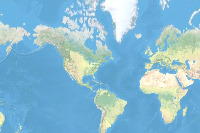

In [4]:
training_data = gis.content.get('5401e553625c46eaa32e7b962cc8b858')
training_data

In [5]:
filepath = training_data.download(file_name=training_data.name)

In [6]:
import zipfile
with zipfile.ZipFile(filepath, 'r') as zip_ref:
    zip_ref.extractall(Path(filepath).parent)

In [7]:
data_path = Path(os.path.join(os.path.splitext(filepath)[0]))

In [8]:
data = prepare_data(path=data_path,
                    chip_size=448, 
                    batch_size=64)

#### Visualize a few samples from your Training data
To make sense of training data we will use the `show_batch()` method in `arcgis.learn`. `show_batch()` randomly picks few samples from the training data and visualizes them.

`rows`: No of rows we want to see the results for.

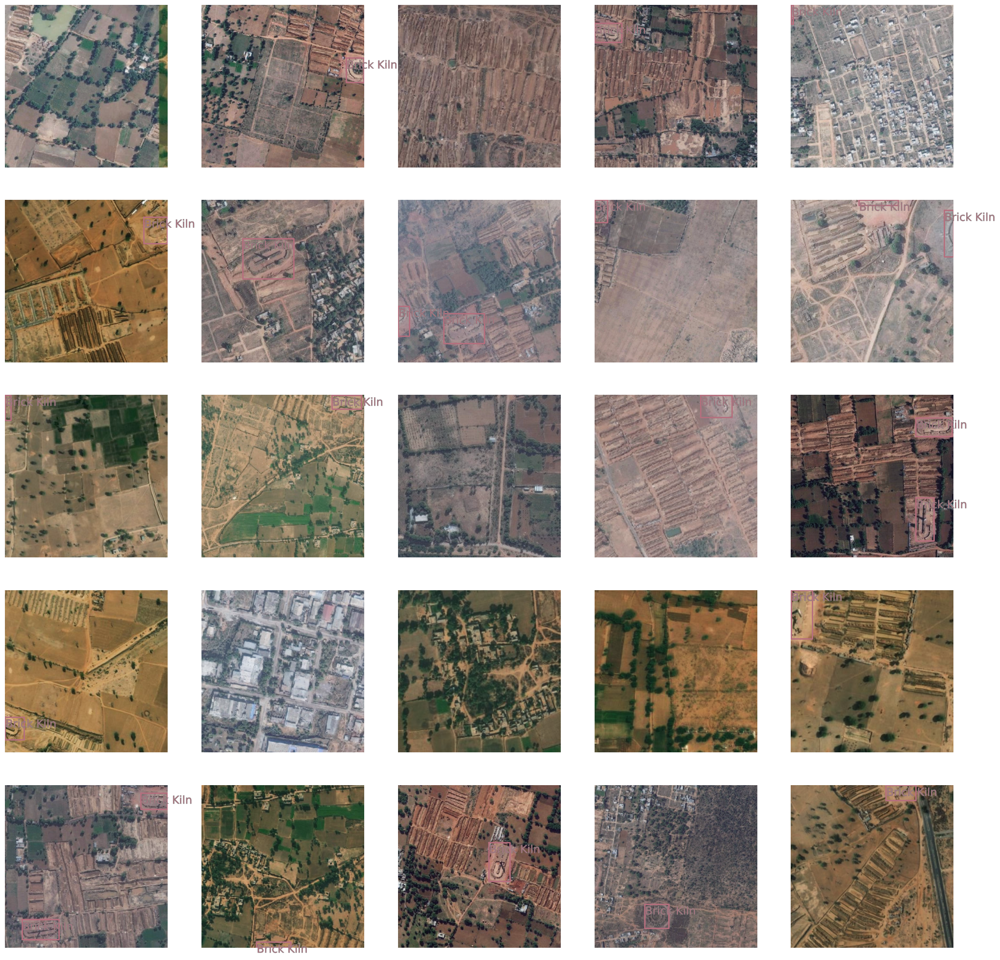

In [9]:
data.show_batch(rows=5)

<center>Some random samples from our training data have been visualized above.</center>

The imagery chips above have the bounding boxes of brick kilns marked out. Boxes with 0 as label are oval shaped (FCBTK) brick kilns and the ones with 1 as label are Zigzag ones.

### Load a SingleShotDetector model

The Code below instantiates a `SingleShotDetector` model,  it is based on a popular object detection model that’s better known by it’s abbreviated form — 'SSD'. The output from the model returns the type and bounding boxes of detected features. 
This type of model is used in an '**object detection**' or in GIS terminology '**feature extraction**' task, by default this model will be loaded on a pretrained 'resnet' backbone. 

In [10]:
model = SingleShotDetector(data)

### Find an Optimal Learning Rate
A newly initialized deep learning model is like the brain of a child that’s just born. It doesn’t know anything to start with, and learns by looking at several examples of objects that it needs to learn to recognize. If it learns at a very slow rate, it will take ages before it learn anything. On the other hand, if the child is quick to jump to conclusions (or, has a ‘high learning rate’ in deep learning terminology), it will often learn wrong things and that’s no good either.

Similarly, deep learning models need to be initialized with a learning rate. This is an important hyperparameter whose value should be set before the learning process begins [3]. Learning rate is a key parameter that determines how we adjust weights for our network with respect to loss gradient [4].

arcgis.learn leverages fast.ai’s learning rate finder to find an optimum learning rate for training models. We can use the lr_find() method to find the optimum learning rate at which can train a roboust model fast enough.


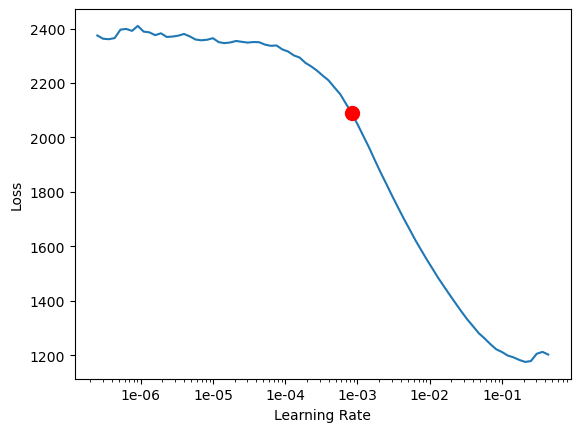

0.0008317637711026709

In [11]:
lr = model.lr_find()
lr

Based on the learning rate plot above, we can see that the learning rate suggested by lr_find() for our training data is 1e-03. We can use it to train our model. In the latest release of arcgis.learn we can train models without even specifying a learning rate. That internally uses the learning rate finder to find an optimal learning rate and uses it.

### Fit the model

To train the model, we use the fit() method. To start, we will use 50 epochs to train our model. Epoch defines how many times model is exposed to entire training set.


In [12]:
model.fit(epochs=100, lr=lr)

epoch,train_loss,valid_loss,average_precision,time
0,2308.630859,1498.292114,0.041985,00:17
1,2229.239990,1655.011719,0.046950,00:16
2,2165.485107,1590.608765,0.047827,00:15
3,2107.686768,1384.959839,0.041648,00:15
4,2018.476562,1139.517456,0.037273,00:15
5,1920.902710,950.079773,0.028107,00:15
6,1810.895874,792.186279,0.028057,00:14
7,1684.149292,641.606995,0.025326,00:14
8,1550.256226,501.388702,0.026403,00:14
9,1404.512939,410.128448,0.040522,00:14


Training data is split into training set and validation set at the [Prepare Data step](#Prepare-Data). By default training vs validation set proportion is 80% & 20%. Output of `fit()` method gives us the loss on training and validation sets. This helps us to assess the generalization capability of the model on unseen data and prevent overfitting. Here, with only 50 epochs, we are see reasonable results — both training and validation losses have gone down considerably indicating that the model is learning to recognize the brick kilns.

Next step is to save the model for further training or inference later. By default, model will be saved into data path specified in the beginning of this notebook.

### Save the model

We will save the model which we trained as a '**Deep Learning Package**' ('.dlpk' format). Deep Learning package is the standard format used to deploy deep learning models on the ArcGIS platform.

We will use the `save()` method to save the trained model. By default it will be saved to the '**models**' sub-folder within our training data folder.

In [13]:
model.save('ssd_brick-kiln_01')

Computing model metrics...


WindowsPath('C:/Users/shi10484/AppData/Local/Temp/detecting_and_categorizing_brick_kilns_from_satellite_imagery/models/ssd_brick-kiln_01')

### Load an Intermediate model to train it further

To retrain a saved model, we can load it again using the code below and train it further as explained above.

In [14]:
# model.load('ssd_brick-kiln_01')

### Visualize results in validation set

Its a good practice to see results of the model viz-a-viz ground truth. The code below picks a random samples and shows us ground truth and model predictions, side by side. This enables us to preview the results of the model within the notebook.

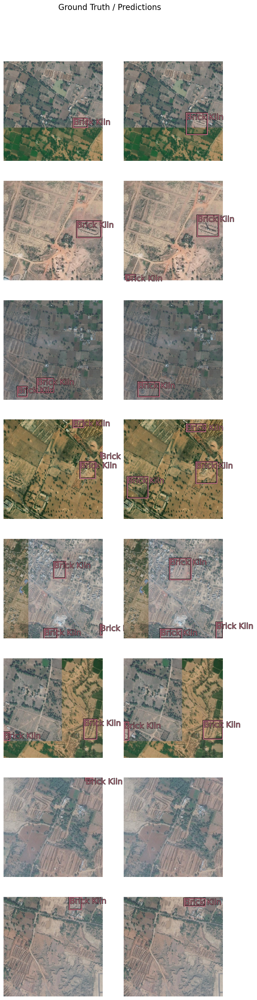

In [15]:
model.show_results(rows=8, thresh=0.2)

Here a subset of ground truth from training data is visualized along with the predictions from the model. As we can see, our model is performing well and the predictions are comparable to the ground truth.


## Deploy Model and Detect Brick Kilns

We will use saved model to detect objects using '**Detect Objects Using Deep Learning**' tool available in both [**ArcGIS Pro**](https://pro.arcgis.com/en/pro-app/tool-reference/image-analyst/detect-objects-using-deep-learning.htm) and [**ArcGIS Enterprise**](https://developers.arcgis.com/rest/services-reference/detect-objects-using-deep-learning.htm). For this sample we will use high resolution satellite imagery to detect brick kilns.

- **Input Raster**: Imagery
- **Output Detect Objects**: brick_kilns_prediction_2014
- **Model Definition**: model.emd
- **padding**: The 'Input Raster' is tiled and the deep learning model runs on each individual tile separately before producing the final 'detected objects feature class'. This may lead to unwanted artifacts along the edges of each tile as the model has little context to detect objects accurately. Padding as the name suggests allows us to supply some extra information along the tile edges, this helps the model to predict better. 
- **threshold**:0.1
- **nms_overlap**: 0.1
- **Cell Size**: Should be close to at which we trained the model, we specified that at the [Export Training Data step]("#Export-Training-Data") .


Tool Reference [here](#"https://pro.arcgis.com/en/pro-app/tool-reference/raster-analysis/detect-objects-using-deep-learning.htm")


<div>
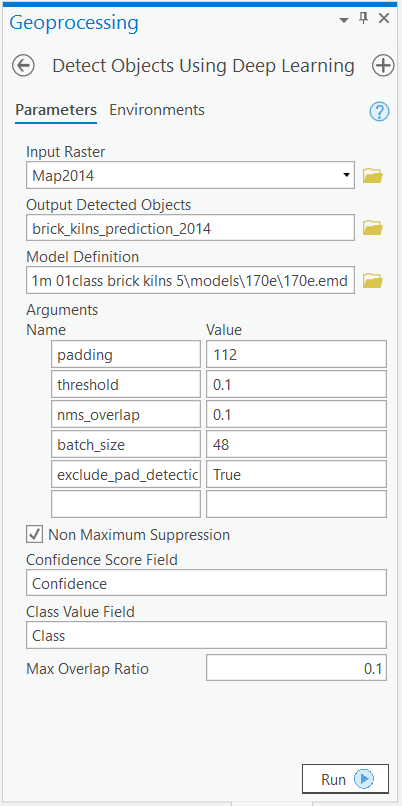
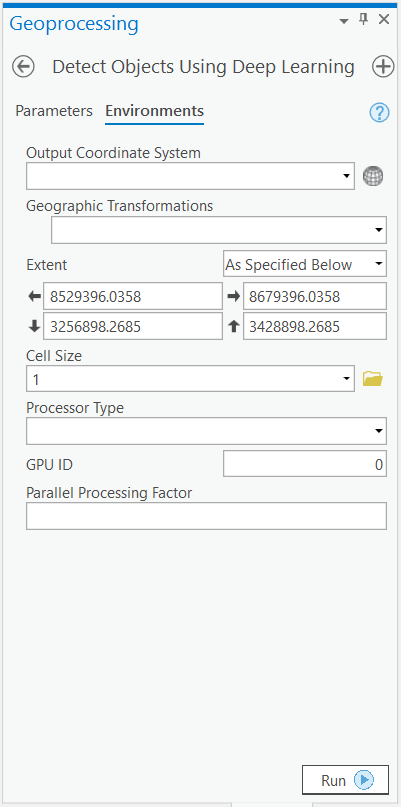
</div>

```python
arcpy.ia.DetectObjectsUsingDeepLearning("Imagery", r"C:\sample\sample.gdb\brick_kilns_prediction_2014", r"C:\sample\data\training data 448px 1m\models\best_model\best_model.emd", "padding 112;threshold 0.1;nms_overlap 0.1;batch_size 48;exclude_pad_detections True", "NO_NMS", "Confidence", "Class", 0)
```


`Detect Objects Using Deep Learning` returns a feature class that can be further refined using the [Definition query](https://pro.arcgis.com/en/pro-app/help/mapping/layer-properties/definition-query.htm) and [Non Maximum Suppression tool](https://pro.arcgis.com/en/pro-app/tool-reference/image-analyst/non-maximum-suppression.htm) tool. We have publish the output from this sample here as a [hosted feature layer](https://geosaurus.maps.arcgis.com/home/webmap/viewer.html?webmap=711b1725f6334aeca2151734b37d3c50).

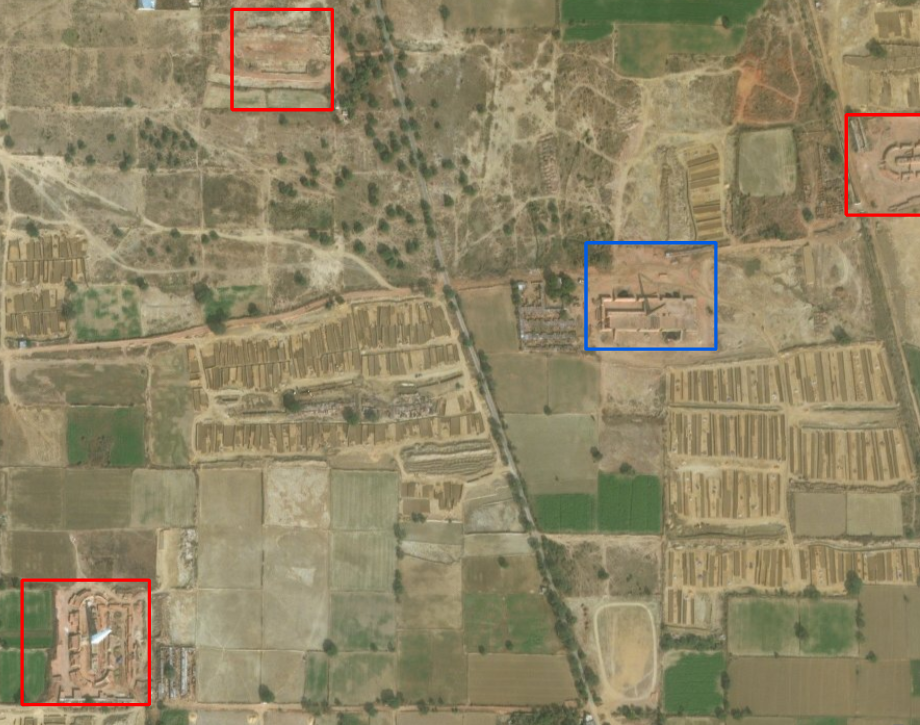

<center>A subset of detected Brick Kilns.</center>

### Conclusion

The model which we trained in this sample was able to detect the brick kilns fairly well but there were also some false predictions and missing brick kilns. Further training the model with a bigger and better dataset and with a variety of imageries can help improve the results.

This type of workflows can be used by enforcement agencies to continuously track and monitor the implementation of law and order on ground. This will help the enforcement agencies to detect gaps in enforcement and better plan their actions.

Data science can help us derive insight from data, but communicating those insights to stakeholders and policymakers is perhaps as important if not more. Putting the results in the form of a dashboard can answer key questions, increase transparency and accountability and drive results on the ground. We used ArcGIS Operations Dashboard to create the following dashboard to communicate the results of our analysis:



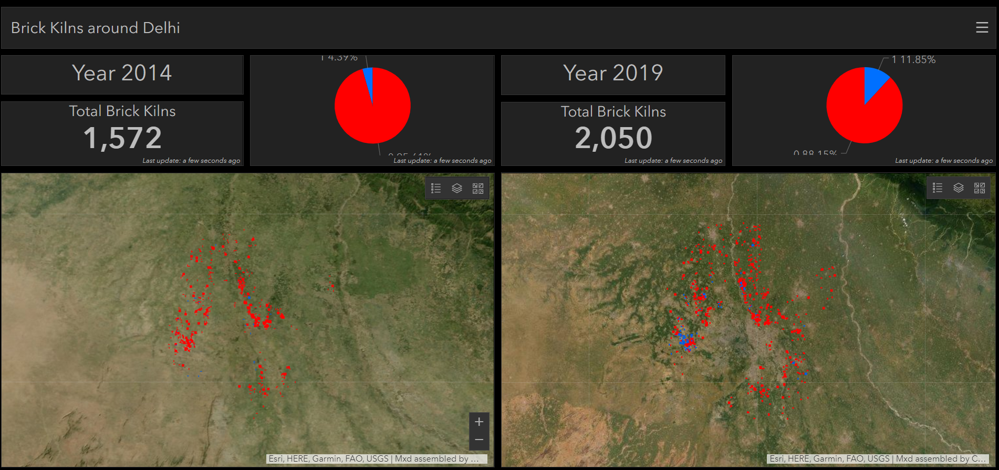

<center><a href="https://geosaurus.maps.arcgis.com/apps/opsdashboard/index.html#/b934421b79fc4be08c345609860a5a6e">Online Dashboard</a> showing growth in number of brick kilns and very poor (less than 14%) compliance with order mandating conversion to Zigzag design.</center>

As is evident from the dashboard, the number of brick kilns has grown over the years and we still have a long way to go in converting them to the new design. Less than 14% have converted to the less polluting Zigzag design. Information products like these, backed by real data, can increase transparency, assign responsibility and drive results on the ground.

## References




[1] Sheikh, Afeefa. (2014). Brick kilns: Cause of Atmospheric Pollution. 

[2] https://www.cseindia.org/content/downloadreports/9387

[3] https://en.wikipedia.org/wiki/Hyperparameter_(machine_learning))

[4] https://towardsdatascience.com/understanding-learning-rates-and-how-it-improves-performance-in-deep-learning-d0d4059c1c10